# Cross-Modal Counterfactual Explanation: Photovoltaic Experiments

This notebook contains the photovoltaic (PV) experiments reported in
"Cross-Modal Counterfactual Explanation for Reference-Conditioned Modality
Necessity and Sufficiency in Multi-Modal Fusion Systems."

The notebook includes:

- leakage-controlled PV dataset construction,
- RGB-only, thermal-only, early-fusion, and late-fusion models,
- five-seed predictive evaluation,
- full-test CCME necessity and sufficiency analysis,
- endpoint-approximation validation,
- and complementary seed-42 explanation analyses.

## Reproducibility note

This notebook preserves the executed analyses and outputs used in the
manuscript. Computationally intensive stages such as model training,
five-seed CCME evaluation, and post-hoc explanation analyses are retained
for transparency and are not required to be re-executed simply to inspect
the reported results.

Users wishing to reproduce the experiments should first configure the local
dataset and output paths and install the dependencies listed in the
repository.

Population-level analyses use independently trained checkpoints for seeds
42-46. Detailed complementary analyses use the designated seed-42
Late-Fusion checkpoint unless otherwise stated.

## Section 0: Imports and Global Configuration

In [ ]:
# Standard Library
import os, sys, warnings, json, time
from pathlib import Path
from copy import deepcopy
from typing import Dict, List, Tuple, Optional

# Core Scientific Stack
import numpy as np
import pandas as pd
import scipy.ndimage as ndi
import tifffile as tif
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.calibration import calibration_curve
from sklearn.metrics import brier_score_loss
from scipy.stats import pearsonr, spearmanr
from skimage.metrics import structural_similarity as ssim

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from tqdm.notebook import tqdm

# XAI Libraries
try:
    import shap

    SHAP_AVAILABLE = True
except ImportError:
    SHAP_AVAILABLE = False
    print("[WARN] pip install shap")

try:
    from lime import lime_image
    from skimage.segmentation import mark_boundaries

    LIME_AVAILABLE = True
except ImportError:
    LIME_AVAILABLE = False
    print("[WARN] pip install lime")

# Visualization
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

%matplotlib inline
plt.rcParams.update(
    {
        "figure.dpi": 150,
        "font.family": "DejaVu Sans",
        "axes.spines.top": False,
        "axes.spines.right": False,
    }
)

# Reproducibility
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print(f"PyTorch {torch.__version__}")
print(f"SHAP: {SHAP_AVAILABLE} | LIME: {LIME_AVAILABLE}")

[WARN] pip install shap
PyTorch 2.10.0
SHAP: False | LIME: True


In [2]:
import sys
import platform
import torch

print("Python executable:", sys.executable)
print("Python version:", platform.python_version())
print("PyTorch version:", torch.__version__)
print("MPS available:", torch.backends.mps.is_available())
print("CUDA available:", torch.cuda.is_available())

Python executable: /opt/anaconda3/envs/research_env/bin/python
Python version: 3.12.12
PyTorch version: 2.10.0
MPS available: True
CUDA available: False


In [3]:
import torch
print(torch.backends.mps.is_available())

True


In [ ]:
# Global Config

PROJECT_ROOT = Path.cwd()

DATA_ROOT = PROJECT_ROOT / "data"
OUTPUT_ROOT = PROJECT_ROOT / "outputs"
CHECKPOINT_ROOT = PROJECT_ROOT / "checkpoints"

# Dataset paths
SR_META = DATA_ROOT / "single-row" / "metadata.csv"
DR_META = DATA_ROOT / "double-row" / "metadata.csv"
DR_THERM_DIR = DATA_ROOT / "double-row" / "thermal images"
DR_RGB_DIR = DATA_ROOT / "double-row" / "rgb images"

# Experiment-specific outputs
OUT_ROOT = OUTPUT_ROOT / "pv_module_crops_v2"
FIG_DIR = OUTPUT_ROOT / "figures"
CKPT_DIR = CHECKPOINT_ROOT / "pv_module"

for d in [OUT_ROOT, FIG_DIR, CKPT_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# Dataset-specific fixed crop windows
IR_CROP = dict(left=0, top=75, right=640, bottom=490)
RGB_CROP = dict(left=120, top=0, right=1150, bottom=720)

# Training hyperparameters
DEVICE = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

BATCH_SIZE = 32
EPOCHS = 15
LR = 3e-4
IMG_SIZE = 224

# Global quantile over the entire dataset, not per image
TOP_FRAC = 0.12

# Set to len(dr_metadata) for the full dataset run
MAX_IMAGES = 2541

print(f"Device: {DEVICE} | Data root: {DATA_ROOT.exists()}")

Device: mps | Data root: True


## Section 1: Data Loading and Preprocessing

In [4]:
# Metadata Loading
def load_metadata(path: Path, is_double_row: bool) -> pd.DataFrame:
    df = pd.read_csv(path).copy()
    rename_map = {"thermal image name": "thermal_image_name"}
    if is_double_row:
        rename_map["rgb image name"] = "rgb_image_name"
    df = df.rename(columns=rename_map)
    if "timestamp" in df.columns:
        df["timestamp"] = pd.to_datetime(df["timestamp"], errors="coerce")
    return df


sr_metadata = load_metadata(SR_META, is_double_row=False)
dr_metadata = load_metadata(DR_META, is_double_row=True)
dr_metadata["rgb_path"] = dr_metadata["rgb_image_name"].apply(lambda x: DR_RGB_DIR / x)
dr_metadata["thermal_path"] = dr_metadata["thermal_image_name"].apply(
    lambda x: DR_THERM_DIR / x
)

print(f"Single-row: {len(sr_metadata)} | Double-row: {len(dr_metadata)}")
dr_metadata.head(3)

Single-row: 5295 | Double-row: 2541


,timestamp,longitude,latitude,thermal_image_name,rgb_image_name,rgb_path,thermal_path
0,2021-10-11 10:29:44.540,10.180867,49.612644,frame_000000.tiff,frame_000000.jpg,/Users/mdtohidulislam/Documents/Research/new_d...,/Users/mdtohidulislam/Documents/Research/new_d...
1,2021-10-11 10:29:44.550,10.180867,49.612644,frame_000001.tiff,frame_000001.jpg,/Users/mdtohidulislam/Documents/Research/new_d...,/Users/mdtohidulislam/Documents/Research/new_d...
2,2021-10-11 10:29:44.680,10.180867,49.612644,frame_000002.tiff,frame_000002.jpg,/Users/mdtohidulislam/Documents/Research/new_d...,/Users/mdtohidulislam/Documents/Research/new_d...


In [5]:
# Image I/O Utilities
class Thermogram:
    """16-bit TIFF → Celsius via T = raw * 0.04 - 273.15 (manufacturer spec)."""

    def __init__(self, path: Path):
        self.path = path

    @property
    def celsius(self) -> np.ndarray:
        return (tif.imread(str(self.path)) * 0.04) - 273.15

    def render8(self) -> np.ndarray:
        img = self.celsius.astype(np.float32)
        img = (img - img.min()) / (img.max() - img.min() + 1e-6)
        return (img * 255.0).astype(np.uint8)


def load_rgb(path: Path) -> np.ndarray:
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"RGB not found: {path}")
    return img  # BGR


def crop_image(arr: np.ndarray, box: dict) -> np.ndarray:
    return arr[box["top"] : box["bottom"], box["left"] : box["right"]]


def make_aligned_pair(rgb_bgr, thermal8):
    th_crop = crop_image(thermal8, IR_CROP)
    rgb_crop = crop_image(rgb_bgr, RGB_CROP)
    rgb_crop = cv2.resize(
        rgb_crop, (th_crop.shape[1], th_crop.shape[0]), interpolation=cv2.INTER_LINEAR
    )
    return rgb_crop, th_crop


print("Image I/O utilities loaded.")

Image I/O utilities loaded.


In [ ]:
# Module Segmentation and Pseudo-Labelling (verified, imported - not retyped)
# Verified preprocessing utilities used in the finalized manuscript pipeline.
# These functions are provided in src/preprocessing_verified.py.

from preprocessing_verified import (
    build_module_dataset,
    PREPROCESSING_VERSION,
    EXCLUDED_FRAME_RANGES,
)
print(f"Loaded preprocessing_verified.py (version: {PREPROCESSING_VERSION})")
print(f"Excluded frame ranges: {EXCLUDED_FRAME_RANGES}")

Loaded preprocessing_verified.py (version: v5_train_derived_threshold)
Excluded frame ranges: ((0, 32), (2518, 2540))


In [ ]:
# Dataset Builder (rebuild from raw data using the corrected, verified pipeline)
FORCE_REBUILD = False  # set True to force a full rebuild regardless of cache

# The released notebook defaults to cached/precomputed preprocessing.
# Set FORCE_REBUILD=True only when intentionally reconstructing the dataset
# from the original source imagery.

IDX_PATH = OUT_ROOT / "index_unlabeled.csv"
needs_rebuild = FORCE_REBUILD or not IDX_PATH.exists()

if not needs_rebuild:
    _cached = pd.read_csv(IDX_PATH)
    if "preprocessing_version" not in _cached.columns or \
       (_cached["preprocessing_version"] != PREPROCESSING_VERSION).any():
        print("Cached index is stale (different preprocessing_version) -- forcing rebuild.")
        needs_rebuild = True
    else:
        index_df = _cached
        print(f"Loaded cached unlabeled index (version {PREPROCESSING_VERSION} confirmed).")

if needs_rebuild:
    index_df = build_module_dataset(
        dr_metadata, OUT_ROOT,
        load_rgb_fn=load_rgb, thermogram_cls=Thermogram,
        make_aligned_pair_fn=make_aligned_pair, crop_image_fn=crop_image,
        ir_crop=IR_CROP, max_images=MAX_IMAGES,
        force_rebuild=needs_rebuild, tqdm_fn=tqdm,
    )

print(f"\nTotal (unlabeled) crops: {len(index_df)}")
print("NOTE: no 'label' column yet : labels are assigned after the leakage-safe")
print("split, using a training-only frozen threshold. Run dedup_split_check.py next.")

Loaded cached unlabeled index (version v5_train_derived_threshold confirmed).

Total (unlabeled) crops: 76853
NOTE: no 'label' column yet : labels are assigned after the leakage-safe
split, using a training-only frozen threshold. Run dedup_split_check.py next.


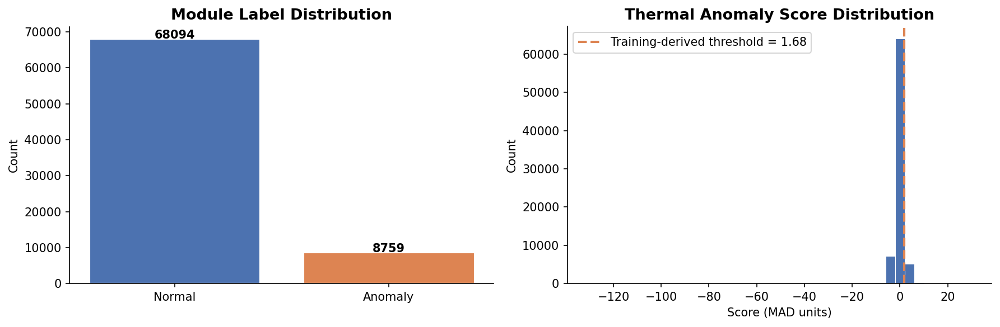

In [14]:
# Label Distribution Plot (uses labels from the frozen, training-derived threshold)
import json

labeled_df = pd.read_csv(OUT_ROOT / "index_labeled.csv")
with open(OUT_ROOT / "label_threshold.json") as f:
    thr_info = json.load(f)
thr = thr_info["threshold"]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
counts = labeled_df["label"].value_counts().sort_index()
axes[0].bar(["Normal", "Anomaly"], counts.values, color=["#4C72B0", "#DD8452"], edgecolor="white", linewidth=1.5)
axes[0].set_title("Module Label Distribution", fontsize=13, fontweight="bold")
axes[0].set_ylabel("Count")
for i, v in enumerate(counts.values):
    axes[0].text(i, v + 1, str(v), ha="center", fontweight="bold")

axes[1].hist(labeled_df["score"], bins=40, color="#4C72B0", edgecolor="white", linewidth=0.5)
axes[1].axvline(thr, color="#DD8452", linestyle="--", linewidth=2,
                 label=f"Training-derived threshold = {thr:.2f}")
axes[1].set_title("Thermal Anomaly Score Distribution", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Score (MAD units)")
axes[1].set_ylabel("Count")
axes[1].legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "01_label_distribution.pdf", bbox_inches="tight")
plt.show()

## Section 2: Dataset Class and Image-Level Dataloaders

In [ ]:
# Paired Dataset with Synchronized Augmentation
from dataset_utils import PairedModuleDataset

# Dataset implementation is provided in src/dataset_utils.py.

### Leakage-controlled split and frozen labels

The train/validation/test partition is constructed at the acquisition-group
level to avoid leakage between related crops. The thermal anomaly threshold
is derived from the training partition and then frozen before application to
validation and test samples.

In [16]:
# Leakage-Safe Split with Training-Derived Frozen Labels (precomputed)
def build_dataloaders_from_labeled_split(
    split_csv_path, img_size=IMG_SIZE, batch_size=BATCH_SIZE
):
    """
    Loads the precomputed leakage-safe split with frozen, training-derived
    labels (built by dedup_split_check.py): volume-only group assignment,
    56 known-contaminated frames excluded, threshold derived from training
    scores only and frozen for val/test.
    """
    df = pd.read_csv(split_csv_path)

    splits = {
        "train": df[df["split"] == "train"].copy(),
        "val": df[df["split"] == "val"].copy(),
        "test": df[df["split"] == "test"].copy(),
    }
    dsets = {k: PairedModuleDataset(v, img_size, k) for k, v in splits.items()}

    lbl = splits["train"]["label"].values
    sw = (1.0 / np.bincount(lbl))[lbl]
    g = torch.Generator().manual_seed(SEED)
    samp = WeightedRandomSampler(sw, len(sw), generator=g)

    loaders = {
        "train": DataLoader(dsets["train"], batch_size=batch_size, sampler=samp, num_workers=2),
        "val": DataLoader(dsets["val"], batch_size=batch_size, shuffle=False, num_workers=2),
        "test": DataLoader(dsets["test"], batch_size=batch_size, shuffle=False, num_workers=2),
    }
    print("Leakage-safe split, training-derived frozen labels (precomputed):")
    for k, ds in dsets.items():
        vc = ds.df["label"].value_counts().to_dict()
        rate = vc.get(1, 0) / len(ds) * 100
        print(f"  {k:5s} | {len(ds):5d} crops | anomaly: {rate:.1f}%")
    return loaders, dsets


loaders, datasets = build_dataloaders_from_labeled_split(
    OUT_ROOT / "index_labeled.csv"
)
print("\nDataloaders ready.")

Leakage-safe split, training-derived frozen labels (precomputed):
  train | 49100 crops | anomaly: 12.0%
  val   |  9083 crops | anomaly: 10.7%
  test  | 18670 crops | anomaly: 10.1%

Dataloaders ready.


## Section 3: Model Architectures

In [ ]:
# Shared Backbone Factory
def make_backbone(pretrained=True):
    """ResNet-18 with Identity classifier head. Returns (backbone, feat_dim=512)."""
    b = models.resnet18(weights="IMAGENET1K_V1" if pretrained else None)
    d = b.fc.in_features  # 512 for ResNet-18
    b.fc = nn.Identity()
    return b, d


class RGBOnlyModel(nn.Module):
    def __init__(self, num_classes=2, pretrained=True):
        super().__init__()
        self.backbone, d = make_backbone(pretrained)
        self.classifier = nn.Sequential(
            nn.Dropout(0.3), nn.Linear(d, 128), nn.ReLU(), nn.Linear(128, num_classes)
        )
        self.model_name = "RGB-Only"

    def forward(self, rgb, th=None):
        return self.classifier(self.backbone(rgb))

    def get_cam_target_layer(self, modality=None):
        return self.backbone.layer4[-1]


class ThermalOnlyModel(nn.Module):
    """ResNet-18 adapted 3→1 channel by averaging pretrained weights."""

    def __init__(self, num_classes=2, pretrained=True):
        super().__init__()
        b, d = make_backbone(pretrained)
        oc = b.conv1
        nc = nn.Conv2d(
            1, oc.out_channels, oc.kernel_size, oc.stride, oc.padding, bias=False
        )
        nc.weight.data = oc.weight.data.mean(dim=1, keepdim=True)
        b.conv1 = nc
        self.backbone = b
        self.classifier = nn.Sequential(
            nn.Dropout(0.3), nn.Linear(d, 128), nn.ReLU(), nn.Linear(128, num_classes)
        )
        self.model_name = "Thermal-Only"

    def forward(self, rgb=None, th=None):
        return self.classifier(self.backbone(th))

    def get_cam_target_layer(self, modality=None):
        return self.backbone.layer4[-1]


class EarlyFusionModel(nn.Module):
    """4-channel input: [RGB(3) | Thermal(1)]. Thermal is single-channel grayscale."""

    def __init__(self, num_classes=2, pretrained=True):
        super().__init__()
        b, d = make_backbone(pretrained)
        oc = b.conv1
        nc = nn.Conv2d(
            4, oc.out_channels, oc.kernel_size, oc.stride, oc.padding, bias=False
        )
        with torch.no_grad():
            nc.weight[:, :3] = oc.weight
            nc.weight[:, 3:] = oc.weight.mean(dim=1, keepdim=True)
        b.conv1 = nc
        self.backbone = b
        self.classifier = nn.Sequential(
            nn.Dropout(0.3), nn.Linear(d, 128), nn.ReLU(), nn.Linear(128, num_classes)
        )
        self.model_name = "Early-Fusion"

    def forward(self, rgb, th):
        return self.classifier(self.backbone(torch.cat([rgb, th], dim=1)))

    def get_cam_target_layer(self, modality=None):
        return self.backbone.layer4[-1]


class LateFusionModel(nn.Module):
    """Two ResNet-18 backbones. Concat embedding ℝ^1024. LayerNorm before classifier."""

    def __init__(self, num_classes=2, pretrained=True):
        super().__init__()
        rb, d = make_backbone(pretrained)
        tb, _ = make_backbone(pretrained)
        oc = tb.conv1
        nc = nn.Conv2d(
            1, oc.out_channels, oc.kernel_size, oc.stride, oc.padding, bias=False
        )
        nc.weight.data = oc.weight.data.mean(dim=1, keepdim=True)
        tb.conv1 = nc
        self.rgb_backbone = rb
        self.th_backbone = tb
        self.fusion = nn.Sequential(nn.LayerNorm(d * 2), nn.Dropout(0.3))
        self.classifier = nn.Sequential(
            nn.Linear(d * 2, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes),
        )
        self.model_name = "Late-Fusion"

    def forward(self, rgb, th):
        return self.classifier(
            self.fusion(
                torch.cat([self.rgb_backbone(rgb), self.th_backbone(th)], dim=1)
            )
        )

    def get_cam_target_layer(self, modality="rgb"):
        return (
            self.rgb_backbone.layer4[-1]
            if modality == "rgb"
            else self.th_backbone.layer4[-1]
        )


models_dict = {
    k: m().to(DEVICE)
    for k, m in [
        ("RGB-Only", RGBOnlyModel),
        ("Thermal-Only", ThermalOnlyModel),
        ("Early-Fusion", EarlyFusionModel),
        ("Late-Fusion", LateFusionModel),
    ]
}
for nm, m in models_dict.items():
    n = sum(p.numel() for p in m.parameters() if p.requires_grad)
    print(f"  {nm:15s}: {n / 1e6:.2f}M params")

  RGB-Only       : 11.24M params
  Thermal-Only   : 11.24M params
  Early-Fusion   : 11.25M params
  Late-Fusion    : 22.61M params


In [ ]:
# PRESERVE ORIGINAL SEED-42 CHECKPOINTS

from pathlib import Path
import shutil
import json
from datetime import datetime


PROJECT_ROOT = Path(
    "/Users/mdtohidulislam/Documents/Research"
)

CKPT_DIR = PROJECT_ROOT / "checkpoints"

MULTISEED_ROOT = (
    CKPT_DIR
    / "pv_multiseed_42_46"
)

SEED42_DIR = (
    MULTISEED_ROOT
    / "seed_42"
)

SEED42_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


checkpoint_map = {
    "rgb_only.pt":
        "rgb_only.pt",

    "thermal_only.pt":
        "thermal_only.pt",

    "early_fusion.pt":
        "early_fusion.pt",

    "late_fusion.pt":
        "late_fusion.pt",
}


for source_name, destination_name in checkpoint_map.items():
    source_path = (
        CKPT_DIR
        / source_name
    )

    destination_path = (
        SEED42_DIR
        / destination_name
    )

    if not source_path.exists():
        raise FileNotFoundError(
            f"Missing seed-42 checkpoint: {source_path}"
        )

    shutil.copy2(
        source_path,
        destination_path,
    )

    print(
        f"Copied:\n"
        f"  {source_path}\n"
        f"  -> {destination_path}"
    )


metadata = {
    "domain": "PV",
    "seed": 42,
    "status": "preserved_original_checkpoint",
    "source_directory": str(
        CKPT_DIR.resolve()
    ),
    "destination_directory": str(
        SEED42_DIR.resolve()
    ),
    "device_original_session": str(
        DEVICE
    ),
    "batch_size": int(
        BATCH_SIZE
    ),
    "epochs": int(
        EPOCHS
    ),
    "learning_rate": float(
        LR
    ),
    "preserved_at": datetime.now().isoformat(),
}

metadata_path = (
    SEED42_DIR
    / "checkpoint_metadata.json"
)

with open(
    metadata_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        metadata,
        file,
        indent=2,
    )


print("\nSeed-42 preservation complete.")
print("Directory:", SEED42_DIR.resolve())

Copied:
  /Users/mdtohidulislam/Documents/Research/checkpoints/rgb_only.pt
  -> /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_42/rgb_only.pt
Copied:
  /Users/mdtohidulislam/Documents/Research/checkpoints/thermal_only.pt
  -> /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_42/thermal_only.pt
Copied:
  /Users/mdtohidulislam/Documents/Research/checkpoints/early_fusion.pt
  -> /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_42/early_fusion.pt
Copied:
  /Users/mdtohidulislam/Documents/Research/checkpoints/late_fusion.pt
  -> /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_42/late_fusion.pt

Seed-42 preservation complete.
Directory: /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_42


In [21]:
for path in sorted(SEED42_DIR.glob("*.pt")):
    print(
        path.name,
        f"{path.stat().st_size / 1024**2:.2f} MB",
    )

early_fusion.pt 42.98 MB
late_fusion.pt 86.41 MB
rgb_only.pt 42.96 MB
thermal_only.pt 42.94 MB


In [22]:
train_loader = loaders["train"]
train_sampler = train_loader.sampler

print("Sampler type:", type(train_sampler))
print("num_samples:", train_sampler.num_samples)
print("replacement:", train_sampler.replacement)
print("weights shape:", train_sampler.weights.shape)
print("Loader num_workers:", train_loader.num_workers)
print("Loader pin_memory:", train_loader.pin_memory)
print("Loader drop_last:", train_loader.drop_last)
print("Dataset type:", type(train_loader.dataset))

Sampler type: <class 'torch.utils.data.sampler.WeightedRandomSampler'>
num_samples: 49100
replacement: True
weights shape: torch.Size([49100])
Loader num_workers: 2
Loader pin_memory: False
Loader drop_last: False
Dataset type: <class 'dataset_utils.PairedModuleDataset'>


In [27]:
import random
import numpy as np
import torch


def set_all_seeds(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

    try:
        torch.use_deterministic_algorithms(
            True,
            warn_only=True,
        )
    except Exception:
        pass

In [ ]:
# SEED-SPECIFIC WEIGHTED TRAINING LOADER

import random
import numpy as np
import torch

from torch.utils.data import DataLoader, WeightedRandomSampler


# Preserve the exact weights used by the original loader.
ORIGINAL_TRAIN_WEIGHTS = (
    loaders["train"]
    .sampler
    .weights
    .detach()
    .cpu()
    .clone()
    .double()
)

ORIGINAL_TRAIN_DATASET = loaders["train"].dataset


def seed_worker(worker_id):
    """
    Seed NumPy and Python random state inside each DataLoader worker.
    PyTorch supplies each worker with a seed derived from the loader generator.
    """
    worker_seed = torch.initial_seed() % (2**32)

    np.random.seed(worker_seed)
    random.seed(worker_seed)


def build_seed_specific_loaders(seed):
    """
    Rebuild the randomized training loader with an explicitly
    seeded WeightedRandomSampler.

    num_workers=0 avoids multiprocessing/pickling errors in
    macOS Jupyter notebooks.
    """
    set_all_seeds(seed)

    sampler_generator = torch.Generator()
    sampler_generator.manual_seed(seed)

    seeded_sampler = WeightedRandomSampler(
        weights=ORIGINAL_TRAIN_WEIGHTS,
        num_samples=len(ORIGINAL_TRAIN_WEIGHTS),
        replacement=True,
        generator=sampler_generator,
    )

    seeded_train_loader = DataLoader(
        ORIGINAL_TRAIN_DATASET,
        batch_size=BATCH_SIZE,
        sampler=seeded_sampler,
        num_workers=0,
        pin_memory=False,
        drop_last=loaders["train"].drop_last,
    )

    return {
        "train": seeded_train_loader,
        "val": loaders["val"],
        "test": loaders["test"],
    }

In [35]:
seed43_dir = (
    MULTISEED_ROOT
    / "seed_43"
)

resume_path = (
    seed43_dir
    / "rgb_only_resume.pt"
)

print("Partial resume exists:", resume_path.exists())

Partial resume exists: False


In [28]:
def first_sampled_indices(seed, n=20):
    seeded_loaders = build_seed_specific_loaders(seed)
    sampler = seeded_loaders["train"].sampler
    return list(iter(sampler))[:n]


indices_43_a = first_sampled_indices(43)
indices_43_b = first_sampled_indices(43)
indices_44 = first_sampled_indices(44)

print("Seed 43, run A:")
print(indices_43_a)

print("\nSeed 43, run B:")
print(indices_43_b)

print("\nSeed 44:")
print(indices_44)

print(
    "\nSame seed identical:",
    indices_43_a == indices_43_b,
)

print(
    "Different seeds differ:",
    indices_43_a != indices_44,
)

Seed 43, run A:
[29971, 17662, 9098, 35816, 47895, 24509, 7503, 14887, 20121, 35113, 41742, 28263, 2555, 23648, 43758, 32137, 20046, 17556, 200, 45155]

Seed 43, run B:
[29971, 17662, 9098, 35816, 47895, 24509, 7503, 14887, 20121, 35113, 41742, 28263, 2555, 23648, 43758, 32137, 20046, 17556, 200, 45155]

Seed 44:
[37523, 29505, 1078, 15066, 42279, 35342, 22040, 38798, 14058, 18357, 7853, 7998, 40611, 17886, 12842, 44073, 47986, 47593, 41374, 44526]

Same seed identical: True
Different seeds differ: True


In [ ]:
# Five-seed training routine

import json
import time
from copy import deepcopy
from pathlib import Path

import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F

from sklearn.metrics import roc_auc_score


MULTISEED_ROOT = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
)

MULTISEED_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)


MODEL_FACTORIES = {
    "RGB-Only": RGBOnlyModel,
    "Thermal-Only": ThermalOnlyModel,
    "Early-Fusion": EarlyFusionModel,
    "Late-Fusion": LateFusionModel,
}


def model_slug(model_name):
    return (
        model_name
        .lower()
        .replace("-", "_")
        .replace(" ", "_")
    )


def state_dict_to_cpu(state_dict):
    return {
        key: value.detach().cpu().clone()
        for key, value in state_dict.items()
    }


def train_model_multiseed(
    model_name,
    seed,
    loaders,
    epochs=EPOCHS,
    lr=LR,
    label_smoothing=0.05,
    patience_limit=5,
):
    if model_name not in MODEL_FACTORIES:
        raise KeyError(
            f"Unknown model: {model_name}"
        )

    set_all_seeds(seed)

    seed_dir = (
        MULTISEED_ROOT
        / f"seed_{seed}"
    )

    seed_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    slug = model_slug(model_name)

    final_path = (
        seed_dir
        / f"{slug}.pt"
    )

    resume_path = (
        seed_dir
        / f"{slug}_resume.pt"
    )

    history_path = (
        seed_dir
        / f"{slug}_history.csv"
    )

    metadata_path = (
        seed_dir
        / f"{slug}_training_metadata.json"
    )

    if final_path.exists():
        print(
            f"[SKIP] Seed {seed} {model_name}: "
            f"{final_path.name} already exists."
        )
        return None

    # Seed before constructing the model so initialization is seed-specific.
    set_all_seeds(seed)

    model = MODEL_FACTORIES[
        model_name
    ](
        pretrained=True
    ).to(DEVICE)

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=1e-4,
    )

    scheduler = (
        torch.optim.lr_scheduler
        .CosineAnnealingLR(
            optimizer,
            T_max=epochs,
        )
    )

    criterion = nn.CrossEntropyLoss(
        label_smoothing=label_smoothing
    )

    history = {
        "epoch": [],
        "train_loss": [],
        "val_loss": [],
        "val_acc": [],
        "val_auc": [],
        "learning_rate": [],
    }

    best_auc = float("-inf")
    best_epoch = None
    best_state = None
    patience = 0
    start_epoch = 0

    if resume_path.exists():
        checkpoint = torch.load(
            resume_path,
            map_location=DEVICE,
            weights_only=False,
        )

        model.load_state_dict(
            checkpoint["model_state"]
        )

        optimizer.load_state_dict(
            checkpoint["optimizer_state"]
        )

        scheduler.load_state_dict(
            checkpoint["scheduler_state"]
        )

        start_epoch = (
            checkpoint["epoch"]
            + 1
        )

        best_auc = checkpoint["best_auc"]
        best_epoch = checkpoint["best_epoch"]
        best_state = checkpoint["best_state"]
        patience = checkpoint["patience"]
        history = checkpoint["history"]

        print(
            f"Resuming seed {seed} {model_name} "
            f"from epoch {start_epoch + 1}"
        )

    started_at = time.time()

    for epoch in range(
        start_epoch,
        epochs,
    ):
        model.train()

        train_loss_sum = 0.0

        for rgb, thermal, labels in loaders["train"]:
            rgb = rgb.to(DEVICE)
            thermal = thermal.to(DEVICE)
            labels = labels.to(DEVICE)

            optimizer.zero_grad(
                set_to_none=True
            )

            logits = model(
                rgb,
                thermal,
            )

            loss = criterion(
                logits,
                labels,
            )

            loss.backward()

            nn.utils.clip_grad_norm_(
                model.parameters(),
                1.0,
            )

            optimizer.step()

            train_loss_sum += loss.item()

        model.eval()

        val_loss_sum = 0.0
        val_correct = 0
        val_total = 0
        val_probs = []
        val_labels = []

        with torch.no_grad():
            for rgb, thermal, labels in loaders["val"]:
                rgb = rgb.to(DEVICE)
                thermal = thermal.to(DEVICE)
                labels = labels.to(DEVICE)

                logits = model(
                    rgb,
                    thermal,
                )

                loss = criterion(
                    logits,
                    labels,
                )

                probs = F.softmax(
                    logits,
                    dim=1,
                )[:, 1]

                val_loss_sum += loss.item()

                val_correct += (
                    logits.argmax(dim=1)
                    == labels
                ).sum().item()

                val_total += labels.size(0)

                val_probs.extend(
                    probs.cpu().numpy()
                )

                val_labels.extend(
                    labels.cpu().numpy()
                )

        train_loss = (
            train_loss_sum
            / len(loaders["train"])
        )

        val_loss = (
            val_loss_sum
            / len(loaders["val"])
        )

        val_acc = (
            val_correct
            / val_total
        )

        val_auc = roc_auc_score(
            val_labels,
            val_probs,
        )

        current_lr = optimizer.param_groups[0]["lr"]

        history["epoch"].append(
            epoch + 1
        )
        history["train_loss"].append(
            train_loss
        )
        history["val_loss"].append(
            val_loss
        )
        history["val_acc"].append(
            val_acc
        )
        history["val_auc"].append(
            val_auc
        )
        history["learning_rate"].append(
            current_lr
        )

        improved = val_auc > best_auc

        if improved:
            best_auc = float(val_auc)
            best_epoch = epoch + 1
            best_state = state_dict_to_cpu(
                model.state_dict()
            )
            patience = 0
        else:
            patience += 1

        scheduler.step()

        print(
            f"[Seed {seed} | {model_name}] "
            f"{epoch + 1:02d}/{epochs} | "
            f"TL={train_loss:.4f} | "
            f"VL={val_loss:.4f} | "
            f"Acc={val_acc:.4f} | "
            f"AUC={val_auc:.4f}"
            + (" ★" if improved else "")
        )

        torch.save(
            {
                "seed": seed,
                "model_name": model_name,
                "epoch": epoch,
                "best_epoch": best_epoch,
                "best_auc": best_auc,
                "patience": patience,
                "history": history,
                "model_state": state_dict_to_cpu(
                    model.state_dict()
                ),
                "optimizer_state":
                    optimizer.state_dict(),
                "scheduler_state":
                    scheduler.state_dict(),
                "best_state": best_state,
            },
            resume_path,
        )

        pd.DataFrame(
            history
        ).to_csv(
            history_path,
            index=False,
        )

        if patience >= patience_limit:
            print(
                f"Early stopping: seed {seed}, "
                f"{model_name}"
            )
            break

    if best_state is None:
        raise RuntimeError(
            "No best model state was recorded."
        )

    torch.save(
        best_state,
        final_path,
    )

    metadata = {
        "domain": "PV",
        "seed": seed,
        "model_name": model_name,
        "best_validation_auc": best_auc,
        "best_epoch": best_epoch,
        "epochs_completed": len(
            history["epoch"]
        ),
        "learning_rate": lr,
        "batch_size": BATCH_SIZE,
        "device": str(DEVICE),
        "elapsed_seconds": (
            time.time()
            - started_at
        ),
    }

    with open(
        metadata_path,
        "w",
        encoding="utf-8",
    ) as file:
        json.dump(
            metadata,
            file,
            indent=2,
        )

    resume_path.unlink(
        missing_ok=True
    )

    print(
        f"\nSaved: {final_path}\n"
        f"Best validation AUC: {best_auc:.6f} "
        f"at epoch {best_epoch}"
    )

    return history

In [ ]:
# Test run for seed 43, RGB-Only model
seed = 43

seed_loaders = build_seed_specific_loaders(
    seed
)

history_43_rgb = train_model_multiseed(
    model_name="RGB-Only",
    seed=seed,
    loaders=seed_loaders,
    epochs=EPOCHS,
    lr=LR,
)

[Seed 43 | RGB-Only] 01/15 | TL=0.5356 | VL=0.6575 | Acc=0.6139 | AUC=0.8072 ★
[Seed 43 | RGB-Only] 02/15 | TL=0.4790 | VL=0.5189 | Acc=0.7272 | AUC=0.7630
[Seed 43 | RGB-Only] 03/15 | TL=0.4524 | VL=0.6229 | Acc=0.6642 | AUC=0.7647
[Seed 43 | RGB-Only] 04/15 | TL=0.4312 | VL=0.6056 | Acc=0.6839 | AUC=0.7940
[Seed 43 | RGB-Only] 05/15 | TL=0.3972 | VL=0.4022 | Acc=0.8368 | AUC=0.7859
[Seed 43 | RGB-Only] 06/15 | TL=0.3665 | VL=0.4706 | Acc=0.8045 | AUC=0.7448
Early stopping: seed 43, RGB-Only

Saved: /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_43/rgb_only.pt
Best validation AUC: 0.807197 at epoch 1


In [ ]:
# TRAIN ALL REMAINING PV MODELS: SEEDS 43-46

PV_SEEDS = [43, 44, 45, 46]

MODEL_NAMES = [
    "RGB-Only",
    "Thermal-Only",
    "Early-Fusion",
    "Late-Fusion",
]

training_run_summary = []

for seed in PV_SEEDS:
    print("\n" + "=" * 90)
    print(f"SEED {seed}")
    print("=" * 90)

    for model_name in MODEL_NAMES:
        slug = model_slug(model_name)

        checkpoint_path = (
            MULTISEED_ROOT
            / f"seed_{seed}"
            / f"{slug}.pt"
        )

        if checkpoint_path.exists():
            print(
                f"\n[SKIP] Seed {seed} | {model_name}: "
                "completed checkpoint already exists."
            )

            training_run_summary.append({
                "seed": seed,
                "model": model_name,
                "status": "already complete",
                "checkpoint": str(checkpoint_path),
            })

            continue

        print("\n" + "-" * 90)
        print(f"TRAINING: Seed {seed} | {model_name}")
        print("-" * 90)

        # Rebuild for every model so each architecture begins with
        # the same seed-specific weighted-sampling sequence.
        seed_model_loaders = build_seed_specific_loaders(seed)

        try:
            history = train_model_multiseed(
                model_name=model_name,
                seed=seed,
                loaders=seed_model_loaders,
                epochs=EPOCHS,
                lr=LR,
            )

            status = (
                "completed"
                if checkpoint_path.exists()
                else "unknown"
            )

            training_run_summary.append({
                "seed": seed,
                "model": model_name,
                "status": status,
                "checkpoint": str(checkpoint_path),
            })

        except Exception as exc:
            print(
                f"\n[FAILED] Seed {seed} | {model_name}"
            )
            print(
                f"{type(exc).__name__}: {exc}"
            )

            training_run_summary.append({
                "seed": seed,
                "model": model_name,
                "status": "failed",
                "checkpoint": str(checkpoint_path),
                "error": repr(exc),
            })

            # Stop immediately rather than continuing after an
            # unexpected failure.
            raise

        finally:
            del seed_model_loaders

            if "history" in locals():
                del history

            if torch.backends.mps.is_available():
                torch.mps.empty_cache()

            print(
                f"Finished cleanup for "
                f"seed {seed} | {model_name}"
            )


training_run_summary_df = pd.DataFrame(
    training_run_summary
)

display(training_run_summary_df)

summary_path = (
    MULTISEED_ROOT
    / "training_run_summary.csv"
)

training_run_summary_df.to_csv(
    summary_path,
    index=False,
)

print("\nTraining-loop summary saved to:")
print(summary_path.resolve())


SEED 43

[SKIP] Seed 43 | RGB-Only: completed checkpoint already exists.

------------------------------------------------------------------------------------------
TRAINING: Seed 43 | Thermal-Only
------------------------------------------------------------------------------------------
[Seed 43 | Thermal-Only] 01/15 | TL=0.4678 | VL=0.4650 | Acc=0.7701 | AUC=0.8230 ★
[Seed 43 | Thermal-Only] 02/15 | TL=0.3794 | VL=0.3164 | Acc=0.8833 | AUC=0.8981 ★
[Seed 43 | Thermal-Only] 03/15 | TL=0.3404 | VL=0.3854 | Acc=0.8472 | AUC=0.8627
[Seed 43 | Thermal-Only] 04/15 | TL=0.3156 | VL=0.4931 | Acc=0.7897 | AUC=0.8157
[Seed 43 | Thermal-Only] 05/15 | TL=0.2898 | VL=0.4110 | Acc=0.8463 | AUC=0.8560
[Seed 43 | Thermal-Only] 06/15 | TL=0.2692 | VL=0.5472 | Acc=0.7996 | AUC=0.8362
[Seed 43 | Thermal-Only] 07/15 | TL=0.2510 | VL=0.4654 | Acc=0.8242 | AUC=0.8164
Early stopping: seed 43, Thermal-Only

Saved: /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_43/thermal_only.

,seed,model,status,checkpoint
0,43,RGB-Only,already complete,/Users/mdtohidulislam/Documents/Research/check...
1,43,Thermal-Only,completed,/Users/mdtohidulislam/Documents/Research/check...
2,43,Early-Fusion,completed,/Users/mdtohidulislam/Documents/Research/check...
3,43,Late-Fusion,completed,/Users/mdtohidulislam/Documents/Research/check...
4,44,RGB-Only,completed,/Users/mdtohidulislam/Documents/Research/check...
5,44,Thermal-Only,completed,/Users/mdtohidulislam/Documents/Research/check...
6,44,Early-Fusion,completed,/Users/mdtohidulislam/Documents/Research/check...
7,44,Late-Fusion,completed,/Users/mdtohidulislam/Documents/Research/check...
8,45,RGB-Only,completed,/Users/mdtohidulislam/Documents/Research/check...
9,45,Thermal-Only,completed,/Users/mdtohidulislam/Documents/Research/check...



Training-loop summary saved to:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/training_run_summary.csv


In [ ]:
# PV FIVE-SEED TEST EVALUATION

from pathlib import Path

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F

from sklearn.metrics import (
    accuracy_score,
    average_precision_score,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score,
)


PV_SEEDS = [42, 43, 44, 45, 46]

MODEL_FACTORIES = {
    "RGB-Only": RGBOnlyModel,
    "Thermal-Only": ThermalOnlyModel,
    "Early-Fusion": EarlyFusionModel,
    "Late-Fusion": LateFusionModel,
}

MODEL_NAMES = list(MODEL_FACTORIES.keys())

MULTISEED_ROOT = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
)

AGGREGATE_DIR = (
    MULTISEED_ROOT
    / "aggregate"
)

AGGREGATE_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


def model_slug(model_name):
    return (
        model_name
        .lower()
        .replace("-", "_")
        .replace(" ", "_")
    )


def evaluate_checkpoint(
    model_name,
    checkpoint_path,
    test_loader,
):
    model = MODEL_FACTORIES[
        model_name
    ](
        pretrained=False
    ).to(DEVICE)

    state_dict = torch.load(
        checkpoint_path,
        map_location=DEVICE,
        weights_only=True,
    )

    model.load_state_dict(
        state_dict
    )

    model.eval()

    labels_all = []
    probabilities_all = []
    predictions_all = []

    with torch.no_grad():
        for rgb, thermal, labels in test_loader:
            rgb = rgb.to(
                DEVICE
            )
            thermal = thermal.to(
                DEVICE
            )

            logits = model(
                rgb,
                thermal,
            )

            probabilities = F.softmax(
                logits,
                dim=1,
            )[:, 1]

            predictions = (
                probabilities >= 0.5
            ).long()

            labels_all.extend(
                labels.numpy().tolist()
            )

            probabilities_all.extend(
                probabilities
                .detach()
                .cpu()
                .numpy()
                .tolist()
            )

            predictions_all.extend(
                predictions
                .detach()
                .cpu()
                .numpy()
                .tolist()
            )

    y_true = np.asarray(
        labels_all,
        dtype=int,
    )

    y_prob = np.asarray(
        probabilities_all,
        dtype=float,
    )

    y_pred = np.asarray(
        predictions_all,
        dtype=int,
    )

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1],
    ).ravel()

    metrics = {
        "accuracy": accuracy_score(
            y_true,
            y_pred,
        ),
        "roc_auc": roc_auc_score(
            y_true,
            y_prob,
        ),
        "average_precision":
            average_precision_score(
                y_true,
                y_prob,
            ),
        "precision": precision_score(
            y_true,
            y_pred,
            zero_division=0,
        ),
        "recall": recall_score(
            y_true,
            y_pred,
            zero_division=0,
        ),
        "f1": f1_score(
            y_true,
            y_pred,
            zero_division=0,
        ),
        "tn": int(tn),
        "fp": int(fp),
        "fn": int(fn),
        "tp": int(tp),
        "predicted_positive": int(
            y_pred.sum()
        ),
        "n_test": int(
            len(y_true)
        ),
    }

    del model

    if torch.backends.mps.is_available():
        torch.mps.empty_cache()

    return metrics


test_rows = []

for seed in PV_SEEDS:
    print("\n" + "=" * 78)
    print(f"SEED {seed}")
    print("=" * 78)

    for model_name in MODEL_NAMES:
        checkpoint_path = (
            MULTISEED_ROOT
            / f"seed_{seed}"
            / f"{model_slug(model_name)}.pt"
        )

        if not checkpoint_path.exists():
            raise FileNotFoundError(
                f"Missing checkpoint: {checkpoint_path}"
            )

        print(
            f"Evaluating {model_name}..."
        )

        metrics = evaluate_checkpoint(
            model_name=model_name,
            checkpoint_path=checkpoint_path,
            test_loader=loaders["test"],
        )

        row = {
            "seed": seed,
            "model": model_name,
            **metrics,
        }

        test_rows.append(
            row
        )

        print(
            f"  Acc={metrics['accuracy']:.6f} | "
            f"AUC={metrics['roc_auc']:.6f} | "
            f"AP={metrics['average_precision']:.6f} | "
            f"F1={metrics['f1']:.6f} | "
            f"TN={metrics['tn']} FP={metrics['fp']} "
            f"FN={metrics['fn']} TP={metrics['tp']}"
        )


test_metrics_df = pd.DataFrame(
    test_rows
)

test_metrics_path = (
    AGGREGATE_DIR
    / "pv_five_seed_test_metrics.csv"
)

test_metrics_df.to_csv(
    test_metrics_path,
    index=False,
)

display(
    test_metrics_df
)

print("\nSaved:")
print(test_metrics_path.resolve())


SEED 42
Evaluating RGB-Only...
  Acc=0.727959 | AUC=0.785708 | AP=0.291227 | F1=0.334774 | TN=12313 FP=4468 FN=611 TP=1278
Evaluating Thermal-Only...
  Acc=0.847616 | AUC=0.878916 | AP=0.537975 | F1=0.480365 | TN=14510 FP=2271 FN=574 TP=1315
Evaluating Early-Fusion...
  Acc=0.791805 | AUC=0.838074 | AP=0.475375 | F1=0.405567 | TN=13457 FP=3324 FN=563 TP=1326
Evaluating Late-Fusion...
  Acc=0.878843 | AUC=0.882930 | AP=0.577015 | F1=0.521169 | TN=15177 FP=1604 FN=658 TP=1231

SEED 43
Evaluating RGB-Only...
  Acc=0.583878 | AUC=0.774579 | AP=0.237868 | F1=0.296350 | TN=9265 FP=7516 FN=253 TP=1636
Evaluating Thermal-Only...
  Acc=0.873326 | AUC=0.850152 | AP=0.437432 | F1=0.440237 | TN=15375 FP=1406 FN=959 TP=930
Evaluating Early-Fusion...
  Acc=0.807981 | AUC=0.833578 | AP=0.434346 | F1=0.412969 | TN=13824 FP=2957 FN=628 TP=1261
Evaluating Late-Fusion...
  Acc=0.845313 | AUC=0.861167 | AP=0.534642 | F1=0.455916 | TN=14572 FP=2209 FN=679 TP=1210

SEED 44
Evaluating RGB-Only...
  Acc=0.67

,seed,model,accuracy,roc_auc,average_precision,precision,recall,f1,tn,fp,fn,tp,predicted_positive,n_test
0,42,RGB-Only,0.727959,0.785708,0.291227,0.222416,0.676548,0.334774,12313,4468,611,1278,5746,18670
1,42,Thermal-Only,0.847616,0.878916,0.537975,0.366704,0.696136,0.480365,14510,2271,574,1315,3586,18670
2,42,Early-Fusion,0.791805,0.838074,0.475375,0.285161,0.701959,0.405567,13457,3324,563,1326,4650,18670
3,42,Late-Fusion,0.878843,0.882930,0.577015,0.434215,0.651668,0.521169,15177,1604,658,1231,2835,18670
4,43,RGB-Only,0.583878,0.774579,0.237868,0.178759,0.866067,0.296350,9265,7516,253,1636,9152,18670
5,43,Thermal-Only,0.873326,0.850152,0.437432,0.398116,0.492324,0.440237,15375,1406,959,930,2336,18670
6,43,Early-Fusion,0.807981,0.833578,0.434346,0.298957,0.667549,0.412969,13824,2957,628,1261,4218,18670
7,43,Late-Fusion,0.845313,0.861167,0.534642,0.353905,0.640551,0.455916,14572,2209,679,1210,3419,18670
8,44,RGB-Only,0.676379,0.794531,0.293190,0.208888,0.788777,0.330304,11138,5643,399,1490,7133,18670
9,44,Thermal-Only,0.793037,0.847993,0.449063,0.290028,0.722075,0.413835,13442,3339,525,1364,4703,18670



Saved:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/aggregate/pv_five_seed_test_metrics.csv


In [ ]:
# PV FIVE-SEED PERFORMANCE SUMMARY

summary_columns = [
    "accuracy",
    "roc_auc",
    "average_precision",
    "precision",
    "recall",
    "f1",
    "tn",
    "fp",
    "fn",
    "tp",
]

summary_rows = []

for model_name in MODEL_NAMES:
    model_df = test_metrics_df[
        test_metrics_df["model"]
        == model_name
    ]

    if len(model_df) != 5:
        raise ValueError(
            f"{model_name} has {len(model_df)} seeds, expected 5."
        )

    row = {
        "model": model_name,
        "n_seeds": len(model_df),
    }

    for column in summary_columns:
        row[f"{column}_mean"] = (
            model_df[column].mean()
        )

        row[f"{column}_sd"] = (
            model_df[column].std(
                ddof=1
            )
        )

    summary_rows.append(
        row
    )


performance_summary_df = pd.DataFrame(
    summary_rows
)

summary_path = (
    AGGREGATE_DIR
    / "pv_five_seed_performance_summary.csv"
)

performance_summary_df.to_csv(
    summary_path,
    index=False,
)

display(
    performance_summary_df
)

print("\nSaved:")
print(summary_path.resolve())

,model,n_seeds,accuracy_mean,accuracy_sd,roc_auc_mean,roc_auc_sd,average_precision_mean,average_precision_sd,precision_mean,precision_sd,...,f1_mean,f1_sd,tn_mean,tn_sd,fp_mean,fp_sd,fn_mean,fn_sd,tp_mean,tp_sd
0,RGB-Only,5,0.679904,0.067322,0.784604,0.008643,0.282882,0.032943,0.206743,0.019513,...,0.320515,0.015365,11296.6,1459.608269,5484.4,1459.608269,491.8,210.297884,1397.2,210.297884
1,Thermal-Only,5,0.811966,0.046133,0.864571,0.014396,0.495594,0.049391,0.324971,0.053821,...,0.436284,0.026922,13815.0,1100.948228,2966.0,1100.948228,544.6,256.433812,1344.4,256.433812
2,Early-Fusion,5,0.777708,0.041386,0.831241,0.012250,0.462240,0.026174,0.275422,0.032533,...,0.394975,0.032064,13183.2,818.762603,3597.8,818.762603,552.4,52.998113,1336.6,52.998113
3,Late-Fusion,5,0.827959,0.033717,0.874365,0.010277,0.532044,0.032123,0.346002,0.052417,...,0.463919,0.032344,14086.2,761.671648,2694.8,761.671648,517.2,142.855521,1371.8,142.855521



Saved:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/aggregate/pv_five_seed_performance_summary.csv


In [ ]:
# MEAN ± SD TABLE

def format_mean_sd(
    mean_value,
    sd_value,
    decimals=4,
):
    return (
        f"{mean_value:.{decimals}f} "
        f"± {sd_value:.{decimals}f}"
    )


manuscript_rows = []

for _, row in performance_summary_df.iterrows():
    manuscript_rows.append({
        "Model": row["model"],

        "Accuracy":
            format_mean_sd(
                row["accuracy_mean"],
                row["accuracy_sd"],
            ),

        "ROC AUC":
            format_mean_sd(
                row["roc_auc_mean"],
                row["roc_auc_sd"],
            ),

        "Average Precision":
            format_mean_sd(
                row["average_precision_mean"],
                row["average_precision_sd"],
            ),

        "F1":
            format_mean_sd(
                row["f1_mean"],
                row["f1_sd"],
            ),

        "False Positives":
            format_mean_sd(
                row["fp_mean"],
                row["fp_sd"],
                decimals=2,
            ),

        "False Negatives":
            format_mean_sd(
                row["fn_mean"],
                row["fn_sd"],
                decimals=2,
            ),
    })


manuscript_table_df = pd.DataFrame(
    manuscript_rows
)

manuscript_path = (
    AGGREGATE_DIR
    / "pv_five_seed_manuscript_table.csv"
)

manuscript_table_df.to_csv(
    manuscript_path,
    index=False,
)

display(
    manuscript_table_df
)

print("\nSaved:")
print(manuscript_path.resolve())

,Model,Accuracy,ROC AUC,Average Precision,F1,False Positives,False Negatives
0,RGB-Only,0.6799 ± 0.0673,0.7846 ± 0.0086,0.2829 ± 0.0329,0.3205 ± 0.0154,5484.40 ± 1459.61,491.80 ± 210.30
1,Thermal-Only,0.8120 ± 0.0461,0.8646 ± 0.0144,0.4956 ± 0.0494,0.4363 ± 0.0269,2966.00 ± 1100.95,544.60 ± 256.43
2,Early-Fusion,0.7777 ± 0.0414,0.8312 ± 0.0122,0.4622 ± 0.0262,0.3950 ± 0.0321,3597.80 ± 818.76,552.40 ± 53.00
3,Late-Fusion,0.8280 ± 0.0337,0.8744 ± 0.0103,0.5320 ± 0.0321,0.4639 ± 0.0323,2694.80 ± 761.67,517.20 ± 142.86



Saved:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/aggregate/pv_five_seed_manuscript_table.csv


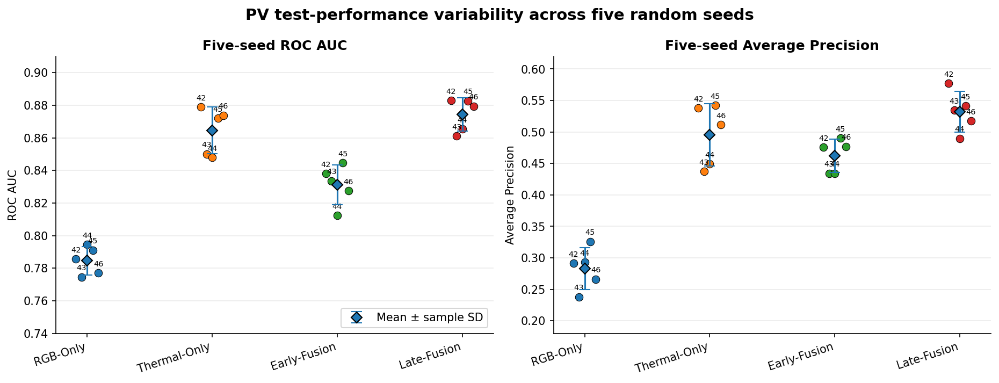

Saved PDF:
/Users/mdtohidulislam/Documents/Research/figures/pv_multiseed/pv_five_seed_performance_variability.pdf

Saved PNG:
/Users/mdtohidulislam/Documents/Research/figures/pv_multiseed/pv_five_seed_performance_variability.png


In [ ]:
# PV FIVE-SEED PERFORMANCE VARIABILITY FIGURE

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


AGGREGATE_DIR = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "aggregate"
)

FIGURE_DIR = (
    Path(FIG_DIR)
    / "pv_multiseed"
)

FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


metrics_path = (
    AGGREGATE_DIR
    / "pv_five_seed_test_metrics.csv"
)

metrics_df = pd.read_csv(
    metrics_path
)


required_columns = {
    "seed",
    "model",
    "roc_auc",
    "average_precision",
}

missing_columns = (
    required_columns
    - set(metrics_df.columns)
)

if missing_columns:
    raise ValueError(
        "Missing required columns: "
        + ", ".join(sorted(missing_columns))
    )


model_order = [
    "RGB-Only",
    "Thermal-Only",
    "Early-Fusion",
    "Late-Fusion",
]

metric_specs = [
    (
        "roc_auc",
        "ROC AUC",
    ),
    (
        "average_precision",
        "Average Precision",
    ),
]


fig, axes = plt.subplots(
    1,
    2,
    figsize=(12.5, 4.8),
)


x_positions = np.arange(
    len(model_order)
)


for axis, (
    metric_column,
    metric_label,
) in zip(
    axes,
    metric_specs,
):
    means = []
    standard_deviations = []

    for model_name in model_order:
        values = (
            metrics_df.loc[
                metrics_df["model"]
                == model_name,
                metric_column,
            ]
            .astype(float)
            .to_numpy()
        )

        means.append(
            values.mean()
        )

        standard_deviations.append(
            values.std(ddof=1)
        )


    # Individual seed points
    for model_index, model_name in enumerate(
        model_order
    ):
        model_rows = (
            metrics_df[
                metrics_df["model"]
                == model_name
            ]
            .sort_values("seed")
        )

        values = (
            model_rows[
                metric_column
            ]
            .astype(float)
            .to_numpy()
        )

        seeds = (
            model_rows["seed"]
            .astype(int)
            .to_numpy()
        )

        jitter = np.linspace(
            -0.09,
            0.09,
            len(values),
        )

        axis.scatter(
            np.full(
                len(values),
                model_index,
            )
            + jitter,
            values,
            s=48,
            zorder=3,
            edgecolors="black",
            linewidths=0.5,
        )

        # Optional seed labels
        for x_value, y_value, seed in zip(
            np.full(
                len(values),
                model_index,
            )
            + jitter,
            values,
            seeds,
        ):
            axis.annotate(
                str(seed),
                (
                    x_value,
                    y_value,
                ),
                xytext=(0, 6),
                textcoords="offset points",
                ha="center",
                fontsize=7,
            )


    # Mean ± sample SD
    axis.errorbar(
        x_positions,
        means,
        yerr=standard_deviations,
        fmt="D",
        markersize=7,
        capsize=5,
        linewidth=1.8,
        elinewidth=1.5,
        markeredgecolor="black",
        zorder=4,
        label="Mean ± sample SD",
    )


    axis.set_xticks(
        x_positions
    )

    axis.set_xticklabels(
        model_order,
        rotation=18,
        ha="right",
    )

    axis.set_ylabel(
        metric_label
    )

    axis.set_title(
        f"Five-seed {metric_label}",
        fontsize=12,
        fontweight="bold",
    )

    axis.grid(
        axis="y",
        alpha=0.25,
    )


axes[0].set_ylim(
    0.74,
    0.91,
)

axes[1].set_ylim(
    0.18,
    0.62,
)

axes[0].legend(
    loc="lower right",
    frameon=True,
)

fig.suptitle(
    "PV test-performance variability across five random seeds",
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()


pdf_path = (
    FIGURE_DIR
    / "pv_five_seed_performance_variability.pdf"
)

png_path = (
    FIGURE_DIR
    / "pv_five_seed_performance_variability.png"
)


plt.savefig(
    pdf_path,
    bbox_inches="tight",
)

plt.savefig(
    png_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()


print("Saved PDF:")
print(pdf_path.resolve())

print("\nSaved PNG:")
print(png_path.resolve())

In [ ]:
# FIGURE CAPTION VALUES

caption_summary = (
    metrics_df
    .groupby("model")[
        [
            "roc_auc",
            "average_precision",
        ]
    ]
    .agg(
        [
            "mean",
            "std",
        ]
    )
    .reindex(
        model_order
    )
)

display(
    caption_summary
)

roc_auc           average_precision          
                  mean       std              mean       std
model                                                       
RGB-Only      0.784604  0.008643          0.282882  0.032943
Thermal-Only  0.864571  0.014396          0.495594  0.049391
Early-Fusion  0.831241  0.012250          0.462240  0.026174
Late-Fusion   0.874365  0.010277          0.532044  0.032123

## Section 4: Cross-Modal Counterfactual Explanation (CCME)

In [ ]:
# PV CCME IMPLEMENTATION PREFLIGHT

from pathlib import Path
import inspect
import pandas as pd
import torch


print("=" * 80)
print("CANDIDATE CCME FUNCTIONS")
print("=" * 80)

search_terms = [
    "embed",
    "margin",
    "reference",
    "baseline",
    "ccme",
    "necess",
    "suff",
    "cross",
    "endpoint",
    "linear",
    "bisect",
    "trajectory",
]

candidate_functions = []

for name, obj in sorted(globals().items()):
    if callable(obj) and any(
        term in name.lower()
        for term in search_terms
    ):
        try:
            signature = inspect.signature(obj)
        except Exception:
            signature = "signature unavailable"

        candidate_functions.append(name)
        print(f"{name}{signature}")


print("\n" + "=" * 80)
print("CANDIDATE CCME VARIABLES")
print("=" * 80)

variable_terms = [
    "ref",
    "baseline",
    "embed",
    "ccme",
    "alpha",
    "selected",
    "representative",
    "normal",
]

for name, obj in sorted(globals().items()):
    if any(
        term in name.lower()
        for term in variable_terms
    ):
        if callable(obj):
            continue

        if isinstance(obj, torch.Tensor):
            print(
                f"{name}: Tensor "
                f"shape={tuple(obj.shape)}, "
                f"dtype={obj.dtype}, "
                f"device={obj.device}"
            )

        elif isinstance(obj, pd.DataFrame):
            print(
                f"{name}: DataFrame "
                f"shape={obj.shape}, "
                f"columns={list(obj.columns)[:15]}"
            )

        elif isinstance(obj, pd.Series):
            print(
                f"{name}: Series "
                f"shape={obj.shape}, "
                f"name={obj.name}"
            )

        elif isinstance(
            obj,
            (
                int,
                float,
                str,
                list,
                tuple,
                dict,
                Path,
                type(None),
            ),
        ):
            text = repr(obj)

            if len(text) > 300:
                text = text[:300] + "..."

            print(
                f"{name}: "
                f"{type(obj).__name__} = {text}"
            )


print("\n" + "=" * 80)
print("LATE-FUSION CHECKPOINTS")
print("=" * 80)

for seed in [42, 43, 44, 45, 46]:
    checkpoint_path = (
        MULTISEED_ROOT
        / f"seed_{seed}"
        / "late_fusion.pt"
    )

    print(
        f"Seed {seed}: "
        f"exists={checkpoint_path.exists()} | "
        f"{checkpoint_path.resolve()}"
    )


print("\n" + "=" * 80)
print("DATASETS AND SPLIT TABLES")
print("=" * 80)

for name in [
    "index_df",
    "labeled_df",
    "train_df",
    "val_df",
    "test_df",
    "dsets",
    "datasets",
]:
    if name not in globals():
        print(f"{name}: NOT FOUND")
        continue

    obj = globals()[name]

    if isinstance(obj, pd.DataFrame):
        print(
            f"{name}: DataFrame "
            f"shape={obj.shape}"
        )
        print(
            "  columns:",
            list(obj.columns),
        )

    elif isinstance(obj, dict):
        print(
            f"{name}: dict keys="
            f"{list(obj.keys())}"
        )

        for key, value in obj.items():
            try:
                print(
                    f"  {key}: "
                    f"{type(value).__name__}, "
                    f"n={len(value):,}"
                )
            except Exception:
                print(
                    f"  {key}: "
                    f"{type(value).__name__}"
                )

    else:
        try:
            print(
                f"{name}: "
                f"{type(obj).__name__}, "
                f"n={len(obj):,}"
            )
        except Exception:
            print(
                f"{name}: "
                f"{type(obj).__name__}"
            )


print("\n" + "=" * 80)
print("LATE-FUSION FORWARD COMPONENTS")
print("=" * 80)

inspection_model = LateFusionModel(
    pretrained=False
)

print(
    "RGB embedding dimension:",
    inspection_model.classifier[0].in_features // 2,
)

print(
    "Thermal embedding dimension:",
    inspection_model.classifier[0].in_features // 2,
)

print(
    "Concatenated dimension:",
    inspection_model.classifier[0].in_features,
)

print(
    "Fusion:",
    inspection_model.fusion,
)

print(
    "Classifier:",
    inspection_model.classifier,
)

CANDIDATE CCME FUNCTIONS

CANDIDATE CCME VARIABLES

LATE-FUSION CHECKPOINTS
Seed 42: exists=True | /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_42/late_fusion.pt
Seed 43: exists=True | /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_43/late_fusion.pt
Seed 44: exists=True | /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_44/late_fusion.pt
Seed 45: exists=True | /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_45/late_fusion.pt
Seed 46: exists=True | /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/seed_46/late_fusion.pt

DATASETS AND SPLIT TABLES
index_df: DataFrame shape=(76853, 10)
  columns: ['image_index', 'module_index', 'rgb_npy', 'thermal_npy', 'score', 'area', 'sat_z', 't95', 'n_accepted_panels', 'preprocessing_version']
labeled_df: DataFrame shape=(76853, 15)
  columns: ['image_index', 'module_index', 'rgb_npy', 'thermal_npy', 'score', 'ar

In [ ]:
# PV FIVE-SEED FULL-TEST ENDPOINT CCME

from pathlib import Path
import json
import time

import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader, Subset


PV_SEEDS = [42, 43, 44, 45, 46]

MULTISEED_ROOT = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
)

CCME_DIR = (
    MULTISEED_ROOT
    / "full_test_endpoint_ccme"
)

CCME_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


REFERENCE_SIZE = 200
EMBED_BATCH_SIZE = BATCH_SIZE
MARGIN_BATCH_SIZE = 1024


# 1. Fixed normal-training reference indices


train_dataset = datasets["train"]
test_dataset = datasets["test"]


def select_fixed_normal_indices(
    dataset,
    n_reference=200,
):
    """
    Select the first n_reference normal samples in deterministic
    dataset order. The same dataset indices are reused for every seed.
    """
    selected = []

    for dataset_index in range(len(dataset)):
        sample = dataset[dataset_index]

        if len(sample) != 3:
            raise ValueError(
                "Expected dataset items as (rgb, thermal, label)."
            )

        _, _, label = sample

        label_value = int(
            label.item()
            if hasattr(label, "item")
            else label
        )

        if label_value == 0:
            selected.append(dataset_index)

        if len(selected) >= n_reference:
            break

    if len(selected) < n_reference:
        raise ValueError(
            f"Only {len(selected)} normal training samples found; "
            f"{n_reference} required."
        )

    return selected


reference_indices_path = (
    CCME_DIR
    / "pv_reference_training_indices.csv"
)


if reference_indices_path.exists():
    reference_indices = (
        pd.read_csv(reference_indices_path)[
            "training_dataset_index"
        ]
        .astype(int)
        .tolist()
    )

    if len(reference_indices) != REFERENCE_SIZE:
        raise ValueError(
            "Existing reference-index file has an unexpected size."
        )

    print(
        "Loaded existing fixed reference indices:",
        reference_indices_path,
    )

else:
    reference_indices = select_fixed_normal_indices(
        train_dataset,
        n_reference=REFERENCE_SIZE,
    )

    pd.DataFrame({
        "reference_rank":
            np.arange(REFERENCE_SIZE),
        "training_dataset_index":
            reference_indices,
    }).to_csv(
        reference_indices_path,
        index=False,
    )

    print(
        "Created fixed reference-index file:",
        reference_indices_path,
    )


print("Reference samples:", len(reference_indices))
print("First 10 indices:", reference_indices[:10])


reference_loader = DataLoader(
    Subset(
        train_dataset,
        reference_indices,
    ),
    batch_size=EMBED_BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)

test_loader_ccme = DataLoader(
    test_dataset,
    batch_size=EMBED_BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)


# 2. Model and embedding utilities

def load_late_fusion_seed(seed):
    checkpoint_path = (
        MULTISEED_ROOT
        / f"seed_{seed}"
        / "late_fusion.pt"
    )

    if not checkpoint_path.exists():
        raise FileNotFoundError(
            f"Missing checkpoint: {checkpoint_path}"
        )

    model = LateFusionModel(
        pretrained=False
    ).to(DEVICE)

    state_dict = torch.load(
        checkpoint_path,
        map_location=DEVICE,
        weights_only=True,
    )

    model.load_state_dict(state_dict)
    model.eval()

    return model, checkpoint_path


@torch.no_grad()
def extract_embeddings(
    model,
    data_loader,
):
    rgb_embeddings = []
    thermal_embeddings = []
    labels = []

    for rgb, thermal, y in data_loader:
        rgb = rgb.to(DEVICE)
        thermal = thermal.to(DEVICE)

        z_rgb = model.rgb_backbone(rgb)
        z_thermal = model.th_backbone(thermal)

        rgb_embeddings.append(
            z_rgb.detach().cpu()
        )

        thermal_embeddings.append(
            z_thermal.detach().cpu()
        )

        labels.append(
            y.detach().cpu().long()
        )

    return (
        torch.cat(rgb_embeddings, dim=0),
        torch.cat(thermal_embeddings, dim=0),
        torch.cat(labels, dim=0),
    )


@torch.no_grad()
def margins_from_embeddings(
    model,
    rgb_embeddings,
    thermal_embeddings,
    batch_size=1024,
):
    """
    Compute signed positive-class margin:
        margin = logit_1 - logit_0
    """
    if len(rgb_embeddings) != len(thermal_embeddings):
        raise ValueError(
            "RGB and thermal embedding counts differ."
        )

    margins = []

    for start in range(
        0,
        len(rgb_embeddings),
        batch_size,
    ):
        end = min(
            start + batch_size,
            len(rgb_embeddings),
        )

        z_rgb = rgb_embeddings[
            start:end
        ].to(DEVICE)

        z_thermal = thermal_embeddings[
            start:end
        ].to(DEVICE)

        fused = torch.cat(
            [
                z_rgb,
                z_thermal,
            ],
            dim=1,
        )

        logits = model.classifier(
            model.fusion(fused)
        )

        margin = (
            logits[:, 1]
            - logits[:, 0]
        )

        margins.append(
            margin.detach().cpu()
        )

    return torch.cat(
        margins,
        dim=0,
    ).numpy()


def repeated_reference(
    reference_embedding,
    n_samples,
):
    return (
        reference_embedding
        .reshape(1, -1)
        .repeat(n_samples, 1)
    )


def endpoint_crossing(
    start_margin,
    end_margin,
    direction,
):
    """
    Endpoint-linear screening.

    necessity:
        starts factual-positive and crosses if endpoint is negative.

    sufficiency:
        starts at negative joint reference and crosses if endpoint
        reaches the positive side.
    """
    start_margin = np.asarray(
        start_margin,
        dtype=float,
    )

    end_margin = np.asarray(
        end_margin,
        dtype=float,
    )

    if direction == "necessity":
        applicable = start_margin >= 0
        crossed = (
            applicable
            & (end_margin < 0)
        )

    elif direction == "sufficiency":
        applicable = start_margin < 0
        crossed = (
            applicable
            & (end_margin >= 0)
        )

    else:
        raise ValueError(
            "direction must be 'necessity' or 'sufficiency'"
        )

    alpha = np.full(
        len(start_margin),
        np.nan,
        dtype=float,
    )

    denominator = (
        start_margin
        - end_margin
    )

    valid = (
        crossed
        & (np.abs(denominator) > 1e-12)
    )

    alpha[valid] = (
        start_margin[valid]
        / denominator[valid]
    )

    alpha[
        (alpha < 0)
        | (alpha > 1)
    ] = np.nan

    return applicable, crossed, alpha


# 3. Run all seeds

seed_summary_rows = []
all_sample_rows = []

for seed in PV_SEEDS:
    print("\n" + "=" * 80)
    print(f"PV ENDPOINT CCME — SEED {seed}")
    print("=" * 80)

    started = time.time()

    model, checkpoint_path = (
        load_late_fusion_seed(seed)
    )

    # Training-derived reference embeddings
    ref_rgb_all, ref_th_all, ref_labels = (
        extract_embeddings(
            model,
            reference_loader,
        )
    )

    if not torch.all(
        ref_labels == 0
    ):
        raise ValueError(
            "Reference subset contains non-normal labels."
        )

    b_rgb = ref_rgb_all.mean(
        dim=0
    )

    b_th = ref_th_all.mean(
        dim=0
    )

    # Full test embeddings
    z_rgb, z_th, y_true_tensor = (
        extract_embeddings(
            model,
            test_loader_ccme,
        )
    )

    y_true = (
        y_true_tensor.numpy()
        .astype(int)
    )

    n_test = len(y_true)

    b_rgb_test = repeated_reference(
        b_rgb,
        n_test,
    )

    b_th_test = repeated_reference(
        b_th,
        n_test,
    )

    # Four coalition margins
    factual_margin = margins_from_embeddings(
        model,
        z_rgb,
        z_th,
        batch_size=MARGIN_BATCH_SIZE,
    )

    rgb_ref_margin = margins_from_embeddings(
        model,
        b_rgb_test,
        z_th,
        batch_size=MARGIN_BATCH_SIZE,
    )
    # (baseline RGB, factual thermal)

    thermal_ref_margin = margins_from_embeddings(
        model,
        z_rgb,
        b_th_test,
        batch_size=MARGIN_BATCH_SIZE,
    )
    # (factual RGB, baseline thermal)

    joint_reference_margin_array = (
        margins_from_embeddings(
            model,
            b_rgb.reshape(1, -1),
            b_th.reshape(1, -1),
            batch_size=1,
        )
    )

    joint_reference_margin = float(
        joint_reference_margin_array[0]
    )

    print(
        "Joint-reference margin:",
        f"{joint_reference_margin:.6f}",
    )

    if joint_reference_margin >= 0:
        raise RuntimeError(
            f"Seed {seed} joint reference is not normal-class: "
            f"margin={joint_reference_margin:.6f}"
        )

    joint_reference_margins = np.full(
        n_test,
        joint_reference_margin,
        dtype=float,
    )

    y_pred = (
        factual_margin >= 0
    ).astype(int)

    factual_positive = (
        y_pred == 1
    )


    # Necessity
    rgb_nec_app, rgb_nec_cross, rgb_nec_alpha = (
        endpoint_crossing(
            factual_margin,
            rgb_ref_margin,
            direction="necessity",
        )
    )

    th_nec_app, th_nec_cross, th_nec_alpha = (
        endpoint_crossing(
            factual_margin,
            thermal_ref_margin,
            direction="necessity",
        )
    )


    # Sufficiency
    rgb_suf_app, rgb_suf_cross, rgb_suf_alpha = (
        endpoint_crossing(
            joint_reference_margins,
            thermal_ref_margin,
            direction="sufficiency",
        )
    )
    # Restore factual RGB while thermal remains at reference.

    th_suf_app, th_suf_cross, th_suf_alpha = (
        endpoint_crossing(
            joint_reference_margins,
            rgb_ref_margin,
            direction="sufficiency",
        )
    )
    # Restore factual thermal while RGB remains at reference.


    n_positive = int(
        factual_positive.sum()
    )

    if n_positive == 0:
        raise RuntimeError(
            f"Seed {seed} produced no factual-positive test predictions."
        )


    def count_and_rate(mask, denominator_mask):
        denominator = int(
            denominator_mask.sum()
        )

        numerator = int(
            (
                mask
                & denominator_mask
            ).sum()
        )

        rate = (
            numerator / denominator
            if denominator > 0
            else np.nan
        )

        return numerator, denominator, rate


    rgb_nec_n, rgb_nec_d, rgb_nec_rate = (
        count_and_rate(
            rgb_nec_cross,
            factual_positive,
        )
    )

    th_nec_n, th_nec_d, th_nec_rate = (
        count_and_rate(
            th_nec_cross,
            factual_positive,
        )
    )

    rgb_suf_all_n, rgb_suf_all_d, rgb_suf_all_rate = (
        count_and_rate(
            rgb_suf_cross,
            np.ones(
                n_test,
                dtype=bool,
            ),
        )
    )

    th_suf_all_n, th_suf_all_d, th_suf_all_rate = (
        count_and_rate(
            th_suf_cross,
            np.ones(
                n_test,
                dtype=bool,
            ),
        )
    )

    rgb_suf_pos_n, rgb_suf_pos_d, rgb_suf_pos_rate = (
        count_and_rate(
            rgb_suf_cross,
            factual_positive,
        )
    )

    th_suf_pos_n, th_suf_pos_d, th_suf_pos_rate = (
        count_and_rate(
            th_suf_cross,
            factual_positive,
        )
    )


    def conditional_alpha_summary(
        alpha_values,
        crossing_mask,
        denominator_mask,
    ):
        values = alpha_values[
            crossing_mask
            & denominator_mask
            & np.isfinite(alpha_values)
        ]

        if len(values) == 0:
            return {
                "mean": np.nan,
                "median": np.nan,
                "sd": np.nan,
                "min": np.nan,
                "max": np.nan,
            }

        return {
            "mean": float(
                values.mean()
            ),
            "median": float(
                np.median(values)
            ),
            "sd": float(
                values.std(ddof=1)
                if len(values) > 1
                else 0.0
            ),
            "min": float(
                values.min()
            ),
            "max": float(
                values.max()
            ),
        }


    rgb_nec_alpha_stats = (
        conditional_alpha_summary(
            rgb_nec_alpha,
            rgb_nec_cross,
            factual_positive,
        )
    )

    th_nec_alpha_stats = (
        conditional_alpha_summary(
            th_nec_alpha,
            th_nec_cross,
            factual_positive,
        )
    )

    rgb_suf_alpha_stats = (
        conditional_alpha_summary(
            rgb_suf_alpha,
            rgb_suf_cross,
            factual_positive,
        )
    )

    th_suf_alpha_stats = (
        conditional_alpha_summary(
            th_suf_alpha,
            th_suf_cross,
            factual_positive,
        )
    )


    # Conservative descriptive regime label.
    if (
        th_nec_rate >= 0.90
        and th_suf_pos_rate >= 0.90
        and rgb_nec_rate <= 0.05
        and rgb_suf_pos_rate <= 0.05
    ):
        regime = "Near thermal-exclusive"

    elif (
        th_nec_rate > rgb_nec_rate
        and th_suf_pos_rate > rgb_suf_pos_rate
        and (
            rgb_nec_rate > 0.05
            or rgb_suf_pos_rate > 0.05
        )
    ):
        regime = (
            "Thermal-dominant, "
            "interaction-dependent"
        )

    elif (
        abs(
            th_nec_rate
            - rgb_nec_rate
        ) <= 0.10
        and abs(
            th_suf_pos_rate
            - rgb_suf_pos_rate
        ) <= 0.10
    ):
        regime = "Approximately balanced"

    else:
        regime = "Mixed/asymmetric"


    seed_summary = {
        "seed": seed,
        "checkpoint":
            str(checkpoint_path.resolve()),
        "n_test": n_test,
        "n_true_positive_labels":
            int(y_true.sum()),
        "n_factual_positive":
            n_positive,
        "joint_reference_margin":
            joint_reference_margin,

        "rgb_necessity_crossings":
            rgb_nec_n,
        "rgb_necessity_denominator":
            rgb_nec_d,
        "rgb_necessity_rate":
            rgb_nec_rate,

        "thermal_necessity_crossings":
            th_nec_n,
        "thermal_necessity_denominator":
            th_nec_d,
        "thermal_necessity_rate":
            th_nec_rate,

        "rgb_sufficiency_all_crossings":
            rgb_suf_all_n,
        "rgb_sufficiency_all_denominator":
            rgb_suf_all_d,
        "rgb_sufficiency_all_rate":
            rgb_suf_all_rate,

        "thermal_sufficiency_all_crossings":
            th_suf_all_n,
        "thermal_sufficiency_all_denominator":
            th_suf_all_d,
        "thermal_sufficiency_all_rate":
            th_suf_all_rate,

        "rgb_sufficiency_positive_crossings":
            rgb_suf_pos_n,
        "rgb_sufficiency_positive_denominator":
            rgb_suf_pos_d,
        "rgb_sufficiency_positive_rate":
            rgb_suf_pos_rate,

        "thermal_sufficiency_positive_crossings":
            th_suf_pos_n,
        "thermal_sufficiency_positive_denominator":
            th_suf_pos_d,
        "thermal_sufficiency_positive_rate":
            th_suf_pos_rate,

        "rgb_necessity_alpha_mean":
            rgb_nec_alpha_stats["mean"],
        "rgb_necessity_alpha_median":
            rgb_nec_alpha_stats["median"],

        "thermal_necessity_alpha_mean":
            th_nec_alpha_stats["mean"],
        "thermal_necessity_alpha_median":
            th_nec_alpha_stats["median"],

        "rgb_sufficiency_alpha_mean_positive":
            rgb_suf_alpha_stats["mean"],
        "rgb_sufficiency_alpha_median_positive":
            rgb_suf_alpha_stats["median"],

        "thermal_sufficiency_alpha_mean_positive":
            th_suf_alpha_stats["mean"],
        "thermal_sufficiency_alpha_median_positive":
            th_suf_alpha_stats["median"],

        "regime": regime,
        "elapsed_seconds":
            time.time() - started,
    }

    seed_summary_rows.append(
        seed_summary
    )


    sample_df = pd.DataFrame({
        "seed": seed,
        "test_dataset_index":
            np.arange(n_test),
        "true_label": y_true,
        "factual_prediction": y_pred,
        "factual_margin": factual_margin,
        "rgb_reference_endpoint_margin":
            rgb_ref_margin,
        "thermal_reference_endpoint_margin":
            thermal_ref_margin,
        "joint_reference_margin":
            joint_reference_margins,

        "rgb_necessity_crossed":
            rgb_nec_cross.astype(int),
        "rgb_necessity_alpha":
            rgb_nec_alpha,

        "thermal_necessity_crossed":
            th_nec_cross.astype(int),
        "thermal_necessity_alpha":
            th_nec_alpha,

        "rgb_sufficiency_crossed":
            rgb_suf_cross.astype(int),
        "rgb_sufficiency_alpha":
            rgb_suf_alpha,

        "thermal_sufficiency_crossed":
            th_suf_cross.astype(int),
        "thermal_sufficiency_alpha":
            th_suf_alpha,
    })

    sample_path = (
        CCME_DIR
        / f"pv_seed_{seed}_full_test_endpoint_ccme.csv"
    )

    sample_df.to_csv(
        sample_path,
        index=False,
    )

    all_sample_rows.append(
        sample_df
    )


    print(
        f"Factual positives: {n_positive:,}"
    )

    print(
        "RGB necessity:",
        f"{rgb_nec_n}/{rgb_nec_d}",
        f"({rgb_nec_rate:.4f})",
    )

    print(
        "Thermal necessity:",
        f"{th_nec_n}/{th_nec_d}",
        f"({th_nec_rate:.4f})",
    )

    print(
        "RGB sufficiency among factual positives:",
        f"{rgb_suf_pos_n}/{rgb_suf_pos_d}",
        f"({rgb_suf_pos_rate:.4f})",
    )

    print(
        "Thermal sufficiency among factual positives:",
        f"{th_suf_pos_n}/{th_suf_pos_d}",
        f"({th_suf_pos_rate:.4f})",
    )

    print(
        "Regime:",
        regime,
    )

    print(
        "Saved:",
        sample_path.name,
    )


    del model

    if torch.backends.mps.is_available():
        torch.mps.empty_cache()


# 4. Save summaries

seed_summary_df = pd.DataFrame(
    seed_summary_rows
)

seed_summary_path = (
    CCME_DIR
    / "pv_five_seed_endpoint_ccme_summary.csv"
)

seed_summary_df.to_csv(
    seed_summary_path,
    index=False,
)


all_samples_df = pd.concat(
    all_sample_rows,
    ignore_index=True,
)

all_samples_path = (
    CCME_DIR
    / "pv_five_seed_endpoint_ccme_long.csv"
)

all_samples_df.to_csv(
    all_samples_path,
    index=False,
)


metadata = {
    "domain": "PV",
    "seeds": PV_SEEDS,
    "n_test_per_seed": len(test_dataset),
    "reference_size": REFERENCE_SIZE,
    "reference_source":
        "fixed deterministic normal-training subset",
    "reference_index_file":
        str(reference_indices_path.resolve()),
    "necessity_denominator":
        "factual-positive predictions only",
    "sufficiency_denominators": [
        "all test samples",
        "factual-positive predictions",
    ],
    "method":
        "two-endpoint linear screening",
    "decision_margin":
        "positive-class logit minus normal-class logit",
    "decision_boundary": 0.0,
}

metadata_path = (
    CCME_DIR
    / "pv_five_seed_endpoint_ccme_metadata.json"
)

with open(
    metadata_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        metadata,
        file,
        indent=2,
    )


display_columns = [
    "seed",
    "n_factual_positive",
    "rgb_necessity_rate",
    "thermal_necessity_rate",
    "rgb_sufficiency_positive_rate",
    "thermal_sufficiency_positive_rate",
    "regime",
]

display(
    seed_summary_df[
        display_columns
    ]
)


print("\nSaved summary:")
print(seed_summary_path.resolve())

print("\nSaved long results:")
print(all_samples_path.resolve())

print("\nSaved metadata:")
print(metadata_path.resolve())

Created fixed reference-index file: /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/pv_reference_training_indices.csv
Reference samples: 200
First 10 indices: [0, 1, 2, 3, 4, 5, 7, 8, 9, 11]

PV ENDPOINT CCME — SEED 42
Joint-reference margin: -3.803983
Factual positives: 2,835
RGB necessity: 1080/2835 (0.3810)
Thermal necessity: 2720/2835 (0.9594)
RGB sufficiency among factual positives: 115/2835 (0.0406)
Thermal sufficiency among factual positives: 1755/2835 (0.6190)
Regime: Thermal-dominant, interaction-dependent
Saved: pv_seed_42_full_test_endpoint_ccme.csv

PV ENDPOINT CCME — SEED 43
Joint-reference margin: -4.624309
Factual positives: 3,419
RGB necessity: 2315/3419 (0.6771)
Thermal necessity: 3327/3419 (0.9731)
RGB sufficiency among factual positives: 92/3419 (0.0269)
Thermal sufficiency among factual positives: 1104/3419 (0.3229)
Regime: Thermal-dominant, interaction-dependent
Saved: pv_seed_43_full_test_endpoint_ccme.csv

PV ENDPOI

,seed,n_factual_positive,rgb_necessity_rate,thermal_necessity_rate,rgb_sufficiency_positive_rate,thermal_sufficiency_positive_rate,regime
0,42,2835,0.380952,0.959436,0.040564,0.619048,"Thermal-dominant, interaction-dependent"
1,43,3419,0.677099,0.973092,0.026908,0.322901,"Thermal-dominant, interaction-dependent"
2,44,4627,0.437649,0.902313,0.097687,0.562351,"Thermal-dominant, interaction-dependent"
3,45,4503,0.504330,0.978459,0.021541,0.495670,"Thermal-dominant, interaction-dependent"
4,46,4949,0.358254,0.925439,0.074561,0.641746,"Thermal-dominant, interaction-dependent"



Saved summary:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/pv_five_seed_endpoint_ccme_summary.csv

Saved long results:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/pv_five_seed_endpoint_ccme_long.csv

Saved metadata:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/pv_five_seed_endpoint_ccme_metadata.json


In [ ]:
# PV ENDPOINT-CCME INTEGRITY AUDIT


import numpy as np
import pandas as pd
from pathlib import Path

CCME_DIR = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "full_test_endpoint_ccme"
)

summary_path = (
    CCME_DIR
    / "pv_five_seed_endpoint_ccme_summary.csv"
)

ccme_summary_df = pd.read_csv(summary_path)

ccme_summary_df["rgb_nec_plus_th_suf"] = (
    ccme_summary_df["rgb_necessity_rate"]
    + ccme_summary_df["thermal_sufficiency_positive_rate"]
)

ccme_summary_df["th_nec_plus_rgb_suf"] = (
    ccme_summary_df["thermal_necessity_rate"]
    + ccme_summary_df["rgb_sufficiency_positive_rate"]
)

audit_columns = [
    "seed",
    "n_factual_positive",
    "joint_reference_margin",
    "rgb_nec_plus_th_suf",
    "th_nec_plus_rgb_suf",
    "regime",
]

display(ccme_summary_df[audit_columns])

assert (
    ccme_summary_df["joint_reference_margin"] < 0
).all()

assert np.allclose(
    ccme_summary_df["rgb_nec_plus_th_suf"],
    1.0,
    atol=1e-10,
)

assert np.allclose(
    ccme_summary_df["th_nec_plus_rgb_suf"],
    1.0,
    atol=1e-10,
)

assert (
    ccme_summary_df["regime"]
    == "Thermal-dominant, interaction-dependent"
).all()

print("All endpoint-CCME integrity checks passed.")

,seed,n_factual_positive,joint_reference_margin,rgb_nec_plus_th_suf,th_nec_plus_rgb_suf,regime
0,42,2835,-3.803983,1.0,1.0,"Thermal-dominant, interaction-dependent"
1,43,3419,-4.624309,1.0,1.0,"Thermal-dominant, interaction-dependent"
2,44,4627,-4.481410,1.0,1.0,"Thermal-dominant, interaction-dependent"
3,45,4503,-4.039179,1.0,1.0,"Thermal-dominant, interaction-dependent"
4,46,4949,-2.914291,1.0,1.0,"Thermal-dominant, interaction-dependent"


All endpoint-CCME integrity checks passed.


,seed,n_test,n_factual_positive,joint_reference_margin,rgb_necessity_crossings,rgb_necessity_denominator,rgb_necessity_rate,thermal_necessity_crossings,thermal_necessity_denominator,thermal_necessity_rate,...,thermal_necessity_alpha_mean,thermal_necessity_alpha_median,rgb_sufficiency_alpha_mean_positive,rgb_sufficiency_alpha_median_positive,thermal_sufficiency_alpha_mean_positive,thermal_sufficiency_alpha_median_positive,regime,reference_file,checkpoint,elapsed_seconds
0,42,18670,2835,-3.923607,1015,2835,0.358025,2758,2835,0.972840,...,0.341180,0.361642,0.911010,0.923411,0.723183,0.705972,"Thermal-dominant, interaction-dependent",/Users/mdtohidulislam/Documents/Research/check...,/Users/mdtohidulislam/Documents/Research/check...,105.087863
1,43,18670,3419,-4.647717,2371,3419,0.693478,3304,3419,0.966364,...,0.403991,0.400943,0.933504,0.934376,0.741363,0.733158,"Thermal-dominant, interaction-dependent",/Users/mdtohidulislam/Documents/Research/check...,/Users/mdtohidulislam/Documents/Research/check...,102.742403
2,44,18670,4627,-4.265215,1888,4627,0.408040,4106,4627,0.887400,...,0.449880,0.461695,0.805144,0.795675,0.761063,0.743398,"Thermal-dominant, interaction-dependent",/Users/mdtohidulislam/Documents/Research/check...,/Users/mdtohidulislam/Documents/Research/check...,110.605082
3,45,18670,4503,-4.043443,2302,4503,0.511215,4378,4503,0.972241,...,0.356551,0.362801,0.901217,0.909699,0.745944,0.737345,"Thermal-dominant, interaction-dependent",/Users/mdtohidulislam/Documents/Research/check...,/Users/mdtohidulislam/Documents/Research/check...,114.807248
4,46,18670,4949,-2.891934,1668,4949,0.337038,4612,4949,0.931905,...,0.548015,0.575728,0.879963,0.904111,0.656470,0.637755,"Thermal-dominant, interaction-dependent",/Users/mdtohidulislam/Documents/Research/check...,/Users/mdtohidulislam/Documents/Research/check...,116.582409



Values used for corrected Figure 7:


,rgb_necessity_rate,thermal_necessity_rate,rgb_sufficiency_positive_rate,thermal_sufficiency_positive_rate
seed,,,,
42,0.358025,0.972840,0.027160,0.641975
43,0.693478,0.966364,0.033636,0.306522
44,0.408040,0.887400,0.112600,0.591960
45,0.511215,0.972241,0.027759,0.488785
46,0.337038,0.931905,0.068095,0.662962


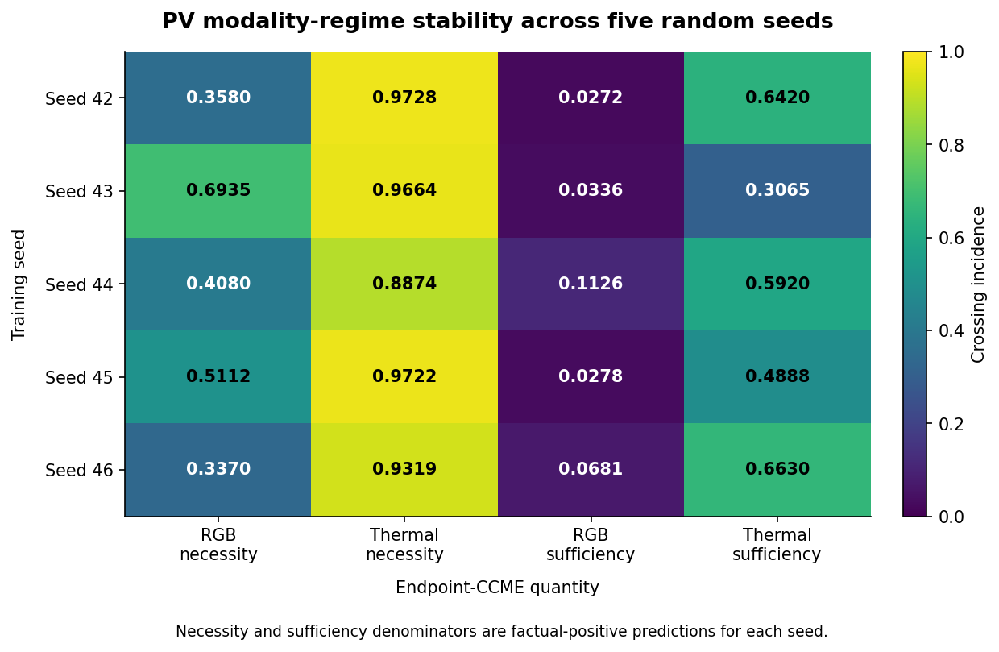


Saved corrected PDF:
/Users/mdtohidulislam/Documents/Research/figures/pv_multiseed/pv_five_seed_regime_stability.pdf

Saved corrected PNG:
/Users/mdtohidulislam/Documents/Research/figures/pv_multiseed/pv_five_seed_regime_stability.png


In [ ]:
# Five-seed CCME modality-regime stability figure

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


CORRECTED_SUMMARY_PATH = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "full_test_endpoint_ccme_deterministic_reference"
    / "pv_five_seed_corrected_endpoint_ccme_summary.csv"
)

FIGURE_DIR = (
    Path(FIG_DIR)
    / "pv_multiseed"
)

FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# Load corrected deterministic-reference results

corrected_ccme_df = pd.read_csv(
    CORRECTED_SUMMARY_PATH
)

display(corrected_ccme_df)


# Select factual-positive crossing-incidence quantities

plot_columns = [
    "rgb_necessity_rate",
    "thermal_necessity_rate",
    "rgb_sufficiency_positive_rate",
    "thermal_sufficiency_positive_rate",
]

plot_labels = [
    "RGB\nnecessity",
    "Thermal\nnecessity",
    "RGB\nsufficiency",
    "Thermal\nsufficiency",
]

seed_order = [42, 43, 44, 45, 46]

plot_df = (
    corrected_ccme_df
    .set_index("seed")
    .loc[
        seed_order,
        plot_columns,
    ]
)

values = plot_df.to_numpy(dtype=float)

print("\nValues used for corrected Figure 7:")
display(plot_df)


# Plot

fig, ax = plt.subplots(
    figsize=(8.4, 5.4)
)

image = ax.imshow(
    values,
    vmin=0,
    vmax=1,
    aspect="auto",
    cmap="viridis",
)

ax.set_xticks(
    np.arange(len(plot_labels))
)

ax.set_xticklabels(
    plot_labels,
    fontsize=10,
)

ax.set_yticks(
    np.arange(len(seed_order))
)

ax.set_yticklabels(
    [
        f"Seed {seed}"
        for seed in seed_order
    ],
    fontsize=10,
)

ax.set_title(
    "PV modality-regime stability across five random seeds",
    fontsize=13,
    fontweight="bold",
    pad=14,
)

for row_index in range(values.shape[0]):
    for column_index in range(values.shape[1]):
        value = values[row_index, column_index]

        text_color = (
            "white"
            if value < 0.45
            else "black"
        )

        ax.text(
            column_index,
            row_index,
            f"{value:.4f}",
            ha="center",
            va="center",
            color=text_color,
            fontsize=10,
            fontweight="bold",
        )


colorbar = fig.colorbar(
    image,
    ax=ax,
    fraction=0.046,
    pad=0.04,
)

colorbar.set_label(
    "Crossing incidence",
    rotation=90,
)

ax.set_xlabel(
    "Endpoint-CCME quantity",
    labelpad=10,
)

ax.set_ylabel(
    "Training seed",
    labelpad=10,
)

fig.text(
    0.5,
    0.015,
    (
        "Necessity and sufficiency denominators are factual-positive "
        "predictions for each seed."
    ),
    ha="center",
    fontsize=9,
)

plt.tight_layout(
    rect=[
        0,
        0.05,
        1,
        1,
    ]
)


# Save corrected manuscript figure


pdf_path = (
    FIGURE_DIR
    / "pv_five_seed_regime_stability.pdf"
)

png_path = (
    FIGURE_DIR
    / "pv_five_seed_regime_stability.png"
)

plt.savefig(
    pdf_path,
    bbox_inches="tight",
)

plt.savefig(
    png_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("\nSaved corrected PDF:")
print(pdf_path.resolve())

print("\nSaved corrected PNG:")
print(png_path.resolve())

In [ ]:
# PV FIVE-SEED ENDPOINT-CCME AGGREGATE TABLE

import pandas as pd
import numpy as np
from pathlib import Path

CCME_DIR = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "full_test_endpoint_ccme"
)

summary_df = pd.read_csv(
    CCME_DIR
    / "pv_five_seed_endpoint_ccme_summary.csv"
)

aggregate_rows = []

metric_specs = [
    (
        "RGB necessity",
        "rgb_necessity_crossings",
        "rgb_necessity_denominator",
        "rgb_necessity_rate",
    ),
    (
        "Thermal necessity",
        "thermal_necessity_crossings",
        "thermal_necessity_denominator",
        "thermal_necessity_rate",
    ),
    (
        "RGB sufficiency",
        "rgb_sufficiency_positive_crossings",
        "rgb_sufficiency_positive_denominator",
        "rgb_sufficiency_positive_rate",
    ),
    (
        "Thermal sufficiency",
        "thermal_sufficiency_positive_crossings",
        "thermal_sufficiency_positive_denominator",
        "thermal_sufficiency_positive_rate",
    ),
]

for label, numerator_col, denominator_col, rate_col in metric_specs:
    pooled_numerator = int(
        summary_df[numerator_col].sum()
    )

    pooled_denominator = int(
        summary_df[denominator_col].sum()
    )

    pooled_rate = (
        pooled_numerator
        / pooled_denominator
    )

    aggregate_rows.append({
        "CCME quantity": label,
        "Pooled crossings":
            f"{pooled_numerator}/{pooled_denominator}",
        "Pooled rate":
            pooled_rate,
        "Seed mean":
            summary_df[rate_col].mean(),
        "Seed SD":
            summary_df[rate_col].std(ddof=1),
        "Seed minimum":
            summary_df[rate_col].min(),
        "Seed maximum":
            summary_df[rate_col].max(),
    })

aggregate_df = pd.DataFrame(
    aggregate_rows
)

display(
    aggregate_df
)

aggregate_path = (
    CCME_DIR
    / "pv_five_seed_endpoint_ccme_aggregate.csv"
)

aggregate_df.to_csv(
    aggregate_path,
    index=False,
)

print("Saved:")
print(aggregate_path.resolve())

,CCME quantity,Pooled crossings,Pooled rate,Seed mean,Seed SD,Seed minimum,Seed maximum
0,RGB necessity,9464/20333,0.465450,0.471657,0.127982,0.358254,0.677099
1,Thermal necessity,19208/20333,0.944671,0.947748,0.032727,0.902313,0.978459
2,RGB sufficiency,1125/20333,0.055329,0.052252,0.032727,0.021541,0.097687
3,Thermal sufficiency,10869/20333,0.534550,0.528343,0.127982,0.322901,0.641746


Saved:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/pv_five_seed_endpoint_ccme_aggregate.csv


In [ ]:
# PV FULL-TEST ENDPOINT APPROXIMATION VALIDATION
# Dense grid + bisection for all five Late-Fusion seeds

from pathlib import Path
import json
import time
import warnings

import numpy as np
import pandas as pd
import torch
from scipy.stats import pearsonr, spearmanr
from torch.utils.data import DataLoader, Subset


PV_SEEDS = [42, 43, 44, 45, 46]

GRID_SIZE = 21
BISECTION_STEPS = 20
HEAD_BATCH_SIZE = 4096
EMBED_BATCH_SIZE = BATCH_SIZE

MULTISEED_ROOT = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
)

CCME_DIR = (
    MULTISEED_ROOT
    / "full_test_endpoint_ccme"
)

VALIDATION_DIR = (
    CCME_DIR
    / "full_test_endpoint_validation"
)

VALIDATION_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# Fixed reference indices created in the preceding analysis

reference_indices_path = (
    CCME_DIR
    / "pv_reference_training_indices.csv"
)

if not reference_indices_path.exists():
    raise FileNotFoundError(
        f"Missing fixed reference-index file: "
        f"{reference_indices_path}"
    )

reference_indices = (
    pd.read_csv(reference_indices_path)[
        "training_dataset_index"
    ]
    .astype(int)
    .tolist()
)

print(
    "Fixed reference samples:",
    len(reference_indices),
)


train_dataset = datasets["train"]
test_dataset = datasets["test"]

reference_loader = DataLoader(
    Subset(
        train_dataset,
        reference_indices,
    ),
    batch_size=EMBED_BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)

test_loader_validation = DataLoader(
    test_dataset,
    batch_size=EMBED_BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)


# Model and embedding utilities

def load_validation_model(seed):
    checkpoint_path = (
        MULTISEED_ROOT
        / f"seed_{seed}"
        / "late_fusion.pt"
    )

    if not checkpoint_path.exists():
        raise FileNotFoundError(
            f"Missing checkpoint: {checkpoint_path}"
        )

    model = LateFusionModel(
        pretrained=False
    ).to(DEVICE)

    state_dict = torch.load(
        checkpoint_path,
        map_location=DEVICE,
        weights_only=True,
    )

    model.load_state_dict(
        state_dict
    )

    model.eval()

    return model, checkpoint_path


@torch.no_grad()
def extract_validation_embeddings(
    model,
    data_loader,
):
    rgb_embeddings = []
    thermal_embeddings = []
    labels = []

    for rgb, thermal, y in data_loader:
        rgb = rgb.to(DEVICE)
        thermal = thermal.to(DEVICE)

        rgb_embeddings.append(
            model.rgb_backbone(rgb)
            .detach()
            .cpu()
        )

        thermal_embeddings.append(
            model.th_backbone(thermal)
            .detach()
            .cpu()
        )

        labels.append(
            y.detach()
            .cpu()
            .long()
        )

    return (
        torch.cat(rgb_embeddings),
        torch.cat(thermal_embeddings),
        torch.cat(labels),
    )


@torch.no_grad()
def head_margin(
    model,
    z_rgb,
    z_thermal,
    batch_size=HEAD_BATCH_SIZE,
):
    if len(z_rgb) != len(z_thermal):
        raise ValueError(
            "RGB and thermal embedding counts differ."
        )

    outputs = []

    for start in range(
        0,
        len(z_rgb),
        batch_size,
    ):
        end = min(
            start + batch_size,
            len(z_rgb),
        )

        rgb_batch = z_rgb[
            start:end
        ].to(DEVICE)

        thermal_batch = z_thermal[
            start:end
        ].to(DEVICE)

        fused = torch.cat(
            [
                rgb_batch,
                thermal_batch,
            ],
            dim=1,
        )

        logits = model.classifier(
            model.fusion(fused)
        )

        margins = (
            logits[:, 1]
            - logits[:, 0]
        )

        outputs.append(
            margins.detach().cpu()
        )

    return (
        torch.cat(outputs)
        .numpy()
        .astype(float)
    )


def expand_reference(
    reference_embedding,
    n,
):
    return (
        reference_embedding
        .reshape(1, -1)
        .repeat(n, 1)
    )


# Path construction

def path_embeddings(
    analysis,
    modality,
    alpha,
    factual_rgb,
    factual_thermal,
    baseline_rgb,
    baseline_thermal,
):
    """
    Necessity:
        alpha=0 factual state
        alpha=1 tested modality replaced by baseline

    Sufficiency:
        alpha=0 joint baseline
        alpha=1 tested modality restored to factual state
    """
    alpha = float(alpha)

    if analysis == "necessity":
        if modality == "rgb":
            z_rgb = (
                (1.0 - alpha)
                * factual_rgb
                + alpha
                * baseline_rgb
            )

            z_thermal = factual_thermal

        elif modality == "thermal":
            z_rgb = factual_rgb

            z_thermal = (
                (1.0 - alpha)
                * factual_thermal
                + alpha
                * baseline_thermal
            )

        else:
            raise ValueError(
                f"Unknown modality: {modality}"
            )

    elif analysis == "sufficiency":
        if modality == "rgb":
            z_rgb = (
                (1.0 - alpha)
                * baseline_rgb
                + alpha
                * factual_rgb
            )

            z_thermal = baseline_thermal

        elif modality == "thermal":
            z_rgb = baseline_rgb

            z_thermal = (
                (1.0 - alpha)
                * baseline_thermal
                + alpha
                * factual_thermal
            )

        else:
            raise ValueError(
                f"Unknown modality: {modality}"
            )

    else:
        raise ValueError(
            f"Unknown analysis: {analysis}"
        )

    return z_rgb, z_thermal


def transition_mask(
    analysis,
    left_margin,
    right_margin,
):
    """
    Return paths whose first bracket changes to the target side.
    """
    if analysis == "necessity":
        return (
            (left_margin >= 0)
            & (right_margin < 0)
        )

    if analysis == "sufficiency":
        return (
            (left_margin < 0)
            & (right_margin >= 0)
        )

    raise ValueError(
        f"Unknown analysis: {analysis}"
    )


# Dense grid and bisection

def dense_and_bisection_validation(
    model,
    analysis,
    modality,
    factual_rgb,
    factual_thermal,
    baseline_rgb,
    baseline_thermal,
    grid_size=21,
    bisection_steps=20,
):
    n = len(factual_rgb)

    alpha_grid = np.linspace(
        0.0,
        1.0,
        grid_size,
    )

    grid_margins = np.empty(
        (
            n,
            grid_size,
        ),
        dtype=np.float32,
    )

    for grid_index, alpha in enumerate(
        alpha_grid
    ):
        z_rgb, z_thermal = path_embeddings(
            analysis=analysis,
            modality=modality,
            alpha=alpha,
            factual_rgb=factual_rgb,
            factual_thermal=factual_thermal,
            baseline_rgb=baseline_rgb,
            baseline_thermal=baseline_thermal,
        )

        grid_margins[:, grid_index] = (
            head_margin(
                model,
                z_rgb,
                z_thermal,
            )
        )


    # Endpoint-linear screening
    start_margin = (
        grid_margins[:, 0]
        .astype(float)
    )

    endpoint_margin = (
        grid_margins[:, -1]
        .astype(float)
    )

    denominator = (
        start_margin
        - endpoint_margin
    )

    if analysis == "necessity":
        endpoint_crossed = (
            (start_margin >= 0)
            & (endpoint_margin < 0)
        )

    else:
        endpoint_crossed = (
            (start_margin < 0)
            & (endpoint_margin >= 0)
        )

    endpoint_alpha = np.full(
        n,
        np.nan,
        dtype=float,
    )

    endpoint_valid = (
        endpoint_crossed
        & (
            np.abs(denominator)
            > 1e-12
        )
    )

    endpoint_alpha[endpoint_valid] = (
        start_margin[endpoint_valid]
        / denominator[endpoint_valid]
    )


    # Find the first dense-grid crossing.
    first_interval = np.full(
        n,
        -1,
        dtype=int,
    )

    for interval_index in range(
        grid_size - 1
    ):
        not_already_found = (
            first_interval < 0
        )

        crossing_here = transition_mask(
            analysis,
            grid_margins[
                :,
                interval_index,
            ],
            grid_margins[
                :,
                interval_index + 1,
            ],
        )

        assign = (
            not_already_found
            & crossing_here
        )

        first_interval[assign] = (
            interval_index
        )


    dense_crossed = (
        first_interval >= 0
    )

    refined_alpha = np.full(
        n,
        np.nan,
        dtype=float,
    )


    crossing_indices = np.flatnonzero(
        dense_crossed
    )

    if len(crossing_indices) > 0:
        interval_indices = (
            first_interval[
                crossing_indices
            ]
        )

        left_alpha = alpha_grid[
            interval_indices
        ].astype(float)

        right_alpha = alpha_grid[
            interval_indices + 1
        ].astype(float)


        factual_rgb_cross = factual_rgb[
            crossing_indices
        ]

        factual_thermal_cross = (
            factual_thermal[
                crossing_indices
            ]
        )

        baseline_rgb_cross = baseline_rgb[
            crossing_indices
        ]

        baseline_thermal_cross = (
            baseline_thermal[
                crossing_indices
            ]
        )


        for _ in range(
            bisection_steps
        ):
            midpoint_alpha = (
                left_alpha
                + right_alpha
            ) / 2.0

            midpoint_margins = np.empty(
                len(crossing_indices),
                dtype=float,
            )


            # Alpha differs by sample, so evaluate chunks.
            for start in range(
                0,
                len(crossing_indices),
                HEAD_BATCH_SIZE,
            ):
                end = min(
                    start + HEAD_BATCH_SIZE,
                    len(crossing_indices),
                )

                alpha_tensor = torch.tensor(
                    midpoint_alpha[
                        start:end
                    ],
                    dtype=(
                        factual_rgb_cross.dtype
                    ),
                ).reshape(
                    -1,
                    1,
                )

                fr = factual_rgb_cross[
                    start:end
                ]

                ft = factual_thermal_cross[
                    start:end
                ]

                br = baseline_rgb_cross[
                    start:end
                ]

                bt = baseline_thermal_cross[
                    start:end
                ]


                if analysis == "necessity":
                    if modality == "rgb":
                        z_rgb = (
                            (1 - alpha_tensor)
                            * fr
                            + alpha_tensor
                            * br
                        )

                        z_thermal = ft

                    else:
                        z_rgb = fr

                        z_thermal = (
                            (1 - alpha_tensor)
                            * ft
                            + alpha_tensor
                            * bt
                        )

                else:
                    if modality == "rgb":
                        z_rgb = (
                            (1 - alpha_tensor)
                            * br
                            + alpha_tensor
                            * fr
                        )

                        z_thermal = bt

                    else:
                        z_rgb = br

                        z_thermal = (
                            (1 - alpha_tensor)
                            * bt
                            + alpha_tensor
                            * ft
                        )


                midpoint_margins[
                    start:end
                ] = head_margin(
                    model,
                    z_rgb,
                    z_thermal,
                )


            if analysis == "necessity":
                target_side = (
                    midpoint_margins < 0
                )

            else:
                target_side = (
                    midpoint_margins >= 0
                )


            right_alpha[
                target_side
            ] = midpoint_alpha[
                target_side
            ]

            left_alpha[
                ~target_side
            ] = midpoint_alpha[
                ~target_side
            ]


        refined_alpha[
            crossing_indices
        ] = (
            left_alpha
            + right_alpha
        ) / 2.0


    # Directional consistency
    differences = np.diff(
        grid_margins,
        axis=1,
    )

    tolerance = 1e-7

    if analysis == "necessity":
        directional_consistency = (
            differences <= tolerance
        ).mean(axis=1)

    else:
        directional_consistency = (
            differences >= -tolerance
        ).mean(axis=1)


    # Count every sign transition, including reversals.
    sign_positive = (
        grid_margins >= 0
    )

    sign_transitions = (
        sign_positive[:, 1:]
        != sign_positive[:, :-1]
    ).sum(axis=1)

    multiple_crossing = (
        sign_transitions > 1
    )


    return {
        "start_margin":
            start_margin,
        "endpoint_margin":
            endpoint_margin,
        "endpoint_crossed":
            endpoint_crossed,
        "endpoint_alpha":
            endpoint_alpha,
        "dense_crossed":
            dense_crossed,
        "refined_alpha":
            refined_alpha,
        "first_interval":
            first_interval,
        "directional_consistency":
            directional_consistency,
        "sign_transitions":
            sign_transitions,
        "multiple_crossing":
            multiple_crossing,
    }

Fixed reference samples: 200


In [ ]:
# EXECUTE FULL-TEST VALIDATION

analysis_specs = [
    (
        "necessity",
        "rgb",
    ),
    (
        "necessity",
        "thermal",
    ),
    (
        "sufficiency",
        "rgb",
    ),
    (
        "sufficiency",
        "thermal",
    ),
]


seed_analysis_rows = []
all_path_frames = []


for seed in PV_SEEDS:
    print("\n" + "=" * 88)
    print(
        f"FULL-TEST ENDPOINT VALIDATION — SEED {seed}"
    )
    print("=" * 88)

    seed_started = time.time()

    seed_output_path = (
        VALIDATION_DIR
        / f"pv_seed_{seed}_full_test_endpoint_validation.csv"
    )


    if seed_output_path.exists():
        print(
            "Existing completed file found; loading:"
        )
        print(seed_output_path)

        seed_paths_df = pd.read_csv(
            seed_output_path
        )

        all_path_frames.append(
            seed_paths_df
        )

        for (
            analysis,
            modality,
        ), group in seed_paths_df.groupby(
            [
                "analysis",
                "modality",
            ]
        ):
            applicable = (
                group["applicable"]
                .astype(bool)
            )

            endpoint_status = (
                group.loc[
                    applicable,
                    "endpoint_crossed",
                ]
                .astype(bool)
                .to_numpy()
            )

            dense_status = (
                group.loc[
                    applicable,
                    "dense_crossed",
                ]
                .astype(bool)
                .to_numpy()
            )

            agreement = (
                endpoint_status
                == dense_status
            ).mean()

            seed_analysis_rows.append({
                "seed": seed,
                "analysis": analysis,
                "modality": modality,
                "n_applicable": int(
                    applicable.sum()
                ),
                "status_agreement":
                    float(agreement),
            })

        continue


    model, checkpoint_path = (
        load_validation_model(seed)
    )


    ref_rgb_all, ref_thermal_all, ref_y = (
        extract_validation_embeddings(
            model,
            reference_loader,
        )
    )

    if not torch.all(
        ref_y == 0
    ):
        raise ValueError(
            "Reference subset contains non-normal samples."
        )


    baseline_rgb_vector = (
        ref_rgb_all.mean(dim=0)
    )

    baseline_thermal_vector = (
        ref_thermal_all.mean(dim=0)
    )


    factual_rgb_all, factual_thermal_all, y_true_all = (
        extract_validation_embeddings(
            model,
            test_loader_validation,
        )
    )

    n_test = len(y_true_all)

    baseline_rgb_all = expand_reference(
        baseline_rgb_vector,
        n_test,
    )

    baseline_thermal_all = expand_reference(
        baseline_thermal_vector,
        n_test,
    )


    factual_margin_all = head_margin(
        model,
        factual_rgb_all,
        factual_thermal_all,
    )

    factual_positive_all = (
        factual_margin_all >= 0
    )


    print(
        "Test samples:",
        f"{n_test:,}",
    )

    print(
        "Factual-positive predictions:",
        f"{factual_positive_all.sum():,}",
    )


    seed_frames = []


    for analysis, modality in analysis_specs:
        print(
            f"\n{analysis.upper()} — "
            f"{modality.upper()}"
        )

        if analysis == "necessity":
            applicable_indices = np.flatnonzero(
                factual_positive_all
            )

        else:
            # Sufficiency begins from the validated negative
            # joint reference and is applicable to all samples.
            applicable_indices = np.arange(
                n_test
            )


        factual_rgb = factual_rgb_all[
            applicable_indices
        ]

        factual_thermal = factual_thermal_all[
            applicable_indices
        ]

        baseline_rgb = baseline_rgb_all[
            applicable_indices
        ]

        baseline_thermal = baseline_thermal_all[
            applicable_indices
        ]


        result = dense_and_bisection_validation(
            model=model,
            analysis=analysis,
            modality=modality,
            factual_rgb=factual_rgb,
            factual_thermal=factual_thermal,
            baseline_rgb=baseline_rgb,
            baseline_thermal=baseline_thermal,
            grid_size=GRID_SIZE,
            bisection_steps=BISECTION_STEPS,
        )


        endpoint_status = (
            result["endpoint_crossed"]
        )

        dense_status = (
            result["dense_crossed"]
        )

        status_agreement = (
            endpoint_status
            == dense_status
        ).mean()


        false_positive = (
            endpoint_status
            & ~dense_status
        )

        false_negative = (
            ~endpoint_status
            & dense_status
        )


        both_crossed = (
            endpoint_status
            & dense_status
            & np.isfinite(
                result["endpoint_alpha"]
            )
            & np.isfinite(
                result["refined_alpha"]
            )
        )


        endpoint_alpha_both = (
            result["endpoint_alpha"][
                both_crossed
            ]
        )

        refined_alpha_both = (
            result["refined_alpha"][
                both_crossed
            ]
        )


        if len(endpoint_alpha_both) > 0:
            alpha_error = (
                endpoint_alpha_both
                - refined_alpha_both
            )

            alpha_mae = float(
                np.abs(alpha_error).mean()
            )

            alpha_rmse = float(
                np.sqrt(
                    np.mean(
                        alpha_error ** 2
                    )
                )
            )

            alpha_bias = float(
                alpha_error.mean()
            )

        else:
            alpha_mae = np.nan
            alpha_rmse = np.nan
            alpha_bias = np.nan


        if len(endpoint_alpha_both) >= 2:
            with warnings.catch_warnings():
                warnings.simplefilter(
                    "ignore"
                )

                pearson_value = float(
                    pearsonr(
                        endpoint_alpha_both,
                        refined_alpha_both,
                    ).statistic
                )

                spearman_value = float(
                    spearmanr(
                        endpoint_alpha_both,
                        refined_alpha_both,
                    ).statistic
                )

        else:
            pearson_value = np.nan
            spearman_value = np.nan


        summary_row = {
            "seed": seed,
            "analysis": analysis,
            "modality": modality,
            "n_test": n_test,
            "n_applicable":
                len(applicable_indices),

            "endpoint_crossings":
                int(endpoint_status.sum()),

            "dense_crossings":
                int(dense_status.sum()),

            "status_matches":
                int(
                    (
                        endpoint_status
                        == dense_status
                    ).sum()
                ),

            "status_agreement":
                float(status_agreement),

            "endpoint_false_positive":
                int(false_positive.sum()),

            "endpoint_false_negative":
                int(false_negative.sum()),

            "n_both_crossed":
                int(both_crossed.sum()),

            "alpha_mae":
                alpha_mae,

            "alpha_rmse":
                alpha_rmse,

            "alpha_bias":
                alpha_bias,

            "pearson":
                pearson_value,

            "spearman":
                spearman_value,

            "mean_directional_consistency":
                float(
                    result[
                        "directional_consistency"
                    ].mean()
                ),

            "multiple_crossing_count":
                int(
                    result[
                        "multiple_crossing"
                    ].sum()
                ),

            "multiple_crossing_rate":
                float(
                    result[
                        "multiple_crossing"
                    ].mean()
                ),

            "grid_size":
                GRID_SIZE,

            "bisection_steps":
                BISECTION_STEPS,
        }

        seed_analysis_rows.append(
            summary_row
        )


        analysis_df = pd.DataFrame({
            "seed": seed,
            "test_dataset_index":
                applicable_indices,
            "true_label":
                y_true_all[
                    applicable_indices
                ].numpy(),
            "analysis": analysis,
            "modality": modality,
            "applicable": True,

            "start_margin":
                result["start_margin"],

            "endpoint_margin":
                result["endpoint_margin"],

            "endpoint_crossed":
                result[
                    "endpoint_crossed"
                ].astype(int),

            "dense_crossed":
                result[
                    "dense_crossed"
                ].astype(int),

            "status_match":
                (
                    result[
                        "endpoint_crossed"
                    ]
                    == result[
                        "dense_crossed"
                    ]
                ).astype(int),

            "endpoint_alpha":
                result["endpoint_alpha"],

            "refined_alpha":
                result["refined_alpha"],

            "absolute_alpha_error":
                np.abs(
                    result["endpoint_alpha"]
                    - result["refined_alpha"]
                ),

            "first_crossing_interval":
                result["first_interval"],

            "directional_consistency":
                result[
                    "directional_consistency"
                ],

            "sign_transitions":
                result[
                    "sign_transitions"
                ],

            "multiple_crossing":
                result[
                    "multiple_crossing"
                ].astype(int),
        })


        seed_frames.append(
            analysis_df
        )


        print(
            "Applicable:",
            f"{len(applicable_indices):,}",
        )

        print(
            "Endpoint crossings:",
            f"{endpoint_status.sum():,}",
        )

        print(
            "Dense crossings:",
            f"{dense_status.sum():,}",
        )

        print(
            "Status agreement:",
            f"{status_agreement:.6f}",
        )

        print(
            "Endpoint false negatives:",
            int(false_negative.sum()),
        )

        print(
            "Conditional alpha MAE:",
            (
                f"{alpha_mae:.6f}"
                if np.isfinite(alpha_mae)
                else "NA"
            ),
        )

        print(
            "Pearson:",
            (
                f"{pearson_value:.6f}"
                if np.isfinite(pearson_value)
                else "NA"
            ),
        )


    seed_paths_df = pd.concat(
        seed_frames,
        ignore_index=True,
    )

    seed_paths_df.to_csv(
        seed_output_path,
        index=False,
    )

    all_path_frames.append(
        seed_paths_df
    )


    print(
        "\nSaved seed validation:",
        seed_output_path,
    )

    print(
        "Seed elapsed minutes:",
        f"{(time.time() - seed_started) / 60:.2f}",
    )


    del model

    if torch.backends.mps.is_available():
        torch.mps.empty_cache()


validation_summary_df = pd.DataFrame(
    seed_analysis_rows
)

summary_path = (
    VALIDATION_DIR
    / "pv_five_seed_full_test_endpoint_validation_summary.csv"
)

validation_summary_df.to_csv(
    summary_path,
    index=False,
)


all_paths_df = pd.concat(
    all_path_frames,
    ignore_index=True,
)

all_paths_path = (
    VALIDATION_DIR
    / "pv_five_seed_full_test_endpoint_validation_long.csv"
)

all_paths_df.to_csv(
    all_paths_path,
    index=False,
)


metadata = {
    "domain": "PV",
    "seeds": PV_SEEDS,
    "test_samples_per_seed":
        len(test_dataset),
    "reference_samples":
        len(reference_indices),
    "reference_indices_file":
        str(reference_indices_path.resolve()),
    "grid_size": GRID_SIZE,
    "alpha_grid":
        np.linspace(
            0,
            1,
            GRID_SIZE,
        ).tolist(),
    "bisection_steps":
        BISECTION_STEPS,
    "endpoint_method":
        "two-endpoint linear interpolation",
    "reference_method":
        "fixed training-normal sample indices with seed-specific mean embeddings",
}

metadata_path = (
    VALIDATION_DIR
    / "pv_five_seed_full_test_endpoint_validation_metadata.json"
)

with open(
    metadata_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        metadata,
        file,
        indent=2,
    )


display(
    validation_summary_df[
        [
            "seed",
            "analysis",
            "modality",
            "n_applicable",
            "endpoint_crossings",
            "dense_crossings",
            "status_agreement",
            "endpoint_false_negative",
            "alpha_mae",
            "pearson",
            "spearman",
            "multiple_crossing_rate",
        ]
    ]
)


print("\nSaved summary:")
print(summary_path.resolve())

print("\nSaved long results:")
print(all_paths_path.resolve())


FULL-TEST ENDPOINT VALIDATION — SEED 42
Test samples: 18,670
Factual-positive predictions: 2,835

NECESSITY — RGB
Applicable: 2,835
Endpoint crossings: 1,085
Dense crossings: 1,085
Status agreement: 1.000000
Endpoint false negatives: 0
Conditional alpha MAE: 0.076130
Pearson: 0.965856

NECESSITY — THERMAL
Applicable: 2,835
Endpoint crossings: 2,722
Dense crossings: 2,723
Status agreement: 0.999647
Endpoint false negatives: 1
Conditional alpha MAE: 0.088208
Pearson: 0.929304

SUFFICIENCY — RGB
Applicable: 18,670
Endpoint crossings: 219
Dense crossings: 219
Status agreement: 1.000000
Endpoint false negatives: 0
Conditional alpha MAE: 0.054859
Pearson: 0.996129

SUFFICIENCY — THERMAL
Applicable: 18,670
Endpoint crossings: 2,109
Dense crossings: 2,109
Status agreement: 1.000000
Endpoint false negatives: 0
Conditional alpha MAE: 0.082255
Pearson: 0.952770

Saved seed validation: /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/full_test_endpoi

,seed,analysis,modality,n_applicable,endpoint_crossings,dense_crossings,status_agreement,endpoint_false_negative,alpha_mae,pearson,spearman,multiple_crossing_rate
0,42,necessity,rgb,2835,1085,1085,1.000000,0,0.076130,0.965856,0.971409,0.000000
1,42,necessity,thermal,2835,2722,2723,0.999647,1,0.088208,0.929304,0.934388,0.000353
2,42,sufficiency,rgb,18670,219,219,1.000000,0,0.054859,0.996129,0.997170,0.000000
3,42,sufficiency,thermal,18670,2109,2109,1.000000,0,0.082255,0.952770,0.976484,0.000000
4,43,necessity,rgb,3419,2275,2275,1.000000,0,0.089299,0.969207,0.976339,0.000292
5,43,necessity,thermal,3419,3317,3317,1.000000,0,0.091733,0.941594,0.945535,0.000000
6,43,sufficiency,rgb,18670,157,157,1.000000,0,0.036880,0.981633,0.982845,0.000000
7,43,sufficiency,thermal,18670,1231,1231,1.000000,0,0.193092,0.957911,0.958138,0.000000
8,44,necessity,rgb,4627,2126,2126,1.000000,0,0.050570,0.979056,0.980373,0.000000
9,44,necessity,thermal,4627,4175,4177,0.999568,2,0.086710,0.948899,0.947148,0.000432



Saved summary:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/full_test_endpoint_validation/pv_five_seed_full_test_endpoint_validation_summary.csv

Saved long results:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme/full_test_endpoint_validation/pv_five_seed_full_test_endpoint_validation_long.csv


In [ ]:
# PV TEST-EMBEDDING DETERMINISM AUDIT

import numpy as np
import torch
from torch.utils.data import DataLoader


audit_seed = 42

audit_model, _ = load_validation_model(
    audit_seed
)

audit_loader = DataLoader(
    datasets["test"],
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)


# Extract test embeddings twice from the same active dataset.
rgb_a, th_a, y_a = extract_validation_embeddings(
    audit_model,
    audit_loader,
)

rgb_b, th_b, y_b = extract_validation_embeddings(
    audit_model,
    audit_loader,
)


print(
    "Labels identical:",
    torch.equal(y_a, y_b),
)

print(
    "RGB embeddings exactly identical:",
    torch.equal(rgb_a, rgb_b),
)

print(
    "Thermal embeddings exactly identical:",
    torch.equal(th_a, th_b),
)

print(
    "RGB max absolute difference:",
    float(
        torch.max(
            torch.abs(rgb_a - rgb_b)
        )
    ),
)

print(
    "Thermal max absolute difference:",
    float(
        torch.max(
            torch.abs(th_a - th_b)
        )
    ),
)


rgb_close = torch.allclose(
    rgb_a,
    rgb_b,
    atol=1e-7,
    rtol=1e-6,
)

thermal_close = torch.allclose(
    th_a,
    th_b,
    atol=1e-7,
    rtol=1e-6,
)

print(
    "RGB numerically equal:",
    rgb_close,
)

print(
    "Thermal numerically equal:",
    thermal_close,
)


del audit_model

if torch.backends.mps.is_available():
    torch.mps.empty_cache()

Labels identical: True
RGB embeddings exactly identical: True
Thermal embeddings exactly identical: True
RGB max absolute difference: 0.0
Thermal max absolute difference: 0.0
RGB numerically equal: True
Thermal numerically equal: True


In [ ]:
# DETERMINISTIC TRAINING-NORMAL REFERENCE DATASET

from pathlib import Path
import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader


DETERMINISTIC_CCME_DIR = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "full_test_endpoint_ccme_deterministic_reference"
)

DETERMINISTIC_CCME_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# Load the previously fixed training-dataset indices.
old_reference_indices_path = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "full_test_endpoint_ccme"
    / "pv_reference_training_indices.csv"
)

reference_indices = (
    pd.read_csv(old_reference_indices_path)[
        "training_dataset_index"
    ]
    .astype(int)
    .tolist()
)

assert len(reference_indices) == 200


# Recover the exact training rows selected previously.
reference_rows_df = (
    datasets["train"]
    .df
    .iloc[reference_indices]
    .copy()
    .reset_index(drop=True)
)

assert len(reference_rows_df) == 200
assert (reference_rows_df["label"] == 0).all()
assert (reference_rows_df["split"] == "train").all()


# Important:
# The rows still come exclusively from the training partition,
# but split="val" disables stochastic training augmentation.
deterministic_reference_dataset = PairedModuleDataset(
    reference_rows_df,
    img_size=IMG_SIZE,
    split="val",
)

print(
    "Deterministic reference training flag:",
    deterministic_reference_dataset.training,
)

assert (
    deterministic_reference_dataset.training is False
)


deterministic_reference_loader = DataLoader(
    deterministic_reference_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)


# Save full reference provenance—not only positional indices.
reference_manifest = reference_rows_df.copy()

reference_manifest.insert(
    0,
    "original_training_dataset_index",
    reference_indices,
)

reference_manifest_path = (
    DETERMINISTIC_CCME_DIR
    / "pv_deterministic_reference_manifest.csv"
)

reference_manifest.to_csv(
    reference_manifest_path,
    index=False,
)

print(
    "Saved reference manifest:",
    reference_manifest_path.resolve(),
)

Deterministic reference training flag: False
Saved reference manifest: /Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/pv_deterministic_reference_manifest.csv


In [ ]:
# DETERMINISTIC REFERENCE AUDIT

# Direct input audit
rgb_input_a, th_input_a, label_a = (
    deterministic_reference_dataset[0]
)

rgb_input_b, th_input_b, label_b = (
    deterministic_reference_dataset[0]
)

print(
    "First RGB input identical:",
    torch.equal(rgb_input_a, rgb_input_b),
)

print(
    "First thermal input identical:",
    torch.equal(th_input_a, th_input_b),
)

print(
    "First label identical:",
    int(label_a) == int(label_b),
)

print(
    "First RGB input max difference:",
    float(
        torch.max(
            torch.abs(
                rgb_input_a
                - rgb_input_b
            )
        )
    ),
)

print(
    "First thermal input max difference:",
    float(
        torch.max(
            torch.abs(
                th_input_a
                - th_input_b
            )
        )
    ),
)


# Full embedding audit
model_42, _ = load_validation_model(42)

ref_rgb_a, ref_th_a, ref_y_a = (
    extract_validation_embeddings(
        model_42,
        deterministic_reference_loader,
    )
)

ref_rgb_b, ref_th_b, ref_y_b = (
    extract_validation_embeddings(
        model_42,
        deterministic_reference_loader,
    )
)

print(
    "\nLabels identical:",
    torch.equal(ref_y_a, ref_y_b),
)

print(
    "RGB reference embeddings identical:",
    torch.equal(ref_rgb_a, ref_rgb_b),
)

print(
    "Thermal reference embeddings identical:",
    torch.equal(ref_th_a, ref_th_b),
)

print(
    "RGB maximum absolute difference:",
    float(
        torch.max(
            torch.abs(
                ref_rgb_a
                - ref_rgb_b
            )
        )
    ),
)

print(
    "Thermal maximum absolute difference:",
    float(
        torch.max(
            torch.abs(
                ref_th_a
                - ref_th_b
            )
        )
    ),
)

assert torch.equal(ref_y_a, ref_y_b)
assert torch.equal(ref_rgb_a, ref_rgb_b)
assert torch.equal(ref_th_a, ref_th_b)

print(
    "\nAll deterministic-reference checks passed."
)


del model_42

if torch.backends.mps.is_available():
    torch.mps.empty_cache()

First RGB input identical: True
First thermal input identical: True
First label identical: True
First RGB input max difference: 0.0
First thermal input max difference: 0.0

Labels identical: True
RGB reference embeddings identical: True
Thermal reference embeddings identical: True
RGB maximum absolute difference: 0.0
Thermal maximum absolute difference: 0.0

All deterministic-reference checks passed.


In [ ]:
# FREEZE SEED-SPECIFIC REFERENCE EMBEDDINGS

REFERENCE_EMBEDDING_DIR = (
    DETERMINISTIC_CCME_DIR
    / "reference_embeddings"
)

REFERENCE_EMBEDDING_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


reference_summary_rows = []


for seed in [42, 43, 44, 45, 46]:
    model, checkpoint_path = (
        load_validation_model(seed)
    )

    ref_rgb_all, ref_th_all, ref_y = (
        extract_validation_embeddings(
            model,
            deterministic_reference_loader,
        )
    )

    assert len(ref_y) == 200
    assert torch.all(ref_y == 0)

    b_rgb = ref_rgb_all.mean(
        dim=0
    )

    b_th = ref_th_all.mean(
        dim=0
    )

    joint_margin = float(
        head_margin(
            model,
            b_rgb.reshape(1, -1),
            b_th.reshape(1, -1),
            batch_size=1,
        )[0]
    )

    if joint_margin >= 0:
        raise RuntimeError(
            f"Seed {seed} reference is not normal: "
            f"margin={joint_margin:.6f}"
        )

    reference_file = (
        REFERENCE_EMBEDDING_DIR
        / f"pv_seed_{seed}_deterministic_reference.pt"
    )

    torch.save(
        {
            "seed": seed,
            "rgb_reference": b_rgb.cpu(),
            "thermal_reference": b_th.cpu(),
            "joint_reference_margin":
                joint_margin,
            "reference_size": 200,
            "reference_manifest":
                str(reference_manifest_path.resolve()),
            "checkpoint":
                str(checkpoint_path.resolve()),
            "preprocessing_mode":
                "PairedModuleDataset split='val' "
                "applied to training-partition rows",
        },
        reference_file,
    )

    reference_summary_rows.append({
        "seed": seed,
        "reference_size": 200,
        "joint_reference_margin":
            joint_margin,
        "reference_file":
            str(reference_file.resolve()),
    })

    print(
        f"Seed {seed}: "
        f"joint margin={joint_margin:.6f}"
    )

    del model

    if torch.backends.mps.is_available():
        torch.mps.empty_cache()


reference_summary_df = pd.DataFrame(
    reference_summary_rows
)

reference_summary_path = (
    DETERMINISTIC_CCME_DIR
    / "pv_deterministic_reference_summary.csv"
)

reference_summary_df.to_csv(
    reference_summary_path,
    index=False,
)

display(reference_summary_df)

Seed 42: joint margin=-3.923607
Seed 43: joint margin=-4.647717
Seed 44: joint margin=-4.265215
Seed 45: joint margin=-4.043443
Seed 46: joint margin=-2.891934


,seed,reference_size,joint_reference_margin,reference_file
0,42,200,-3.923607,/Users/mdtohidulislam/Documents/Research/check...
1,43,200,-4.647717,/Users/mdtohidulislam/Documents/Research/check...
2,44,200,-4.265215,/Users/mdtohidulislam/Documents/Research/check...
3,45,200,-4.043443,/Users/mdtohidulislam/Documents/Research/check...
4,46,200,-2.891934,/Users/mdtohidulislam/Documents/Research/check...


### Five-seed full-test endpoint CCME

In [ ]:

# Frozen deterministic training-derived references

from pathlib import Path
import time
import json

import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader


PV_SEEDS = [42, 43, 44, 45, 46]

MULTISEED_ROOT = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
)

CORRECTED_CCME_DIR = (
    MULTISEED_ROOT
    / "full_test_endpoint_ccme_deterministic_reference"
)

REFERENCE_EMBEDDING_DIR = (
    CORRECTED_CCME_DIR
    / "reference_embeddings"
)

CORRECTED_CCME_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

MARGIN_BATCH_SIZE = 1024


test_loader_corrected = DataLoader(
    datasets["test"],
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)


seed_summary_rows = []
all_sample_frames = []


for seed in PV_SEEDS:
    print("\n" + "=" * 82)
    print(
        f"CORRECTED ENDPOINT CCME — SEED {seed}"
    )
    print("=" * 82)

    started = time.time()

    model, checkpoint_path = (
        load_late_fusion_seed(seed)
    )


    # Load frozen deterministic reference embeddings


    reference_path = (
        REFERENCE_EMBEDDING_DIR
        / f"pv_seed_{seed}_deterministic_reference.pt"
    )

    reference_data = torch.load(
        reference_path,
        map_location="cpu",
        weights_only=True,
    )

    b_rgb = (
        reference_data["rgb_reference"]
        .detach()
        .cpu()
    )

    b_th = (
        reference_data["thermal_reference"]
        .detach()
        .cpu()
    )

    stored_joint_margin = float(
        reference_data[
            "joint_reference_margin"
        ]
    )

    # Extract deterministic full-test embeddings

    z_rgb, z_th, y_true_tensor = (
        extract_embeddings(
            model,
            test_loader_corrected,
        )
    )

    y_true = (
        y_true_tensor
        .numpy()
        .astype(int)
    )

    n_test = len(y_true)

    b_rgb_all = repeated_reference(
        b_rgb,
        n_test,
    )

    b_th_all = repeated_reference(
        b_th,
        n_test,
    )


    # Four coalition margins

    factual_margin = margins_from_embeddings(
        model,
        z_rgb,
        z_th,
        batch_size=MARGIN_BATCH_SIZE,
    )

    rgb_reference_endpoint_margin = (
        margins_from_embeddings(
            model,
            b_rgb_all,
            z_th,
            batch_size=MARGIN_BATCH_SIZE,
        )
    )
    # Reference RGB + factual thermal

    thermal_reference_endpoint_margin = (
        margins_from_embeddings(
            model,
            z_rgb,
            b_th_all,
            batch_size=MARGIN_BATCH_SIZE,
        )
    )
    # Factual RGB + reference thermal

    recalculated_joint_margin = float(
        margins_from_embeddings(
            model,
            b_rgb.reshape(1, -1),
            b_th.reshape(1, -1),
            batch_size=1,
        )[0]
    )

    print(
        "Stored joint-reference margin:",
        f"{stored_joint_margin:.9f}",
    )

    print(
        "Recalculated joint-reference margin:",
        f"{recalculated_joint_margin:.9f}",
    )

    assert np.isclose(
        stored_joint_margin,
        recalculated_joint_margin,
        atol=1e-7,
        rtol=1e-6,
    )

    assert recalculated_joint_margin < 0


    joint_reference_margins = np.full(
        n_test,
        recalculated_joint_margin,
        dtype=float,
    )

    factual_prediction = (
        factual_margin >= 0
    ).astype(int)

    factual_positive = (
        factual_prediction == 1
    )

    # Endpoint CCME


    rgb_nec_app, rgb_nec_cross, rgb_nec_alpha = (
        endpoint_crossing(
            factual_margin,
            rgb_reference_endpoint_margin,
            direction="necessity",
        )
    )

    th_nec_app, th_nec_cross, th_nec_alpha = (
        endpoint_crossing(
            factual_margin,
            thermal_reference_endpoint_margin,
            direction="necessity",
        )
    )

    rgb_suf_app, rgb_suf_cross, rgb_suf_alpha = (
        endpoint_crossing(
            joint_reference_margins,
            thermal_reference_endpoint_margin,
            direction="sufficiency",
        )
    )

    th_suf_app, th_suf_cross, th_suf_alpha = (
        endpoint_crossing(
            joint_reference_margins,
            rgb_reference_endpoint_margin,
            direction="sufficiency",
        )
    )


    n_positive = int(
        factual_positive.sum()
    )


    def count_rate(
        crossing_mask,
        denominator_mask,
    ):
        denominator = int(
            denominator_mask.sum()
        )

        numerator = int(
            (
                crossing_mask
                & denominator_mask
            ).sum()
        )

        rate = (
            numerator / denominator
            if denominator > 0
            else np.nan
        )

        return numerator, denominator, rate


    rgb_nec_n, rgb_nec_d, rgb_nec_rate = (
        count_rate(
            rgb_nec_cross,
            factual_positive,
        )
    )

    th_nec_n, th_nec_d, th_nec_rate = (
        count_rate(
            th_nec_cross,
            factual_positive,
        )
    )

    rgb_suf_pos_n, rgb_suf_pos_d, rgb_suf_pos_rate = (
        count_rate(
            rgb_suf_cross,
            factual_positive,
        )
    )

    th_suf_pos_n, th_suf_pos_d, th_suf_pos_rate = (
        count_rate(
            th_suf_cross,
            factual_positive,
        )
    )

    rgb_suf_all_n, rgb_suf_all_d, rgb_suf_all_rate = (
        count_rate(
            rgb_suf_cross,
            np.ones(
                n_test,
                dtype=bool,
            ),
        )
    )

    th_suf_all_n, th_suf_all_d, th_suf_all_rate = (
        count_rate(
            th_suf_cross,
            np.ones(
                n_test,
                dtype=bool,
            ),
        )
    )


    # Exact complement identities among factual-positive cases.
    assert (
        rgb_nec_n
        + th_suf_pos_n
        == n_positive
    )

    assert (
        th_nec_n
        + rgb_suf_pos_n
        == n_positive
    )


    def alpha_summary(
        alpha,
        crossed,
        denominator,
    ):
        values = alpha[
            crossed
            & denominator
            & np.isfinite(alpha)
        ]

        if len(values) == 0:
            return np.nan, np.nan

        return (
            float(values.mean()),
            float(np.median(values)),
        )


    rgb_nec_alpha_mean, rgb_nec_alpha_median = (
        alpha_summary(
            rgb_nec_alpha,
            rgb_nec_cross,
            factual_positive,
        )
    )

    th_nec_alpha_mean, th_nec_alpha_median = (
        alpha_summary(
            th_nec_alpha,
            th_nec_cross,
            factual_positive,
        )
    )

    rgb_suf_alpha_mean, rgb_suf_alpha_median = (
        alpha_summary(
            rgb_suf_alpha,
            rgb_suf_cross,
            factual_positive,
        )
    )

    th_suf_alpha_mean, th_suf_alpha_median = (
        alpha_summary(
            th_suf_alpha,
            th_suf_cross,
            factual_positive,
        )
    )


    if (
        th_nec_rate >= 0.90
        and th_suf_pos_rate >= 0.90
        and rgb_nec_rate <= 0.05
        and rgb_suf_pos_rate <= 0.05
    ):
        regime = "Near thermal-exclusive"

    elif (
        th_nec_rate > rgb_nec_rate
        and th_suf_pos_rate > rgb_suf_pos_rate
        and (
            rgb_nec_rate > 0.05
            or rgb_suf_pos_rate > 0.05
        )
    ):
        regime = (
            "Thermal-dominant, "
            "interaction-dependent"
        )

    elif (
        abs(
            th_nec_rate
            - rgb_nec_rate
        ) <= 0.10
        and abs(
            th_suf_pos_rate
            - rgb_suf_pos_rate
        ) <= 0.10
    ):
        regime = "Approximately balanced"

    else:
        regime = "Mixed/asymmetric"


    seed_summary_rows.append({
        "seed": seed,
        "n_test": n_test,
        "n_factual_positive":
            n_positive,

        "joint_reference_margin":
            recalculated_joint_margin,

        "rgb_necessity_crossings":
            rgb_nec_n,
        "rgb_necessity_denominator":
            rgb_nec_d,
        "rgb_necessity_rate":
            rgb_nec_rate,

        "thermal_necessity_crossings":
            th_nec_n,
        "thermal_necessity_denominator":
            th_nec_d,
        "thermal_necessity_rate":
            th_nec_rate,

        "rgb_sufficiency_positive_crossings":
            rgb_suf_pos_n,
        "rgb_sufficiency_positive_denominator":
            rgb_suf_pos_d,
        "rgb_sufficiency_positive_rate":
            rgb_suf_pos_rate,

        "thermal_sufficiency_positive_crossings":
            th_suf_pos_n,
        "thermal_sufficiency_positive_denominator":
            th_suf_pos_d,
        "thermal_sufficiency_positive_rate":
            th_suf_pos_rate,

        "rgb_sufficiency_all_crossings":
            rgb_suf_all_n,
        "rgb_sufficiency_all_denominator":
            rgb_suf_all_d,
        "rgb_sufficiency_all_rate":
            rgb_suf_all_rate,

        "thermal_sufficiency_all_crossings":
            th_suf_all_n,
        "thermal_sufficiency_all_denominator":
            th_suf_all_d,
        "thermal_sufficiency_all_rate":
            th_suf_all_rate,

        "rgb_necessity_alpha_mean":
            rgb_nec_alpha_mean,
        "rgb_necessity_alpha_median":
            rgb_nec_alpha_median,

        "thermal_necessity_alpha_mean":
            th_nec_alpha_mean,
        "thermal_necessity_alpha_median":
            th_nec_alpha_median,

        "rgb_sufficiency_alpha_mean_positive":
            rgb_suf_alpha_mean,
        "rgb_sufficiency_alpha_median_positive":
            rgb_suf_alpha_median,

        "thermal_sufficiency_alpha_mean_positive":
            th_suf_alpha_mean,
        "thermal_sufficiency_alpha_median_positive":
            th_suf_alpha_median,

        "regime": regime,

        "reference_file":
            str(reference_path.resolve()),

        "checkpoint":
            str(checkpoint_path.resolve()),

        "elapsed_seconds":
            time.time() - started,
    })


    sample_df = pd.DataFrame({
        "seed": seed,
        "test_dataset_index":
            np.arange(n_test),

        "true_label":
            y_true,

        "factual_prediction":
            factual_prediction,

        "factual_margin":
            factual_margin,

        "rgb_reference_endpoint_margin":
            rgb_reference_endpoint_margin,

        "thermal_reference_endpoint_margin":
            thermal_reference_endpoint_margin,

        "joint_reference_margin":
            joint_reference_margins,

        "rgb_necessity_crossed":
            rgb_nec_cross.astype(int),

        "rgb_necessity_alpha":
            rgb_nec_alpha,

        "thermal_necessity_crossed":
            th_nec_cross.astype(int),

        "thermal_necessity_alpha":
            th_nec_alpha,

        "rgb_sufficiency_crossed":
            rgb_suf_cross.astype(int),

        "rgb_sufficiency_alpha":
            rgb_suf_alpha,

        "thermal_sufficiency_crossed":
            th_suf_cross.astype(int),

        "thermal_sufficiency_alpha":
            th_suf_alpha,
    })


    sample_path = (
        CORRECTED_CCME_DIR
        / f"pv_seed_{seed}_corrected_endpoint_ccme.csv"
    )

    sample_df.to_csv(
        sample_path,
        index=False,
    )

    all_sample_frames.append(
        sample_df
    )


    print(
        f"Factual positives: {n_positive:,}"
    )

    print(
        "RGB necessity:",
        f"{rgb_nec_n}/{rgb_nec_d}",
        f"({rgb_nec_rate:.6f})",
    )

    print(
        "Thermal necessity:",
        f"{th_nec_n}/{th_nec_d}",
        f"({th_nec_rate:.6f})",
    )

    print(
        "RGB sufficiency among positives:",
        f"{rgb_suf_pos_n}/{rgb_suf_pos_d}",
        f"({rgb_suf_pos_rate:.6f})",
    )

    print(
        "Thermal sufficiency among positives:",
        f"{th_suf_pos_n}/{th_suf_pos_d}",
        f"({th_suf_pos_rate:.6f})",
    )

    print("Regime:", regime)
    print("Saved:", sample_path.name)


    del model

    if torch.backends.mps.is_available():
        torch.mps.empty_cache()

# Save corrected aggregate outputs

corrected_summary_df = pd.DataFrame(
    seed_summary_rows
)

corrected_summary_path = (
    CORRECTED_CCME_DIR
    / "pv_five_seed_corrected_endpoint_ccme_summary.csv"
)

corrected_summary_df.to_csv(
    corrected_summary_path,
    index=False,
)


corrected_long_df = pd.concat(
    all_sample_frames,
    ignore_index=True,
)

corrected_long_path = (
    CORRECTED_CCME_DIR
    / "pv_five_seed_corrected_endpoint_ccme_long.csv"
)

corrected_long_df.to_csv(
    corrected_long_path,
    index=False,
)


metadata = {
    "domain": "PV",
    "seeds": PV_SEEDS,
    "reference_size": 200,
    "reference_rows":
        "normal samples from training partition",
    "reference_preprocessing":
        "deterministic evaluation preprocessing",
    "reference_embeddings":
        "frozen separately for each trained seed",
    "test_samples_per_seed":
        len(datasets["test"]),
    "necessity_denominator":
        "factual-positive predictions",
    "endpoint_method":
        "two-endpoint linear screening",
}

metadata_path = (
    CORRECTED_CCME_DIR
    / "pv_corrected_endpoint_ccme_metadata.json"
)

with open(
    metadata_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        metadata,
        file,
        indent=2,
    )


display(
    corrected_summary_df[
        [
            "seed",
            "n_factual_positive",
            "joint_reference_margin",
            "rgb_necessity_rate",
            "thermal_necessity_rate",
            "rgb_sufficiency_positive_rate",
            "thermal_sufficiency_positive_rate",
            "regime",
        ]
    ]
)


print("\nSaved corrected summary:")
print(corrected_summary_path.resolve())

print("\nSaved corrected long results:")
print(corrected_long_path.resolve())


CORRECTED ENDPOINT CCME — SEED 42
Stored joint-reference margin: -3.923607349
Recalculated joint-reference margin: -3.923607349
Factual positives: 2,835
RGB necessity: 1015/2835 (0.358025)
Thermal necessity: 2758/2835 (0.972840)
RGB sufficiency among positives: 77/2835 (0.027160)
Thermal sufficiency among positives: 1820/2835 (0.641975)
Regime: Thermal-dominant, interaction-dependent
Saved: pv_seed_42_corrected_endpoint_ccme.csv

CORRECTED ENDPOINT CCME — SEED 43
Stored joint-reference margin: -4.647716522
Recalculated joint-reference margin: -4.647716522
Factual positives: 3,419
RGB necessity: 2371/3419 (0.693478)
Thermal necessity: 3304/3419 (0.966364)
RGB sufficiency among positives: 115/3419 (0.033636)
Thermal sufficiency among positives: 1048/3419 (0.306522)
Regime: Thermal-dominant, interaction-dependent
Saved: pv_seed_43_corrected_endpoint_ccme.csv

CORRECTED ENDPOINT CCME — SEED 44
Stored joint-reference margin: -4.265214920
Recalculated joint-reference margin: -4.265214920
Fa

,seed,n_factual_positive,joint_reference_margin,rgb_necessity_rate,thermal_necessity_rate,rgb_sufficiency_positive_rate,thermal_sufficiency_positive_rate,regime
0,42,2835,-3.923607,0.358025,0.972840,0.027160,0.641975,"Thermal-dominant, interaction-dependent"
1,43,3419,-4.647717,0.693478,0.966364,0.033636,0.306522,"Thermal-dominant, interaction-dependent"
2,44,4627,-4.265215,0.408040,0.887400,0.112600,0.591960,"Thermal-dominant, interaction-dependent"
3,45,4503,-4.043443,0.511215,0.972241,0.027759,0.488785,"Thermal-dominant, interaction-dependent"
4,46,4949,-2.891934,0.337038,0.931905,0.068095,0.662962,"Thermal-dominant, interaction-dependent"



Saved corrected summary:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/pv_five_seed_corrected_endpoint_ccme_summary.csv

Saved corrected long results:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/pv_five_seed_corrected_endpoint_ccme_long.csv


### Full-test endpoint-approximation validation

The endpoint approximation is compared with dense interpolation and
bisection over the complete held-out PV test partition for all five
Late-Fusion checkpoints. Crossing-status agreement and conditional
flip-point agreement are reported separately.

In [ ]:
# CORRECTED PV FULL-TEST ENDPOINT VALIDATION
# Frozen deterministic references
# Dense grid + bisection across five seeds

from pathlib import Path
import json
import time
import warnings

import numpy as np
import pandas as pd
import torch
from scipy.stats import pearsonr, spearmanr
from torch.utils.data import DataLoader


# ------------------------------------------------------------
# Configuration
# ------------------------------------------------------------

PV_SEEDS = [42, 43, 44, 45, 46]

GRID_SIZE = 21
BISECTION_STEPS = 20

HEAD_BATCH_SIZE = 4096
EMBED_BATCH_SIZE = BATCH_SIZE


MULTISEED_ROOT = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
)

CORRECTED_CCME_DIR = (
    MULTISEED_ROOT
    / "full_test_endpoint_ccme_deterministic_reference"
)

REFERENCE_EMBEDDING_DIR = (
    CORRECTED_CCME_DIR
    / "reference_embeddings"
)

VALIDATION_DIR = (
    CORRECTED_CCME_DIR
    / "full_test_endpoint_validation"
)

VALIDATION_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


test_dataset = datasets["test"]

test_loader_validation = DataLoader(
    test_dataset,
    batch_size=EMBED_BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    drop_last=False,
)

# Model loading

def load_corrected_validation_model(seed):
    checkpoint_path = (
        MULTISEED_ROOT
        / f"seed_{seed}"
        / "late_fusion.pt"
    )

    if not checkpoint_path.exists():
        raise FileNotFoundError(
            f"Missing checkpoint: {checkpoint_path}"
        )

    model = LateFusionModel(
        pretrained=False
    ).to(DEVICE)

    state_dict = torch.load(
        checkpoint_path,
        map_location=DEVICE,
        weights_only=True,
    )

    model.load_state_dict(
        state_dict
    )

    model.eval()

    return model, checkpoint_path


# Embedding extraction

@torch.no_grad()
def extract_corrected_embeddings(
    model,
    data_loader,
):
    rgb_embeddings = []
    thermal_embeddings = []
    labels = []

    for rgb, thermal, y in data_loader:
        rgb = rgb.to(DEVICE)
        thermal = thermal.to(DEVICE)

        z_rgb = model.rgb_backbone(rgb)
        z_thermal = model.th_backbone(thermal)

        rgb_embeddings.append(
            z_rgb.detach().cpu()
        )

        thermal_embeddings.append(
            z_thermal.detach().cpu()
        )

        labels.append(
            y.detach().cpu().long()
        )

    return (
        torch.cat(
            rgb_embeddings,
            dim=0,
        ),
        torch.cat(
            thermal_embeddings,
            dim=0,
        ),
        torch.cat(
            labels,
            dim=0,
        ),
    )

# Fusion-head margin evaluation

@torch.no_grad()
def corrected_head_margin(
    model,
    z_rgb,
    z_thermal,
    batch_size=4096,
):
    if len(z_rgb) != len(z_thermal):
        raise ValueError(
            "RGB and thermal embedding counts differ."
        )

    margin_batches = []

    for start in range(
        0,
        len(z_rgb),
        batch_size,
    ):
        end = min(
            start + batch_size,
            len(z_rgb),
        )

        rgb_batch = (
            z_rgb[start:end]
            .to(DEVICE)
        )

        thermal_batch = (
            z_thermal[start:end]
            .to(DEVICE)
        )

        fused = torch.cat(
            [
                rgb_batch,
                thermal_batch,
            ],
            dim=1,
        )

        logits = model.classifier(
            model.fusion(fused)
        )

        margins = (
            logits[:, 1]
            - logits[:, 0]
        )

        margin_batches.append(
            margins.detach().cpu()
        )

    return (
        torch.cat(
            margin_batches,
            dim=0,
        )
        .numpy()
        .astype(float)
    )


def repeat_reference_embedding(
    reference_embedding,
    n_samples,
):
    return (
        reference_embedding
        .reshape(1, -1)
        .repeat(n_samples, 1)
    )


# Construct CCME paths

def construct_ccme_path_embeddings(
    analysis,
    modality,
    alpha,
    factual_rgb,
    factual_thermal,
    baseline_rgb,
    baseline_thermal,
):
    """
    Necessity:
        alpha = 0: factual state
        alpha = 1: tested modality replaced by reference

    Sufficiency:
        alpha = 0: joint-reference state
        alpha = 1: tested modality restored to factual state
    """

    alpha = float(alpha)

    if analysis == "necessity":

        if modality == "rgb":
            z_rgb = (
                (1.0 - alpha)
                * factual_rgb
                + alpha
                * baseline_rgb
            )

            z_thermal = factual_thermal

        elif modality == "thermal":
            z_rgb = factual_rgb

            z_thermal = (
                (1.0 - alpha)
                * factual_thermal
                + alpha
                * baseline_thermal
            )

        else:
            raise ValueError(
                f"Unknown modality: {modality}"
            )

    elif analysis == "sufficiency":

        if modality == "rgb":
            z_rgb = (
                (1.0 - alpha)
                * baseline_rgb
                + alpha
                * factual_rgb
            )

            z_thermal = baseline_thermal

        elif modality == "thermal":
            z_rgb = baseline_rgb

            z_thermal = (
                (1.0 - alpha)
                * baseline_thermal
                + alpha
                * factual_thermal
            )

        else:
            raise ValueError(
                f"Unknown modality: {modality}"
            )

    else:
        raise ValueError(
            f"Unknown analysis: {analysis}"
        )

    return z_rgb, z_thermal


def required_transition_mask(
    analysis,
    left_margin,
    right_margin,
):
    """
    Detect the desired decision-boundary transition within
    one adjacent alpha interval.
    """

    if analysis == "necessity":
        return (
            (left_margin >= 0)
            & (right_margin < 0)
        )

    if analysis == "sufficiency":
        return (
            (left_margin < 0)
            & (right_margin >= 0)
        )

    raise ValueError(
        f"Unknown analysis: {analysis}"
    )

# Dense grid + bisection

def corrected_dense_bisection_validation(
    model,
    analysis,
    modality,
    factual_rgb,
    factual_thermal,
    baseline_rgb,
    baseline_thermal,
    grid_size=21,
    bisection_steps=20,
):
    n_paths = len(factual_rgb)

    alpha_grid = np.linspace(
        0.0,
        1.0,
        grid_size,
    )

    grid_margins = np.empty(
        (
            n_paths,
            grid_size,
        ),
        dtype=np.float32,
    )

    # Evaluate dense alpha grid


    for grid_index, alpha in enumerate(
        alpha_grid
    ):
        z_rgb, z_thermal = (
            construct_ccme_path_embeddings(
                analysis=analysis,
                modality=modality,
                alpha=alpha,
                factual_rgb=factual_rgb,
                factual_thermal=factual_thermal,
                baseline_rgb=baseline_rgb,
                baseline_thermal=baseline_thermal,
            )
        )

        grid_margins[:, grid_index] = (
            corrected_head_margin(
                model,
                z_rgb,
                z_thermal,
                batch_size=HEAD_BATCH_SIZE,
            )
        )


    start_margin = (
        grid_margins[:, 0]
        .astype(float)
    )

    endpoint_margin = (
        grid_margins[:, -1]
        .astype(float)
    )

    # Endpoint-linear approximation

    if analysis == "necessity":
        endpoint_crossed = (
            (start_margin >= 0)
            & (endpoint_margin < 0)
        )

    elif analysis == "sufficiency":
        endpoint_crossed = (
            (start_margin < 0)
            & (endpoint_margin >= 0)
        )

    else:
        raise ValueError(
            f"Unknown analysis: {analysis}"
        )


    endpoint_alpha = np.full(
        n_paths,
        np.nan,
        dtype=float,
    )

    endpoint_denominator = (
        start_margin
        - endpoint_margin
    )

    valid_endpoint_alpha = (
        endpoint_crossed
        & (
            np.abs(
                endpoint_denominator
            )
            > 1e-12
        )
    )

    endpoint_alpha[
        valid_endpoint_alpha
    ] = (
        start_margin[
            valid_endpoint_alpha
        ]
        / endpoint_denominator[
            valid_endpoint_alpha
        ]
    )


  
    # Locate first dense-grid crossing interval

    first_crossing_interval = np.full(
        n_paths,
        -1,
        dtype=int,
    )

    for interval_index in range(
        grid_size - 1
    ):
        not_found = (
            first_crossing_interval < 0
        )

        crossing_here = (
            required_transition_mask(
                analysis,
                grid_margins[
                    :,
                    interval_index,
                ],
                grid_margins[
                    :,
                    interval_index + 1,
                ],
            )
        )

        assign_here = (
            not_found
            & crossing_here
        )

        first_crossing_interval[
            assign_here
        ] = interval_index


    dense_crossed = (
        first_crossing_interval >= 0
    )

    refined_alpha = np.full(
        n_paths,
        np.nan,
        dtype=float,
    )

    # Refine detected crossings using bisection

    crossing_indices = np.flatnonzero(
        dense_crossed
    )

    if len(crossing_indices) > 0:

        crossing_intervals = (
            first_crossing_interval[
                crossing_indices
            ]
        )

        left_alpha = (
            alpha_grid[
                crossing_intervals
            ]
            .astype(float)
        )

        right_alpha = (
            alpha_grid[
                crossing_intervals + 1
            ]
            .astype(float)
        )


        factual_rgb_cross = (
            factual_rgb[
                crossing_indices
            ]
        )

        factual_thermal_cross = (
            factual_thermal[
                crossing_indices
            ]
        )

        baseline_rgb_cross = (
            baseline_rgb[
                crossing_indices
            ]
        )

        baseline_thermal_cross = (
            baseline_thermal[
                crossing_indices
            ]
        )


        for _ in range(
            bisection_steps
        ):
            midpoint_alpha = (
                left_alpha
                + right_alpha
            ) / 2.0

            midpoint_margins = np.empty(
                len(crossing_indices),
                dtype=float,
            )


            for start in range(
                0,
                len(crossing_indices),
                HEAD_BATCH_SIZE,
            ):
                end = min(
                    start + HEAD_BATCH_SIZE,
                    len(crossing_indices),
                )

                alpha_tensor = torch.tensor(
                    midpoint_alpha[
                        start:end
                    ],
                    dtype=(
                        factual_rgb_cross.dtype
                    ),
                ).reshape(
                    -1,
                    1,
                )


                factual_rgb_batch = (
                    factual_rgb_cross[
                        start:end
                    ]
                )

                factual_thermal_batch = (
                    factual_thermal_cross[
                        start:end
                    ]
                )

                baseline_rgb_batch = (
                    baseline_rgb_cross[
                        start:end
                    ]
                )

                baseline_thermal_batch = (
                    baseline_thermal_cross[
                        start:end
                    ]
                )


                if analysis == "necessity":

                    if modality == "rgb":
                        z_rgb = (
                            (1.0 - alpha_tensor)
                            * factual_rgb_batch
                            + alpha_tensor
                            * baseline_rgb_batch
                        )

                        z_thermal = (
                            factual_thermal_batch
                        )

                    elif modality == "thermal":
                        z_rgb = factual_rgb_batch

                        z_thermal = (
                            (1.0 - alpha_tensor)
                            * factual_thermal_batch
                            + alpha_tensor
                            * baseline_thermal_batch
                        )

                    else:
                        raise ValueError(
                            f"Unknown modality: "
                            f"{modality}"
                        )

                elif analysis == "sufficiency":

                    if modality == "rgb":
                        z_rgb = (
                            (1.0 - alpha_tensor)
                            * baseline_rgb_batch
                            + alpha_tensor
                            * factual_rgb_batch
                        )

                        z_thermal = (
                            baseline_thermal_batch
                        )

                    elif modality == "thermal":
                        z_rgb = baseline_rgb_batch

                        z_thermal = (
                            (1.0 - alpha_tensor)
                            * baseline_thermal_batch
                            + alpha_tensor
                            * factual_thermal_batch
                        )

                    else:
                        raise ValueError(
                            f"Unknown modality: "
                            f"{modality}"
                        )

                else:
                    raise ValueError(
                        f"Unknown analysis: "
                        f"{analysis}"
                    )


                midpoint_margins[
                    start:end
                ] = corrected_head_margin(
                    model,
                    z_rgb,
                    z_thermal,
                    batch_size=HEAD_BATCH_SIZE,
                )


            if analysis == "necessity":
                midpoint_on_target_side = (
                    midpoint_margins < 0
                )

            else:
                midpoint_on_target_side = (
                    midpoint_margins >= 0
                )


            right_alpha[
                midpoint_on_target_side
            ] = midpoint_alpha[
                midpoint_on_target_side
            ]

            left_alpha[
                ~midpoint_on_target_side
            ] = midpoint_alpha[
                ~midpoint_on_target_side
            ]


        refined_alpha[
            crossing_indices
        ] = (
            left_alpha
            + right_alpha
        ) / 2.0


  
    # Trajectory diagnostics

    margin_differences = np.diff(
        grid_margins,
        axis=1,
    )

    directional_tolerance = 1e-7

    if analysis == "necessity":
        directional_consistency = (
            margin_differences
            <= directional_tolerance
        ).mean(axis=1)

    else:
        directional_consistency = (
            margin_differences
            >= -directional_tolerance
        ).mean(axis=1)


    positive_side = (
        grid_margins >= 0
    )

    sign_transition_count = (
        positive_side[:, 1:]
        != positive_side[:, :-1]
    ).sum(axis=1)

    multiple_crossing = (
        sign_transition_count > 1
    )


    return {
        "start_margin":
            start_margin,

        "endpoint_margin":
            endpoint_margin,

        "endpoint_crossed":
            endpoint_crossed,

        "endpoint_alpha":
            endpoint_alpha,

        "dense_crossed":
            dense_crossed,

        "refined_alpha":
            refined_alpha,

        "first_crossing_interval":
            first_crossing_interval,

        "directional_consistency":
            directional_consistency,

        "sign_transition_count":
            sign_transition_count,

        "multiple_crossing":
            multiple_crossing,
    }


# Execute validation for all seeds

analysis_specs = [
    (
        "necessity",
        "rgb",
    ),
    (
        "necessity",
        "thermal",
    ),
    (
        "sufficiency",
        "rgb",
    ),
    (
        "sufficiency",
        "thermal",
    ),
]


validation_summary_rows = []
all_validation_frames = []


for seed in PV_SEEDS:

    print("\n" + "=" * 88)

    print(
        "CORRECTED FULL-TEST ENDPOINT VALIDATION "
        f"— SEED {seed}"
    )

    print("=" * 88)

    seed_start_time = time.time()


    seed_output_path = (
        VALIDATION_DIR
        / (
            f"pv_seed_{seed}_corrected_"
            "full_test_endpoint_validation.csv"
        )
    )

    # Load model

    model, checkpoint_path = (
        load_corrected_validation_model(
            seed
        )
    )


    # Load frozen deterministic reference


    reference_path = (
        REFERENCE_EMBEDDING_DIR
        / (
            f"pv_seed_{seed}_"
            "deterministic_reference.pt"
        )
    )

    if not reference_path.exists():
        raise FileNotFoundError(
            f"Missing frozen reference: "
            f"{reference_path}"
        )


    reference_data = torch.load(
        reference_path,
        map_location="cpu",
        weights_only=True,
    )


    baseline_rgb_vector = (
        reference_data[
            "rgb_reference"
        ]
        .detach()
        .cpu()
    )

    baseline_thermal_vector = (
        reference_data[
            "thermal_reference"
        ]
        .detach()
        .cpu()
    )

    stored_joint_margin = float(
        reference_data[
            "joint_reference_margin"
        ]
    )


    recalculated_joint_margin = float(
        corrected_head_margin(
            model,
            baseline_rgb_vector.reshape(
                1,
                -1,
            ),
            baseline_thermal_vector.reshape(
                1,
                -1,
            ),
            batch_size=1,
        )[0]
    )


    print(
        "Stored joint-reference margin:",
        f"{stored_joint_margin:.9f}",
    )

    print(
        "Recalculated joint-reference margin:",
        f"{recalculated_joint_margin:.9f}",
    )


    assert np.isclose(
        stored_joint_margin,
        recalculated_joint_margin,
        atol=1e-7,
        rtol=1e-6,
    )

    assert recalculated_joint_margin < 0


    # --------------------------------------------------------
    # Extract deterministic test embeddings
    # --------------------------------------------------------

    (
        factual_rgb_all,
        factual_thermal_all,
        y_true_all,
    ) = extract_corrected_embeddings(
        model,
        test_loader_validation,
    )


    n_test = len(y_true_all)


    baseline_rgb_all = (
        repeat_reference_embedding(
            baseline_rgb_vector,
            n_test,
        )
    )

    baseline_thermal_all = (
        repeat_reference_embedding(
            baseline_thermal_vector,
            n_test,
        )
    )


    factual_margin_all = (
        corrected_head_margin(
            model,
            factual_rgb_all,
            factual_thermal_all,
            batch_size=HEAD_BATCH_SIZE,
        )
    )


    factual_positive_all = (
        factual_margin_all >= 0
    )


    print(
        "Test samples:",
        f"{n_test:,}",
    )

    print(
        "Factual-positive predictions:",
        f"{factual_positive_all.sum():,}",
    )


    seed_analysis_frames = []



    # Evaluate four CCME paths


    for analysis, modality in analysis_specs:

        print(
            f"\n{analysis.upper()} "
            f"— {modality.upper()}"
        )


        if analysis == "necessity":
            applicable_indices = (
                np.flatnonzero(
                    factual_positive_all
                )
            )

        else:
            applicable_indices = (
                np.arange(
                    n_test
                )
            )


        factual_rgb = (
            factual_rgb_all[
                applicable_indices
            ]
        )

        factual_thermal = (
            factual_thermal_all[
                applicable_indices
            ]
        )

        baseline_rgb = (
            baseline_rgb_all[
                applicable_indices
            ]
        )

        baseline_thermal = (
            baseline_thermal_all[
                applicable_indices
            ]
        )


        result = (
            corrected_dense_bisection_validation(
                model=model,
                analysis=analysis,
                modality=modality,
                factual_rgb=factual_rgb,
                factual_thermal=factual_thermal,
                baseline_rgb=baseline_rgb,
                baseline_thermal=baseline_thermal,
                grid_size=GRID_SIZE,
                bisection_steps=BISECTION_STEPS,
            )
        )


        endpoint_status = (
            result[
                "endpoint_crossed"
            ]
        )

        dense_status = (
            result[
                "dense_crossed"
            ]
        )


        status_match = (
            endpoint_status
            == dense_status
        )

        status_agreement = float(
            status_match.mean()
        )


        endpoint_false_positive = (
            endpoint_status
            & ~dense_status
        )

        endpoint_false_negative = (
            ~endpoint_status
            & dense_status
        )


        both_crossed = (
            endpoint_status
            & dense_status
            & np.isfinite(
                result[
                    "endpoint_alpha"
                ]
            )
            & np.isfinite(
                result[
                    "refined_alpha"
                ]
            )
        )


        endpoint_alpha_both = (
            result[
                "endpoint_alpha"
            ][both_crossed]
        )

        refined_alpha_both = (
            result[
                "refined_alpha"
            ][both_crossed]
        )


        if len(endpoint_alpha_both) > 0:

            alpha_error = (
                endpoint_alpha_both
                - refined_alpha_both
            )

            alpha_mae = float(
                np.mean(
                    np.abs(
                        alpha_error
                    )
                )
            )

            alpha_rmse = float(
                np.sqrt(
                    np.mean(
                        alpha_error ** 2
                    )
                )
            )

            alpha_bias = float(
                np.mean(
                    alpha_error
                )
            )

        else:
            alpha_mae = np.nan
            alpha_rmse = np.nan
            alpha_bias = np.nan


        if len(endpoint_alpha_both) >= 2:

            with warnings.catch_warnings():
                warnings.simplefilter(
                    "ignore"
                )

                pearson_value = float(
                    pearsonr(
                        endpoint_alpha_both,
                        refined_alpha_both,
                    ).statistic
                )

                spearman_value = float(
                    spearmanr(
                        endpoint_alpha_both,
                        refined_alpha_both,
                    ).statistic
                )

        else:
            pearson_value = np.nan
            spearman_value = np.nan


        validation_summary_rows.append({
            "seed":
                seed,

            "analysis":
                analysis,

            "modality":
                modality,

            "n_test":
                n_test,

            "n_applicable":
                len(applicable_indices),

            "endpoint_crossings":
                int(
                    endpoint_status.sum()
                ),

            "dense_crossings":
                int(
                    dense_status.sum()
                ),

            "status_matches":
                int(
                    status_match.sum()
                ),

            "status_agreement":
                status_agreement,

            "endpoint_false_positive":
                int(
                    endpoint_false_positive.sum()
                ),

            "endpoint_false_negative":
                int(
                    endpoint_false_negative.sum()
                ),

            "n_both_crossed":
                int(
                    both_crossed.sum()
                ),

            "alpha_mae":
                alpha_mae,

            "alpha_rmse":
                alpha_rmse,

            "alpha_bias":
                alpha_bias,

            "pearson":
                pearson_value,

            "spearman":
                spearman_value,

            "mean_directional_consistency":
                float(
                    result[
                        "directional_consistency"
                    ].mean()
                ),

            "multiple_crossing_count":
                int(
                    result[
                        "multiple_crossing"
                    ].sum()
                ),

            "multiple_crossing_rate":
                float(
                    result[
                        "multiple_crossing"
                    ].mean()
                ),

            "grid_size":
                GRID_SIZE,

            "bisection_steps":
                BISECTION_STEPS,

            "joint_reference_margin":
                recalculated_joint_margin,

            "reference_file":
                str(
                    reference_path.resolve()
                ),

            "checkpoint":
                str(
                    checkpoint_path.resolve()
                ),
        })


        analysis_df = pd.DataFrame({
            "seed":
                seed,

            "test_dataset_index":
                applicable_indices,

            "true_label":
                y_true_all[
                    applicable_indices
                ].numpy(),

            "analysis":
                analysis,

            "modality":
                modality,

            "applicable":
                True,

            "start_margin":
                result[
                    "start_margin"
                ],

            "endpoint_margin":
                result[
                    "endpoint_margin"
                ],

            "endpoint_crossed":
                result[
                    "endpoint_crossed"
                ].astype(int),

            "dense_crossed":
                result[
                    "dense_crossed"
                ].astype(int),

            "status_match":
                status_match.astype(int),

            "endpoint_alpha":
                result[
                    "endpoint_alpha"
                ],

            "refined_alpha":
                result[
                    "refined_alpha"
                ],

            "absolute_alpha_error":
                np.abs(
                    result[
                        "endpoint_alpha"
                    ]
                    - result[
                        "refined_alpha"
                    ]
                ),

            "first_crossing_interval":
                result[
                    "first_crossing_interval"
                ],

            "directional_consistency":
                result[
                    "directional_consistency"
                ],

            "sign_transition_count":
                result[
                    "sign_transition_count"
                ],

            "multiple_crossing":
                result[
                    "multiple_crossing"
                ].astype(int),

            "joint_reference_margin":
                recalculated_joint_margin,
        })


        seed_analysis_frames.append(
            analysis_df
        )


        print(
            "Applicable:",
            f"{len(applicable_indices):,}",
        )

        print(
            "Endpoint crossings:",
            f"{endpoint_status.sum():,}",
        )

        print(
            "Dense crossings:",
            f"{dense_status.sum():,}",
        )

        print(
            "Status agreement:",
            f"{status_agreement:.6f}",
        )

        print(
            "Endpoint false positives:",
            int(
                endpoint_false_positive.sum()
            ),
        )

        print(
            "Endpoint false negatives:",
            int(
                endpoint_false_negative.sum()
            ),
        )

        print(
            "Conditional alpha MAE:",
            (
                f"{alpha_mae:.6f}"
                if np.isfinite(alpha_mae)
                else "NA"
            ),
        )

        print(
            "Pearson:",
            (
                f"{pearson_value:.6f}"
                if np.isfinite(
                    pearson_value
                )
                else "NA"
            ),
        )

        print(
            "Spearman:",
            (
                f"{spearman_value:.6f}"
                if np.isfinite(
                    spearman_value
                )
                else "NA"
            ),
        )

        print(
            "Multiple-crossing rate:",
            f"{result['multiple_crossing'].mean():.6f}",
        )


    # Save seed-level long results

    seed_validation_df = pd.concat(
        seed_analysis_frames,
        ignore_index=True,
    )

    seed_validation_df.to_csv(
        seed_output_path,
        index=False,
    )

    all_validation_frames.append(
        seed_validation_df
    )


    print(
        "\nSaved seed validation:"
    )

    print(
        seed_output_path.resolve()
    )

    print(
        "Seed elapsed minutes:",
        f"{(time.time() - seed_start_time) / 60:.2f}",
    )


    del model

    if torch.backends.mps.is_available():
        torch.mps.empty_cache()

# Save combined summary

corrected_validation_summary_df = (
    pd.DataFrame(
        validation_summary_rows
    )
)

summary_path = (
    VALIDATION_DIR
    / (
        "pv_five_seed_corrected_full_test_"
        "endpoint_validation_summary.csv"
    )
)

corrected_validation_summary_df.to_csv(
    summary_path,
    index=False,
)


corrected_validation_long_df = pd.concat(
    all_validation_frames,
    ignore_index=True,
)

all_paths_path = (
    VALIDATION_DIR
    / (
        "pv_five_seed_corrected_full_test_"
        "endpoint_validation_long.csv"
    )
)

corrected_validation_long_df.to_csv(
    all_paths_path,
    index=False,
)

# Save metadata

metadata = {
    "domain":
        "PV",

    "seeds":
        PV_SEEDS,

    "test_samples_per_seed":
        len(test_dataset),

    "reference_size":
        200,

    "reference_source":
        "normal samples from the training partition",

    "reference_preprocessing":
        "deterministic evaluation preprocessing",

    "reference_embedding_policy":
        (
            "one frozen seed-specific mean RGB embedding "
            "and one frozen seed-specific mean thermal embedding"
        ),

    "grid_size":
        GRID_SIZE,

    "alpha_grid":
        np.linspace(
            0.0,
            1.0,
            GRID_SIZE,
        ).tolist(),

    "bisection_steps":
        BISECTION_STEPS,

    "endpoint_method":
        "two-endpoint linear interpolation",

    "dense_method":
        (
            "21-point dense grid followed by "
            "20-step bisection refinement"
        ),

    "decision_margin":
        "positive-class logit minus normal-class logit",

    "decision_boundary":
        0.0,
}


metadata_path = (
    VALIDATION_DIR
    / (
        "pv_five_seed_corrected_full_test_"
        "endpoint_validation_metadata.json"
    )
)

with open(
    metadata_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        metadata,
        file,
        indent=2,
    )


# Display final summary

display_columns = [
    "seed",
    "analysis",
    "modality",
    "n_applicable",
    "endpoint_crossings",
    "dense_crossings",
    "status_agreement",
    "endpoint_false_positive",
    "endpoint_false_negative",
    "alpha_mae",
    "pearson",
    "spearman",
    "multiple_crossing_rate",
]


display(
    corrected_validation_summary_df[
        display_columns
    ]
)


print("\nSaved corrected validation summary:")
print(summary_path.resolve())

print("\nSaved corrected validation long results:")
print(all_paths_path.resolve())

print("\nSaved corrected validation metadata:")
print(metadata_path.resolve())


CORRECTED FULL-TEST ENDPOINT VALIDATION — SEED 42
Stored joint-reference margin: -3.923607349
Recalculated joint-reference margin: -3.923607349
Test samples: 18,670
Factual-positive predictions: 2,835

NECESSITY — RGB
Applicable: 2,835
Endpoint crossings: 1,015
Dense crossings: 1,015
Status agreement: 1.000000
Endpoint false positives: 0
Endpoint false negatives: 0
Conditional alpha MAE: 0.076997
Pearson: 0.964225
Spearman: 0.969825
Multiple-crossing rate: 0.000000

NECESSITY — THERMAL
Applicable: 2,835
Endpoint crossings: 2,758
Dense crossings: 2,759
Status agreement: 0.999647
Endpoint false positives: 0
Endpoint false negatives: 1
Conditional alpha MAE: 0.079087
Pearson: 0.932924
Spearman: 0.939918
Multiple-crossing rate: 0.000353

SUFFICIENCY — RGB
Applicable: 18,670
Endpoint crossings: 157
Dense crossings: 157
Status agreement: 1.000000
Endpoint false positives: 0
Endpoint false negatives: 0
Conditional alpha MAE: 0.038884
Pearson: 0.997140
Spearman: 0.998298
Multiple-crossing rat

,seed,analysis,modality,n_applicable,endpoint_crossings,dense_crossings,status_agreement,endpoint_false_positive,endpoint_false_negative,alpha_mae,pearson,spearman,multiple_crossing_rate
0,42,necessity,rgb,2835,1015,1015,1.000000,0,0,0.076997,0.964225,0.969825,0.000000
1,42,necessity,thermal,2835,2758,2759,0.999647,0,1,0.079087,0.932924,0.939918,0.000353
2,42,sufficiency,rgb,18670,157,157,1.000000,0,0,0.038884,0.997140,0.998298,0.000000
3,42,sufficiency,thermal,18670,2234,2234,1.000000,0,0,0.075232,0.948093,0.976023,0.000000
4,43,necessity,rgb,3419,2371,2371,1.000000,0,0,0.080109,0.972683,0.977287,0.000000
5,43,necessity,thermal,3419,3304,3304,1.000000,0,0,0.092825,0.941225,0.944979,0.000000
6,43,sufficiency,rgb,18670,174,174,1.000000,0,0,0.035138,0.973090,0.976703,0.000000
7,43,sufficiency,thermal,18670,1116,1116,1.000000,0,0,0.196245,0.953008,0.950897,0.000000
8,44,necessity,rgb,4627,1888,1888,1.000000,0,0,0.053248,0.979336,0.981094,0.000000
9,44,necessity,thermal,4627,4106,4112,0.998703,0,6,0.087283,0.951203,0.948478,0.001297



Saved corrected validation summary:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/full_test_endpoint_validation/pv_five_seed_corrected_full_test_endpoint_validation_summary.csv

Saved corrected validation long results:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/full_test_endpoint_validation/pv_five_seed_corrected_full_test_endpoint_validation_long.csv

Saved corrected validation metadata:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/full_test_endpoint_validation/pv_five_seed_corrected_full_test_endpoint_validation_metadata.json


,Analysis,Applicable paths,Status matches,False positives,False negatives,Pooled agreement,Minimum seed-path agreement,Maximum alpha MAE,Minimum Pearson,Minimum Spearman,Maximum multiple-crossing rate
0,Necessity,40666,40645,0,21,0.999484,0.998703,0.092825,0.932924,0.939918,0.001297
1,Sufficiency,186700,186700,0,0,1.000000,1.000000,0.196245,0.948093,0.950897,0.000000
2,Overall,227366,227345,0,21,0.999908,0.998703,0.196245,0.932924,0.939918,0.001297


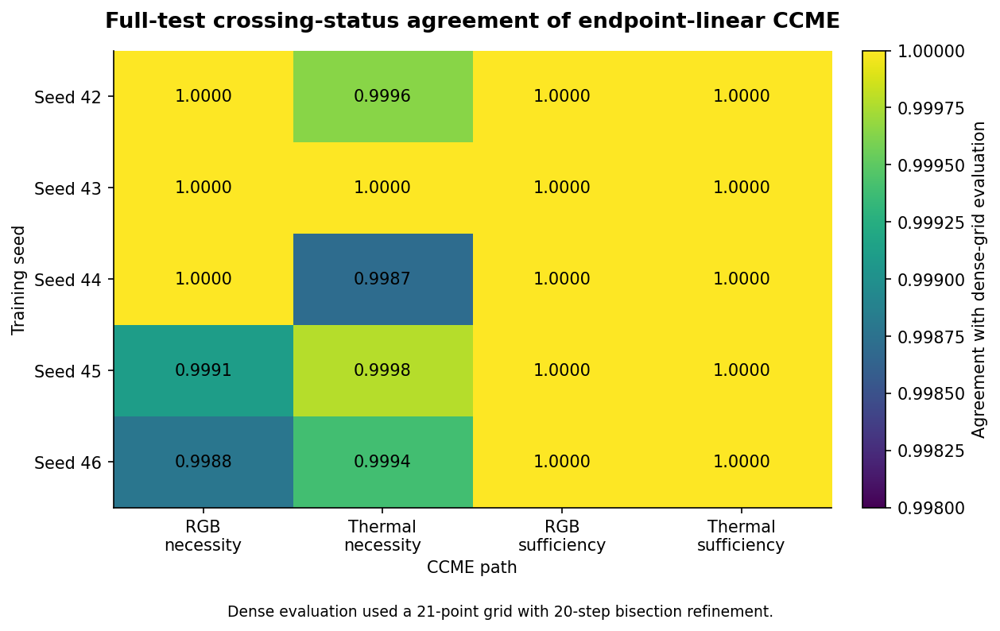

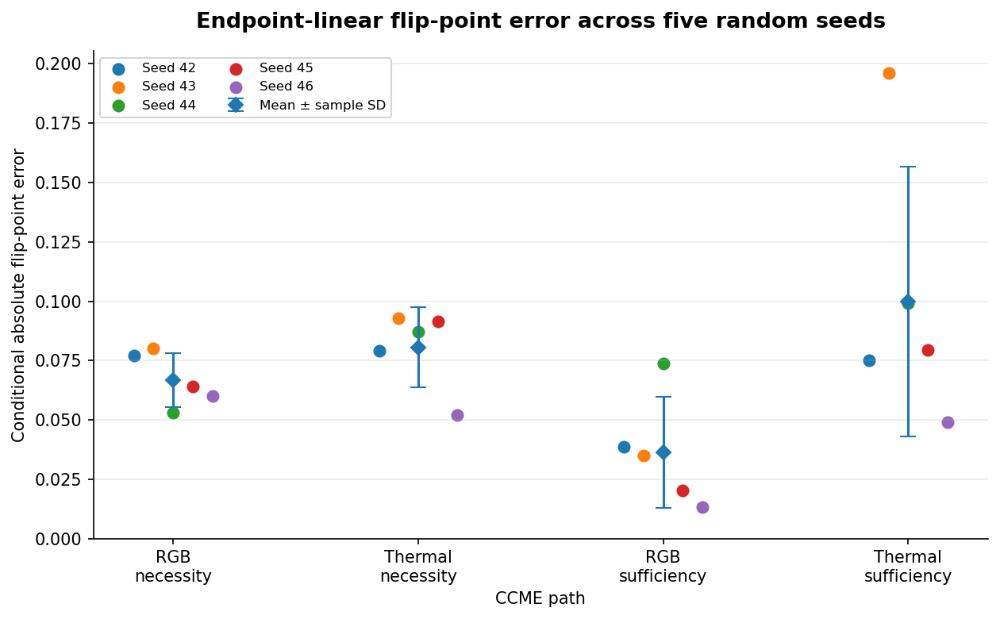

Saved aggregate table:
/Users/mdtohidulislam/Documents/Research/checkpoints/pv_multiseed_42_46/full_test_endpoint_ccme_deterministic_reference/full_test_endpoint_validation/pv_corrected_endpoint_validation_aggregate.csv

Saved agreement figure:
/Users/mdtohidulislam/Documents/Research/figures/pv_multiseed/pv_five_seed_endpoint_status_agreement.pdf

Saved alpha-error figure:
/Users/mdtohidulislam/Documents/Research/figures/pv_multiseed/pv_five_seed_endpoint_alpha_error.pdf


In [ ]:
# FINAL PV ENDPOINT-VALIDATION AGGREGATE + FIGURE

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


VALIDATION_DIR = (
    Path(CKPT_DIR)
    / "pv_multiseed_42_46"
    / "full_test_endpoint_ccme_deterministic_reference"
    / "full_test_endpoint_validation"
)

FIGURE_DIR = (
    Path(FIG_DIR)
    / "pv_multiseed"
)

FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


summary_path = (
    VALIDATION_DIR
    / (
        "pv_five_seed_corrected_full_test_"
        "endpoint_validation_summary.csv"
    )
)

validation_df = pd.read_csv(
    summary_path
)


# 1. Aggregate statistics

total_applicable = int(
    validation_df["n_applicable"].sum()
)

total_matches = int(
    validation_df["status_matches"].sum()
)

total_false_positive = int(
    validation_df[
        "endpoint_false_positive"
    ].sum()
)

total_false_negative = int(
    validation_df[
        "endpoint_false_negative"
    ].sum()
)

overall_agreement = (
    total_matches
    / total_applicable
)


aggregate_rows = []


for analysis in [
    "necessity",
    "sufficiency",
]:
    subset = validation_df[
        validation_df["analysis"]
        == analysis
    ]

    applicable = int(
        subset["n_applicable"].sum()
    )

    matches = int(
        subset["status_matches"].sum()
    )

    aggregate_rows.append({
        "Analysis":
            analysis.capitalize(),

        "Applicable paths":
            applicable,

        "Status matches":
            matches,

        "False positives":
            int(
                subset[
                    "endpoint_false_positive"
                ].sum()
            ),

        "False negatives":
            int(
                subset[
                    "endpoint_false_negative"
                ].sum()
            ),

        "Pooled agreement":
            matches / applicable,

        "Minimum seed-path agreement":
            subset[
                "status_agreement"
            ].min(),

        "Maximum alpha MAE":
            subset[
                "alpha_mae"
            ].max(),

        "Minimum Pearson":
            subset[
                "pearson"
            ].min(),

        "Minimum Spearman":
            subset[
                "spearman"
            ].min(),

        "Maximum multiple-crossing rate":
            subset[
                "multiple_crossing_rate"
            ].max(),
    })


aggregate_rows.append({
    "Analysis":
        "Overall",

    "Applicable paths":
        total_applicable,

    "Status matches":
        total_matches,

    "False positives":
        total_false_positive,

    "False negatives":
        total_false_negative,

    "Pooled agreement":
        overall_agreement,

    "Minimum seed-path agreement":
        validation_df[
            "status_agreement"
        ].min(),

    "Maximum alpha MAE":
        validation_df[
            "alpha_mae"
        ].max(),

    "Minimum Pearson":
        validation_df[
            "pearson"
        ].min(),

    "Minimum Spearman":
        validation_df[
            "spearman"
        ].min(),

    "Maximum multiple-crossing rate":
        validation_df[
            "multiple_crossing_rate"
        ].max(),
})


aggregate_df = pd.DataFrame(
    aggregate_rows
)

aggregate_path = (
    VALIDATION_DIR
    / (
        "pv_corrected_endpoint_validation_"
        "aggregate.csv"
    )
)

aggregate_df.to_csv(
    aggregate_path,
    index=False,
)

display(aggregate_df)


# 2. Prepare figure data

analysis_order = [
    ("necessity", "rgb"),
    ("necessity", "thermal"),
    ("sufficiency", "rgb"),
    ("sufficiency", "thermal"),
]

analysis_labels = [
    "RGB\nnecessity",
    "Thermal\nnecessity",
    "RGB\nsufficiency",
    "Thermal\nsufficiency",
]

seed_order = [
    42,
    43,
    44,
    45,
    46,
]


agreement_matrix = np.empty(
    (
        len(seed_order),
        len(analysis_order),
    ),
    dtype=float,
)

mae_matrix = np.empty_like(
    agreement_matrix
)


for row_index, seed in enumerate(
    seed_order
):
    for column_index, (
        analysis,
        modality,
    ) in enumerate(
        analysis_order
    ):
        selected = validation_df[
            (
                validation_df["seed"]
                == seed
            )
            & (
                validation_df["analysis"]
                == analysis
            )
            & (
                validation_df["modality"]
                == modality
            )
        ]

        assert len(selected) == 1

        agreement_matrix[
            row_index,
            column_index
        ] = selected[
            "status_agreement"
        ].iloc[0]

        mae_matrix[
            row_index,
            column_index
        ] = selected[
            "alpha_mae"
        ].iloc[0]


# 3. Status-agreement heatmap

fig, ax = plt.subplots(
    figsize=(8.5, 5.3)
)

image = ax.imshow(
    agreement_matrix,
    vmin=0.998,
    vmax=1.000,
    aspect="auto",
    cmap="viridis",
)


ax.set_xticks(
    np.arange(
        len(analysis_labels)
    )
)

ax.set_xticklabels(
    analysis_labels,
    fontsize=10,
)

ax.set_yticks(
    np.arange(
        len(seed_order)
    )
)

ax.set_yticklabels(
    [
        f"Seed {seed}"
        for seed in seed_order
    ],
    fontsize=10,
)


for row_index in range(
    agreement_matrix.shape[0]
):
    for column_index in range(
        agreement_matrix.shape[1]
    ):
        value = agreement_matrix[
            row_index,
            column_index
        ]

        ax.text(
            column_index,
            row_index,
            f"{value:.4f}",
            ha="center",
            va="center",
            fontsize=10,
        )


ax.set_title(
    (
        "Full-test crossing-status agreement of "
        "endpoint-linear CCME"
    ),
    fontsize=13,
    fontweight="bold",
    pad=14,
)

ax.set_xlabel(
    "CCME path"
)

ax.set_ylabel(
    "Training seed"
)


colorbar = fig.colorbar(
    image,
    ax=ax,
    fraction=0.046,
    pad=0.04,
)

colorbar.set_label(
    "Agreement with dense-grid evaluation"
)


fig.text(
    0.5,
    0.015,
    (
        "Dense evaluation used a 21-point grid "
        "with 20-step bisection refinement."
    ),
    ha="center",
    fontsize=9,
)


plt.tight_layout(
    rect=[
        0,
        0.05,
        1,
        1,
    ]
)


agreement_pdf = (
    FIGURE_DIR
    / (
        "pv_five_seed_endpoint_"
        "status_agreement.pdf"
    )
)

agreement_png = (
    FIGURE_DIR
    / (
        "pv_five_seed_endpoint_"
        "status_agreement.png"
    )
)

plt.savefig(
    agreement_pdf,
    bbox_inches="tight",
)

plt.savefig(
    agreement_png,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

# 4. Alpha-error variability figure

fig, ax = plt.subplots(
    figsize=(8.5, 5.3)
)


x_positions = np.arange(
    len(analysis_order)
)

offsets = np.linspace(
    -0.16,
    0.16,
    len(seed_order),
)


for seed_index, seed in enumerate(
    seed_order
):
    ax.scatter(
        x_positions
        + offsets[seed_index],
        mae_matrix[
            seed_index,
            :,
        ],
        s=45,
        label=f"Seed {seed}",
    )


mean_mae = mae_matrix.mean(
    axis=0
)

sd_mae = mae_matrix.std(
    axis=0,
    ddof=1,
)


ax.errorbar(
    x_positions,
    mean_mae,
    yerr=sd_mae,
    fmt="D",
    capsize=5,
    linewidth=1.5,
    label="Mean ± sample SD",
)


ax.set_xticks(
    x_positions
)

ax.set_xticklabels(
    analysis_labels,
    fontsize=10,
)

ax.set_ylabel(
    "Conditional absolute flip-point error"
)

ax.set_xlabel(
    "CCME path"
)

ax.set_title(
    (
        "Endpoint-linear flip-point error "
        "across five random seeds"
    ),
    fontsize=13,
    fontweight="bold",
    pad=14,
)

ax.set_ylim(
    bottom=0
)

ax.grid(
    axis="y",
    alpha=0.25,
)

ax.legend(
    fontsize=8,
    ncol=2,
)


plt.tight_layout()


mae_pdf = (
    FIGURE_DIR
    / (
        "pv_five_seed_endpoint_"
        "alpha_error.pdf"
    )
)

mae_png = (
    FIGURE_DIR
    / (
        "pv_five_seed_endpoint_"
        "alpha_error.png"
    )
)

plt.savefig(
    mae_pdf,
    bbox_inches="tight",
)

plt.savefig(
    mae_png,
    dpi=300,
    bbox_inches="tight",
)

plt.show()


print("Saved aggregate table:")
print(aggregate_path.resolve())

print("\nSaved agreement figure:")
print(agreement_pdf.resolve())

print("\nSaved alpha-error figure:")
print(mae_pdf.resolve())

In [64]:
# Search active notebook variables for grid and bisection settings

for name, value in sorted(globals().items()):
    name_lower = name.lower()

    if any(
        term in name_lower
        for term in [
            "grid",
            "alpha",
            "bisection",
            "ccme",
            "refine",
        ]
    ):
        if isinstance(
            value,
            (
                int,
                float,
                str,
                list,
                tuple,
                dict,
                type(None),
            ),
        ):
            text = repr(value)

            if len(text) > 500:
                text = text[:500] + "..."

            print(f"{name} = {text}")

BISECTION_STEPS = 20
GRID_SIZE = 21
alpha_bias = 0.020785692572771745
alpha_mae = 0.04894164421210734
alpha_rmse = 0.07198556828460789
rgb_nec_alpha_mean = 0.5170792393020874
rgb_nec_alpha_median = 0.5288763060248518
rgb_nec_alpha_stats = {'mean': 0.520966217810749, 'median': 0.5321746265623031, 'sd': 0.28374024663620395, 'min': 0.002793159781710004, 'max': 0.9998501906395723}
rgb_suf_alpha_mean = 0.8799625378742157
rgb_suf_alpha_median = 0.904111461152804
rgb_suf_alpha_stats = {'mean': 0.8780933705665549, 'median': 0.9010446649698793, 'sd': 0.09374723095205681, 'min': 0.5753121324410176, 'max': 0.9988550702467642}
th_nec_alpha_mean = 0.5480151834295145
th_nec_alpha_median = 0.5757281852578955
th_nec_alpha_stats = {'mean': 0.5452977466276426, 'median': 0.5719132098213453, 'sd': 0.23550195527505588, 'min': 0.000603400498082678, 'max': 0.9996778899899578}
th_suf_alpha_mean = 0.6564700184350815
th_suf_alpha_median = 0.6377545051715601
th_suf_alpha_stats = {'mean': 0.6576045856805608, 'med

## Primary Seed-42 Model Training

In [18]:
def train_model(model, loaders, epochs=EPOCHS, lr=LR, label_smoothing=0.05):
    """AdamW + CosineAnnealing + label smoothing + grad clipping + early stopping.
    Now with per-epoch checkpointing and resume support."""
    torch.manual_seed(SEED)
    model = model.to(DEVICE)
    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    crit = nn.CrossEntropyLoss(label_smoothing=label_smoothing)
    hist = {"train_loss": [], "val_loss": [], "val_acc": [], "val_auc": []}
    best_auc, patience, bw = 0.0, 0, None
    start_epoch = 0

    resume_path = CKPT_DIR / f"{model.model_name.lower().replace('-', '_')}_resume.pt"
    if resume_path.exists():
        ckpt = torch.load(resume_path, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state"])
        opt.load_state_dict(ckpt["opt_state"])
        sched.load_state_dict(ckpt["sched_state"])
        start_epoch = ckpt["epoch"] + 1
        best_auc = ckpt["best_auc"]
        patience = ckpt["patience"]
        hist = ckpt["hist"]
        if ckpt["best_state"] is not None:
            bw = ckpt["best_state"]
        print(f"  Resuming {model.model_name} from epoch {start_epoch}")

    for epoch in range(start_epoch, epochs):
        model.train()
        tl = 0.0
        for rgb, th, y in loaders["train"]:
            rgb, th, y = rgb.to(DEVICE), th.to(DEVICE), y.to(DEVICE)
            opt.zero_grad()
            loss = crit(model(rgb, th), y)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()
            tl += loss.item()

        model.eval()
        vl, correct, total = 0.0, 0, 0
        probs_all, labels_all = [], []
        with torch.no_grad():
            for rgb, th, y in loaders["val"]:
                rgb, th, y = rgb.to(DEVICE), th.to(DEVICE), y.to(DEVICE)
                out = model(rgb, th)
                vl += crit(out, y).item()
                probs_all.extend(F.softmax(out, dim=1)[:, 1].cpu().numpy())
                labels_all.extend(y.cpu().numpy())
                correct += (out.argmax(1) == y).sum().item()
                total += y.size(0)

        acc = correct / total
        auc = roc_auc_score(labels_all, probs_all) if len(set(labels_all)) > 1 else 0.5
        tl /= len(loaders["train"])
        vl /= len(loaders["val"])
        [hist[k].append(v) for k, v in zip(
            ["train_loss", "val_loss", "val_acc", "val_auc"], [tl, vl, acc, auc]
        )]
        sched.step()

        imp = auc > best_auc
        if imp:
            best_auc, bw, patience = auc, deepcopy(model.state_dict()), 0
        else:
            patience += 1
        print(
            f"[{model.model_name}] {epoch + 1:02d}/{epochs} | "
            f"TL:{tl:.4f} VL:{vl:.4f} Acc:{acc:.3f} AUC:{auc:.3f}"
            + (" ★" if imp else "")
        )

        # Save resumable checkpoint EVERY epoch
        torch.save({
            "epoch": epoch, "best_auc": best_auc, "patience": patience,
            "hist": hist, "model_state": model.state_dict(),
            "opt_state": opt.state_dict(), "sched_state": sched.state_dict(),
            "best_state": bw,
        }, resume_path)

        if patience >= 5:
            print(f"  Early stop")
            break

    if bw:
        model.load_state_dict(bw)
    torch.save(model.state_dict(), CKPT_DIR / f"{model.model_name.lower().replace('-', '_')}.pt")
    resume_path.unlink(missing_ok=True)  # clean up once fully done
    print(f"  Best AUC: {best_auc:.4f}\n")
    return hist

In [24]:
# Train All Four Models
all_histories = {}
for name, model in models_dict.items():
    print(f"\n{'-' * 55}  {name}  {'-' * 55}")
    all_histories[name] = train_model(model, loaders)


-------------------------------------------------------  RGB-Only  -------------------------------------------------------
[RGB-Only] 01/15 | TL:0.5281 VL:0.4325 Acc:0.768 AUC:0.798 ★
[RGB-Only] 02/15 | TL:0.4725 VL:0.4906 Acc:0.755 AUC:0.799 ★
[RGB-Only] 03/15 | TL:0.4473 VL:0.5265 Acc:0.697 AUC:0.799
[RGB-Only] 04/15 | TL:0.4180 VL:0.6014 Acc:0.711 AUC:0.756
[RGB-Only] 05/15 | TL:0.3863 VL:0.4447 Acc:0.815 AUC:0.775
[RGB-Only] 06/15 | TL:0.3546 VL:0.4642 Acc:0.814 AUC:0.735
[RGB-Only] 07/15 | TL:0.3263 VL:0.4540 Acc:0.807 AUC:0.796
  Early stop
  Best AUC: 0.7993


-------------------------------------------------------  Thermal-Only  -------------------------------------------------------
[Thermal-Only] 01/15 | TL:0.4635 VL:0.6257 Acc:0.698 AUC:0.831 ★
[Thermal-Only] 02/15 | TL:0.3858 VL:0.6124 Acc:0.733 AUC:0.868 ★
[Thermal-Only] 03/15 | TL:0.3469 VL:0.4345 Acc:0.811 AUC:0.865
[Thermal-Only] 04/15 | TL:0.3188 VL:0.4353 Acc:0.813 AUC:0.874 ★
[Thermal-Only] 05/15 | TL:0.2941 VL:0.48

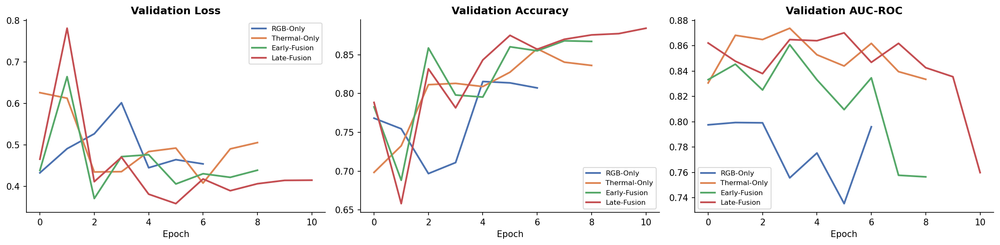

In [25]:
# Training Curves
COLORS = ["#4C72B0", "#DD8452", "#55A868", "#C44E52"]
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, metric, title in zip(
    axes,
    ["val_loss", "val_acc", "val_auc"],
    ["Validation Loss", "Validation Accuracy", "Validation AUC-ROC"],
):
    for (nm, h), c in zip(all_histories.items(), COLORS):
        ax.plot(h[metric], label=nm, color=c, linewidth=2)
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("Epoch")
    ax.legend(fontsize=8)
plt.tight_layout()
plt.savefig(FIG_DIR / "02_training_curves.pdf", bbox_inches="tight")
plt.show()

## Predictive Evaluation

In [26]:
# Evaluate All Models on Test Set
def evaluate_model(model, loader):
    model.eval()
    preds, probs, labels = [], [], []
    with torch.no_grad():
        for rgb, th, y in loader:
            out = model(rgb.to(DEVICE), th.to(DEVICE))
            probs.extend(F.softmax(out, dim=1)[:, 1].cpu().numpy())
            preds.extend(out.argmax(1).cpu().numpy())
            labels.extend(y.numpy())
    return {
        "preds": np.array(preds),
        "probs": np.array(probs),
        "labels": np.array(labels),
    }


eval_results, metrics_table = {}, []
for name, model in models_dict.items():
    res = evaluate_model(model, loaders["test"])
    eval_results[name] = res
    rep = classification_report(
        res["labels"],
        res["preds"],
        target_names=["Normal", "Anomaly"],
        output_dict=True,
    )
    metrics_table.append(
        {
            "Model": name,
            "Accuracy": rep["accuracy"],
            "Precision": rep["Anomaly"]["precision"],
            "Recall": rep["Anomaly"]["recall"],
            "F1": rep["Anomaly"]["f1-score"],
            "AUC-ROC": roc_auc_score(res["labels"], res["probs"]),
            "AP": average_precision_score(res["labels"], res["probs"]),
        }
    )

metrics_df = pd.DataFrame(metrics_table).set_index("Model").round(4)
print("Test Set Performance")
print(metrics_df.to_string())
metrics_df.to_csv(FIG_DIR / "05_test_metrics.csv")

Test Set Performance
              Accuracy  Precision  Recall      F1  AUC-ROC      AP
Model                                                             
RGB-Only        0.7280     0.2224  0.6765  0.3348   0.7857  0.2912
Thermal-Only    0.8476     0.3667  0.6961  0.4804   0.8789  0.5380
Early-Fusion    0.7918     0.2852  0.7020  0.4056   0.8381  0.4754
Late-Fusion     0.8788     0.4342  0.6517  0.5212   0.8829  0.5770


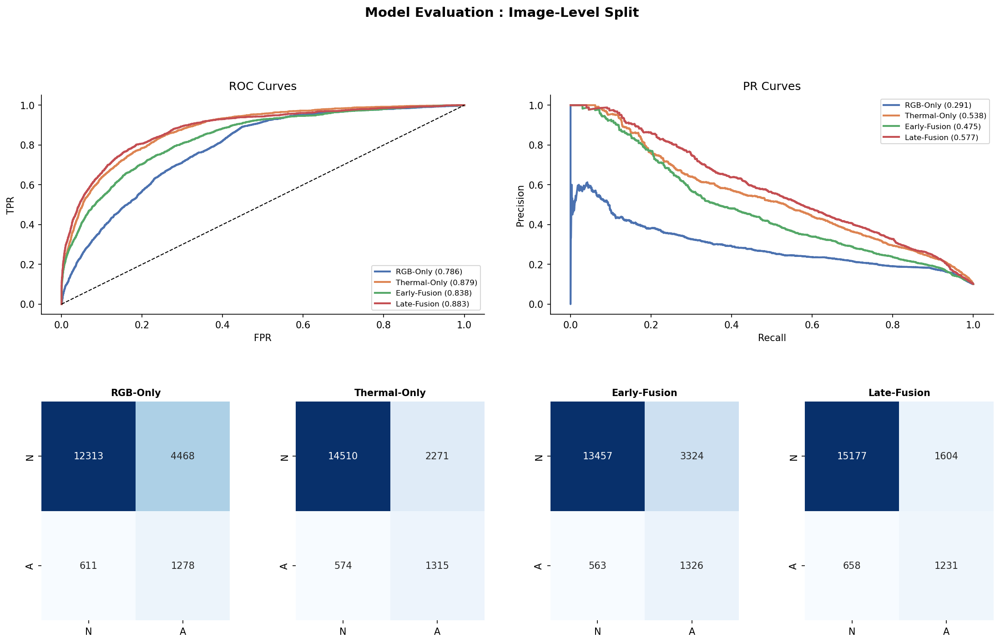

In [27]:
# ROC / PR Curves + Confusion Matrices
fig = plt.figure(figsize=(18, 10))
gs = gridspec.GridSpec(2, 4, figure=fig, hspace=0.4, wspace=0.35)
axr = fig.add_subplot(gs[0, :2])
axp = fig.add_subplot(gs[0, 2:])
cms = [fig.add_subplot(gs[1, i]) for i in range(4)]

for (nm, res), c in zip(eval_results.items(), COLORS):
    fpr, tpr, _ = roc_curve(res["labels"], res["probs"])
    axr.plot(
        fpr,
        tpr,
        color=c,
        lw=2,
        label=f"{nm} ({roc_auc_score(res['labels'], res['probs']):.3f})",
    )
    pr, rec, _ = precision_recall_curve(res["labels"], res["probs"])
    axp.plot(
        rec,
        pr,
        color=c,
        lw=2,
        label=f"{nm} ({average_precision_score(res['labels'], res['probs']):.3f})",
    )

axr.plot([0, 1], [0, 1], "k--", lw=1)
axr.set(title="ROC Curves", xlabel="FPR", ylabel="TPR")
axr.legend(fontsize=8)
axp.set(title="PR Curves", xlabel="Recall", ylabel="Precision")
axp.legend(fontsize=8)

for ax, (nm, res) in zip(cms, eval_results.items()):
    sns.heatmap(
        confusion_matrix(res["labels"], res["preds"]),
        annot=True,
        fmt="d",
        ax=ax,
        cmap="Blues",
        xticklabels=["N", "A"],
        yticklabels=["N", "A"],
        cbar=False,
    )
    ax.set_title(nm, fontsize=10, fontweight="bold")

plt.suptitle(
    "Model Evaluation : Image-Level Split", fontsize=14, fontweight="bold", y=1.01
)
plt.savefig(FIG_DIR / "03_evaluation.pdf", bbox_inches="tight")
plt.show()

## Complementary Seed-42 Explanation Analyses

The following post-hoc analyses use the designated seed-42 Late-Fusion
checkpoint unless otherwise stated. These analyses provide complementary
evidence for the modality-dependence conclusions obtained from CCME.

In [ ]:

# CORRECTED POST-HOC ANALYSIS: SHARED UTILITIES

from pathlib import Path
import json
import random

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F

POSTHOC_SEED = 42
POSTHOC_DIR = FIG_DIR / "corrected_posthoc"
POSTHOC_DIR.mkdir(parents=True, exist_ok=True)

random.seed(POSTHOC_SEED)
np.random.seed(POSTHOC_SEED)
torch.manual_seed(POSTHOC_SEED)

LATE_FUSION_MODEL = models_dict["Late-Fusion"]
LATE_FUSION_MODEL.eval()


# 1. Model forward helpers

def model_logits(model, rgb_t, th_t):
    """
    Returns raw logits for one RGB–thermal sample.

    rgb_t: tensor (3, H, W)
    th_t:  tensor (1, H, W)
    """
    rgb = rgb_t.unsqueeze(0).to(DEVICE)
    th = th_t.unsqueeze(0).to(DEVICE)

    model.eval()
    return _model_forward(model, rgb, th)


def anomaly_probability(model, rgb_t, th_t) -> float:
    """P(anomaly) for one sample."""
    with torch.no_grad():
        logits = model_logits(model, rgb_t, th_t)
        return float(torch.softmax(logits, dim=1)[0, 1].item())


def anomaly_margin(model, rgb_t, th_t) -> float:
    """
    Binary anomaly decision margin:

        anomaly logit - normal logit

    Positive margin => anomaly prediction.
    Negative margin => normal prediction.
    """
    with torch.no_grad():
        logits = model_logits(model, rgb_t, th_t)
        return float((logits[0, 1] - logits[0, 0]).item())


def predicted_label_and_probs(model, rgb_t, th_t):
    """Returns predicted class and two-class probability array."""
    with torch.no_grad():
        logits = model_logits(model, rgb_t, th_t)
        probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()
    return int(np.argmax(probs)), probs

# 2. Representative test-sample table

def build_prediction_table(model, dataset) -> pd.DataFrame:
    """
    Creates a complete test-sample prediction table once.

    This prevents later analyses from repeatedly selecting only the
    highest-confidence true positives.
    """
    rows = []

    for idx in tqdm(range(len(dataset)), desc="Building prediction table"):
        rgb_t, th_t, y = dataset[idx]
        pred, probs = predicted_label_and_probs(model, rgb_t, th_t)

        p_anomaly = float(probs[1])
        predicted_confidence = float(np.max(probs))
        decision_confidence = float(abs(p_anomaly - 0.5))

        if int(y) == 1 and pred == 1:
            category = "TP"
        elif int(y) == 0 and pred == 0:
            category = "TN"
        elif int(y) == 0 and pred == 1:
            category = "FP"
        else:
            category = "FN"

        rows.append(
            {
                "sample_idx": idx,
                "true_label": int(y),
                "pred_label": pred,
                "p_normal": float(probs[0]),
                "p_anomaly": p_anomaly,
                "predicted_confidence": predicted_confidence,
                "decision_confidence": decision_confidence,
                "category": category,
            }
        )

    return pd.DataFrame(rows)


PREDICTION_TABLE_PATH = POSTHOC_DIR / "test_prediction_table.csv"

if PREDICTION_TABLE_PATH.exists():
    prediction_table = pd.read_csv(PREDICTION_TABLE_PATH)
    print("Loaded cached prediction table.")
else:
    prediction_table = build_prediction_table(
        LATE_FUSION_MODEL,
        datasets["test"],
    )
    prediction_table.to_csv(PREDICTION_TABLE_PATH, index=False)
    print("Saved:", PREDICTION_TABLE_PATH)

display(
    prediction_table.groupby("category")
    .agg(
        n=("sample_idx", "size"),
        mean_p_anomaly=("p_anomaly", "mean"),
        mean_confidence=("predicted_confidence", "mean"),
    )
)


# 3. Reproducible representative sampling

def stratified_prediction_sample(
    table: pd.DataFrame,
    n_per_category: int = 10,
    categories=("TP", "TN", "FP", "FN"),
    seed: int = POSTHOC_SEED,
) -> list:
    """
    Samples predictions across outcome categories and confidence levels.

    Within each category, examples are divided into confidence terciles
    and sampled reproducibly from low, medium, and high confidence.
    """
    rng = np.random.default_rng(seed)
    selected = []

    for category in categories:
        sub = table[table["category"] == category].copy()

        if sub.empty:
            continue

        n_take = min(n_per_category, len(sub))

        if len(sub) >= 3:
            try:
                sub["confidence_bin"] = pd.qcut(
                    sub["predicted_confidence"],
                    q=3,
                    labels=["low", "medium", "high"],
                    duplicates="drop",
                )
            except ValueError:
                sub["confidence_bin"] = "all"
        else:
            sub["confidence_bin"] = "all"

        bins = list(sub["confidence_bin"].dropna().unique())
        base_n = max(1, n_take // max(len(bins), 1))

        chosen = []

        for confidence_bin in bins:
            bin_sub = sub[sub["confidence_bin"] == confidence_bin]
            k = min(base_n, len(bin_sub))

            if k > 0:
                chosen.extend(
                    rng.choice(
                        bin_sub["sample_idx"].to_numpy(),
                        size=k,
                        replace=False,
                    ).tolist()
                )

        remaining = n_take - len(chosen)

        if remaining > 0:
            available = sub[
                ~sub["sample_idx"].isin(chosen)
            ]["sample_idx"].to_numpy()

            if len(available) > 0:
                chosen.extend(
                    rng.choice(
                        available,
                        size=min(remaining, len(available)),
                        replace=False,
                    ).tolist()
                )

        selected.extend(chosen[:n_take])

    return [int(x) for x in selected]


REPRESENTATIVE_TEST_IDXS = stratified_prediction_sample(
    prediction_table,
    n_per_category=10,
)

print(
    f"Representative post-hoc sample: "
    f"{len(REPRESENTATIVE_TEST_IDXS)} test examples"
)

display(
    prediction_table[
        prediction_table["sample_idx"].isin(REPRESENTATIVE_TEST_IDXS)
    ]
    .sort_values(["category", "predicted_confidence"])
)

# 4. Training-normal sample selection

def select_normal_indices(
    dataset,
    n_samples: int = 200,
    seed: int = POSTHOC_SEED,
) -> list:
    """
    Selects normal examples from the TRAINING partition only.

    Uses a fixed random seed rather than taking the first normal samples.
    """
    normal_indices = [
        i
        for i in range(len(dataset))
        if int(dataset[i][2]) == 0
    ]

    if not normal_indices:
        raise ValueError("No normal samples found in the supplied dataset.")

    rng = np.random.default_rng(seed)

    n_take = min(n_samples, len(normal_indices))

    return [
        int(x)
        for x in rng.choice(
            np.asarray(normal_indices),
            size=n_take,
            replace=False,
        )
    ]


TRAIN_NORMAL_IDXS = select_normal_indices(
    datasets["train"],
    n_samples=200,
)

print(
    f"Selected {len(TRAIN_NORMAL_IDXS)} training-normal samples "
    "for post-hoc baselines."
)


# 5. Training-derived pixel baselines

def build_pixel_baselines(dataset, indices):
    """
    Mean normalized RGB and thermal tensors from representative
    normal TRAINING samples.
    """
    rgb_stack = []
    th_stack = []

    for idx in tqdm(indices, desc="Building pixel baselines"):
        rgb_t, th_t, y = dataset[idx]

        if int(y) != 0:
            raise ValueError(
                f"Baseline index {idx} is not a normal sample."
            )

        rgb_stack.append(rgb_t.detach().cpu())
        th_stack.append(th_t.detach().cpu())

    rgb_baseline = torch.stack(rgb_stack).mean(dim=0)
    th_baseline = torch.stack(th_stack).mean(dim=0)

    return rgb_baseline, th_baseline


TRAIN_RGB_PIXEL_BASELINE, TRAIN_TH_PIXEL_BASELINE = (
    build_pixel_baselines(
        datasets["train"],
        TRAIN_NORMAL_IDXS,
    )
)

print(
    "Pixel baselines:",
    tuple(TRAIN_RGB_PIXEL_BASELINE.shape),
    tuple(TRAIN_TH_PIXEL_BASELINE.shape),
)


# 6. Late-fusion embedding extraction

def extract_lf_embeddings(model, rgb_t, th_t):
    """
    Extracts the 512-dimensional RGB and thermal embeddings before fusion.
    """
    model.eval()

    with torch.no_grad():
        rgb = rgb_t.unsqueeze(0).to(DEVICE)
        th = th_t.unsqueeze(0).to(DEVICE)

        rgb_embedding = (
            model.rgb_backbone(rgb)
            .squeeze(0)
            .detach()
            .cpu()
            .numpy()
            .astype(np.float32)
        )

        th_embedding = (
            model.th_backbone(th)
            .squeeze(0)
            .detach()
            .cpu()
            .numpy()
            .astype(np.float32)
        )

    return rgb_embedding, th_embedding


def build_embedding_baselines(model, dataset, indices):
    """
    Mean late-fusion embeddings from representative normal
    TRAINING samples.
    """
    rgb_embeddings = []
    th_embeddings = []

    for idx in tqdm(indices, desc="Building embedding baselines"):
        rgb_t, th_t, y = dataset[idx]

        if int(y) != 0:
            raise ValueError(
                f"Embedding baseline index {idx} is not normal."
            )

        rgb_emb, th_emb = extract_lf_embeddings(
            model,
            rgb_t,
            th_t,
        )

        rgb_embeddings.append(rgb_emb)
        th_embeddings.append(th_emb)

    rgb_baseline = np.mean(
        np.stack(rgb_embeddings),
        axis=0,
    ).astype(np.float32)

    th_baseline = np.mean(
        np.stack(th_embeddings),
        axis=0,
    ).astype(np.float32)

    return rgb_baseline, th_baseline


TRAIN_RGB_EMBED_BASELINE, TRAIN_TH_EMBED_BASELINE = (
    build_embedding_baselines(
        LATE_FUSION_MODEL,
        datasets["train"],
        TRAIN_NORMAL_IDXS,
    )
)

print(
    "Embedding baselines:",
    TRAIN_RGB_EMBED_BASELINE.shape,
    TRAIN_TH_EMBED_BASELINE.shape,
)

# 7. Shared map normalization and equal-area binarization

def normalize_map(attr_map: np.ndarray) -> np.ndarray:
    """
    Safely normalizes a 2D attribution map to [0, 1].

    Degenerate maps return all zeros.
    """
    arr = np.asarray(attr_map, dtype=np.float32)

    if arr.ndim != 2:
        raise ValueError(
            f"Expected a 2D attribution map, got shape {arr.shape}"
        )

    finite = np.isfinite(arr)

    if not finite.any():
        return np.zeros_like(arr, dtype=np.float32)

    arr = np.nan_to_num(
        arr,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )

    lo = float(arr.min())
    hi = float(arr.max())

    if hi - lo <= 1e-12:
        return np.zeros_like(arr, dtype=np.float32)

    return ((arr - lo) / (hi - lo)).astype(np.float32)


def binarize_top_fraction(
    attr_map: np.ndarray,
    top_fraction: float = 0.20,
) -> np.ndarray:
    """
    Selects the highest-attribution fraction of pixels.

    Equal-area binarization makes IoU comparisons less sensitive
    to method-specific attribution scales.
    """
    if not 0 < top_fraction < 1:
        raise ValueError("top_fraction must be between 0 and 1.")

    arr = normalize_map(attr_map)

    if arr.max() <= 0:
        return np.zeros_like(arr, dtype=np.uint8)

    threshold = np.quantile(
        arr,
        1.0 - top_fraction,
    )

    return (arr >= threshold).astype(np.uint8)


def binary_iou(mask_a, mask_b) -> float:
    a = np.asarray(mask_a).astype(bool)
    b = np.asarray(mask_b).astype(bool)

    intersection = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()

    if union == 0:
        return np.nan

    return float(intersection / union)


print("\nCorrected shared post-hoc utilities are ready.")

Building prediction table:   0%|          | 0/18670 [00:00<?, ?it/s]

Saved: figures/corrected_posthoc/test_prediction_table.csv


,n,mean_p_anomaly,mean_confidence
category,,,
FN,658,0.172734,0.827266
FP,1604,0.762043,0.762043
TN,15177,0.059688,0.940312
TP,1231,0.865607,0.865607


Representative post-hoc sample: 40 test examples


,sample_idx,true_label,pred_label,p_normal,p_anomaly,predicted_confidence,decision_confidence,category
17215,17215,1,0,0.529753,0.470247,0.529753,0.029753,FN
17815,17815,1,0,0.606091,0.393909,0.606091,0.106091,FN
13850,13850,1,0,0.662731,0.337269,0.662731,0.162731,FN
13300,13300,1,0,0.668355,0.331644,0.668355,0.168356,FN
399,399,1,0,0.867326,0.132674,0.867326,0.367326,FN
8157,8157,1,0,0.887585,0.112415,0.887585,0.387585,FN
7788,7788,1,0,0.934742,0.065258,0.934742,0.434742,FN
7341,7341,1,0,0.953116,0.046884,0.953116,0.453116,FN
8529,8529,1,0,0.956919,0.043081,0.956919,0.456919,FN
7878,7878,1,0,0.977467,0.022533,0.977467,0.477467,FN


Selected 200 training-normal samples for post-hoc baselines.


Building pixel baselines:   0%|          | 0/200 [00:00<?, ?it/s]

Pixel baselines: (3, 224, 224) (1, 224, 224)


Building embedding baselines:   0%|          | 0/200 [00:00<?, ?it/s]

Embedding baselines: (512,) (512,)

Corrected shared post-hoc utilities are ready.


Grad-CAM visualization indices: [3448, 7416, 14696, 8157]


,sample_idx,category,true_label,pred_label,p_anomaly,predicted_confidence
8157,8157,FN,1,0,0.112415,0.887585
14696,14696,FP,0,1,0.779537,0.779537
7416,7416,TN,0,0,0.022369,0.977631
3448,3448,TP,1,1,0.914708,0.914708


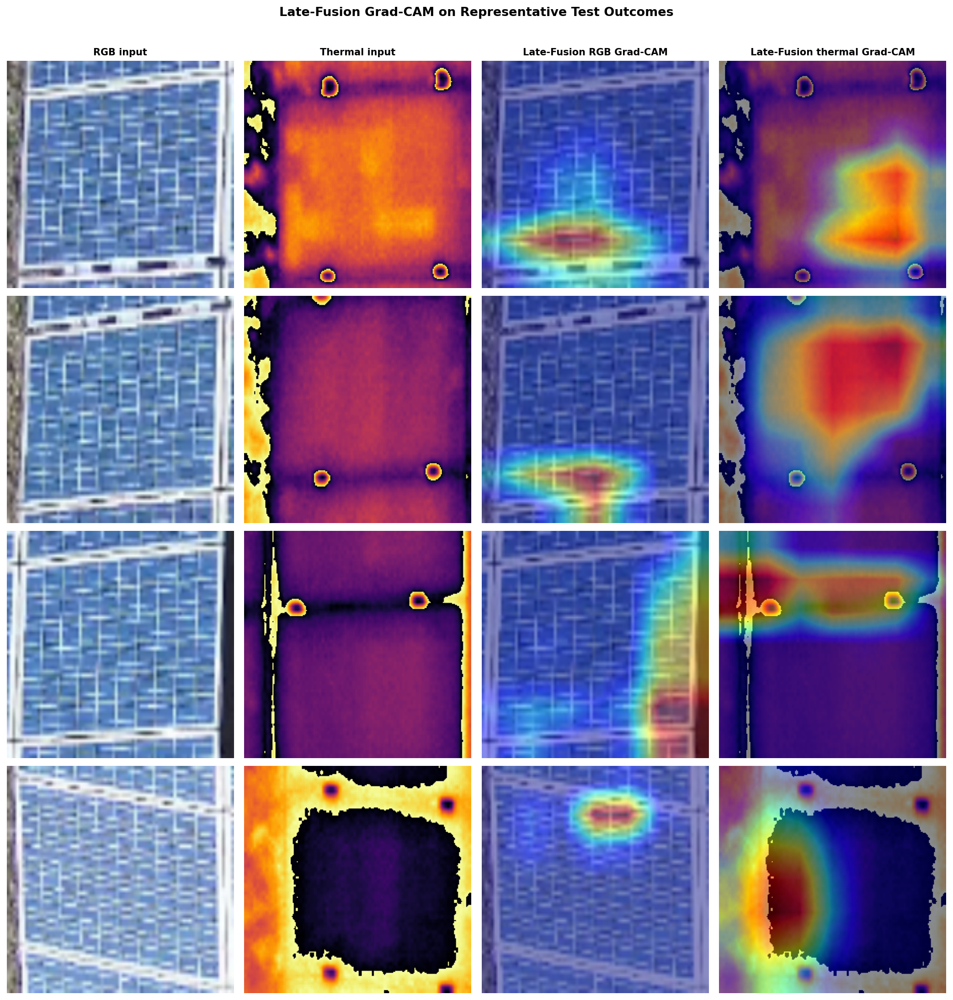

Saved: figures/corrected_posthoc/07_gradcam_corrected.pdf


Grad-CAM faithfulness:   0%|          | 0/40 [00:00<?, ?it/s]


Corrected Grad-CAM faithfulness (target-class logit margin)


N  DeletionDropMean  DeletionDropMedian  \
modality category                                             
rgb      FN         9          0.284472            0.288627   
         FP        10          0.384901            0.319406   
         TN        10          0.347235            0.299778   
         TP        10          0.537567            0.390717   
thermal  FN        10          0.463366            0.151108   
         FP        10          3.541487            3.661017   
         TN        10          1.020799            0.623918   
         TP        10          2.301374            2.040065   

                   InsertionGainMean  InsertionFractionMedian  
modality category                                              
rgb      FN                -2.786897                 0.839008  
         FP                 4.758429                 0.967775  
         TN                -1.378103                 0.892380  
         TP                 4.822944                 0.889922  
thermal  FN                -1.340721                 0.320600  
         FP                 1.227535                 0.181259  
         TN                -0.840773                -0.000475  
         TP                 1.806094                 0.181850

Saved: figures/corrected_posthoc/07_gradcam_faith_corrected.csv


Grad-CAM randomization sanity:   0%|          | 0/40 [00:00<?, ?it/s]


Grad-CAM full-model randomization sanity check
Lower similarity is preferred. Degenerate maps are reported separately, not converted to zero.


,N,NValid,PearsonMean,SpearmanMean,SSIMMean,DegenerateRandomizedMaps
modality,,,,,,
rgb,40,39,0.004230,0.049778,0.250041,1
thermal,40,16,-0.020367,-0.057643,0.429210,24


Saved: figures/corrected_posthoc/07_gradcam_sanity_corrected.csv

Corrected Grad-CAM analysis complete.


In [ ]:

# GRAD-CAM ANALYSIS

from copy import deepcopy
from scipy.stats import pearsonr, spearmanr
from skimage.metrics import structural_similarity as structural_similarity

# 1. Basic checks and Grad-CAM map wrapper

if "compute_gradcam" not in globals():
    raise NameError(
        "compute_gradcam() was not found. Keep your existing Grad-CAM "
        "implementation cell above this corrected analysis section."
    )


def get_gradcam_map_corrected(
    model,
    rgb_t,
    th_t,
    modality,
    class_idx,
):
    """
    Generate a normalized Grad-CAM map for one modality.

    Returns
    -------
    np.ndarray
        Map with shape (IMG_SIZE, IMG_SIZE), normalized to [0, 1].
    """
    cam = compute_gradcam(
        model,
        rgb_t,
        th_t,
        modality=modality,
        class_idx=class_idx,
    )

    cam = cv2.resize(
        np.asarray(cam, dtype=np.float32),
        (IMG_SIZE, IMG_SIZE),
        interpolation=cv2.INTER_LINEAR,
    )

    return normalize_map(cam)


# 2. Target-class score helpers

def target_logit_margin(
    model,
    rgb_t,
    th_t,
    target_class,
) -> float:
    """
    Margin supporting the selected target class.

    For target_class=1:
        anomaly logit - normal logit

    For target_class=0:
        normal logit - anomaly logit
    """
    with torch.no_grad():
        logits = model_logits(
            model,
            rgb_t,
            th_t,
        )[0]

    other_class = 1 - int(target_class)

    return float(
        (
            logits[int(target_class)]
            - logits[other_class]
        ).item()
    )


def apply_attribution_mask(
    rgb_t,
    th_t,
    binary_mask,
    modality,
    mode,
):
    """
    Apply a fixed attribution mask using training-normal pixel baselines.

    mode="deletion"
        Replace the selected high-attribution region with its
        training-normal baseline.

    mode="insertion"
        Start from the full training-normal baseline and insert only
        the selected high-attribution region.

    The untested modality remains factual.
    """
    if mode not in {"deletion", "insertion"}:
        raise ValueError("mode must be 'deletion' or 'insertion'.")

    mask_np = cv2.resize(
        binary_mask.astype(np.uint8),
        (rgb_t.shape[-1], rgb_t.shape[-2]),
        interpolation=cv2.INTER_NEAREST,
    )

    mask = torch.from_numpy(mask_np).float()

    rgb_new = rgb_t.clone()
    th_new = th_t.clone()

    if modality == "rgb":
        m = mask.unsqueeze(0).repeat(3, 1, 1)

        baseline = TRAIN_RGB_PIXEL_BASELINE.to(
            dtype=rgb_t.dtype
        )

        if mode == "deletion":
            rgb_new = (
                rgb_t * (1.0 - m)
                + baseline * m
            )
        else:
            rgb_new = (
                baseline * (1.0 - m)
                + rgb_t * m
            )

    elif modality == "thermal":
        m = mask.unsqueeze(0)

        baseline = TRAIN_TH_PIXEL_BASELINE.to(
            dtype=th_t.dtype
        )

        if mode == "deletion":
            th_new = (
                th_t * (1.0 - m)
                + baseline * m
            )
        else:
            th_new = (
                baseline * (1.0 - m)
                + th_t * m
            )

    else:
        raise ValueError(
            "modality must be 'rgb' or 'thermal'."
        )

    return rgb_new, th_new


# 3. Select representative visualization examples

def select_one_per_prediction_category(
    prediction_df,
    categories=("TP", "TN", "FP", "FN"),
    seed=POSTHOC_SEED,
):
    """
    Select one reproducible, moderately confident sample from each
    prediction category.

    The median-confidence example is preferred over an extreme case.
    """
    selected = []

    for category in categories:
        sub = prediction_df[
            prediction_df["category"] == category
        ].copy()

        if sub.empty:
            continue

        sub = sub.sort_values(
            "predicted_confidence"
        ).reset_index(drop=True)

        median_position = len(sub) // 2

        selected.append(
            int(
                sub.loc[
                    median_position,
                    "sample_idx",
                ]
            )
        )

    return selected


GRADCAM_VIS_IDXS = select_one_per_prediction_category(
    prediction_table
)

print(
    "Grad-CAM visualization indices:",
    GRADCAM_VIS_IDXS,
)

display(
    prediction_table[
        prediction_table["sample_idx"].isin(
            GRADCAM_VIS_IDXS
        )
    ][
        [
            "sample_idx",
            "category",
            "true_label",
            "pred_label",
            "p_anomaly",
            "predicted_confidence",
        ]
    ].sort_values("category")
)


# 4. Corrected Grad-CAM visualization

def visualize_corrected_gradcam(
    model,
    dataset,
    sample_indices,
    save_name="07_gradcam_corrected.pdf",
):
    """
    Display factual RGB, factual thermal, RGB-branch Grad-CAM,
    and thermal-branch Grad-CAM for representative samples.
    """
    n_rows = len(sample_indices)

    if n_rows == 0:
        print("No Grad-CAM visualization samples.")
        return

    fig, axes = plt.subplots(
        n_rows,
        4,
        figsize=(14, 3.6 * n_rows),
    )

    if n_rows == 1:
        axes = axes[None, :]

    titles = [
        "RGB input",
        "Thermal input",
        "Late-Fusion RGB Grad-CAM",
        "Late-Fusion thermal Grad-CAM",
    ]

    for ax, title in zip(
        axes[0],
        titles,
    ):
        ax.set_title(
            title,
            fontsize=10,
            fontweight="bold",
        )

    for row, idx in enumerate(sample_indices):
        rgb_t, th_t, y = dataset[idx]

        pred_row = prediction_table[
            prediction_table["sample_idx"] == idx
        ].iloc[0]

        pred_class = int(
            pred_row["pred_label"]
        )

        rgb_cam = get_gradcam_map_corrected(
            model,
            rgb_t,
            th_t,
            modality="rgb",
            class_idx=pred_class,
        )

        th_cam = get_gradcam_map_corrected(
            model,
            rgb_t,
            th_t,
            modality="thermal",
            class_idx=pred_class,
        )

        rgb_display = denormalize_rgb(
            rgb_t
        )

        thermal_display = thermal_to_display(
            th_t
        )

        axes[row, 0].imshow(
            rgb_display
        )

        axes[row, 1].imshow(
            thermal_display,
            cmap="inferno",
        )

        axes[row, 2].imshow(
            rgb_display
        )
        axes[row, 2].imshow(
            rgb_cam,
            cmap="jet",
            alpha=0.45,
        )

        axes[row, 3].imshow(
            thermal_display,
            cmap="inferno",
        )
        axes[row, 3].imshow(
            th_cam,
            cmap="jet",
            alpha=0.45,
        )

        axes[row, 0].set_ylabel(
            (
                f"Idx {idx}\n"
                f"{pred_row['category']}\n"
                f"Y={int(y)}, Ŷ={pred_class}\n"
                f"P(A)={pred_row['p_anomaly']:.3f}"
            ),
            fontsize=8,
        )

    for ax in axes.flat:
        ax.axis("off")

    plt.suptitle(
        "Late-Fusion Grad-CAM on Representative Test Outcomes",
        fontsize=13,
        fontweight="bold",
        y=1.01,
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print("Saved:", output_path)


visualize_corrected_gradcam(
    LATE_FUSION_MODEL,
    datasets["test"],
    GRADCAM_VIS_IDXS,
)

# 5. Fixed-area Grad-CAM faithfulness

def evaluate_gradcam_faithfulness_corrected(
    model,
    dataset,
    sample_indices,
    top_fraction=0.20,
    save_name="07_gradcam_faith_corrected.csv",
):
    """
    Evaluate Grad-CAM faithfulness using target-class logit margins.

    Metrics
    -------
    deletion_drop
        Original target margin minus target margin after replacing
        the top-attribution region with a training-normal baseline.
        Larger positive values are better.

    insertion_gain
        Target margin after inserting the top-attribution region into
        the baseline minus the full-baseline target margin.
        Larger positive values are better.

    insertion_fraction
        Fraction of the original baseline-to-factual target-margin
        change recovered by the inserted region.
    """
    rows = []

    for idx in tqdm(
        sample_indices,
        desc="Grad-CAM faithfulness",
    ):
        rgb_t, th_t, y = dataset[idx]

        pred_row = prediction_table[
            prediction_table["sample_idx"] == idx
        ].iloc[0]

        target_class = int(
            pred_row["pred_label"]
        )

        original_margin = target_logit_margin(
            model,
            rgb_t,
            th_t,
            target_class,
        )

        full_rgb_baseline = (
            TRAIN_RGB_PIXEL_BASELINE.clone()
        )

        full_th_baseline = (
            TRAIN_TH_PIXEL_BASELINE.clone()
        )

        baseline_margin = target_logit_margin(
            model,
            full_rgb_baseline,
            full_th_baseline,
            target_class,
        )

        total_available_change = (
            original_margin
            - baseline_margin
        )

        for modality in [
            "rgb",
            "thermal",
        ]:
            cam = get_gradcam_map_corrected(
                model,
                rgb_t,
                th_t,
                modality=modality,
                class_idx=target_class,
            )

            binary_mask = binarize_top_fraction(
                cam,
                top_fraction=top_fraction,
            )

            if binary_mask.sum() == 0:
                rows.append(
                    {
                        "sample_idx": idx,
                        "category": pred_row["category"],
                        "target_class": target_class,
                        "modality": modality,
                        "valid_map": False,
                        "original_margin": original_margin,
                        "baseline_margin": baseline_margin,
                        "deletion_margin": np.nan,
                        "insertion_margin": np.nan,
                        "deletion_drop": np.nan,
                        "insertion_gain": np.nan,
                        "insertion_fraction": np.nan,
                    }
                )
                continue

            rgb_deleted, th_deleted = (
                apply_attribution_mask(
                    rgb_t,
                    th_t,
                    binary_mask,
                    modality,
                    mode="deletion",
                )
            )

            rgb_inserted, th_inserted = (
                apply_attribution_mask(
                    rgb_t,
                    th_t,
                    binary_mask,
                    modality,
                    mode="insertion",
                )
            )

            deletion_margin = target_logit_margin(
                model,
                rgb_deleted,
                th_deleted,
                target_class,
            )

            insertion_margin = target_logit_margin(
                model,
                rgb_inserted,
                th_inserted,
                target_class,
            )

            deletion_drop = (
                original_margin
                - deletion_margin
            )

            insertion_gain = (
                insertion_margin
                - baseline_margin
            )

            if abs(
                total_available_change
            ) > 1e-8:
                insertion_fraction = (
                    insertion_gain
                    / total_available_change
                )
            else:
                insertion_fraction = np.nan

            rows.append(
                {
                    "sample_idx": idx,
                    "category": pred_row["category"],
                    "target_class": target_class,
                    "modality": modality,
                    "valid_map": True,
                    "original_margin": original_margin,
                    "baseline_margin": baseline_margin,
                    "deletion_margin": deletion_margin,
                    "insertion_margin": insertion_margin,
                    "deletion_drop": deletion_drop,
                    "insertion_gain": insertion_gain,
                    "insertion_fraction": insertion_fraction,
                }
            )

    faith_df = pd.DataFrame(rows)

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    faith_df.to_csv(
        output_path,
        index=False,
    )

    summary = (
        faith_df[
            faith_df["valid_map"]
        ]
        .groupby(
            [
                "modality",
                "category",
            ]
        )
        .agg(
            N=("sample_idx", "size"),
            DeletionDropMean=(
                "deletion_drop",
                "mean",
            ),
            DeletionDropMedian=(
                "deletion_drop",
                "median",
            ),
            InsertionGainMean=(
                "insertion_gain",
                "mean",
            ),
            InsertionFractionMedian=(
                "insertion_fraction",
                "median",
            ),
        )
    )

    print(
        "\nCorrected Grad-CAM faithfulness "
        "(target-class logit margin)"
    )

    display(summary)

    print("Saved:", output_path)

    return faith_df


gradcam_faith_corrected = (
    evaluate_gradcam_faithfulness_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
        top_fraction=0.20,
    )
)


# 6. Full-model randomization sanity check

def reset_module_parameters(module):
    """
    Reinitialize trainable modules using their native reset method.
    """
    if hasattr(
        module,
        "reset_parameters",
    ):
        try:
            module.reset_parameters()
        except Exception:
            pass


def make_fully_randomized_copy(
    trained_model,
    seed=POSTHOC_SEED,
):
    """
    Create a fully randomized copy of the same architecture.

    This is a basic parameter-randomization sanity test.
    """
    torch.manual_seed(seed)

    randomized = deepcopy(
        trained_model
    ).to(DEVICE)

    randomized.apply(
        reset_module_parameters
    )

    randomized.eval()

    return randomized


def safe_map_similarity(
    original_map,
    randomized_map,
):
    """
    Compute similarity only when both maps contain usable variation.
    """
    a = normalize_map(
        original_map
    )

    b = normalize_map(
        randomized_map
    )

    std_a = float(
        a.std()
    )

    std_b = float(
        b.std()
    )

    valid = (
        std_a > 1e-8
        and std_b > 1e-8
    )

    if not valid:
        return {
            "valid": False,
            "pearson": np.nan,
            "spearman": np.nan,
            "ssim": np.nan,
            "std_original": std_a,
            "std_randomized": std_b,
        }

    pearson_value = pearsonr(
        a.ravel(),
        b.ravel(),
    )[0]

    spearman_value = spearmanr(
        a.ravel(),
        b.ravel(),
    )[0]

    ssim_value = structural_similarity(
        a,
        b,
        data_range=1.0,
    )

    return {
        "valid": True,
        "pearson": float(
            pearson_value
        ),
        "spearman": float(
            spearman_value
        ),
        "ssim": float(
            ssim_value
        ),
        "std_original": std_a,
        "std_randomized": std_b,
    }


def evaluate_gradcam_randomization_corrected(
    trained_model,
    dataset,
    sample_indices,
    save_name="07_gradcam_sanity_corrected.csv",
):
    """
    Compare trained-model Grad-CAM maps with maps from a fully
    randomized copy of the same architecture.

    Low trained-vs-randomized similarity is desired.
    """
    randomized_model = (
        make_fully_randomized_copy(
            trained_model
        )
    )

    rows = []

    for idx in tqdm(
        sample_indices,
        desc="Grad-CAM randomization sanity",
    ):
        rgb_t, th_t, y = dataset[idx]

        pred_row = prediction_table[
            prediction_table["sample_idx"] == idx
        ].iloc[0]

        target_class = int(
            pred_row["pred_label"]
        )

        for modality in [
            "rgb",
            "thermal",
        ]:
            trained_cam = (
                get_gradcam_map_corrected(
                    trained_model,
                    rgb_t,
                    th_t,
                    modality,
                    target_class,
                )
            )

            randomized_cam = (
                get_gradcam_map_corrected(
                    randomized_model,
                    rgb_t,
                    th_t,
                    modality,
                    target_class,
                )
            )

            metrics = safe_map_similarity(
                trained_cam,
                randomized_cam,
            )

            rows.append(
                {
                    "sample_idx": idx,
                    "category": pred_row["category"],
                    "target_class": target_class,
                    "modality": modality,
                    **metrics,
                }
            )

    sanity_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    sanity_df.to_csv(
        output_path,
        index=False,
    )

    summary = (
        sanity_df.groupby(
            "modality"
        )
        .agg(
            N=("sample_idx", "size"),
            NValid=("valid", "sum"),
            PearsonMean=(
                "pearson",
                "mean",
            ),
            SpearmanMean=(
                "spearman",
                "mean",
            ),
            SSIMMean=(
                "ssim",
                "mean",
            ),
            DegenerateRandomizedMaps=(
                "valid",
                lambda x: int(
                    (~x).sum()
                ),
            ),
        )
    )

    print(
        "\nGrad-CAM full-model randomization sanity check"
    )

    print(
        "Lower similarity is preferred. "
        "Degenerate maps are reported separately, not converted to zero."
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return sanity_df


gradcam_sanity_corrected = (
    evaluate_gradcam_randomization_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
    )
)

# 7. Save a compact Grad-CAM provenance record

gradcam_metadata = {
    "model": "Late-Fusion",
    "sample_design": (
        "Representative TP/TN/FP/FN sample "
        "stratified across confidence"
    ),
    "n_faithfulness_samples": int(
        len(
            set(
                gradcam_faith_corrected[
                    "sample_idx"
                ]
            )
        )
    ),
    "faithfulness_target": (
        "Predicted-class logit margin"
    ),
    "mask_top_fraction": 0.20,
    "deletion_baseline": (
        "Training-normal mean pixel tensor"
    ),
    "insertion_baseline": (
        "Training-normal mean pixel tensor"
    ),
    "sanity_test": (
        "Full-model parameter randomization"
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "07_gradcam_metadata.json",
    "w",
) as f:
    json.dump(
        gradcam_metadata,
        f,
        indent=2,
    )

print(
    "\nCorrected Grad-CAM analysis complete."
)

IG completeness:   0%|          | 0/40 [00:00<?, ?it/s]


Joint IG completeness summary


,Value
N,40.000000
Median absolute error,0.007736
Mean absolute error,0.011884
95th percentile absolute error,0.037514
Median relative error,0.002622
Mean relative error,0.278508
Proportion relative error <= 5%,0.950000
Proportion relative error <= 10%,0.950000



Completeness by prediction category


,N,MedianAbsError,MedianRelError,MeanRGBContribution,MeanThermalContribution
category,,,,,
FN,10,0.005045,0.002102,0.407454,-2.338046
FP,10,0.011679,0.002120,0.035995,5.081310
TN,10,0.007822,0.010667,0.566825,-1.187604
TP,10,0.010125,0.001707,0.899237,4.900135


Saved: figures/corrected_posthoc/08_ig_completeness_corrected.csv


IG step convergence:   0%|          | 0/8 [00:00<?, ?it/s]


IG numerical convergence by step count


,N,MedianAbsoluteError,MeanAbsoluteError,MedianRelativeError
steps,,,,
25,8,0.062231,0.064072,0.011055
50,8,0.019685,0.026139,0.003750
100,8,0.008961,0.011727,0.001707
200,8,0.003616,0.006561,0.000727


Saved: figures/corrected_posthoc/08_ig_step_convergence.csv


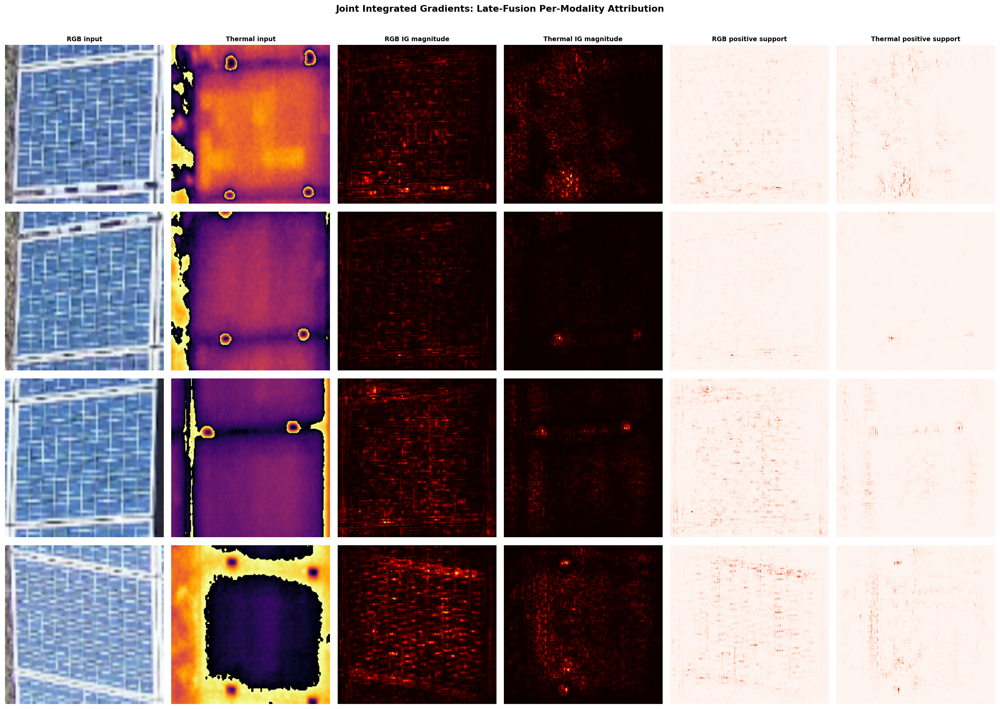

Saved: figures/corrected_posthoc/08_ig_corrected.pdf


IG faithfulness:   0%|          | 0/40 [00:00<?, ?it/s]


Corrected IG faithfulness (target-class logit margin)


N  DeletionDropMean  DeletionDropMedian  \
modality category                                             
rgb      FN        10          2.244900            1.993487   
         FP        10          1.616004            1.648603   
         TN        10          1.474472            1.370906   
         TP        10          1.588109            1.330550   
thermal  FN        10         -2.305941           -2.117152   
         FP        10          5.030575            4.843574   
         TN        10         -0.386451            0.058965   
         TP        10          5.746235            5.703334   

                   InsertionGainMean  InsertionFractionMedian  
modality category                                              
rgb      FN                -1.092450                 0.466194  
         FP                 6.246598                 1.194877  
         TN                -0.279156                 0.562488  
         TP                 6.254765                 1.075834  
thermal  FN                 0.386023                -0.202256  
         FP                 0.220083                 0.026978  
         TN                -0.168653                 0.105162  
         TP                 0.216943                 0.037641

Saved: figures/corrected_posthoc/08_ig_faith_corrected.csv

Corrected Integrated Gradients analysis complete.


In [ ]:

# JOINT INTEGRATED GRADIENTS

import json
import numpy as np
import pandas as pd
import torch

from scipy.stats import pearsonr, spearmanr
from skimage.metrics import structural_similarity as structural_similarity


# 1. Target-margin forward helper

def target_margin_tensor(
    model,
    rgb_batch,
    th_batch,
    target_class,
):
    """
    Differentiable predicted-class margin.

    target_class=1:
        anomaly logit - normal logit

    target_class=0:
        normal logit - anomaly logit
    """
    logits = _model_forward(
        model,
        rgb_batch,
        th_batch,
    )

    target_class = int(
        target_class
    )

    other_class = 1 - target_class

    return (
        logits[:, target_class]
        - logits[:, other_class]
    )


# 2. Joint Integrated Gradients

def integrated_gradients_joint(
    model,
    rgb_t,
    th_t,
    target_class,
    steps=100,
    baseline_rgb=None,
    baseline_th=None,
):
    """
    Joint Integrated Gradients for a two-input late-fusion model.

    RGB and thermal move together from their training-normal
    baselines to their factual inputs along the same alpha path.

    Parameters
    ----------
    model
        Trained late-fusion model.

    rgb_t
        RGB tensor, shape (3, H, W), already normalized exactly
        as used by the model.

    th_t
        Thermal tensor, shape (1, H, W), already normalized exactly
        as used by the model.

    target_class
        Class whose logit margin is explained.

    steps
        Number of path intervals. There are steps + 1 endpoints.

    Returns
    -------
    ig_rgb_signed
        Signed RGB attributions, shape (3, H, W), on CPU.

    ig_th_signed
        Signed thermal attributions, shape (1, H, W), on CPU.

    diagnostics
        Endpoint margins and numerical integration metadata.
    """
    if steps < 2:
        raise ValueError(
            "steps must be at least 2."
        )

    model.eval()

    rgb_x = (
        rgb_t.detach()
        .to(DEVICE)
    )

    th_x = (
        th_t.detach()
        .to(DEVICE)
    )

    if baseline_rgb is None:
        rgb_b = (
            TRAIN_RGB_PIXEL_BASELINE
            .detach()
            .to(
                device=DEVICE,
                dtype=rgb_x.dtype,
            )
        )
    else:
        rgb_b = (
            baseline_rgb.detach()
            .to(
                device=DEVICE,
                dtype=rgb_x.dtype,
            )
        )

    if baseline_th is None:
        th_b = (
            TRAIN_TH_PIXEL_BASELINE
            .detach()
            .to(
                device=DEVICE,
                dtype=th_x.dtype,
            )
        )
    else:
        th_b = (
            baseline_th.detach()
            .to(
                device=DEVICE,
                dtype=th_x.dtype,
            )
        )

    rgb_delta = (
        rgb_x
        - rgb_b
    )

    th_delta = (
        th_x
        - th_b
    )

    alpha_values = torch.linspace(
        0.0,
        1.0,
        steps + 1,
        device=DEVICE,
        dtype=rgb_x.dtype,
    )

    rgb_gradients = []
    th_gradients = []

    for alpha in alpha_values:
        rgb_path = (
            rgb_b
            + alpha * rgb_delta
        )

        th_path = (
            th_b
            + alpha * th_delta
        )

        rgb_in = (
            rgb_path
            .unsqueeze(0)
            .detach()
            .requires_grad_(True)
        )

        th_in = (
            th_path
            .unsqueeze(0)
            .detach()
            .requires_grad_(True)
        )

        model.zero_grad(
            set_to_none=True
        )

        margin = target_margin_tensor(
            model,
            rgb_in,
            th_in,
            target_class=target_class,
        ).sum()

        grad_rgb, grad_th = torch.autograd.grad(
            outputs=margin,
            inputs=(
                rgb_in,
                th_in,
            ),
            retain_graph=False,
            create_graph=False,
            allow_unused=False,
        )

        rgb_gradients.append(
            grad_rgb.squeeze(0).detach()
        )

        th_gradients.append(
            grad_th.squeeze(0).detach()
        )

    rgb_gradients = torch.stack(
        rgb_gradients,
        dim=0,
    )

    th_gradients = torch.stack(
        th_gradients,
        dim=0,
    )

    # Trapezoidal integration:
    # average adjacent endpoint gradients, then average intervals.
    integrated_rgb_gradient = (
        0.5
        * (
            rgb_gradients[:-1]
            + rgb_gradients[1:]
        )
    ).mean(dim=0)

    integrated_th_gradient = (
        0.5
        * (
            th_gradients[:-1]
            + th_gradients[1:]
        )
    ).mean(dim=0)

    ig_rgb_signed = (
        rgb_delta
        * integrated_rgb_gradient
    )

    ig_th_signed = (
        th_delta
        * integrated_th_gradient
    )

    with torch.no_grad():
        factual_margin = float(
            target_margin_tensor(
                model,
                rgb_x.unsqueeze(0),
                th_x.unsqueeze(0),
                target_class,
            )[0].item()
        )

        baseline_margin = float(
            target_margin_tensor(
                model,
                rgb_b.unsqueeze(0),
                th_b.unsqueeze(0),
                target_class,
            )[0].item()
        )

    diagnostics = {
        "target_class": int(
            target_class
        ),
        "steps": int(
            steps
        ),
        "factual_margin": factual_margin,
        "baseline_margin": baseline_margin,
        "output_difference": (
            factual_margin
            - baseline_margin
        ),
    }

    return (
        ig_rgb_signed.detach().cpu(),
        ig_th_signed.detach().cpu(),
        diagnostics,
    )


# 3. Attribution-map conversion

def signed_ig_to_magnitude_map(
    signed_ig,
):
    """
    Convert signed channel attributions into a normalized spatial
    magnitude map for visualization and spatial comparison.

    Completeness must always use the original signed tensors,
    never this absolute-value map.
    """
    attr = (
        signed_ig.abs()
        .sum(dim=0)
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )

    return normalize_map(
        attr
    )


def signed_ig_to_positive_map(
    signed_ig,
):
    """
    Spatial map of positive support for the selected target class.
    """
    positive = torch.clamp(
        signed_ig,
        min=0.0,
    ).sum(dim=0)

    return normalize_map(
        positive.detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )


def signed_ig_to_negative_map(
    signed_ig,
):
    """
    Spatial map of evidence opposing the selected target class.
    """
    negative = torch.clamp(
        -signed_ig,
        min=0.0,
    ).sum(dim=0)

    return normalize_map(
        negative.detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )

# 4. Completeness check

def compute_ig_completeness_record(
    model,
    dataset,
    sample_idx,
    steps=100,
):
    """
    Compute a full completeness record for one test sample.
    """
    rgb_t, th_t, y = dataset[
        sample_idx
    ]

    pred_row = prediction_table[
        prediction_table["sample_idx"]
        == sample_idx
    ].iloc[0]

    target_class = int(
        pred_row["pred_label"]
    )

    ig_rgb, ig_th, diagnostics = (
        integrated_gradients_joint(
            model,
            rgb_t,
            th_t,
            target_class=target_class,
            steps=steps,
        )
    )

    rgb_contribution = float(
        ig_rgb.sum().item()
    )

    thermal_contribution = float(
        ig_th.sum().item()
    )

    total_attribution = (
        rgb_contribution
        + thermal_contribution
    )

    output_difference = float(
        diagnostics[
            "output_difference"
        ]
    )

    signed_error = (
        total_attribution
        - output_difference
    )

    absolute_error = abs(
        signed_error
    )

    relative_error = (
        absolute_error
        / max(
            abs(
                output_difference
            ),
            1e-8,
        )
    )

    return {
        "sample_idx": int(
            sample_idx
        ),
        "category": pred_row[
            "category"
        ],
        "true_label": int(
            y
        ),
        "pred_label": target_class,
        "p_anomaly": float(
            pred_row[
                "p_anomaly"
            ]
        ),
        "predicted_confidence": float(
            pred_row[
                "predicted_confidence"
            ]
        ),
        "steps": int(
            steps
        ),
        "factual_margin": float(
            diagnostics[
                "factual_margin"
            ]
        ),
        "baseline_margin": float(
            diagnostics[
                "baseline_margin"
            ]
        ),
        "output_difference": output_difference,
        "rgb_signed_contribution": rgb_contribution,
        "thermal_signed_contribution": thermal_contribution,
        "total_ig_attribution": total_attribution,
        "signed_completeness_error": signed_error,
        "absolute_completeness_error": absolute_error,
        "relative_completeness_error": relative_error,
    }


def evaluate_ig_completeness(
    model,
    dataset,
    sample_indices,
    steps=100,
    save_name="08_ig_completeness_corrected.csv",
):
    """
    Evaluate joint IG completeness across representative predictions.

    Primary quantity:
        absolute completeness error

    Relative error is included but can be unstable when the factual
    and baseline margins are nearly equal.
    """
    records = []

    for idx in tqdm(
        sample_indices,
        desc="IG completeness",
    ):
        try:
            records.append(
                compute_ig_completeness_record(
                    model,
                    dataset,
                    idx,
                    steps=steps,
                )
            )
        except Exception as error:
            records.append(
                {
                    "sample_idx": int(
                        idx
                    ),
                    "error": str(
                        error
                    ),
                }
            )

    completeness_df = pd.DataFrame(
        records
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    completeness_df.to_csv(
        output_path,
        index=False,
    )

    valid = completeness_df.dropna(
        subset=[
            "absolute_completeness_error"
        ]
    )

    print(
        "\nJoint IG completeness summary"
    )

    if len(valid) == 0:
        print(
            "No valid completeness records."
        )
    else:
        summary = pd.Series(
            {
                "N": len(
                    valid
                ),
                "Median absolute error": valid[
                    "absolute_completeness_error"
                ].median(),
                "Mean absolute error": valid[
                    "absolute_completeness_error"
                ].mean(),
                "95th percentile absolute error": valid[
                    "absolute_completeness_error"
                ].quantile(
                    0.95
                ),
                "Median relative error": valid[
                    "relative_completeness_error"
                ].median(),
                "Mean relative error": valid[
                    "relative_completeness_error"
                ].mean(),
                "Proportion relative error <= 5%": (
                    valid[
                        "relative_completeness_error"
                    ]
                    <= 0.05
                ).mean(),
                "Proportion relative error <= 10%": (
                    valid[
                        "relative_completeness_error"
                    ]
                    <= 0.10
                ).mean(),
            }
        )

        display(
            summary.to_frame(
                "Value"
            )
        )

        category_summary = (
            valid.groupby(
                "category"
            )
            .agg(
                N=(
                    "sample_idx",
                    "size",
                ),
                MedianAbsError=(
                    "absolute_completeness_error",
                    "median",
                ),
                MedianRelError=(
                    "relative_completeness_error",
                    "median",
                ),
                MeanRGBContribution=(
                    "rgb_signed_contribution",
                    "mean",
                ),
                MeanThermalContribution=(
                    "thermal_signed_contribution",
                    "mean",
                ),
            )
        )

        print(
            "\nCompleteness by prediction category"
        )

        display(
            category_summary
        )

    print(
        "Saved:",
        output_path,
    )

    return completeness_df


ig_completeness_corrected = (
    evaluate_ig_completeness(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
        steps=100,
    )
)

# 5. Step-count convergence check

def evaluate_ig_step_convergence(
    model,
    dataset,
    sample_indices,
    step_values=(25, 50, 100, 200),
    max_samples=8,
    save_name="08_ig_step_convergence.csv",
):
    """
    Check whether completeness error decreases or stabilizes as the
    number of integration intervals increases.
    """
    selected = list(
        sample_indices
    )[:max_samples]

    rows = []

    for idx in tqdm(
        selected,
        desc="IG step convergence",
    ):
        for steps in step_values:
            record = compute_ig_completeness_record(
                model,
                dataset,
                idx,
                steps=int(
                    steps
                ),
            )

            rows.append(
                record
            )

    convergence_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    convergence_df.to_csv(
        output_path,
        index=False,
    )

    summary = (
        convergence_df.groupby(
            "steps"
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MedianAbsoluteError=(
                "absolute_completeness_error",
                "median",
            ),
            MeanAbsoluteError=(
                "absolute_completeness_error",
                "mean",
            ),
            MedianRelativeError=(
                "relative_completeness_error",
                "median",
            ),
        )
    )

    print(
        "\nIG numerical convergence by step count"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return convergence_df


ig_step_convergence = (
    evaluate_ig_step_convergence(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
        step_values=(
            25,
            50,
            100,
            200,
        ),
        max_samples=8,
    )
)


# 6. Corrected IG visualization

def visualize_corrected_ig(
    model,
    dataset,
    sample_indices,
    steps=100,
    save_name="08_ig_corrected.pdf",
):
    """
    Display positive predicted-class IG support for both modalities.

    Rows represent representative TP/TN/FP/FN outcomes.
    """
    if len(
        sample_indices
    ) == 0:
        print(
            "No IG visualization samples."
        )
        return

    fig, axes = plt.subplots(
        len(
            sample_indices
        ),
        6,
        figsize=(
            20,
            3.5
            * len(
                sample_indices
            ),
        ),
    )

    if len(
        sample_indices
    ) == 1:
        axes = axes[
            None,
            :
        ]

    titles = [
        "RGB input",
        "Thermal input",
        "RGB IG magnitude",
        "Thermal IG magnitude",
        "RGB positive support",
        "Thermal positive support",
    ]

    for ax, title in zip(
        axes[0],
        titles,
    ):
        ax.set_title(
            title,
            fontsize=9,
            fontweight="bold",
        )

    for row, idx in enumerate(
        sample_indices
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_table[
            prediction_table[
                "sample_idx"
            ]
            == idx
        ].iloc[0]

        target_class = int(
            pred_row[
                "pred_label"
            ]
        )

        ig_rgb, ig_th, diagnostics = (
            integrated_gradients_joint(
                model,
                rgb_t,
                th_t,
                target_class=target_class,
                steps=steps,
            )
        )

        rgb_magnitude = (
            signed_ig_to_magnitude_map(
                ig_rgb
            )
        )

        th_magnitude = (
            signed_ig_to_magnitude_map(
                ig_th
            )
        )

        rgb_positive = (
            signed_ig_to_positive_map(
                ig_rgb
            )
        )

        th_positive = (
            signed_ig_to_positive_map(
                ig_th
            )
        )

        rgb_display = denormalize_rgb(
            rgb_t
        )

        th_display = thermal_to_display(
            th_t
        )

        axes[
            row,
            0,
        ].imshow(
            rgb_display
        )

        axes[
            row,
            1,
        ].imshow(
            th_display,
            cmap="inferno",
        )

        axes[
            row,
            2,
        ].imshow(
            rgb_magnitude,
            cmap="hot",
        )

        axes[
            row,
            3,
        ].imshow(
            th_magnitude,
            cmap="hot",
        )

        axes[
            row,
            4,
        ].imshow(
            rgb_positive,
            cmap="Reds",
        )

        axes[
            row,
            5,
        ].imshow(
            th_positive,
            cmap="Reds",
        )

        axes[
            row,
            0,
        ].set_ylabel(
            (
                f"Idx {idx}\n"
                f"{pred_row['category']}\n"
                f"Y={int(y)}, Ŷ={target_class}\n"
                f"P(A)={pred_row['p_anomaly']:.3f}"
            ),
            fontsize=8,
        )

    for ax in axes.flat:
        ax.axis(
            "off"
        )

    plt.suptitle(
        (
            "Joint Integrated Gradients: "
            "Late-Fusion Per-Modality Attribution"
        ),
        fontsize=13,
        fontweight="bold",
        y=1.01,
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


visualize_corrected_ig(
    LATE_FUSION_MODEL,
    datasets["test"],
    GRADCAM_VIS_IDXS,
    steps=100,
)

# 7. Corrected IG faithfulness

def evaluate_ig_faithfulness_corrected(
    model,
    dataset,
    sample_indices,
    steps=100,
    top_fraction=0.20,
    save_name="08_ig_faith_corrected.csv",
):
    """
    Evaluate IG spatial faithfulness using the same target-margin,
    baseline, and fixed-area design as corrected Grad-CAM.

    Positive target-class IG support is used for spatial masking.
    """
    rows = []

    for idx in tqdm(
        sample_indices,
        desc="IG faithfulness",
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_table[
            prediction_table[
                "sample_idx"
            ]
            == idx
        ].iloc[0]

        target_class = int(
            pred_row[
                "pred_label"
            ]
        )

        ig_rgb, ig_th, diagnostics = (
            integrated_gradients_joint(
                model,
                rgb_t,
                th_t,
                target_class=target_class,
                steps=steps,
            )
        )

        signed_by_modality = {
            "rgb": ig_rgb,
            "thermal": ig_th,
        }

        original_margin = target_logit_margin(
            model,
            rgb_t,
            th_t,
            target_class,
        )

        full_baseline_margin = target_logit_margin(
            model,
            TRAIN_RGB_PIXEL_BASELINE,
            TRAIN_TH_PIXEL_BASELINE,
            target_class,
        )

        available_change = (
            original_margin
            - full_baseline_margin
        )

        for modality, signed_ig in (
            signed_by_modality.items()
        ):
            positive_map = (
                signed_ig_to_positive_map(
                    signed_ig
                )
            )

            binary_mask = (
                binarize_top_fraction(
                    positive_map,
                    top_fraction=top_fraction,
                )
            )

            if binary_mask.sum() == 0:
                rows.append(
                    {
                        "sample_idx": int(
                            idx
                        ),
                        "category": pred_row[
                            "category"
                        ],
                        "target_class": target_class,
                        "modality": modality,
                        "valid_map": False,
                        "deletion_drop": np.nan,
                        "insertion_gain": np.nan,
                        "insertion_fraction": np.nan,
                    }
                )
                continue

            rgb_deleted, th_deleted = (
                apply_attribution_mask(
                    rgb_t,
                    th_t,
                    binary_mask,
                    modality,
                    mode="deletion",
                )
            )

            rgb_inserted, th_inserted = (
                apply_attribution_mask(
                    rgb_t,
                    th_t,
                    binary_mask,
                    modality,
                    mode="insertion",
                )
            )

            deletion_margin = target_logit_margin(
                model,
                rgb_deleted,
                th_deleted,
                target_class,
            )

            insertion_margin = target_logit_margin(
                model,
                rgb_inserted,
                th_inserted,
                target_class,
            )

            deletion_drop = (
                original_margin
                - deletion_margin
            )

            insertion_gain = (
                insertion_margin
                - full_baseline_margin
            )

            insertion_fraction = (
                insertion_gain
                / available_change
                if abs(
                    available_change
                )
                > 1e-8
                else np.nan
            )

            rows.append(
                {
                    "sample_idx": int(
                        idx
                    ),
                    "category": pred_row[
                        "category"
                    ],
                    "target_class": target_class,
                    "modality": modality,
                    "valid_map": True,
                    "original_margin": original_margin,
                    "baseline_margin": full_baseline_margin,
                    "deletion_margin": deletion_margin,
                    "insertion_margin": insertion_margin,
                    "deletion_drop": deletion_drop,
                    "insertion_gain": insertion_gain,
                    "insertion_fraction": insertion_fraction,
                }
            )

    faith_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    faith_df.to_csv(
        output_path,
        index=False,
    )

    valid = faith_df[
        faith_df[
            "valid_map"
        ]
    ]

    summary = (
        valid.groupby(
            [
                "modality",
                "category",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            DeletionDropMean=(
                "deletion_drop",
                "mean",
            ),
            DeletionDropMedian=(
                "deletion_drop",
                "median",
            ),
            InsertionGainMean=(
                "insertion_gain",
                "mean",
            ),
            InsertionFractionMedian=(
                "insertion_fraction",
                "median",
            ),
        )
    )

    print(
        "\nCorrected IG faithfulness "
        "(target-class logit margin)"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return faith_df


ig_faith_corrected = (
    evaluate_ig_faithfulness_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
        steps=100,
        top_fraction=0.20,
    )
)


# 8. Save IG metadata

ig_metadata = {
    "method": (
        "Joint Integrated Gradients"
    ),
    "model": (
        "Late-Fusion"
    ),
    "target": (
        "Predicted-class logit margin"
    ),
    "path": (
        "Both modalities jointly interpolated from "
        "training-normal pixel baselines to factual inputs"
    ),
    "integration_rule": (
        "Trapezoidal rule"
    ),
    "default_steps": 100,
    "completeness_identity": (
        "sum(IG_RGB) + sum(IG_Thermal) "
        "approximately equals factual margin minus baseline margin"
    ),
    "visualization": (
        "Absolute magnitude and positive target-class support"
    ),
    "faithfulness_mask_top_fraction": 0.20,
    "sample_design": (
        "Representative TP/TN/FP/FN sample "
        "stratified across confidence"
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION"
        in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "08_ig_metadata.json",
    "w",
) as file:
    json.dump(
        ig_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected Integrated Gradients analysis complete."
)

LIME RGB hide color: [121.52 148.42 183.75]
LIME thermal hide color: [199.27 199.27 199.27]


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

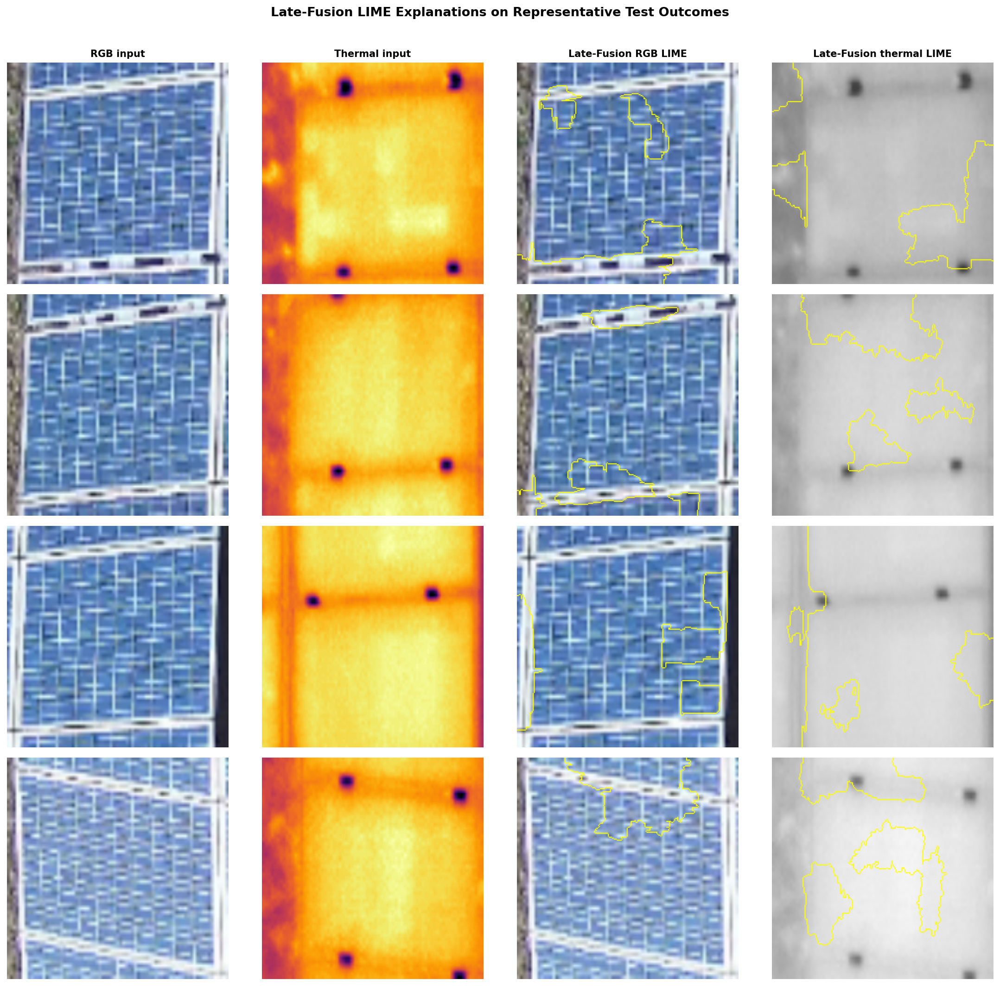

Saved: figures/corrected_posthoc/09_lime_corrected.pdf


LIME faithfulness:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]


Corrected LIME faithfulness (target-class logit margin)


N  DeletionDropMean  DeletionDropMedian  \
modality category                                             
rgb      FN        10          0.434551            0.261453   
         FP        10          0.867218            0.727901   
         TN        10          0.661828            0.485177   
         TP        10          0.714321            0.404074   
thermal  FN        10          0.790111            0.589029   
         FP        10          3.957925            3.866718   
         TN        10          1.779883            0.557150   
         TP        10          3.619458            3.428876   

                   InsertionGainMean  InsertionGainMedian  \
modality category                                           
rgb      FN                -1.686681            -1.667344   
         FP                 5.386904             5.437066   
         TN                -0.770213            -1.016755   
         TP                 5.597389             5.713919   
thermal  FN                -0.198391            -0.020383   
         FP                 1.780994             1.670123   
         TN                -0.603886            -0.223639   
         TP                 2.964330             2.924897   

                   InsertionFractionMedian  
modality category                           
rgb      FN                       0.336537  
         FP                       1.063167  
         TN                       0.984369  
         TP                       0.927489  
thermal  FN                      -0.062744  
         FP                       0.258341  
         TN                       0.102476  
         TP                       0.532339


Valid LIME faithfulness maps: 80 / 80
Saved: figures/corrected_posthoc/09_lime_faith_corrected.csv


LIME stability:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]


Corrected LIME stability


NComparisons   MeanIoU  MedianIoU    StdIoU  MeanDice  \
modality category                                                          
rgb      FN                  30  0.845415   0.874565  0.167704  0.906999   
         FP                  30  0.828910   0.785542  0.145867  0.899681   
         TN                  30  0.777155   0.782974  0.178988  0.862761   
         TP                  30  0.827565   0.837647  0.141146  0.899224   
thermal  FN                  30  0.741145   0.773700  0.181236  0.838986   
         FP                  30  0.588590   0.592406  0.270733  0.699252   
         TN                  30  0.549549   0.547684  0.230544  0.681638   
         TP                  30  0.677672   0.642412  0.222460  0.787300   

                   MedianDice  
modality category              
rgb      FN          0.933086  
         FP          0.879878  
         TN          0.878254  
         TP          0.911652  
thermal  FN          0.872413  
         FP          0.743757  
         TN          0.707746  
         TP          0.782279

Saved: figures/corrected_posthoc/09_lime_stability_corrected.csv

Corrected LIME analysis complete.


In [ ]:
# LIME ANALYSIS

import json

import cv2
import numpy as np
import pandas as pd
import torch

from lime import lime_image
from skimage.segmentation import mark_boundaries
from torchvision import transforms
from tqdm.auto import tqdm


# 1. Model-consistent image/tensor conversions

RGB_MEAN = torch.tensor(
    [0.485, 0.456, 0.406],
    dtype=torch.float32,
).view(3, 1, 1)

RGB_STD = torch.tensor(
    [0.229, 0.224, 0.225],
    dtype=torch.float32,
).view(3, 1, 1)

THERMAL_MEAN = 0.5
THERMAL_STD = 0.25


def rgb_tensor_to_uint8(rgb_t):
    """
    Convert a normalized model RGB tensor to an H×W×3 uint8 image.

    Model normalization:
        normalized = (raw_01 - RGB_MEAN) / RGB_STD
    """
    rgb = (
        rgb_t.detach().cpu()
        * RGB_STD
        + RGB_MEAN
    )

    rgb = rgb.clamp(
        0.0,
        1.0,
    )

    return (
        rgb.permute(1, 2, 0)
        .numpy()
        .astype(np.float32)
        * 255.0
    ).round().astype(np.uint8)


def rgb_uint8_to_tensor(rgb_np):
    """
    Convert a LIME RGB perturbation back to the exact model-input scale.
    """
    rgb_np = np.asarray(
        rgb_np
    )

    if rgb_np.ndim != 3 or rgb_np.shape[2] != 3:
        raise ValueError(
            "Expected an H×W×3 RGB image, "
            f"received shape {rgb_np.shape}."
        )

    rgb_np = np.clip(
        rgb_np,
        0,
        255,
    ).astype(np.uint8)

    rgb = (
        torch.from_numpy(rgb_np)
        .permute(2, 0, 1)
        .float()
        / 255.0
    )

    rgb = transforms.functional.resize(
        rgb,
        [IMG_SIZE, IMG_SIZE],
        antialias=True,
    )

    rgb = (
        rgb
        - RGB_MEAN
    ) / RGB_STD

    return rgb


def thermal_tensor_to_uint8(th_t):
    """
    Convert a normalized thermal tensor back to an H×W uint8 image.

    Dataset normalization:
        normalized = (raw_01 - 0.5) / 0.25

    Therefore:
        raw_01 = normalized * 0.25 + 0.5
    """
    th_raw = (
        th_t.detach().cpu()
        * THERMAL_STD
        + THERMAL_MEAN
    )

    th_raw = th_raw.clamp(
        0.0,
        1.0,
    )

    return (
        th_raw.squeeze(0)
        .numpy()
        * 255.0
    ).round().astype(np.uint8)


def thermal_uint8_to_tensor(th_np):
    """
    Convert a LIME thermal perturbation back to the exact model-input scale.
    """
    th_np = np.asarray(
        th_np
    )

    if th_np.ndim != 2:
        raise ValueError(
            "Expected an H×W thermal image, "
            f"received shape {th_np.shape}."
        )

    th_np = np.clip(
        th_np,
        0,
        255,
    ).astype(np.uint8)

    th = (
        torch.from_numpy(th_np)
        .float()
        .unsqueeze(0)
        / 255.0
    )

    th = transforms.functional.resize(
        th,
        [IMG_SIZE, IMG_SIZE],
        antialias=True,
    )

    th = (
        th
        - THERMAL_MEAN
    ) / THERMAL_STD

    return th


# 2. Training-normal LIME hiding colors

# These baselines are created in Cell 1 from representative
# normal samples in the training partition.

if "TRAIN_RGB_PIXEL_BASELINE" not in globals():
    raise NameError(
        "TRAIN_RGB_PIXEL_BASELINE was not found. "
        "Run corrected Cell 1 before Cell 4."
    )

if "TRAIN_TH_PIXEL_BASELINE" not in globals():
    raise NameError(
        "TRAIN_TH_PIXEL_BASELINE was not found. "
        "Run corrected Cell 1 before Cell 4."
    )


# Mean RGB color of the training-normal RGB baseline.
# Shape: (3,)
LIME_RGB_HIDE_COLOR = (
    rgb_tensor_to_uint8(
        TRAIN_RGB_PIXEL_BASELINE
    )
    .reshape(-1, 3)
    .mean(axis=0)
    .astype(np.float64)
)


# Mean grayscale value of the training-normal thermal baseline.
LIME_TH_HIDE_VALUE = float(
    thermal_tensor_to_uint8(
        TRAIN_TH_PIXEL_BASELINE
    ).mean()
)


# Thermal input is replicated to three identical channels for LIME.
LIME_TH_HIDE_COLOR = np.array(
    [
        LIME_TH_HIDE_VALUE,
        LIME_TH_HIDE_VALUE,
        LIME_TH_HIDE_VALUE,
    ],
    dtype=np.float64,
)


print(
    "LIME RGB hide color:",
    np.round(
        LIME_RGB_HIDE_COLOR,
        2,
    ),
)

print(
    "LIME thermal hide color:",
    np.round(
        LIME_TH_HIDE_COLOR,
        2,
    ),
)


# 3. Batched LIME prediction wrappers

def lime_predict_rgb_batch(
    model,
    rgb_images,
    fixed_th,
):
    """
    Predict class probabilities for perturbed RGB images while
    thermal remains factual.
    """
    model.eval()

    rgb_images = np.asarray(
        rgb_images
    )

    rgb_tensors = torch.stack(
        [
            rgb_uint8_to_tensor(
                image
            )
            for image in rgb_images
        ]
    ).to(DEVICE)

    th_batch = (
        fixed_th.unsqueeze(0)
        .repeat(
            len(rgb_tensors),
            1,
            1,
            1,
        )
        .to(DEVICE)
    )

    model_name = getattr(
        model,
        "model_name",
        "",
    ).lower()

    with torch.no_grad():
        if "rgb-only" in model_name:
            logits = model(
                rgb_tensors,
                None,
            )

        elif "thermal-only" in model_name:
            logits = model(
                None,
                th_batch,
            )

        else:
            logits = model(
                rgb_tensors,
                th_batch,
            )

        probabilities = torch.softmax(
            logits,
            dim=1,
        )

    return (
        probabilities.detach()
        .cpu()
        .numpy()
    )


def lime_predict_thermal_batch(
    model,
    thermal_rgb_images,
    fixed_rgb,
):
    """
    Predict class probabilities for perturbed thermal images while
    RGB remains factual.

    LIME requires a three-channel image, so thermal is represented as
    three identical grayscale channels. It is converted back to one
    channel before being passed to the model.
    """
    model.eval()

    thermal_rgb_images = np.asarray(
        thermal_rgb_images
    )

    thermal_tensors = []

    for image in thermal_rgb_images:
        image = np.asarray(
            image
        )

        image = np.clip(
            image,
            0,
            255,
        ).astype(np.uint8)

        if image.ndim == 3:
            # Because the three channels are replicated grayscale,
            # averaging preserves the intended thermal intensity.
            gray = np.mean(
                image.astype(np.float32),
                axis=2,
            ).round().astype(np.uint8)

        elif image.ndim == 2:
            gray = image

        else:
            raise ValueError(
                "Unexpected perturbed thermal image shape: "
                f"{image.shape}"
            )

        thermal_tensors.append(
            thermal_uint8_to_tensor(
                gray
            )
        )

    th_batch = torch.stack(
        thermal_tensors
    ).to(DEVICE)

    rgb_batch = (
        fixed_rgb.unsqueeze(0)
        .repeat(
            len(th_batch),
            1,
            1,
            1,
        )
        .to(DEVICE)
    )

    model_name = getattr(
        model,
        "model_name",
        "",
    ).lower()

    with torch.no_grad():
        if "thermal-only" in model_name:
            logits = model(
                None,
                th_batch,
            )

        elif "rgb-only" in model_name:
            logits = model(
                rgb_batch,
                None,
            )

        else:
            logits = model(
                rgb_batch,
                th_batch,
            )

        probabilities = torch.softmax(
            logits,
            dim=1,
        )

    return (
        probabilities.detach()
        .cpu()
        .numpy()
    )


# 4. Reproducible LIME explanation functions

def explain_lime_rgb(
    model,
    rgb_t,
    th_t,
    random_state,
    num_samples=1000,
):
    """
    Explain the RGB branch while keeping factual thermal fixed.

    Hidden RGB superpixels are replaced by the mean color of the
    training-normal RGB baseline.
    """
    image_uint8 = rgb_tensor_to_uint8(
        rgb_t
    )

    explainer = lime_image.LimeImageExplainer(
        random_state=int(
            random_state
        )
    )

    explanation = explainer.explain_instance(
        image_uint8,
        classifier_fn=lambda images: lime_predict_rgb_batch(
            model,
            images,
            fixed_th=th_t,
        ),
        labels=(0, 1),
        hide_color=LIME_RGB_HIDE_COLOR,
        num_samples=int(
            num_samples
        ),
        random_seed=int(
            random_state
        ),
    )

    return explanation, image_uint8


def explain_lime_thermal(
    model,
    rgb_t,
    th_t,
    random_state,
    num_samples=1000,
):
    """
    Explain the thermal branch while keeping factual RGB fixed.

    Hidden thermal superpixels are replaced by the mean intensity of
    the training-normal thermal baseline.
    """
    thermal_uint8 = thermal_tensor_to_uint8(
        th_t
    )

    thermal_rgb = np.repeat(
        thermal_uint8[..., None],
        repeats=3,
        axis=2,
    )

    explainer = lime_image.LimeImageExplainer(
        random_state=int(
            random_state
        )
    )

    explanation = explainer.explain_instance(
        thermal_rgb,
        classifier_fn=lambda images: lime_predict_thermal_batch(
            model,
            images,
            fixed_rgb=rgb_t,
        ),
        labels=(0, 1),
        hide_color=LIME_TH_HIDE_COLOR,
        num_samples=int(
            num_samples
        ),
        random_seed=int(
            random_state
        ),
    )

    return explanation, thermal_uint8


def explain_lime_modality(
    model,
    rgb_t,
    th_t,
    modality,
    random_state,
    num_samples=1000,
):
    """
    Dispatch to the appropriate modality-specific LIME explanation.
    """
    if modality == "rgb":
        return explain_lime_rgb(
            model,
            rgb_t,
            th_t,
            random_state=random_state,
            num_samples=num_samples,
        )

    if modality == "thermal":
        return explain_lime_thermal(
            model,
            rgb_t,
            th_t,
            random_state=random_state,
            num_samples=num_samples,
        )

    raise ValueError(
        "modality must be 'rgb' or 'thermal'."
    )

# 5. Continuous and binary LIME maps

def lime_continuous_map(
    explanation,
    class_idx,
    positive_only=True,
):
    """
    Create a continuous superpixel-importance map.

    positive_only=True:
        Retain only evidence supporting the selected class.

    positive_only=False:
        Use attribution magnitude regardless of direction.
    """
    segments = explanation.segments

    local_weights = dict(
        explanation.local_exp.get(
            int(class_idx),
            [],
        )
    )

    importance = np.zeros(
        segments.shape,
        dtype=np.float32,
    )

    for superpixel_id, weight in local_weights.items():
        if positive_only:
            value = max(
                0.0,
                float(weight),
            )
        else:
            value = abs(
                float(weight)
            )

        importance[
            segments == int(superpixel_id)
        ] = value

    importance = cv2.resize(
        importance,
        (
            IMG_SIZE,
            IMG_SIZE,
        ),
        interpolation=cv2.INTER_NEAREST,
    )

    return normalize_map(
        importance
    )


def lime_binary_top_features(
    explanation,
    class_idx,
    n_features=6,
    positive_only=True,
):
    """
    Create a binary mask from a fixed number of selected
    LIME superpixels.
    """
    _, mask = explanation.get_image_and_mask(
        label=int(
            class_idx
        ),
        positive_only=bool(
            positive_only
        ),
        num_features=int(
            n_features
        ),
        hide_rest=False,
    )

    mask = (
        mask > 0
    ).astype(np.uint8)

    return cv2.resize(
        mask,
        (
            IMG_SIZE,
            IMG_SIZE,
        ),
        interpolation=cv2.INTER_NEAREST,
    )


# 6. Representative LIME visualization

LIME_VIS_IDXS = GRADCAM_VIS_IDXS


def visualize_corrected_lime(
    model,
    dataset,
    sample_indices,
    num_samples=1000,
    n_features=6,
    save_name="09_lime_corrected.pdf",
):
    """
    Visualize representative TP/TN/FP/FN Late-Fusion
    LIME explanations.
    """
    if not sample_indices:
        print(
            "No LIME visualization samples."
        )
        return

    fig, axes = plt.subplots(
        len(sample_indices),
        4,
        figsize=(
            15,
            3.5
            * len(sample_indices),
        ),
    )

    if len(sample_indices) == 1:
        axes = axes[
            None,
            :
        ]

    titles = [
        "RGB input",
        "Thermal input",
        "Late-Fusion RGB LIME",
        "Late-Fusion thermal LIME",
    ]

    for ax, title in zip(
        axes[0],
        titles,
    ):
        ax.set_title(
            title,
            fontsize=10,
            fontweight="bold",
        )

    for row, idx in enumerate(
        sample_indices
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_table[
            prediction_table[
                "sample_idx"
            ]
            == idx
        ].iloc[0]

        target_class = int(
            pred_row[
                "pred_label"
            ]
        )

        rgb_exp, rgb_uint8 = explain_lime_rgb(
            model,
            rgb_t,
            th_t,
            random_state=(
                POSTHOC_SEED
                + int(idx)
            ),
            num_samples=num_samples,
        )

        th_exp, th_uint8 = explain_lime_thermal(
            model,
            rgb_t,
            th_t,
            random_state=(
                POSTHOC_SEED
                + 10_000
                + int(idx)
            ),
            num_samples=num_samples,
        )

        rgb_mask = lime_binary_top_features(
            rgb_exp,
            class_idx=target_class,
            n_features=n_features,
        )

        th_mask = lime_binary_top_features(
            th_exp,
            class_idx=target_class,
            n_features=n_features,
        )

        rgb_display = (
            rgb_uint8.astype(np.float32)
            / 255.0
        )

        th_display = (
            th_uint8.astype(np.float32)
            / 255.0
        )

        th_display_rgb = np.repeat(
            th_display[..., None],
            repeats=3,
            axis=2,
        )

        axes[
            row,
            0,
        ].imshow(
            rgb_display
        )

        axes[
            row,
            1,
        ].imshow(
            th_display,
            cmap="inferno",
        )

        axes[
            row,
            2,
        ].imshow(
            mark_boundaries(
                rgb_display,
                rgb_mask,
            )
        )

        axes[
            row,
            3,
        ].imshow(
            mark_boundaries(
                th_display_rgb,
                th_mask,
            )
        )

        axes[
            row,
            0,
        ].set_ylabel(
            (
                f"Idx {idx}\n"
                f"{pred_row['category']}\n"
                f"Y={int(y)}, Ŷ={target_class}\n"
                f"P(A)={pred_row['p_anomaly']:.3f}"
            ),
            fontsize=8,
        )

    for ax in axes.flat:
        ax.axis(
            "off"
        )

    plt.suptitle(
        (
            "Late-Fusion LIME Explanations "
            "on Representative Test Outcomes"
        ),
        fontsize=13,
        fontweight="bold",
        y=1.01,
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


visualize_corrected_lime(
    LATE_FUSION_MODEL,
    datasets["test"],
    LIME_VIS_IDXS,
    num_samples=1000,
    n_features=6,
)

# 7. LIME faithfulness

def evaluate_lime_faithfulness_corrected(
    model,
    dataset,
    sample_indices,
    num_samples=1000,
    n_features=6,
    save_name="09_lime_faith_corrected.csv",
):
    """
    Evaluate LIME using the same target-class logit-margin design
    as corrected Grad-CAM and IG.

    Metrics
    -------
    deletion_drop
        Original target margin minus the margin after replacing
        selected superpixels with the training-normal baseline.

    insertion_gain
        Margin gained by inserting selected superpixels into the
        training-normal baseline.

    insertion_fraction
        Fraction of the total factual-versus-baseline target-margin
        change recovered by the selected superpixels.
    """
    rows = []

    for idx in tqdm(
        sample_indices,
        desc="LIME faithfulness",
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_table[
            prediction_table[
                "sample_idx"
            ]
            == idx
        ].iloc[0]

        target_class = int(
            pred_row[
                "pred_label"
            ]
        )

        original_margin = target_logit_margin(
            model,
            rgb_t,
            th_t,
            target_class,
        )

        full_baseline_margin = target_logit_margin(
            model,
            TRAIN_RGB_PIXEL_BASELINE,
            TRAIN_TH_PIXEL_BASELINE,
            target_class,
        )

        available_change = (
            original_margin
            - full_baseline_margin
        )

        for modality in [
            "rgb",
            "thermal",
        ]:
            seed = (
                POSTHOC_SEED
                + int(idx)
                + (
                    0
                    if modality == "rgb"
                    else 10_000
                )
            )

            try:
                explanation, _ = explain_lime_modality(
                    model,
                    rgb_t,
                    th_t,
                    modality=modality,
                    random_state=seed,
                    num_samples=num_samples,
                )

                binary_mask = lime_binary_top_features(
                    explanation,
                    class_idx=target_class,
                    n_features=n_features,
                )

                valid_map = bool(
                    binary_mask.sum()
                    > 0
                )

                if not valid_map:
                    rows.append(
                        {
                            "sample_idx": int(idx),
                            "category": pred_row[
                                "category"
                            ],
                            "target_class": target_class,
                            "modality": modality,
                            "valid_map": False,
                            "original_margin": original_margin,
                            "baseline_margin": full_baseline_margin,
                            "deletion_margin": np.nan,
                            "insertion_margin": np.nan,
                            "deletion_drop": np.nan,
                            "insertion_gain": np.nan,
                            "insertion_fraction": np.nan,
                            "error": (
                                "No positive LIME superpixels "
                                "were selected."
                            ),
                        }
                    )
                    continue

                rgb_deleted, th_deleted = apply_attribution_mask(
                    rgb_t,
                    th_t,
                    binary_mask,
                    modality,
                    mode="deletion",
                )

                rgb_inserted, th_inserted = apply_attribution_mask(
                    rgb_t,
                    th_t,
                    binary_mask,
                    modality,
                    mode="insertion",
                )

                deletion_margin = target_logit_margin(
                    model,
                    rgb_deleted,
                    th_deleted,
                    target_class,
                )

                insertion_margin = target_logit_margin(
                    model,
                    rgb_inserted,
                    th_inserted,
                    target_class,
                )

                deletion_drop = (
                    original_margin
                    - deletion_margin
                )

                insertion_gain = (
                    insertion_margin
                    - full_baseline_margin
                )

                insertion_fraction = (
                    insertion_gain
                    / available_change
                    if abs(
                        available_change
                    )
                    > 1e-8
                    else np.nan
                )

                rows.append(
                    {
                        "sample_idx": int(idx),
                        "category": pred_row[
                            "category"
                        ],
                        "target_class": target_class,
                        "modality": modality,
                        "valid_map": True,
                        "original_margin": original_margin,
                        "baseline_margin": full_baseline_margin,
                        "deletion_margin": deletion_margin,
                        "insertion_margin": insertion_margin,
                        "deletion_drop": deletion_drop,
                        "insertion_gain": insertion_gain,
                        "insertion_fraction": insertion_fraction,
                        "error": None,
                    }
                )

            except Exception as error:
                rows.append(
                    {
                        "sample_idx": int(idx),
                        "category": pred_row[
                            "category"
                        ],
                        "target_class": target_class,
                        "modality": modality,
                        "valid_map": False,
                        "original_margin": original_margin,
                        "baseline_margin": full_baseline_margin,
                        "deletion_margin": np.nan,
                        "insertion_margin": np.nan,
                        "deletion_drop": np.nan,
                        "insertion_gain": np.nan,
                        "insertion_fraction": np.nan,
                        "error": str(
                            error
                        ),
                    }
                )

    faith_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    faith_df.to_csv(
        output_path,
        index=False,
    )

    valid = faith_df[
        faith_df[
            "valid_map"
        ]
    ].copy()

    if valid.empty:
        print(
            "\nNo valid LIME faithfulness records."
        )
    else:
        summary = (
            valid.groupby(
                [
                    "modality",
                    "category",
                ]
            )
            .agg(
                N=(
                    "sample_idx",
                    "size",
                ),
                DeletionDropMean=(
                    "deletion_drop",
                    "mean",
                ),
                DeletionDropMedian=(
                    "deletion_drop",
                    "median",
                ),
                InsertionGainMean=(
                    "insertion_gain",
                    "mean",
                ),
                InsertionGainMedian=(
                    "insertion_gain",
                    "median",
                ),
                InsertionFractionMedian=(
                    "insertion_fraction",
                    "median",
                ),
            )
        )

        print(
            "\nCorrected LIME faithfulness "
            "(target-class logit margin)"
        )

        display(
            summary
        )

    print(
        "\nValid LIME faithfulness maps:",
        int(
            faith_df[
                "valid_map"
            ].sum()
        ),
        "/",
        len(
            faith_df
        ),
    )

    print(
        "Saved:",
        output_path,
    )

    return faith_df


lime_faith_corrected = (
    evaluate_lime_faithfulness_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
        num_samples=1000,
        n_features=6,
    )
)


# 8. Corrected LIME stability

def evaluate_lime_stability_corrected(
    model,
    dataset,
    sample_indices,
    num_samples=1000,
    n_features=6,
    repeats=3,
    save_name="09_lime_stability_corrected.csv",
):
    """
    Generate repeated LIME explanations using explicitly seeded,
    independent explainers.

    Stability is measured using pairwise IoU and Dice between
    fixed-feature binary masks.
    """
    if repeats < 2:
        raise ValueError(
            "repeats must be at least 2."
        )

    rows = []

    for idx in tqdm(
        sample_indices,
        desc="LIME stability",
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_table[
            prediction_table[
                "sample_idx"
            ]
            == idx
        ].iloc[0]

        target_class = int(
            pred_row[
                "pred_label"
            ]
        )

        for modality in [
            "rgb",
            "thermal",
        ]:
            masks = []

            for repeat_idx in range(
                repeats
            ):
                seed = (
                    POSTHOC_SEED
                    + int(idx)
                    * 100
                    + repeat_idx
                    + (
                        0
                        if modality == "rgb"
                        else 50_000
                    )
                )

                try:
                    explanation, _ = explain_lime_modality(
                        model,
                        rgb_t,
                        th_t,
                        modality=modality,
                        random_state=seed,
                        num_samples=num_samples,
                    )

                    mask = lime_binary_top_features(
                        explanation,
                        class_idx=target_class,
                        n_features=n_features,
                    )

                    if mask.sum() > 0:
                        masks.append(
                            (
                                repeat_idx,
                                mask,
                            )
                        )
                    else:
                        rows.append(
                            {
                                "sample_idx": int(idx),
                                "category": pred_row[
                                    "category"
                                ],
                                "target_class": target_class,
                                "modality": modality,
                                "repeat_a": repeat_idx,
                                "repeat_b": np.nan,
                                "iou": np.nan,
                                "dice": np.nan,
                                "error": (
                                    "No positive LIME superpixels "
                                    "were selected."
                                ),
                            }
                        )

                except Exception as error:
                    rows.append(
                        {
                            "sample_idx": int(idx),
                            "category": pred_row[
                                "category"
                            ],
                            "target_class": target_class,
                            "modality": modality,
                            "repeat_a": repeat_idx,
                            "repeat_b": np.nan,
                            "iou": np.nan,
                            "dice": np.nan,
                            "error": str(
                                error
                            ),
                        }
                    )

            for i in range(
                len(masks)
            ):
                for j in range(
                    i + 1,
                    len(masks),
                ):
                    repeat_a, mask_a = masks[
                        i
                    ]

                    repeat_b, mask_b = masks[
                        j
                    ]

                    mask_a_bool = (
                        mask_a > 0
                    )

                    mask_b_bool = (
                        mask_b > 0
                    )

                    intersection = np.logical_and(
                        mask_a_bool,
                        mask_b_bool,
                    ).sum()

                    denominator = (
                        mask_a_bool.sum()
                        + mask_b_bool.sum()
                    )

                    dice = (
                        2.0
                        * intersection
                        / (
                            denominator
                            + 1e-8
                        )
                    )

                    rows.append(
                        {
                            "sample_idx": int(idx),
                            "category": pred_row[
                                "category"
                            ],
                            "target_class": target_class,
                            "modality": modality,
                            "repeat_a": repeat_a,
                            "repeat_b": repeat_b,
                            "iou": binary_iou(
                                mask_a,
                                mask_b,
                            ),
                            "dice": float(
                                dice
                            ),
                            "error": None,
                        }
                    )

    stability_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    stability_df.to_csv(
        output_path,
        index=False,
    )

    valid = stability_df.dropna(
        subset=[
            "iou",
            "dice",
        ]
    )

    if valid.empty:
        print(
            "\nNo valid LIME stability comparisons."
        )
    else:
        summary = (
            valid.groupby(
                [
                    "modality",
                    "category",
                ]
            )
            .agg(
                NComparisons=(
                    "iou",
                    "size",
                ),
                MeanIoU=(
                    "iou",
                    "mean",
                ),
                MedianIoU=(
                    "iou",
                    "median",
                ),
                StdIoU=(
                    "iou",
                    "std",
                ),
                MeanDice=(
                    "dice",
                    "mean",
                ),
                MedianDice=(
                    "dice",
                    "median",
                ),
            )
        )

        print(
            "\nCorrected LIME stability"
        )

        display(
            summary
        )

    print(
        "Saved:",
        output_path,
    )

    return stability_df


lime_stability_corrected = (
    evaluate_lime_stability_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
        num_samples=1000,
        n_features=6,
        repeats=3,
    )
)


# 9. Save LIME metadata

lime_metadata = {
    "model": (
        "Late-Fusion"
    ),
    "rgb_preprocessing": (
        "Exact inverse ImageNet normalization followed by exact "
        "model normalization after each LIME perturbation"
    ),
    "thermal_preprocessing": (
        "Exact inverse thermal normalization followed by exact "
        "thermal model normalization after each LIME perturbation"
    ),
    "rgb_lime_hide_color": [
        float(value)
        for value in LIME_RGB_HIDE_COLOR
    ],
    "thermal_lime_hide_color": [
        float(value)
        for value in LIME_TH_HIDE_COLOR
    ],
    "lime_hidden_region_reference": (
        "Mean pixel color or intensity of the training-normal "
        "modality baseline"
    ),
    "num_samples": 1000,
    "num_features": 6,
    "randomness": (
        "Explicitly seeded independent LimeImageExplainer "
        "instance for each run"
    ),
    "target": (
        "Predicted class"
    ),
    "faithfulness_target": (
        "Predicted-class logit margin"
    ),
    "faithfulness_deletion_reference": (
        "Training-normal mean pixel tensor"
    ),
    "faithfulness_insertion_reference": (
        "Training-normal mean pixel tensor"
    ),
    "sample_design": (
        "Representative TP/TN/FP/FN sample "
        "stratified across confidence"
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "09_lime_metadata.json",
    "w",
) as file:
    json.dump(
        lime_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected LIME analysis complete."
)


Embedding-forward consistency


,absolute_difference,within_tolerance
mean,0.0,1.0
max,0.0,NaN


Exact modality Shapley:   0%|          | 0/18670 [00:00<?, ?it/s]

Saved: figures/corrected_posthoc/10_exact_modality_shapley.csv

Exact Shapley efficiency check


,Value
N,18670.0
Mean absolute efficiency error,0.0
Maximum absolute efficiency error,0.0
Proportion error <= 1e-6,1.0



Exact two-modality Shapley summary


,Group,N,MeanPhiRGB,MeanPhiThermal,MedianPhiRGB,MedianPhiThermal,MeanAbsPhiRGB,MeanAbsPhiThermal,MedianAbsPhiRGB,MedianAbsPhiThermal,...,ThermalMagnitudeWins,ThermalMagnitudeWinRate,MagnitudeWinBinomialP,AbsContributionWilcoxonStatistic,AbsContributionWilcoxonP,MeanAbsThermalMinusRGB,Bootstrap95CI_Low,Bootstrap95CI_High,MeanInteraction,MedianInteraction
0,Overall,18670,0.567567,0.758825,0.275596,0.008618,0.652084,1.197098,0.339331,0.546393,...,12569,0.673219,0.000000e+00,48346430.5,0.000000e+00,0.545014,0.525135,0.566582,-0.547353,-0.483020
1,TP,1231,1.278474,4.837996,1.179364,5.015515,1.303858,4.838132,1.182419,5.015515,...,1154,0.937449,3.137840e-247,11949.0,2.053189e-190,3.534274,3.420237,3.648717,-0.516820,-0.592463
2,TN,15177,0.386707,0.117625,0.193366,-0.129209,0.479748,0.649907,0.250644,0.426416,...,9690,0.638466,2.573610e-258,39053477.5,1.998254e-258,0.170158,0.157383,0.182685,-0.586897,-0.489479
3,FP,1604,1.723800,3.502044,1.637884,3.589663,1.742708,3.509315,1.637884,3.589663,...,1310,0.816708,6.279287e-153,161715.0,9.892888e-149,1.766607,1.661873,1.872754,-0.114402,-0.065610
4,FN,658,0.590647,1.229821,0.462904,1.097703,0.749115,1.370066,0.582480,1.139448,...,415,0.630699,2.029664e-11,60187.0,4.842304e-23,0.620951,0.518530,0.725730,-0.747784,-0.737558


Saved: figures/corrected_posthoc/10_exact_modality_shapley_summary.csv


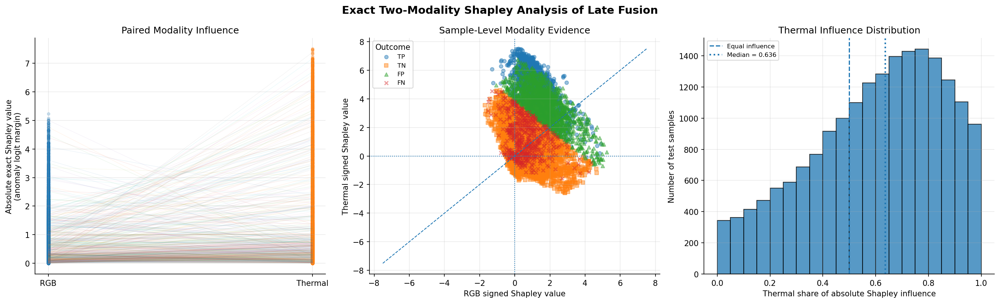

Saved: figures/corrected_posthoc/10_exact_modality_shapley.pdf


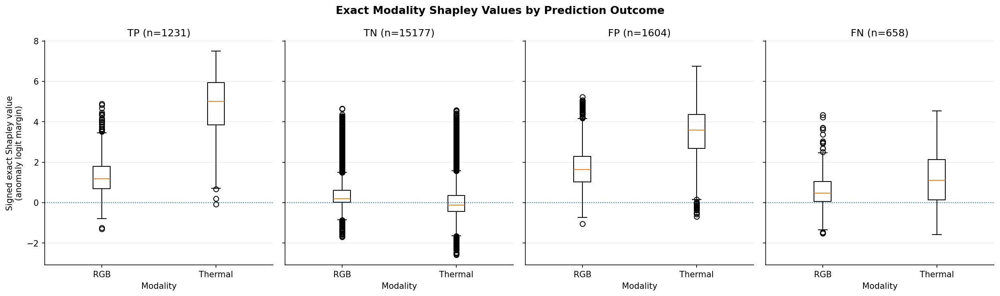

Saved: figures/corrected_posthoc/10_exact_modality_shapley_by_outcome.pdf


Mixed training embedding baseline:   0%|          | 0/200 [00:00<?, ?it/s]

Shapley baseline sensitivity:   0%|          | 0/40 [00:00<?, ?it/s]


Baseline-sensitivity summary


,normal_thermal_abs_share,mixed_thermal_abs_share
mean,0.665295,0.646272
median,0.726548,0.715662
std,0.240929,0.270735


Saved: figures/corrected_posthoc/10_exact_shapley_baseline_sensitivity.csv

Exact two-modality Shapley analysis complete.


In [ ]:
# EXACT TWO-MODALITY SHAPLEY ANALYSIS

import json
import numpy as np
import pandas as pd
import torch

from scipy.stats import (
    binomtest,
    wilcoxon,
)

# 1. Late-fusion prediction directly from embeddings

def late_fusion_margin_from_embeddings(
    model,
    rgb_embedding,
    thermal_embedding,
) -> float:
    """
    Evaluate the anomaly logit margin directly from late-fusion
    RGB and thermal embeddings.

    Margin:
        anomaly logit - normal logit

    Positive values support anomaly classification.
    Negative values support normal classification.
    """
    model.eval()

    rgb_embedding = np.asarray(
        rgb_embedding,
        dtype=np.float32,
    )

    thermal_embedding = np.asarray(
        thermal_embedding,
        dtype=np.float32,
    )

    if rgb_embedding.shape != TRAIN_RGB_EMBED_BASELINE.shape:
        raise ValueError(
            "Unexpected RGB embedding shape: "
            f"{rgb_embedding.shape}"
        )

    if thermal_embedding.shape != TRAIN_TH_EMBED_BASELINE.shape:
        raise ValueError(
            "Unexpected thermal embedding shape: "
            f"{thermal_embedding.shape}"
        )

    rgb_tensor = torch.from_numpy(
        rgb_embedding
    ).unsqueeze(0).to(DEVICE)

    thermal_tensor = torch.from_numpy(
        thermal_embedding
    ).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        fused = torch.cat(
            [
                rgb_tensor,
                thermal_tensor,
            ],
            dim=1,
        )

        fused = model.fusion(
            fused
        )

        logits = model.classifier(
            fused
        )

        margin = (
            logits[0, 1]
            - logits[0, 0]
        )

    return float(
        margin.item()
    )


def late_fusion_probability_from_embeddings(
    model,
    rgb_embedding,
    thermal_embedding,
) -> float:
    """
    Evaluate P(anomaly) directly from the two late-fusion embeddings.

    Probability is reported descriptively. Exact Shapley attribution
    is performed on the additive logit-margin scale.
    """
    model.eval()

    rgb_tensor = torch.from_numpy(
        np.asarray(
            rgb_embedding,
            dtype=np.float32,
        )
    ).unsqueeze(0).to(DEVICE)

    thermal_tensor = torch.from_numpy(
        np.asarray(
            thermal_embedding,
            dtype=np.float32,
        )
    ).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        fused = torch.cat(
            [
                rgb_tensor,
                thermal_tensor,
            ],
            dim=1,
        )

        fused = model.fusion(
            fused
        )

        logits = model.classifier(
            fused
        )

        probability = torch.softmax(
            logits,
            dim=1,
        )[0, 1]

    return float(
        probability.item()
    )


# 2. Verify embedding-forward consistency

def verify_embedding_forward_consistency(
    model,
    dataset,
    sample_indices,
    tolerance=1e-5,
):
    """
    Ensure that extracting embeddings and passing them through
    fusion/classifier reproduces the full-model anomaly margin.
    """
    rows = []

    for idx in sample_indices:
        rgb_t, th_t, y = dataset[
            idx
        ]

        rgb_embedding, thermal_embedding = (
            extract_lf_embeddings(
                model,
                rgb_t,
                th_t,
            )
        )

        direct_margin = anomaly_margin(
            model,
            rgb_t,
            th_t,
        )

        embedding_margin = (
            late_fusion_margin_from_embeddings(
                model,
                rgb_embedding,
                thermal_embedding,
            )
        )

        absolute_difference = abs(
            direct_margin
            - embedding_margin
        )

        rows.append(
            {
                "sample_idx": int(idx),
                "direct_margin": direct_margin,
                "embedding_margin": embedding_margin,
                "absolute_difference": absolute_difference,
                "within_tolerance": bool(
                    absolute_difference
                    <= tolerance
                ),
            }
        )

    consistency_df = pd.DataFrame(
        rows
    )

    print(
        "\nEmbedding-forward consistency"
    )

    display(
        consistency_df.agg(
            {
                "absolute_difference": [
                    "mean",
                    "max",
                ],
                "within_tolerance": "mean",
            }
        )
    )

    if not consistency_df[
        "within_tolerance"
    ].all():
        raise RuntimeError(
            "Embedding-based forward pass does not reproduce "
            "the full late-fusion model within tolerance."
        )

    return consistency_df


shapley_forward_consistency = (
    verify_embedding_forward_consistency(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS[:10],
    )
)


# 3. Exact two-player Shapley computation

def exact_two_modality_shapley(
    model,
    rgb_embedding,
    thermal_embedding,
    rgb_baseline=None,
    thermal_baseline=None,
):
    """
    Compute exact two-player Shapley values on anomaly logit margin.

    Players
    -------
    R : RGB embedding block
    T : thermal embedding block

    Coalitions
    ----------
    v_empty
        Baseline RGB + baseline thermal

    v_rgb
        Factual RGB + baseline thermal

    v_thermal
        Baseline RGB + factual thermal

    v_both
        Factual RGB + factual thermal

    Exact Shapley values
    --------------------
    phi_rgb =
        0.5 * [
            (v_rgb - v_empty)
            +
            (v_both - v_thermal)
        ]

    phi_thermal =
        0.5 * [
            (v_thermal - v_empty)
            +
            (v_both - v_rgb)
        ]

    Efficiency identity
    -------------------
    phi_rgb + phi_thermal = v_both - v_empty
    """
    if rgb_baseline is None:
        rgb_baseline = (
            TRAIN_RGB_EMBED_BASELINE
        )

    if thermal_baseline is None:
        thermal_baseline = (
            TRAIN_TH_EMBED_BASELINE
        )

    rgb_embedding = np.asarray(
        rgb_embedding,
        dtype=np.float32,
    )

    thermal_embedding = np.asarray(
        thermal_embedding,
        dtype=np.float32,
    )

    rgb_baseline = np.asarray(
        rgb_baseline,
        dtype=np.float32,
    )

    thermal_baseline = np.asarray(
        thermal_baseline,
        dtype=np.float32,
    )

    v_empty = (
        late_fusion_margin_from_embeddings(
            model,
            rgb_baseline,
            thermal_baseline,
        )
    )

    v_rgb = (
        late_fusion_margin_from_embeddings(
            model,
            rgb_embedding,
            thermal_baseline,
        )
    )

    v_thermal = (
        late_fusion_margin_from_embeddings(
            model,
            rgb_baseline,
            thermal_embedding,
        )
    )

    v_both = (
        late_fusion_margin_from_embeddings(
            model,
            rgb_embedding,
            thermal_embedding,
        )
    )

    phi_rgb = 0.5 * (
        (v_rgb - v_empty)
        +
        (v_both - v_thermal)
    )

    phi_thermal = 0.5 * (
        (v_thermal - v_empty)
        +
        (v_both - v_rgb)
    )

    total_change = (
        v_both
        - v_empty
    )

    reconstruction = (
        phi_rgb
        + phi_thermal
    )

    efficiency_error = (
        reconstruction
        - total_change
    )

    interaction = (
        v_both
        - v_rgb
        - v_thermal
        + v_empty
    )

    return {
        "v_empty": float(
            v_empty
        ),
        "v_rgb": float(
            v_rgb
        ),
        "v_thermal": float(
            v_thermal
        ),
        "v_both": float(
            v_both
        ),
        "phi_rgb": float(
            phi_rgb
        ),
        "phi_thermal": float(
            phi_thermal
        ),
        "abs_phi_rgb": float(
            abs(
                phi_rgb
            )
        ),
        "abs_phi_thermal": float(
            abs(
                phi_thermal
            )
        ),
        "total_change": float(
            total_change
        ),
        "shapley_sum": float(
            reconstruction
        ),
        "efficiency_error": float(
            efficiency_error
        ),
        "interaction": float(
            interaction
        ),
    }


# 4. Evaluate exact Shapley values on test samples

def evaluate_exact_modality_shapley(
    model,
    dataset,
    prediction_df,
    sample_indices=None,
    save_name="10_exact_modality_shapley.csv",
):
    """
    Calculate exact RGB and thermal Shapley values.

    When sample_indices=None, evaluate the entire held-out test set.
    For a faster initial run, pass REPRESENTATIVE_TEST_IDXS.
    """
    if sample_indices is None:
        sample_indices = prediction_df[
            "sample_idx"
        ].astype(int).tolist()

    rows = []

    for idx in tqdm(
        sample_indices,
        desc="Exact modality Shapley",
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_df[
            prediction_df["sample_idx"]
            == idx
        ].iloc[0]

        rgb_embedding, thermal_embedding = (
            extract_lf_embeddings(
                model,
                rgb_t,
                th_t,
            )
        )

        values = exact_two_modality_shapley(
            model,
            rgb_embedding,
            thermal_embedding,
        )

        signed_dominance = (
            "Thermal"
            if values["phi_thermal"]
            > values["phi_rgb"]
            else "RGB"
            if values["phi_rgb"]
            > values["phi_thermal"]
            else "Equal"
        )

        magnitude_dominance = (
            "Thermal"
            if values["abs_phi_thermal"]
            > values["abs_phi_rgb"]
            else "RGB"
            if values["abs_phi_rgb"]
            > values["abs_phi_thermal"]
            else "Equal"
        )

        total_abs = (
            values["abs_phi_rgb"]
            + values["abs_phi_thermal"]
        )

        thermal_abs_share = (
            values["abs_phi_thermal"]
            / total_abs
            if total_abs
            > 1e-12
            else np.nan
        )

        rows.append(
            {
                "sample_idx": int(
                    idx
                ),
                "true_label": int(
                    y
                ),
                "pred_label": int(
                    pred_row[
                        "pred_label"
                    ]
                ),
                "category": pred_row[
                    "category"
                ],
                "p_anomaly": float(
                    pred_row[
                        "p_anomaly"
                    ]
                ),
                "predicted_confidence": float(
                    pred_row[
                        "predicted_confidence"
                    ]
                ),
                **values,
                "signed_dominance": signed_dominance,
                "magnitude_dominance": magnitude_dominance,
                "thermal_abs_share": float(
                    thermal_abs_share
                )
                if np.isfinite(
                    thermal_abs_share
                )
                else np.nan,
            }
        )

    shapley_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    shapley_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "Saved:",
        output_path,
    )

    return shapley_df


# Full test-set evaluation is computationally reasonable:
# four small fusion/classifier evaluations per sample.
exact_shapley_df = (
    evaluate_exact_modality_shapley(
        LATE_FUSION_MODEL,
        datasets["test"],
        prediction_table,
        sample_indices=None,
    )
)

# 5. Exactness and efficiency validation

def summarize_shapley_efficiency(
    shapley_df,
):
    valid = shapley_df.dropna(
        subset=[
            "efficiency_error",
        ]
    )

    summary = pd.Series(
        {
            "N": len(
                valid
            ),
            "Mean absolute efficiency error": valid[
                "efficiency_error"
            ].abs().mean(),
            "Maximum absolute efficiency error": valid[
                "efficiency_error"
            ].abs().max(),
            "Proportion error <= 1e-6": (
                valid[
                    "efficiency_error"
                ].abs()
                <= 1e-6
            ).mean(),
        }
    )

    print(
        "\nExact Shapley efficiency check"
    )

    display(
        summary.to_frame(
            "Value"
        )
    )


summarize_shapley_efficiency(
    exact_shapley_df
)


# 6. Statistical modality summary

def bootstrap_paired_difference(
    rgb_values,
    thermal_values,
    n_bootstrap=5000,
    confidence_level=0.95,
    seed=POSTHOC_SEED,
):
    """
    Paired bootstrap confidence interval for:

        mean(thermal - RGB)
    """
    rgb_values = np.asarray(
        rgb_values,
        dtype=np.float64,
    )

    thermal_values = np.asarray(
        thermal_values,
        dtype=np.float64,
    )

    valid = (
        np.isfinite(
            rgb_values
        )
        &
        np.isfinite(
            thermal_values
        )
    )

    rgb_values = rgb_values[
        valid
    ]

    thermal_values = thermal_values[
        valid
    ]

    if len(
        rgb_values
    ) == 0:
        return {
            "mean_difference": np.nan,
            "ci_low": np.nan,
            "ci_high": np.nan,
        }

    differences = (
        thermal_values
        - rgb_values
    )

    rng = np.random.default_rng(
        seed
    )

    boot_means = np.empty(
        n_bootstrap,
        dtype=np.float64,
    )

    n = len(
        differences
    )

    for bootstrap_idx in range(
        n_bootstrap
    ):
        sampled_positions = rng.integers(
            0,
            n,
            size=n,
        )

        boot_means[
            bootstrap_idx
        ] = differences[
            sampled_positions
        ].mean()

    alpha = (
        1.0
        - confidence_level
    )

    return {
        "mean_difference": float(
            differences.mean()
        ),
        "ci_low": float(
            np.quantile(
                boot_means,
                alpha / 2.0,
            )
        ),
        "ci_high": float(
            np.quantile(
                boot_means,
                1.0 - alpha / 2.0,
            )
        ),
    }


def safe_paired_wilcoxon(
    first,
    second,
):
    """
    Paired Wilcoxon test with handling for all-zero differences.
    """
    first = np.asarray(
        first,
        dtype=np.float64,
    )

    second = np.asarray(
        second,
        dtype=np.float64,
    )

    valid = (
        np.isfinite(
            first
        )
        &
        np.isfinite(
            second
        )
    )

    first = first[
        valid
    ]

    second = second[
        valid
    ]

    differences = (
        second
        - first
    )

    if len(
        differences
    ) == 0:
        return np.nan, np.nan

    if np.allclose(
        differences,
        0.0,
    ):
        return 0.0, 1.0

    result = wilcoxon(
        second,
        first,
        alternative="two-sided",
        zero_method="wilcox",
    )

    return float(
        result.statistic
    ), float(
        result.pvalue
    )


def summarize_exact_shapley(
    shapley_df,
):
    """
    Summarize signed and magnitude-based modality contributions.

    Signed Shapley:
        direction of evidence on the anomaly-margin scale.

    Absolute Shapley:
        strength of modality influence regardless of direction.
    """
    rows = []

    grouping_sets = [
        (
            "Overall",
            shapley_df,
        )
    ]

    for category in [
        "TP",
        "TN",
        "FP",
        "FN",
    ]:
        sub = shapley_df[
            shapley_df[
                "category"
            ]
            == category
        ]

        if not sub.empty:
            grouping_sets.append(
                (
                    category,
                    sub,
                )
            )

    for group_name, sub in grouping_sets:
        n = len(
            sub
        )

        thermal_magnitude_wins = int(
            (
                sub[
                    "abs_phi_thermal"
                ]
                >
                sub[
                    "abs_phi_rgb"
                ]
            ).sum()
        )

        non_ties = int(
            (
                sub[
                    "abs_phi_thermal"
                ]
                !=
                sub[
                    "abs_phi_rgb"
                ]
            ).sum()
        )

        if non_ties > 0:
            binomial_p = float(
                binomtest(
                    thermal_magnitude_wins,
                    non_ties,
                    p=0.5,
                    alternative="two-sided",
                ).pvalue
            )
        else:
            binomial_p = np.nan

        wilcoxon_stat, wilcoxon_p = (
            safe_paired_wilcoxon(
                sub[
                    "abs_phi_rgb"
                ],
                sub[
                    "abs_phi_thermal"
                ],
            )
        )

        bootstrap_result = (
            bootstrap_paired_difference(
                sub[
                    "abs_phi_rgb"
                ],
                sub[
                    "abs_phi_thermal"
                ],
            )
        )

        rows.append(
            {
                "Group": group_name,
                "N": n,
                "MeanPhiRGB": sub[
                    "phi_rgb"
                ].mean(),
                "MeanPhiThermal": sub[
                    "phi_thermal"
                ].mean(),
                "MedianPhiRGB": sub[
                    "phi_rgb"
                ].median(),
                "MedianPhiThermal": sub[
                    "phi_thermal"
                ].median(),
                "MeanAbsPhiRGB": sub[
                    "abs_phi_rgb"
                ].mean(),
                "MeanAbsPhiThermal": sub[
                    "abs_phi_thermal"
                ].mean(),
                "MedianAbsPhiRGB": sub[
                    "abs_phi_rgb"
                ].median(),
                "MedianAbsPhiThermal": sub[
                    "abs_phi_thermal"
                ].median(),
                "MeanThermalAbsShare": sub[
                    "thermal_abs_share"
                ].mean(),
                "ThermalMagnitudeWins": (
                    thermal_magnitude_wins
                ),
                "ThermalMagnitudeWinRate": (
                    thermal_magnitude_wins
                    / non_ties
                    if non_ties
                    > 0
                    else np.nan
                ),
                "MagnitudeWinBinomialP": (
                    binomial_p
                ),
                "AbsContributionWilcoxonStatistic": (
                    wilcoxon_stat
                ),
                "AbsContributionWilcoxonP": (
                    wilcoxon_p
                ),
                "MeanAbsThermalMinusRGB": (
                    bootstrap_result[
                        "mean_difference"
                    ]
                ),
                "Bootstrap95CI_Low": (
                    bootstrap_result[
                        "ci_low"
                    ]
                ),
                "Bootstrap95CI_High": (
                    bootstrap_result[
                        "ci_high"
                    ]
                ),
                "MeanInteraction": sub[
                    "interaction"
                ].mean(),
                "MedianInteraction": sub[
                    "interaction"
                ].median(),
            }
        )

    summary_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / "10_exact_modality_shapley_summary.csv"
    )

    summary_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nExact two-modality Shapley summary"
    )

    display(
        summary_df
    )

    print(
        "Saved:",
        output_path,
    )

    return summary_df


exact_shapley_summary = (
    summarize_exact_shapley(
        exact_shapley_df
    )
)

# 7. Primary Shapley figures

def plot_exact_shapley_summary(
    shapley_df,
    save_name="10_exact_modality_shapley.pdf",
):
    """
    Create:
      1. paired absolute Shapley comparison;
      2. signed sample-level modality map;
      3. thermal absolute-share distribution.
    """
    fig, axes = plt.subplots(
        1,
        3,
        figsize=(
            18,
            5.5,
        ),
    )

    # Panel A: paired absolute modality contributions
    plotting_df = shapley_df[
        [
            "abs_phi_rgb",
            "abs_phi_thermal",
        ]
    ].dropna()

    max_lines = min(
        500,
        len(
            plotting_df
        ),
    )

    if len(
        plotting_df
    ) > max_lines:
        plotting_subset = (
            plotting_df.sample(
                n=max_lines,
                random_state=POSTHOC_SEED,
            )
        )
    else:
        plotting_subset = plotting_df

    for _, row in plotting_subset.iterrows():
        axes[0].plot(
            [
                0,
                1,
            ],
            [
                row[
                    "abs_phi_rgb"
                ],
                row[
                    "abs_phi_thermal"
                ],
            ],
            alpha=0.08,
            linewidth=0.7,
        )

    axes[0].scatter(
        np.zeros(
            len(
                plotting_df
            )
        ),
        plotting_df[
            "abs_phi_rgb"
        ],
        alpha=0.20,
        s=12,
        label="RGB",
    )

    axes[0].scatter(
        np.ones(
            len(
                plotting_df
            )
        ),
        plotting_df[
            "abs_phi_thermal"
        ],
        alpha=0.20,
        s=12,
        label="Thermal",
    )

    axes[0].set_xticks(
        [
            0,
            1,
        ]
    )

    axes[0].set_xticklabels(
        [
            "RGB",
            "Thermal",
        ]
    )

    axes[0].set_ylabel(
        "Absolute exact Shapley value\n(anomaly logit margin)"
    )

    axes[0].set_title(
        "Paired Modality Influence"
    )

    axes[0].grid(
        alpha=0.25
    )

    # Panel B: signed sample-level modality values
    category_markers = {
        "TP": "o",
        "TN": "s",
        "FP": "^",
        "FN": "x",
    }

    for category, marker in (
        category_markers.items()
    ):
        sub = shapley_df[
            shapley_df[
                "category"
            ]
            == category
        ]

        if sub.empty:
            continue

        axes[1].scatter(
            sub[
                "phi_rgb"
            ],
            sub[
                "phi_thermal"
            ],
            alpha=0.45,
            s=22,
            marker=marker,
            label=category,
        )

    axes[1].axhline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    axes[1].axvline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    finite_max = np.nanmax(
        np.abs(
            shapley_df[
                [
                    "phi_rgb",
                    "phi_thermal",
                ]
            ].to_numpy()
        )
    )

    if np.isfinite(
        finite_max
    ) and finite_max > 0:
        axes[1].plot(
            [
                -finite_max,
                finite_max,
            ],
            [
                -finite_max,
                finite_max,
            ],
            linestyle="--",
            linewidth=1,
        )

    axes[1].set_xlabel(
        "RGB signed Shapley value"
    )

    axes[1].set_ylabel(
        "Thermal signed Shapley value"
    )

    axes[1].set_title(
        "Sample-Level Modality Evidence"
    )

    axes[1].legend(
        title="Outcome",
        fontsize=8,
    )

    axes[1].grid(
        alpha=0.25
    )

    # Panel C: thermal share of absolute influence
    share_values = shapley_df[
        "thermal_abs_share"
    ].dropna()

    axes[2].hist(
        share_values,
        bins=np.linspace(
            0,
            1,
            21,
        ),
        edgecolor="black",
        alpha=0.75,
    )

    axes[2].axvline(
        0.5,
        linestyle="--",
        linewidth=1.5,
        label="Equal influence",
    )

    axes[2].axvline(
        share_values.median(),
        linestyle=":",
        linewidth=2,
        label=(
            "Median = "
            f"{share_values.median():.3f}"
        ),
    )

    axes[2].set_xlabel(
        "Thermal share of absolute Shapley influence"
    )

    axes[2].set_ylabel(
        "Number of test samples"
    )

    axes[2].set_title(
        "Thermal Influence Distribution"
    )

    axes[2].legend(
        fontsize=8,
    )

    axes[2].grid(
        alpha=0.25
    )

    plt.suptitle(
        "Exact Two-Modality Shapley Analysis of Late Fusion",
        fontsize=14,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_exact_shapley_summary(
    exact_shapley_df
)


# 8. Outcome-specific signed Shapley boxplots

def plot_shapley_by_outcome(
    shapley_df,
    save_name="10_exact_modality_shapley_by_outcome.pdf",
):
    """
    Signed Shapley values by TP/TN/FP/FN category.

    Positive values support anomaly.
    Negative values support normal.
    """
    categories = [
        category
        for category in [
            "TP",
            "TN",
            "FP",
            "FN",
        ]
        if (
            shapley_df[
                "category"
            ]
            == category
        ).any()
    ]

    fig, axes = plt.subplots(
        1,
        len(
            categories
        ),
        figsize=(
            4.2
            * len(
                categories
            ),
            5,
        ),
        sharey=True,
    )

    if len(
        categories
    ) == 1:
        axes = [
            axes
        ]

    for ax, category in zip(
        axes,
        categories,
    ):
        sub = shapley_df[
            shapley_df[
                "category"
            ]
            == category
        ]

        values = [
            sub[
                "phi_rgb"
            ].dropna().to_numpy(),
            sub[
                "phi_thermal"
            ].dropna().to_numpy(),
        ]

        ax.boxplot(
            values,
            labels=[
                "RGB",
                "Thermal",
            ],
            showfliers=True,
        )

        ax.axhline(
            0.0,
            linestyle=":",
            linewidth=1,
        )

        ax.set_title(
            f"{category} (n={len(sub)})"
        )

        ax.set_xlabel(
            "Modality"
        )

        ax.grid(
            alpha=0.25,
            axis="y",
        )

    axes[0].set_ylabel(
        "Signed exact Shapley value\n(anomaly logit margin)"
    )

    plt.suptitle(
        "Exact Modality Shapley Values by Prediction Outcome",
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_shapley_by_outcome(
    exact_shapley_df
)


# 9. Optional baseline-sensitivity analysis

def build_mixed_training_embedding_baseline(
    model,
    dataset,
    n_samples=200,
    seed=POSTHOC_SEED,
):
    """
    Build a representative mixed-label training baseline.

    This is used only as a sensitivity analysis. The normal-training
    baseline remains the primary anomaly-reference baseline.
    """
    rng = np.random.default_rng(
        seed
    )

    all_indices = np.arange(
        len(
            dataset
        )
    )

    selected = rng.choice(
        all_indices,
        size=min(
            n_samples,
            len(
                all_indices
            ),
        ),
        replace=False,
    )

    rgb_embeddings = []
    thermal_embeddings = []

    for idx in tqdm(
        selected,
        desc="Mixed training embedding baseline",
    ):
        rgb_t, th_t, _ = dataset[
            int(
                idx
            )
        ]

        rgb_embedding, thermal_embedding = (
            extract_lf_embeddings(
                model,
                rgb_t,
                th_t,
            )
        )

        rgb_embeddings.append(
            rgb_embedding
        )

        thermal_embeddings.append(
            thermal_embedding
        )

    return (
        np.mean(
            np.stack(
                rgb_embeddings
            ),
            axis=0,
        ).astype(
            np.float32
        ),
        np.mean(
            np.stack(
                thermal_embeddings
            ),
            axis=0,
        ).astype(
            np.float32
        ),
    )


MIXED_RGB_EMBED_BASELINE, MIXED_TH_EMBED_BASELINE = (
    build_mixed_training_embedding_baseline(
        LATE_FUSION_MODEL,
        datasets["train"],
        n_samples=200,
    )
)


def evaluate_shapley_baseline_sensitivity(
    model,
    dataset,
    sample_indices,
    save_name="10_exact_shapley_baseline_sensitivity.csv",
):
    """
    Compare normal-training and mixed-training embedding baselines.
    """
    rows = []

    for idx in tqdm(
        sample_indices,
        desc="Shapley baseline sensitivity",
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        rgb_embedding, thermal_embedding = (
            extract_lf_embeddings(
                model,
                rgb_t,
                th_t,
            )
        )

        normal_values = (
            exact_two_modality_shapley(
                model,
                rgb_embedding,
                thermal_embedding,
                rgb_baseline=(
                    TRAIN_RGB_EMBED_BASELINE
                ),
                thermal_baseline=(
                    TRAIN_TH_EMBED_BASELINE
                ),
            )
        )

        mixed_values = (
            exact_two_modality_shapley(
                model,
                rgb_embedding,
                thermal_embedding,
                rgb_baseline=(
                    MIXED_RGB_EMBED_BASELINE
                ),
                thermal_baseline=(
                    MIXED_TH_EMBED_BASELINE
                ),
            )
        )

        rows.append(
            {
                "sample_idx": int(
                    idx
                ),
                "normal_phi_rgb": normal_values[
                    "phi_rgb"
                ],
                "normal_phi_thermal": normal_values[
                    "phi_thermal"
                ],
                "mixed_phi_rgb": mixed_values[
                    "phi_rgb"
                ],
                "mixed_phi_thermal": mixed_values[
                    "phi_thermal"
                ],
                "normal_thermal_abs_share": (
                    normal_values[
                        "abs_phi_thermal"
                    ]
                    /
                    (
                        normal_values[
                            "abs_phi_rgb"
                        ]
                        +
                        normal_values[
                            "abs_phi_thermal"
                        ]
                        +
                        1e-12
                    )
                ),
                "mixed_thermal_abs_share": (
                    mixed_values[
                        "abs_phi_thermal"
                    ]
                    /
                    (
                        mixed_values[
                            "abs_phi_rgb"
                        ]
                        +
                        mixed_values[
                            "abs_phi_thermal"
                        ]
                        +
                        1e-12
                    )
                ),
            }
        )

    sensitivity_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    sensitivity_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nBaseline-sensitivity summary"
    )

    display(
        sensitivity_df[
            [
                "normal_thermal_abs_share",
                "mixed_thermal_abs_share",
            ]
        ].agg(
            [
                "mean",
                "median",
                "std",
            ]
        )
    )

    print(
        "Saved:",
        output_path,
    )

    return sensitivity_df


shapley_baseline_sensitivity = (
    evaluate_shapley_baseline_sensitivity(
        LATE_FUSION_MODEL,
        datasets["test"],
        REPRESENTATIVE_TEST_IDXS,
    )
)


# 10. Save exact-Shapley metadata

shapley_metadata = {
    "method": (
        "Exact two-player Shapley values"
    ),
    "players": [
        "RGB embedding block",
        "Thermal embedding block",
    ],
    "model": (
        "Late-Fusion"
    ),
    "explained_output": (
        "Anomaly logit minus normal logit"
    ),
    "primary_baseline": (
        "Mean RGB and thermal embeddings from a fixed random "
        "sample of normal training examples"
    ),
    "secondary_baseline_sensitivity": (
        "Mean embeddings from a fixed random mixed-label "
        "training sample"
    ),
    "coalitions_evaluated": [
        "baseline RGB + baseline thermal",
        "factual RGB + baseline thermal",
        "baseline RGB + factual thermal",
        "factual RGB + factual thermal",
    ],
    "approximation": (
        "None; all four coalitions evaluated exactly"
    ),
    "efficiency_identity": (
        "phi_rgb + phi_thermal = factual margin - baseline margin"
    ),
    "primary_scope": (
        "Entire held-out test partition"
    ),
    "interpretation": (
        "Signed values quantify direction of evidence; "
        "absolute values quantify strength of influence"
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION"
        in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "10_exact_modality_shapley_metadata.json",
    "w",
) as file:
    json.dump(
        shapley_metadata,
        file,
        indent=2,
    )

print(
    "\nExact two-modality Shapley analysis complete."
)

Cross-method agreement sample size: 20


,sample_idx,category,true_label,pred_label,p_anomaly,predicted_confidence,decision_confidence
5320,5320,FN,1,0,0.464146,0.535854,0.035854
11100,11100,FN,1,0,0.312776,0.687224,0.187224
1578,1578,FN,1,0,0.122395,0.877605,0.377605
7690,7690,FN,1,0,0.076585,0.923415,0.423415
12537,12537,FN,1,0,0.059517,0.940483,0.440483
15256,15256,FP,0,1,0.674986,0.674986,0.174986
16395,16395,FP,0,1,0.769806,0.769806,0.269806
12354,12354,FP,0,1,0.901497,0.901497,0.401497
16756,16756,FP,0,1,0.944276,0.944276,0.444276
16737,16737,FP,0,1,0.944370,0.944370,0.444370


Cross-method agreement:   0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Agreement results saved: figures/corrected_posthoc/11_cross_method_agreement_corrected.csv

Corrected cross-method spatial agreement


,modality,method_pair,top_fraction,N,MeanIoU,MedianIoU,StdIoU,MeanDice,MedianDice,MeanMapSpearman,MedianMapSpearman
0,rgb,GradCAM × IG,0.1,19,0.063565,0.051992,0.040450,0.116978,0.098844,0.025903,0.063753
1,rgb,GradCAM × IG,0.2,19,0.121500,0.120277,0.048696,0.213482,0.214727,0.025903,0.063753
2,rgb,GradCAM × IG,0.3,19,0.192450,0.191603,0.053252,0.319624,0.321589,0.025903,0.063753
3,rgb,GradCAM × LIME,0.1,19,0.168507,0.123177,0.168468,0.256820,0.219337,0.209768,0.282743
4,rgb,GradCAM × LIME,0.2,19,0.239435,0.154449,0.169694,0.359175,0.267572,0.209768,0.282743
5,rgb,GradCAM × LIME,0.3,19,0.267783,0.251727,0.111110,0.411685,0.402208,0.209768,0.282743
6,rgb,IG × LIME,0.1,20,0.072499,0.065921,0.032358,0.133589,0.123685,0.025759,0.040556
7,rgb,IG × LIME,0.2,20,0.134200,0.126618,0.029443,0.235521,0.224776,0.025759,0.040556
8,rgb,IG × LIME,0.3,20,0.199640,0.200724,0.037181,0.331343,0.334314,0.025759,0.040556
9,thermal,GradCAM × IG,0.1,20,0.072541,0.071192,0.030779,0.133820,0.132921,0.024251,0.025341


Summary saved: figures/corrected_posthoc/11_cross_method_agreement_summary.csv


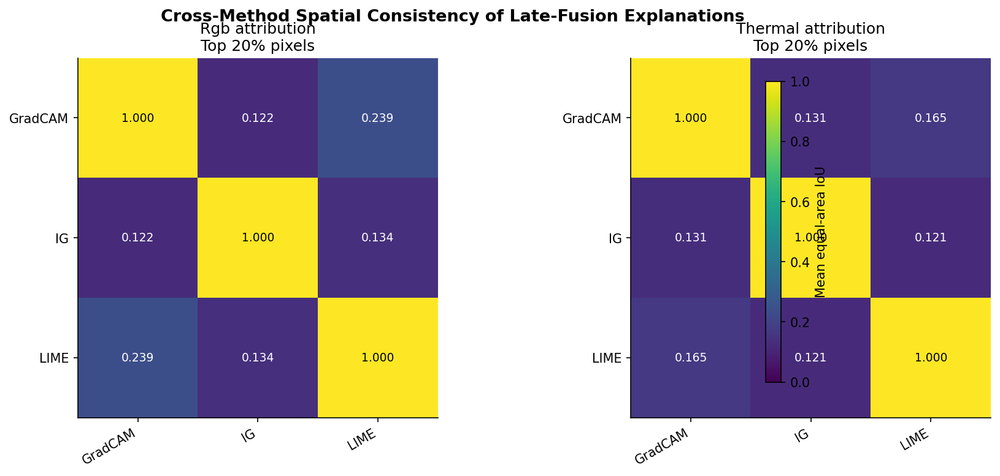

Saved: figures/corrected_posthoc/11_cross_method_agreement_heatmaps.pdf


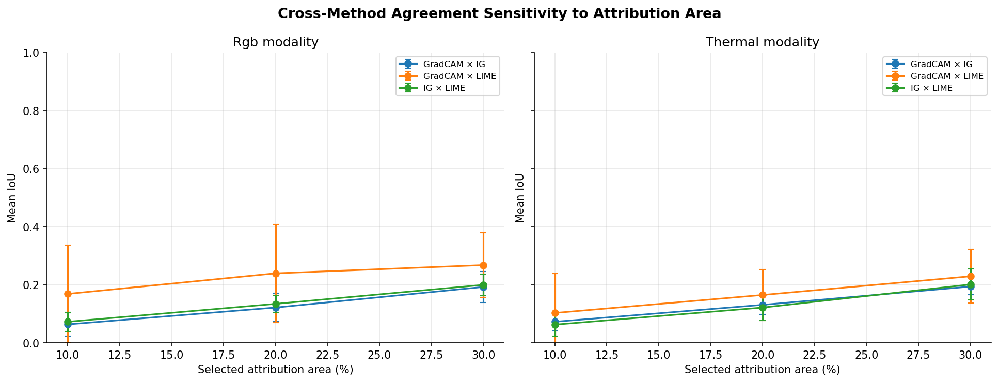

Saved: figures/corrected_posthoc/11_cross_method_threshold_sensitivity.pdf
Saved: figures/corrected_posthoc/11_sample_level_spatial_consistency.csv

Spatial consistency versus confidence (exploratory)


,Group,ConfidenceMeasure,N,PearsonR,PearsonP,SpearmanR,SpearmanP
0,Overall,predicted_confidence,20,0.149482,0.529343,0.118797,0.617892
1,Overall,decision_confidence,20,0.149482,0.529343,0.118797,0.617892
2,TP,predicted_confidence,5,0.493410,0.398285,0.600000,0.284757
3,TP,decision_confidence,5,0.493410,0.398285,0.600000,0.284757
4,TN,predicted_confidence,5,-0.408038,0.495270,0.000000,1.000000
5,TN,decision_confidence,5,-0.408038,0.495270,0.000000,1.000000
6,FP,predicted_confidence,5,-0.383347,0.524140,-0.400000,0.504632
7,FP,decision_confidence,5,-0.383347,0.524140,-0.400000,0.504632
8,FN,predicted_confidence,5,0.213085,0.730759,0.100000,0.872889
9,FN,decision_confidence,5,0.213085,0.730759,0.100000,0.872889


Saved: figures/corrected_posthoc/11_agreement_confidence_correlations.csv


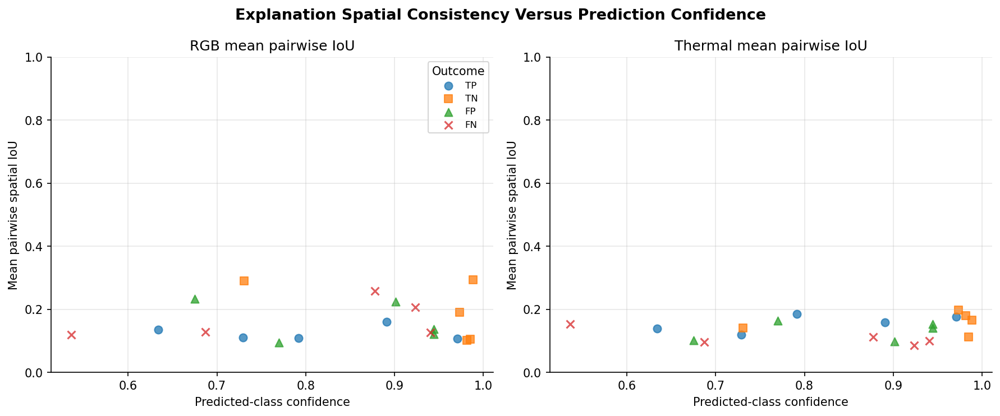

Saved: figures/corrected_posthoc/11_agreement_confidence_scatter.pdf

Corrected cross-method spatial agreement complete.


In [ ]:
# Cross-method spatial consistency

import itertools
import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from scipy.stats import pearsonr, spearmanr
from tqdm.auto import tqdm


# 1. Select representative samples

def select_agreement_sample(
    prediction_df,
    n_per_category=5,
    seed=POSTHOC_SEED,
):
    """
    Select representative test examples from TP, TN, FP, and FN
    outcomes while covering different confidence levels.

    With n_per_category=5, the maximum sample size is 20.
    """
    return stratified_prediction_sample(
        prediction_df,
        n_per_category=n_per_category,
        categories=(
            "TP",
            "TN",
            "FP",
            "FN",
        ),
        seed=seed,
    )


AGREEMENT_TEST_IDXS = select_agreement_sample(
    prediction_table,
    n_per_category=5,
)

print(
    "Cross-method agreement sample size:",
    len(AGREEMENT_TEST_IDXS),
)

display(
    prediction_table[
        prediction_table[
            "sample_idx"
        ].isin(
            AGREEMENT_TEST_IDXS
        )
    ][
        [
            "sample_idx",
            "category",
            "true_label",
            "pred_label",
            "p_anomaly",
            "predicted_confidence",
            "decision_confidence",
        ]
    ].sort_values(
        [
            "category",
            "predicted_confidence",
        ]
    )
)


# 2. Extract corrected sample-specific spatial maps

def get_corrected_spatial_maps(
    model,
    rgb_t,
    th_t,
    target_class,
    sample_idx,
    ig_steps=100,
    lime_num_samples=1000,
):
    """
    Generate sample-specific spatial attribution maps.

    Included methods
    ----------------
    Grad-CAM
        Predicted-class branch-specific Grad-CAM.

    Integrated Gradients
        Positive predicted-class support from corrected joint IG.

    LIME
        Continuous positive predicted-class superpixel weights.

    SHAP is intentionally excluded because Cell 5 provides exact
    embedding-level modality Shapley values, not spatial maps.
    """
    maps = {
        "rgb": {},
        "thermal": {},
    }

    # Grad-CAM maps
    maps[
        "rgb"
    ][
        "GradCAM"
    ] = get_gradcam_map_corrected(
        model,
        rgb_t,
        th_t,
        modality="rgb",
        class_idx=target_class,
    )

    maps[
        "thermal"
    ][
        "GradCAM"
    ] = get_gradcam_map_corrected(
        model,
        rgb_t,
        th_t,
        modality="thermal",
        class_idx=target_class,
    )

    # Corrected joint Integrated Gradients
    ig_rgb, ig_th, _ = integrated_gradients_joint(
        model,
        rgb_t,
        th_t,
        target_class=target_class,
        steps=ig_steps,
    )

    maps[
        "rgb"
    ][
        "IG"
    ] = signed_ig_to_positive_map(
        ig_rgb
    )

    maps[
        "thermal"
    ][
        "IG"
    ] = signed_ig_to_positive_map(
        ig_th
    )

    # Corrected LIME with training-normal hidden-region references
    rgb_lime_explanation, _ = explain_lime_rgb(
        model,
        rgb_t,
        th_t,
        random_state=(
            POSTHOC_SEED
            + int(sample_idx)
        ),
        num_samples=lime_num_samples,
    )

    thermal_lime_explanation, _ = explain_lime_thermal(
        model,
        rgb_t,
        th_t,
        random_state=(
            POSTHOC_SEED
            + 10_000
            + int(sample_idx)
        ),
        num_samples=lime_num_samples,
    )

    maps[
        "rgb"
    ][
        "LIME"
    ] = lime_continuous_map(
        rgb_lime_explanation,
        class_idx=target_class,
        positive_only=True,
    )

    maps[
        "thermal"
    ][
        "LIME"
    ] = lime_continuous_map(
        thermal_lime_explanation,
        class_idx=target_class,
        positive_only=True,
    )

    return maps

# 3. Agreement metrics

def binary_dice(
    mask_a,
    mask_b,
):
    """
    Dice coefficient between two binary maps.
    """
    mask_a = np.asarray(
        mask_a
    ).astype(bool)

    mask_b = np.asarray(
        mask_b
    ).astype(bool)

    intersection = np.logical_and(
        mask_a,
        mask_b,
    ).sum()

    denominator = (
        mask_a.sum()
        + mask_b.sum()
    )

    if denominator == 0:
        return np.nan

    return float(
        2.0
        * intersection
        / denominator
    )


def safe_map_spearman(
    map_a,
    map_b,
):
    """
    Spearman correlation between two normalized continuous maps.

    Degenerate maps return NaN rather than being assigned zero.
    """
    map_a = normalize_map(
        map_a
    ).ravel()

    map_b = normalize_map(
        map_b
    ).ravel()

    if (
        np.std(
            map_a
        )
        <= 1e-8
        or np.std(
            map_b
        )
        <= 1e-8
    ):
        return np.nan

    result = spearmanr(
        map_a,
        map_b,
    )

    return float(
        result.statistic
    )


def pairwise_agreement_record(
    map_a,
    map_b,
    top_fraction,
):
    """
    Compare two attribution maps using:

      - equal-area IoU;
      - equal-area Dice;
      - continuous-map Spearman correlation.

    Equal-area masks reduce sensitivity to differences in attribution
    scale between explanation methods.
    """
    mask_a = binarize_top_fraction(
        map_a,
        top_fraction=top_fraction,
    )

    mask_b = binarize_top_fraction(
        map_b,
        top_fraction=top_fraction,
    )

    valid_a = bool(
        mask_a.sum()
        > 0
    )

    valid_b = bool(
        mask_b.sum()
        > 0
    )

    if not valid_a or not valid_b:
        return {
            "iou": np.nan,
            "dice": np.nan,
            "spearman_map": safe_map_spearman(
                map_a,
                map_b,
            ),
            "valid_a": valid_a,
            "valid_b": valid_b,
        }

    return {
        "iou": binary_iou(
            mask_a,
            mask_b,
        ),
        "dice": binary_dice(
            mask_a,
            mask_b,
        ),
        "spearman_map": safe_map_spearman(
            map_a,
            map_b,
        ),
        "valid_a": valid_a,
        "valid_b": valid_b,
    }


# 4. Evaluate pairwise spatial agreement

def evaluate_cross_method_agreement_corrected(
    model,
    dataset,
    prediction_df,
    sample_indices,
    top_fractions=(
        0.10,
        0.20,
        0.30,
    ),
    ig_steps=100,
    lime_num_samples=1000,
    save_name="11_cross_method_agreement_corrected.csv",
):
    """
    Compute pairwise spatial consistency among Grad-CAM, IG, and LIME.

    The analysis is conducted separately for RGB and thermal maps.

    Agreement is not treated as evidence of correctness or causal
    faithfulness. It only measures consistency among explanation methods.
    """
    methods = [
        "GradCAM",
        "IG",
        "LIME",
    ]

    method_pairs = list(
        itertools.combinations(
            methods,
            2,
        )
    )

    rows = []
    failures = []

    for idx in tqdm(
        sample_indices,
        desc="Cross-method agreement",
    ):
        rgb_t, th_t, y = dataset[
            idx
        ]

        pred_row = prediction_df[
            prediction_df[
                "sample_idx"
            ]
            == idx
        ].iloc[0]

        target_class = int(
            pred_row[
                "pred_label"
            ]
        )

        try:
            maps = get_corrected_spatial_maps(
                model,
                rgb_t,
                th_t,
                target_class=target_class,
                sample_idx=idx,
                ig_steps=ig_steps,
                lime_num_samples=lime_num_samples,
            )

        except Exception as error:
            failures.append(
                {
                    "sample_idx": int(
                        idx
                    ),
                    "category": pred_row[
                        "category"
                    ],
                    "error": str(
                        error
                    ),
                }
            )

            print(
                f"Map extraction failed for sample {idx}: "
                f"{error}"
            )

            continue

        for modality in [
            "rgb",
            "thermal",
        ]:
            for method_a, method_b in method_pairs:
                map_a = maps[
                    modality
                ][
                    method_a
                ]

                map_b = maps[
                    modality
                ][
                    method_b
                ]

                for top_fraction in top_fractions:
                    metrics = pairwise_agreement_record(
                        map_a,
                        map_b,
                        top_fraction=top_fraction,
                    )

                    rows.append(
                        {
                            "sample_idx": int(
                                idx
                            ),
                            "true_label": int(
                                y
                            ),
                            "pred_label": target_class,
                            "category": pred_row[
                                "category"
                            ],
                            "p_anomaly": float(
                                pred_row[
                                    "p_anomaly"
                                ]
                            ),
                            "predicted_confidence": float(
                                pred_row[
                                    "predicted_confidence"
                                ]
                            ),
                            "decision_confidence": float(
                                pred_row[
                                    "decision_confidence"
                                ]
                            ),
                            "modality": modality,
                            "method_a": method_a,
                            "method_b": method_b,
                            "method_pair": (
                                f"{method_a} × {method_b}"
                            ),
                            "top_fraction": float(
                                top_fraction
                            ),
                            **metrics,
                        }
                    )

    agreement_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    agreement_df.to_csv(
        output_path,
        index=False,
    )

    if failures:
        failure_path = (
            POSTHOC_DIR
            / "11_cross_method_failures.csv"
        )

        pd.DataFrame(
            failures
        ).to_csv(
            failure_path,
            index=False,
        )

        print(
            "Failures saved:",
            failure_path,
        )

    print(
        "Agreement results saved:",
        output_path,
    )

    return agreement_df


cross_method_agreement_df = (
    evaluate_cross_method_agreement_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        prediction_table,
        AGREEMENT_TEST_IDXS,
        top_fractions=(
            0.10,
            0.20,
            0.30,
        ),
        ig_steps=100,
        lime_num_samples=1000,
    )
)


# 5. Pairwise agreement summaries

def summarize_cross_method_agreement(
    agreement_df,
):
    """
    Summarize pairwise agreement by modality, method pair,
    and selected attribution area.
    """
    if agreement_df.empty:
        raise ValueError(
            "The agreement dataframe is empty."
        )

    valid = agreement_df.dropna(
        subset=[
            "iou",
            "dice",
        ]
    ).copy()

    summary = (
        valid.groupby(
            [
                "modality",
                "method_pair",
                "top_fraction",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanIoU=(
                "iou",
                "mean",
            ),
            MedianIoU=(
                "iou",
                "median",
            ),
            StdIoU=(
                "iou",
                "std",
            ),
            MeanDice=(
                "dice",
                "mean",
            ),
            MedianDice=(
                "dice",
                "median",
            ),
            MeanMapSpearman=(
                "spearman_map",
                "mean",
            ),
            MedianMapSpearman=(
                "spearman_map",
                "median",
            ),
        )
        .reset_index()
    )

    summary_path = (
        POSTHOC_DIR
        / "11_cross_method_agreement_summary.csv"
    )

    summary.to_csv(
        summary_path,
        index=False,
    )

    print(
        "\nCorrected cross-method spatial agreement"
    )

    display(
        summary
    )

    print(
        "Summary saved:",
        summary_path,
    )

    return summary


cross_method_agreement_summary = (
    summarize_cross_method_agreement(
        cross_method_agreement_df
    )
)


# 6. Agreement heatmaps at the primary 20% area

def plot_agreement_heatmaps(
    agreement_df,
    primary_top_fraction=0.20,
    save_name="11_cross_method_agreement_heatmaps.pdf",
):
    """
    Plot separate RGB and thermal mean-IoU matrices.
    """
    methods = [
        "GradCAM",
        "IG",
        "LIME",
    ]

    modalities = [
        "rgb",
        "thermal",
    ]

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            12,
            5,
        ),
    )

    plotted_image = None

    for ax, modality in zip(
        axes,
        modalities,
    ):
        matrix = pd.DataFrame(
            np.eye(
                len(
                    methods
                )
            ),
            index=methods,
            columns=methods,
            dtype=float,
        )

        sub = agreement_df[
            (
                agreement_df[
                    "modality"
                ]
                == modality
            )
            &
            np.isclose(
                agreement_df[
                    "top_fraction"
                ],
                primary_top_fraction,
            )
        ]

        pair_means = (
            sub.groupby(
                [
                    "method_a",
                    "method_b",
                ]
            )[
                "iou"
            ]
            .mean()
        )

        for (
            method_a,
            method_b,
        ), value in pair_means.items():
            matrix.loc[
                method_a,
                method_b,
            ] = value

            matrix.loc[
                method_b,
                method_a,
            ] = value

        plotted_image = ax.imshow(
            matrix.to_numpy(),
            vmin=0,
            vmax=1,
            cmap="viridis",
        )

        ax.set_xticks(
            range(
                len(
                    methods
                )
            )
        )

        ax.set_yticks(
            range(
                len(
                    methods
                )
            )
        )

        ax.set_xticklabels(
            methods,
            rotation=30,
            ha="right",
        )

        ax.set_yticklabels(
            methods
        )

        ax.set_title(
            (
                f"{modality.capitalize()} attribution\n"
                f"Top {int(primary_top_fraction * 100)}% pixels"
            )
        )

        for row_index in range(
            len(
                methods
            )
        ):
            for column_index in range(
                len(
                    methods
                )
            ):
                value = matrix.iloc[
                    row_index,
                    column_index,
                ]

                text = (
                    f"{value:.3f}"
                    if np.isfinite(
                        value
                    )
                    else "NA"
                )

                ax.text(
                    column_index,
                    row_index,
                    text,
                    ha="center",
                    va="center",
                    color=(
                        "white"
                        if (
                            not np.isfinite(
                                value
                            )
                            or value < 0.5
                        )
                        else "black"
                    ),
                    fontsize=9,
                )

    if plotted_image is not None:
        fig.colorbar(
            plotted_image,
            ax=axes.ravel().tolist(),
            label="Mean equal-area IoU",
            shrink=0.85,
        )

    plt.suptitle(
        (
            "Cross-Method Spatial Consistency "
            "of Late-Fusion Explanations"
        ),
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_agreement_heatmaps(
    cross_method_agreement_df,
    primary_top_fraction=0.20,
)


# 7. Sensitivity to attribution-mask size

def plot_agreement_threshold_sensitivity(
    agreement_df,
    save_name="11_cross_method_threshold_sensitivity.pdf",
):
    """
    Show how agreement changes when selecting the top 10%, 20%,
    or 30% of attribution pixels.
    """
    summary = (
        agreement_df.groupby(
            [
                "modality",
                "method_pair",
                "top_fraction",
            ]
        )[
            "iou"
        ]
        .agg(
            [
                "mean",
                "std",
                "count",
            ]
        )
        .reset_index()
    )

    modalities = [
        "rgb",
        "thermal",
    ]

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            13,
            5,
        ),
        sharey=True,
    )

    for ax, modality in zip(
        axes,
        modalities,
    ):
        modality_df = summary[
            summary[
                "modality"
            ]
            == modality
        ]

        for (
            method_pair,
            pair_df,
        ) in modality_df.groupby(
            "method_pair"
        ):
            pair_df = pair_df.sort_values(
                "top_fraction"
            )

            ax.errorbar(
                pair_df[
                    "top_fraction"
                ]
                * 100,
                pair_df[
                    "mean"
                ],
                yerr=pair_df[
                    "std"
                ].fillna(
                    0.0
                ),
                marker="o",
                capsize=3,
                label=method_pair,
            )

        ax.set_xlabel(
            "Selected attribution area (%)"
        )

        ax.set_ylabel(
            "Mean IoU"
        )

        ax.set_title(
            f"{modality.capitalize()} modality"
        )

        ax.set_ylim(
            0,
            1,
        )

        ax.grid(
            alpha=0.3
        )

        ax.legend(
            fontsize=8,
        )

    plt.suptitle(
        (
            "Cross-Method Agreement Sensitivity "
            "to Attribution Area"
        ),
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_agreement_threshold_sensitivity(
    cross_method_agreement_df
)

# 8. Build sample-level spatial-consistency table

def build_sample_agreement_table(
    agreement_df,
    primary_top_fraction=0.20,
):
    """
    Average pairwise method agreement for each sample and modality.

    This is a spatial-consistency score, not a correctness,
    coherence, or faithfulness score.
    """
    primary_df = agreement_df[
        np.isclose(
            agreement_df[
                "top_fraction"
            ],
            primary_top_fraction,
        )
    ].copy()

    per_modality = (
        primary_df.groupby(
            [
                "sample_idx",
                "category",
                "true_label",
                "pred_label",
                "p_anomaly",
                "predicted_confidence",
                "decision_confidence",
                "modality",
            ]
        )
        .agg(
            mean_pairwise_iou=(
                "iou",
                "mean",
            ),
            median_pairwise_iou=(
                "iou",
                "median",
            ),
            mean_pairwise_dice=(
                "dice",
                "mean",
            ),
            mean_map_spearman=(
                "spearman_map",
                "mean",
            ),
        )
        .reset_index()
    )

    sample_wide = (
        per_modality.pivot_table(
            index=[
                "sample_idx",
                "category",
                "true_label",
                "pred_label",
                "p_anomaly",
                "predicted_confidence",
                "decision_confidence",
            ],
            columns="modality",
            values="mean_pairwise_iou",
        )
        .reset_index()
    )

    sample_wide.columns.name = None

    sample_wide = sample_wide.rename(
        columns={
            "rgb": (
                "rgb_mean_agreement"
            ),
            "thermal": (
                "thermal_mean_agreement"
            ),
        }
    )

    agreement_columns = [
        column
        for column in [
            "rgb_mean_agreement",
            "thermal_mean_agreement",
        ]
        if column in sample_wide.columns
    ]

    sample_wide[
        "overall_mean_agreement"
    ] = sample_wide[
        agreement_columns
    ].mean(
        axis=1
    )

    output_path = (
        POSTHOC_DIR
        / "11_sample_level_spatial_consistency.csv"
    )

    sample_wide.to_csv(
        output_path,
        index=False,
    )

    print(
        "Saved:",
        output_path,
    )

    return sample_wide


sample_spatial_consistency_df = (
    build_sample_agreement_table(
        cross_method_agreement_df,
        primary_top_fraction=0.20,
    )
)


# 9. Exploratory confidence correlations

def safe_confidence_correlation(
    dataframe,
    x_column,
    y_column,
):
    """
    Return Pearson and Spearman correlations when enough distinct
    observations are available.
    """
    sub = dataframe.dropna(
        subset=[
            x_column,
            y_column,
        ]
    )

    if (
        len(
            sub
        )
        < 4
        or sub[
            x_column
        ].nunique()
        < 3
        or sub[
            y_column
        ].nunique()
        < 3
    ):
        return {
            "N": len(
                sub
            ),
            "PearsonR": np.nan,
            "PearsonP": np.nan,
            "SpearmanR": np.nan,
            "SpearmanP": np.nan,
        }

    pearson_result = pearsonr(
        sub[
            x_column
        ],
        sub[
            y_column
        ],
    )

    spearman_result = spearmanr(
        sub[
            x_column
        ],
        sub[
            y_column
        ],
    )

    return {
        "N": len(
            sub
        ),
        "PearsonR": float(
            pearson_result.statistic
        ),
        "PearsonP": float(
            pearson_result.pvalue
        ),
        "SpearmanR": float(
            spearman_result.statistic
        ),
        "SpearmanP": float(
            spearman_result.pvalue
        ),
    }


def analyze_agreement_confidence_relation(
    sample_df,
):
    """
    Exploratory association between spatial consistency and prediction
    confidence.

    No causal or explanation-quality interpretation should be made.
    """
    rows = []

    groups = [
        (
            "Overall",
            sample_df,
        )
    ]

    for category in [
        "TP",
        "TN",
        "FP",
        "FN",
    ]:
        category_df = sample_df[
            sample_df[
                "category"
            ]
            == category
        ]

        if not category_df.empty:
            groups.append(
                (
                    category,
                    category_df,
                )
            )

    for group_name, group_df in groups:
        for confidence_measure in [
            "predicted_confidence",
            "decision_confidence",
        ]:
            results = safe_confidence_correlation(
                group_df,
                confidence_measure,
                "overall_mean_agreement",
            )

            rows.append(
                {
                    "Group": group_name,
                    "ConfidenceMeasure": (
                        confidence_measure
                    ),
                    **results,
                }
            )

    correlation_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / "11_agreement_confidence_correlations.csv"
    )

    correlation_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nSpatial consistency versus confidence "
        "(exploratory)"
    )

    display(
        correlation_df
    )

    print(
        "Saved:",
        output_path,
    )

    return correlation_df


agreement_confidence_correlations = (
    analyze_agreement_confidence_relation(
        sample_spatial_consistency_df
    )
)


# 10. Confidence-scatter figure

def plot_agreement_confidence_scatter(
    sample_df,
    save_name="11_agreement_confidence_scatter.pdf",
):
    """
    Plot spatial consistency against predicted-class confidence.
    """
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            12,
            5,
        ),
    )

    category_markers = {
        "TP": "o",
        "TN": "s",
        "FP": "^",
        "FN": "x",
    }

    plot_specs = [
        (
            "rgb_mean_agreement",
            "RGB mean pairwise IoU",
        ),
        (
            "thermal_mean_agreement",
            "Thermal mean pairwise IoU",
        ),
    ]

    for ax, (
        agreement_column,
        title,
    ) in zip(
        axes,
        plot_specs,
    ):
        if agreement_column not in sample_df.columns:
            ax.set_visible(
                False
            )
            continue

        for category, marker in category_markers.items():
            category_df = sample_df[
                sample_df[
                    "category"
                ]
                == category
            ].dropna(
                subset=[
                    agreement_column,
                ]
            )

            if category_df.empty:
                continue

            ax.scatter(
                category_df[
                    "predicted_confidence"
                ],
                category_df[
                    agreement_column
                ],
                marker=marker,
                alpha=0.75,
                s=45,
                label=category,
            )

        ax.set_xlabel(
            "Predicted-class confidence"
        )

        ax.set_ylabel(
            "Mean pairwise spatial IoU"
        )

        ax.set_title(
            title
        )

        ax.set_ylim(
            0,
            1,
        )

        ax.grid(
            alpha=0.3
        )

    axes[
        0
    ].legend(
        title="Outcome",
        fontsize=8,
    )

    plt.suptitle(
        (
            "Explanation Spatial Consistency "
            "Versus Prediction Confidence"
        ),
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_agreement_confidence_scatter(
    sample_spatial_consistency_df
)

# 11. Save metadata

agreement_metadata = {
    "analysis": (
        "Cross-method spatial consistency"
    ),
    "methods": [
        "Grad-CAM",
        "Joint Integrated Gradients",
        "LIME",
    ],
    "excluded_method": (
        "SHAP was excluded because the exact modality Shapley "
        "analysis is embedding-level and does not produce spatial maps"
    ),
    "model": (
        "Late-Fusion"
    ),
    "target": (
        "Predicted class"
    ),
    "modalities_analyzed_separately": [
        "RGB",
        "Thermal",
    ],
    "sample_design": (
        "Representative TP/TN/FP/FN test examples "
        "stratified across confidence"
    ),
    "lime_hidden_region_reference": (
        "Training-normal mean modality baseline"
    ),
    "primary_mask_area": 0.20,
    "mask_area_sensitivity": [
        0.10,
        0.20,
        0.30,
    ],
    "metrics": [
        "Equal-area IoU",
        "Dice coefficient",
        "Continuous-map Spearman correlation",
    ],
    "interpretation_limit": (
        "Agreement measures consistency among methods, not explanation "
        "correctness, causal validity, or faithfulness"
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "11_cross_method_agreement_metadata.json",
    "w",
) as file:
    json.dump(
        agreement_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected cross-method spatial agreement complete."
)

CCME sample size: 60


,N,MeanPAnomaly,MeanPredictedConfidence
category,,,
FN,15,0.193509,0.806491
FP,15,0.758442,0.758442
TN,15,0.067313,0.932687
TP,15,0.842318,0.842318


Corrected CCME:   0%|          | 0/60 [00:00<?, ?it/s]

CCME results saved: figures/corrected_posthoc/12_ccme_corrected.csv

CCME status counts


,analysis,modality,status,N,MeanStartMargin,MeanEndMargin
0,necessity,rgb,factual_positive_crossing,12,1.202185,-1.554097
1,necessity,rgb,factual_positive_no_crossing,18,2.016902,1.518464
2,necessity,rgb,not_applicable_factual_nonpositive,30,-2.586737,-2.906822
3,necessity,thermal,factual_positive_crossing,28,1.653788,-2.387942
4,necessity,thermal,factual_positive_no_crossing,2,2.212187,0.790182
5,necessity,thermal,not_applicable_factual_nonpositive,30,-2.586737,-2.855655
6,sufficiency,rgb,baseline_nonpositive_crossing,4,-3.868094,0.685439
7,sufficiency,rgb,baseline_nonpositive_no_crossing,56,-3.868094,-2.744525
8,sufficiency,thermal,baseline_nonpositive_crossing,20,-3.868094,1.432378
9,sufficiency,thermal,baseline_nonpositive_no_crossing,40,-3.868094,-2.679226



CCME applicability and crossing incidence


,analysis,modality,NTotal,NApplicable,NObservedCrossings,NPredictedLinearCrossings,FlipStatusAgreementRate,NMultipleCrossings,NMonotonicPaths,ObservedCrossingRateAmongApplicable
0,necessity,rgb,60,30,12,14,0.966667,0,31,0.400000
1,necessity,thermal,60,30,28,30,0.966667,0,39,0.933333
2,sufficiency,rgb,60,60,4,4,1.000000,0,40,0.066667
3,sufficiency,thermal,60,60,20,20,1.000000,0,45,0.333333



Conditional CCME crossing-alpha summary


,analysis,modality,NCrossings,MeanAlpha,MedianAlpha,StdAlpha,Q25Alpha,Q75Alpha,MeanLinearAlpha,MeanAbsoluteLinearError,MedianAbsoluteLinearError
0,necessity,rgb,12,0.524581,0.625703,0.328836,0.178157,0.802747,0.441535,0.083046,0.072065
1,necessity,thermal,28,0.486410,0.552534,0.252991,0.305665,0.643518,0.382414,0.114973,0.089389
2,sufficiency,rgb,4,0.777712,0.798584,0.054426,0.772047,0.804249,0.851238,0.073526,0.070912
3,sufficiency,thermal,20,0.668748,0.672637,0.246172,0.581318,0.836501,0.756819,0.089570,0.053654


Saved: figures/corrected_posthoc/12_ccme_crossing_alpha_summary.csv

CCME endpoint-linear approximation validation


,analysis,modality,NTotal,NApplicable,ObservedCrossings,PredictedLinearCrossings,FlipStatusAgreementRate,MeanAbsoluteAlphaError,MedianAbsoluteAlphaError,MeanSignedAlphaBias,NPairedCrossings,PearsonR,PearsonP,SpearmanR,SpearmanP
0,necessity,rgb,60,30,12,12,1.0,0.083046,0.072065,-0.083046,12,0.981596,1.612361e-08,0.986014,4.116896e-09
1,necessity,thermal,60,30,28,28,1.0,0.114973,0.089389,-0.103996,28,0.869701,1.876409e-09,0.859880,4.553502e-09
2,sufficiency,rgb,60,60,4,4,1.0,0.073526,0.070912,0.073526,4,0.996916,3.083947e-03,1.000000,0.000000e+00
3,sufficiency,thermal,60,60,20,20,1.0,0.089570,0.053654,0.088071,20,0.963893,8.688773e-12,0.993985,9.577981e-19


Saved: figures/corrected_posthoc/12_ccme_linear_validation.csv


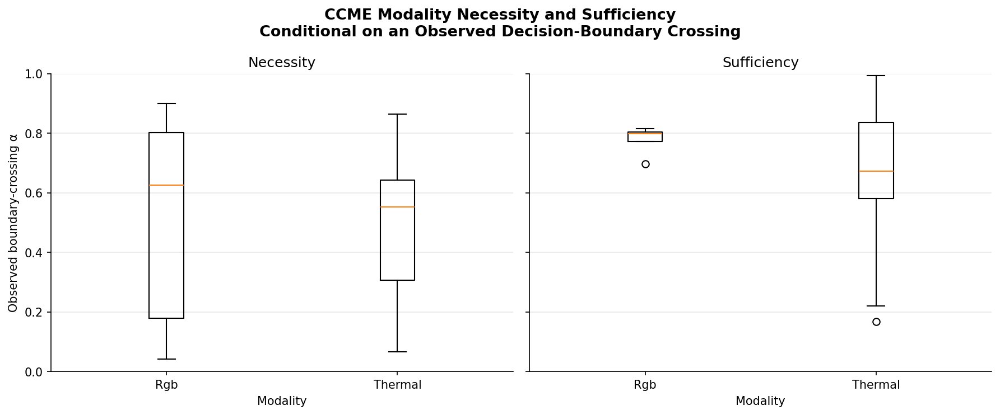

Saved: figures/corrected_posthoc/12_ccme_crossing_distributions.pdf


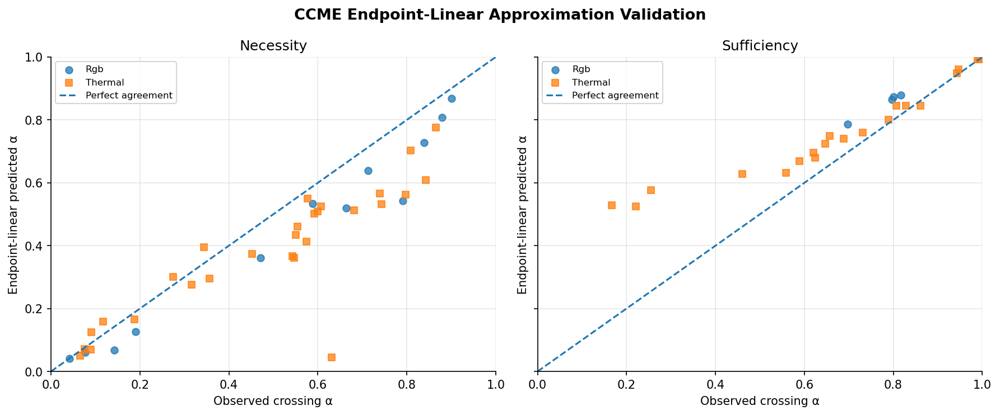

Saved: figures/corrected_posthoc/12_ccme_linear_validation.pdf

CCME by prediction outcome


,category,analysis,modality,N,NApplicable,NObservedCrossings,MeanAlphaAmongCrossings,MedianAlphaAmongCrossings,NMultipleCrossings,MeanMonotonicityViolationFraction,CrossingRateAmongApplicable
0,FN,necessity,rgb,15,0,0,NaN,NaN,0,0.456667,NaN
1,FN,necessity,thermal,15,0,0,NaN,NaN,0,0.290667,NaN
2,FN,sufficiency,rgb,15,15,0,NaN,NaN,0,0.032667,0.000000
3,FN,sufficiency,thermal,15,15,2,0.824998,0.824998,0,0.128000,0.133333
4,FP,necessity,rgb,15,15,6,0.445850,0.388892,0,0.211333,0.400000
5,FP,necessity,thermal,15,15,14,0.432200,0.547061,0,0.022667,0.933333
6,FP,sufficiency,rgb,15,15,1,0.816587,0.816587,0,0.020000,0.066667
7,FP,sufficiency,thermal,15,15,9,0.764270,0.788931,0,0.000000,0.600000
8,TN,necessity,rgb,15,0,0,NaN,NaN,0,0.339333,NaN
9,TN,necessity,thermal,15,0,0,NaN,NaN,0,0.768000,NaN


Saved: figures/corrected_posthoc/12_ccme_by_outcome.csv


CCME baseline sensitivity:   0%|          | 0/20 [00:00<?, ?it/s]


CCME baseline sensitivity


N  CrossingRate  MeanAlpha  MedianAlpha
baseline        analysis    modality                                          
mixed_training  necessity   rgb       20          0.30   0.656667        0.795
                            thermal   20          0.70   0.590714        0.620
                sufficiency rgb       20          0.15   0.615000        0.615
                            thermal   20          0.45   0.446111        0.465
normal_training necessity   rgb       20          0.30   0.605000        0.690
                            thermal   20          0.70   0.540000        0.565
                sufficiency rgb       20          0.15   0.765000        0.795
                            thermal   20          0.45   0.538333        0.555

Saved: figures/corrected_posthoc/12_ccme_baseline_sensitivity.csv

Corrected CCME analysis complete.


In [ ]:
# Refined seed-42 CCME necessity and sufficiency analysis

import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from scipy.stats import pearsonr, spearmanr
from tqdm.auto import tqdm


# 1. CCME configuration

CCME_BOUNDARY = 0.0
CCME_GRID_POINTS = 101
CCME_BISECTION_TOLERANCE = 1e-5
CCME_BISECTION_MAX_ITERATIONS = 60

CCME_MODALITIES = (
    "rgb",
    "thermal",
)

CCME_ANALYSES = (
    "necessity",
    "sufficiency",
)


# ------------------------------------------------------------
# 2. Required-object checks
# ------------------------------------------------------------

required_ccme_objects = [
    "LATE_FUSION_MODEL",
    "TRAIN_RGB_EMBED_BASELINE",
    "TRAIN_TH_EMBED_BASELINE",
    "extract_lf_embeddings",
    "late_fusion_margin_from_embeddings",
    "prediction_table",
    "POSTHOC_DIR",
]

missing_ccme_objects = [
    object_name
    for object_name in required_ccme_objects
    if object_name not in globals()
]

if missing_ccme_objects:
    raise NameError(
        "Run Cells 1 and 5 before Cell 7. Missing: "
        + ", ".join(
            missing_ccme_objects
        )
    )


# 3. Embedding interpolation paths


def interpolate_embedding(
    start_embedding,
    end_embedding,
    alpha,
):
    """
    Linear interpolation:

        z(alpha) = (1-alpha) * start + alpha * end

    alpha=0:
        start embedding

    alpha=1:
        end embedding
    """
    start_embedding = np.asarray(
        start_embedding,
        dtype=np.float32,
    )

    end_embedding = np.asarray(
        end_embedding,
        dtype=np.float32,
    )

    alpha = float(
        alpha
    )

    return (
        (1.0 - alpha)
        * start_embedding
        + alpha
        * end_embedding
    ).astype(
        np.float32
    )


def ccme_margin_at_alpha(
    model,
    factual_rgb_embedding,
    factual_thermal_embedding,
    modality,
    analysis,
    alpha,
    rgb_baseline=None,
    thermal_baseline=None,
):
    """
    Evaluate the anomaly logit margin along a CCME path.

    Necessity
    ---------
    Start at the factual multimodal prediction and progressively
    replace one modality with its training-normal baseline.

    alpha=0:
        factual RGB + factual thermal

    alpha=1:
        selected modality at baseline; other modality factual

    Sufficiency
    -----------
    Start from both modality baselines and progressively add one
    factual modality while the other modality remains at baseline.

    alpha=0:
        baseline RGB + baseline thermal

    alpha=1:
        selected modality factual; other modality baseline
    """
    if rgb_baseline is None:
        rgb_baseline = (
            TRAIN_RGB_EMBED_BASELINE
        )

    if thermal_baseline is None:
        thermal_baseline = (
            TRAIN_TH_EMBED_BASELINE
        )

    factual_rgb_embedding = np.asarray(
        factual_rgb_embedding,
        dtype=np.float32,
    )

    factual_thermal_embedding = np.asarray(
        factual_thermal_embedding,
        dtype=np.float32,
    )

    rgb_baseline = np.asarray(
        rgb_baseline,
        dtype=np.float32,
    )

    thermal_baseline = np.asarray(
        thermal_baseline,
        dtype=np.float32,
    )

    if modality not in CCME_MODALITIES:
        raise ValueError(
            "modality must be 'rgb' or 'thermal'."
        )

    if analysis == "necessity":
        if modality == "rgb":
            rgb_embedding = interpolate_embedding(
                factual_rgb_embedding,
                rgb_baseline,
                alpha,
            )

            thermal_embedding = (
                factual_thermal_embedding
            )

        else:
            rgb_embedding = (
                factual_rgb_embedding
            )

            thermal_embedding = interpolate_embedding(
                factual_thermal_embedding,
                thermal_baseline,
                alpha,
            )

    elif analysis == "sufficiency":
        if modality == "rgb":
            rgb_embedding = interpolate_embedding(
                rgb_baseline,
                factual_rgb_embedding,
                alpha,
            )

            thermal_embedding = (
                thermal_baseline
            )

        else:
            rgb_embedding = (
                rgb_baseline
            )

            thermal_embedding = interpolate_embedding(
                thermal_baseline,
                factual_thermal_embedding,
                alpha,
            )

    else:
        raise ValueError(
            "analysis must be 'necessity' or 'sufficiency'."
        )

    return late_fusion_margin_from_embeddings(
        model,
        rgb_embedding,
        thermal_embedding,
    )

# 4. Path evaluation and diagnostic checks

def count_boundary_crossings(
    margins,
    boundary=CCME_BOUNDARY,
):
    """
    Count sign transitions around the decision boundary.

    Exact boundary values are handled without treating long runs
    of zeros as many separate crossings.
    """
    margins = np.asarray(
        margins,
        dtype=np.float64,
    )

    centered = (
        margins
        - float(
            boundary
        )
    )

    signs = np.sign(
        centered
    )

    # Forward-fill exact zeros where possible.
    for index in range(
        1,
        len(
            signs
        ),
    ):
        if signs[
            index
        ] == 0:
            signs[
                index
            ] = signs[
                index - 1
            ]

    # Back-fill leading zeros.
    for index in range(
        len(
            signs
        )
        - 2,
        -1,
        -1,
    ):
        if signs[
            index
        ] == 0:
            signs[
                index
            ] = signs[
                index + 1
            ]

    nonzero_signs = signs[
        signs != 0
    ]

    if len(
        nonzero_signs
    ) < 2:
        return 0

    return int(
        np.sum(
            nonzero_signs[:-1]
            != nonzero_signs[1:]
        )
    )


def assess_path_monotonicity(
    margins,
    analysis,
    tolerance=1e-7,
):
    """
    Check the expected margin direction.

    Necessity:
        anomaly margin is expected to decrease as a modality
        is replaced by baseline.

    Sufficiency:
        anomaly margin is expected to increase as a modality
        is added from baseline.

    A path may still be scientifically meaningful when nonmonotonic,
    but the first crossing must then be interpreted cautiously.
    """
    margins = np.asarray(
        margins,
        dtype=np.float64,
    )

    differences = np.diff(
        margins
    )

    if analysis == "necessity":
        violating_steps = int(
            np.sum(
                differences
                > tolerance
            )
        )

    elif analysis == "sufficiency":
        violating_steps = int(
            np.sum(
                differences
                < -tolerance
            )
        )

    else:
        raise ValueError(
            "analysis must be 'necessity' or 'sufficiency'."
        )

    total_steps = len(
        differences
    )

    violation_fraction = (
        violating_steps
        / total_steps
        if total_steps > 0
        else np.nan
    )

    return {
        "monotonic_expected_direction": bool(
            violating_steps == 0
        ),
        "monotonicity_violations": (
            violating_steps
        ),
        "monotonicity_violation_fraction": float(
            violation_fraction
        ),
    }


def evaluate_ccme_path(
    model,
    factual_rgb_embedding,
    factual_thermal_embedding,
    modality,
    analysis,
    grid_points=CCME_GRID_POINTS,
):
    """
    Evaluate a CCME path on a dense alpha grid.
    """
    if grid_points < 3:
        raise ValueError(
            "grid_points must be at least 3."
        )

    alphas = np.linspace(
        0.0,
        1.0,
        int(
            grid_points
        ),
        dtype=np.float64,
    )

    margins = np.array(
        [
            ccme_margin_at_alpha(
                model,
                factual_rgb_embedding,
                factual_thermal_embedding,
                modality=modality,
                analysis=analysis,
                alpha=alpha,
            )
            for alpha in alphas
        ],
        dtype=np.float64,
    )

    diagnostics = assess_path_monotonicity(
        margins,
        analysis=analysis,
    )

    diagnostics[
        "number_of_boundary_crossings"
    ] = count_boundary_crossings(
        margins,
        boundary=CCME_BOUNDARY,
    )

    diagnostics[
        "multiple_crossings"
    ] = bool(
        diagnostics[
            "number_of_boundary_crossings"
        ]
        > 1
    )

    return (
        alphas,
        margins,
        diagnostics,
    )

# 5. Status classification

def classify_ccme_status(
    analysis,
    start_margin,
    end_margin,
    boundary=CCME_BOUNDARY,
):
    """
    Assign an explicit applicability/crossing status.

    Necessity
    ---------
    factual_positive_crossing:
        Factual prediction is anomaly-positive and attenuation
        eventually crosses below the boundary.

    factual_positive_no_crossing:
        Factual prediction is anomaly-positive but the modality can
        be fully replaced without crossing.

    not_applicable_factual_nonpositive:
        The factual sample is already anomaly-negative, so anomaly
        necessity is not defined.

    Sufficiency
    -----------
    baseline_nonpositive_crossing:
        Baseline begins anomaly-negative and adding the modality
        crosses into anomaly-positive.

    baseline_nonpositive_no_crossing:
        Adding the modality fully does not recover anomaly positivity.

    baseline_already_positive:
        The all-baseline state is already anomaly-positive, so
        sufficiency relative to that baseline is not identifiable.
    """
    start_positive = bool(
        start_margin
        > boundary
    )

    end_positive = bool(
        end_margin
        > boundary
    )

    if analysis == "necessity":
        if not start_positive:
            return (
                "not_applicable_factual_nonpositive"
            )

        if not end_positive:
            return (
                "factual_positive_crossing"
            )

        return (
            "factual_positive_no_crossing"
        )

    if analysis == "sufficiency":
        if start_positive:
            return (
                "baseline_already_positive"
            )

        if end_positive:
            return (
                "baseline_nonpositive_crossing"
            )

        return (
            "baseline_nonpositive_no_crossing"
        )

    raise ValueError(
        "analysis must be 'necessity' or 'sufficiency'."
    )


# 6. Precise first-crossing root finder

def find_first_crossing_bracket(
    alphas,
    margins,
    analysis,
    boundary=CCME_BOUNDARY,
):
    """
    Find the first grid interval containing the expected crossing.

    Necessity:
        positive -> nonpositive

    Sufficiency:
        nonpositive -> positive
    """
    alphas = np.asarray(
        alphas,
        dtype=np.float64,
    )

    margins = np.asarray(
        margins,
        dtype=np.float64,
    )

    for index in range(
        len(
            alphas
        )
        - 1
    ):
        left_margin = margins[
            index
        ]

        right_margin = margins[
            index + 1
        ]

        if analysis == "necessity":
            crossed = bool(
                left_margin
                > boundary
                and right_margin
                <= boundary
            )

        elif analysis == "sufficiency":
            crossed = bool(
                left_margin
                <= boundary
                and right_margin
                > boundary
            )

        else:
            raise ValueError(
                "analysis must be 'necessity' or 'sufficiency'."
            )

        if crossed:
            return (
                float(
                    alphas[
                        index
                    ]
                ),
                float(
                    alphas[
                        index + 1
                    ]
                ),
                float(
                    left_margin
                ),
                float(
                    right_margin
                ),
            )

    return None


def refine_ccme_crossing_bisection(
    model,
    factual_rgb_embedding,
    factual_thermal_embedding,
    modality,
    analysis,
    alpha_left,
    alpha_right,
    tolerance=CCME_BISECTION_TOLERANCE,
    max_iterations=CCME_BISECTION_MAX_ITERATIONS,
):
    """
    Refine the first crossing using bisection.
    """
    left = float(
        alpha_left
    )

    right = float(
        alpha_right
    )

    margin_left = ccme_margin_at_alpha(
        model,
        factual_rgb_embedding,
        factual_thermal_embedding,
        modality=modality,
        analysis=analysis,
        alpha=left,
    )

    margin_right = ccme_margin_at_alpha(
        model,
        factual_rgb_embedding,
        factual_thermal_embedding,
        modality=modality,
        analysis=analysis,
        alpha=right,
    )

    for iteration in range(
        int(
            max_iterations
        )
    ):
        midpoint = 0.5 * (
            left
            + right
        )

        margin_midpoint = ccme_margin_at_alpha(
            model,
            factual_rgb_embedding,
            factual_thermal_embedding,
            modality=modality,
            analysis=analysis,
            alpha=midpoint,
        )

        if abs(
            margin_midpoint
            - CCME_BOUNDARY
        ) <= tolerance:
            return {
                "alpha_observed": float(
                    midpoint
                ),
                "margin_at_root": float(
                    margin_midpoint
                ),
                "bisection_iterations": int(
                    iteration + 1
                ),
            }

        if analysis == "necessity":
            if margin_midpoint > CCME_BOUNDARY:
                left = midpoint
                margin_left = margin_midpoint
            else:
                right = midpoint
                margin_right = margin_midpoint

        else:
            if margin_midpoint <= CCME_BOUNDARY:
                left = midpoint
                margin_left = margin_midpoint
            else:
                right = midpoint
                margin_right = margin_midpoint

        if (
            right
            - left
        ) <= tolerance:
            break

    root_alpha = 0.5 * (
        left
        + right
    )

    root_margin = ccme_margin_at_alpha(
        model,
        factual_rgb_embedding,
        factual_thermal_embedding,
        modality=modality,
        analysis=analysis,
        alpha=root_alpha,
    )

    return {
        "alpha_observed": float(
            root_alpha
        ),
        "margin_at_root": float(
            root_margin
        ),
        "bisection_iterations": int(
            iteration + 1
        ),
    }


# 7. Endpoint-linear crossing approximation

def endpoint_linear_crossing(
    start_margin,
    end_margin,
    boundary=CCME_BOUNDARY,
):
    """
    Crossing predicted by the line joining path endpoints.

        m(alpha) =
            start + alpha * (end - start)

    Solve m(alpha) = boundary.
    """
    denominator = (
        end_margin
        - start_margin
    )

    if abs(
        denominator
    ) <= 1e-12:
        return np.nan

    alpha = (
        boundary
        - start_margin
    ) / denominator

    if (
        alpha < 0.0
        or alpha > 1.0
    ):
        return np.nan

    return float(
        alpha
    )

# 8. Single CCME record

def compute_ccme_record(
    model,
    factual_rgb_embedding,
    factual_thermal_embedding,
    sample_metadata,
    modality,
    analysis,
    grid_points=CCME_GRID_POINTS,
):
    """
    Compute one modality-specific necessity or sufficiency record.
    """
    alphas, margins, diagnostics = (
        evaluate_ccme_path(
            model,
            factual_rgb_embedding,
            factual_thermal_embedding,
            modality=modality,
            analysis=analysis,
            grid_points=grid_points,
        )
    )

    start_margin = float(
        margins[
            0
        ]
    )

    end_margin = float(
        margins[
            -1
        ]
    )

    status = classify_ccme_status(
        analysis,
        start_margin,
        end_margin,
    )

    crossing_statuses = {
        "factual_positive_crossing",
        "baseline_nonpositive_crossing",
    }

    has_expected_endpoint_crossing = bool(
        status
        in crossing_statuses
    )

    alpha_observed = np.nan
    margin_at_root = np.nan
    bisection_iterations = np.nan
    bracket_left = np.nan
    bracket_right = np.nan

    if has_expected_endpoint_crossing:
        bracket = find_first_crossing_bracket(
            alphas,
            margins,
            analysis=analysis,
        )

        if bracket is not None:
            (
                bracket_left,
                bracket_right,
                bracket_margin_left,
                bracket_margin_right,
            ) = bracket

            root_result = (
                refine_ccme_crossing_bisection(
                    model,
                    factual_rgb_embedding,
                    factual_thermal_embedding,
                    modality=modality,
                    analysis=analysis,
                    alpha_left=bracket_left,
                    alpha_right=bracket_right,
                )
            )

            alpha_observed = root_result[
                "alpha_observed"
            ]

            margin_at_root = root_result[
                "margin_at_root"
            ]

            bisection_iterations = (
                root_result[
                    "bisection_iterations"
                ]
            )

    alpha_linear = endpoint_linear_crossing(
        start_margin,
        end_margin,
    )

    observed_crossing = bool(
        np.isfinite(
            alpha_observed
        )
    )

    predicted_crossing = bool(
        np.isfinite(
            alpha_linear
        )
    )

    flip_agreement = bool(
        observed_crossing
        ==
        predicted_crossing
    )

    alpha_absolute_error = (
        abs(
            alpha_observed
            - alpha_linear
        )
        if (
            observed_crossing
            and predicted_crossing
        )
        else np.nan
    )

    return {
        **sample_metadata,
        "analysis": analysis,
        "modality": modality,
        "status": status,
        "applicable": bool(
            status
            not in {
                "not_applicable_factual_nonpositive",
                "baseline_already_positive",
            }
        ),
        "observed_crossing": observed_crossing,
        "predicted_linear_crossing": predicted_crossing,
        "flip_status_agreement": flip_agreement,
        "alpha_observed": (
            float(
                alpha_observed
            )
            if np.isfinite(
                alpha_observed
            )
            else np.nan
        ),
        "alpha_linear": (
            float(
                alpha_linear
            )
            if np.isfinite(
                alpha_linear
            )
            else np.nan
        ),
        "alpha_absolute_error": (
            float(
                alpha_absolute_error
            )
            if np.isfinite(
                alpha_absolute_error
            )
            else np.nan
        ),
        "start_margin": start_margin,
        "end_margin": end_margin,
        "margin_change": float(
            end_margin
            - start_margin
        ),
        "margin_at_root": (
            float(
                margin_at_root
            )
            if np.isfinite(
                margin_at_root
            )
            else np.nan
        ),
        "bracket_left": (
            float(
                bracket_left
            )
            if np.isfinite(
                bracket_left
            )
            else np.nan
        ),
        "bracket_right": (
            float(
                bracket_right
            )
            if np.isfinite(
                bracket_right
            )
            else np.nan
        ),
        "bisection_iterations": (
            int(
                bisection_iterations
            )
            if np.isfinite(
                bisection_iterations
            )
            else np.nan
        ),
        "grid_points": int(
            grid_points
        ),
        **diagnostics,
    }

# 9. Representative CCME sample selection

def select_ccme_sample(
    prediction_df,
    n_per_category=15,
    seed=POSTHOC_SEED,
):
    """
    Select up to 60 representative examples:

      15 TP
      15 TN
      15 FP
      15 FN

    Sampling is confidence-stratified and reproducible.
    """
    return stratified_prediction_sample(
        prediction_df,
        n_per_category=n_per_category,
        categories=(
            "TP",
            "TN",
            "FP",
            "FN",
        ),
        seed=seed,
    )


CCME_TEST_IDXS = select_ccme_sample(
    prediction_table,
    n_per_category=15,
)

print(
    "CCME sample size:",
    len(
        CCME_TEST_IDXS
    ),
)

display(
    prediction_table[
        prediction_table[
            "sample_idx"
        ].isin(
            CCME_TEST_IDXS
        )
    ]
    .groupby(
        "category"
    )
    .agg(
        N=(
            "sample_idx",
            "size",
        ),
        MeanPAnomaly=(
            "p_anomaly",
            "mean",
        ),
        MeanPredictedConfidence=(
            "predicted_confidence",
            "mean",
        ),
    )
)

# 10. Evaluate corrected CCME

def evaluate_corrected_ccme(
    model,
    dataset,
    prediction_df,
    sample_indices,
    grid_points=CCME_GRID_POINTS,
    save_name="12_ccme_corrected.csv",
):
    """
    Compute RGB and thermal necessity and sufficiency records.
    """
    rows = []
    failures = []

    for sample_idx in tqdm(
        sample_indices,
        desc="Corrected CCME",
    ):
        try:
            rgb_t, th_t, true_label = dataset[
                sample_idx
            ]

            prediction_row = prediction_df[
                prediction_df[
                    "sample_idx"
                ]
                == sample_idx
            ].iloc[0]

            factual_rgb_embedding, factual_thermal_embedding = (
                extract_lf_embeddings(
                    model,
                    rgb_t,
                    th_t,
                )
            )

            sample_metadata = {
                "sample_idx": int(
                    sample_idx
                ),
                "true_label": int(
                    true_label
                ),
                "pred_label": int(
                    prediction_row[
                        "pred_label"
                    ]
                ),
                "category": prediction_row[
                    "category"
                ],
                "p_anomaly": float(
                    prediction_row[
                        "p_anomaly"
                    ]
                ),
                "predicted_confidence": float(
                    prediction_row[
                        "predicted_confidence"
                    ]
                ),
                "decision_confidence": float(
                    prediction_row[
                        "decision_confidence"
                    ]
                ),
            }

            for analysis in CCME_ANALYSES:
                for modality in CCME_MODALITIES:
                    rows.append(
                        compute_ccme_record(
                            model,
                            factual_rgb_embedding,
                            factual_thermal_embedding,
                            sample_metadata=(
                                sample_metadata
                            ),
                            modality=modality,
                            analysis=analysis,
                            grid_points=grid_points,
                        )
                    )

        except Exception as error:
            failures.append(
                {
                    "sample_idx": int(
                        sample_idx
                    ),
                    "error": str(
                        error
                    ),
                }
            )

            print(
                f"CCME failed for sample "
                f"{sample_idx}: {error}"
            )

    ccme_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    ccme_df.to_csv(
        output_path,
        index=False,
    )

    if failures:
        failure_path = (
            POSTHOC_DIR
            / "12_ccme_failures.csv"
        )

        pd.DataFrame(
            failures
        ).to_csv(
            failure_path,
            index=False,
        )

        print(
            "Failures saved:",
            failure_path,
        )

    print(
        "CCME results saved:",
        output_path,
    )

    return ccme_df


ccme_corrected_df = evaluate_corrected_ccme(
    LATE_FUSION_MODEL,
    datasets["test"],
    prediction_table,
    CCME_TEST_IDXS,
    grid_points=CCME_GRID_POINTS,
)

# 11. Status and flip-incidence summaries

def summarize_ccme_statuses(
    ccme_df,
):
    """
    Report applicability and crossing incidence before reporting
    conditional alpha distributions.
    """
    status_summary = (
        ccme_df.groupby(
            [
                "analysis",
                "modality",
                "status",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanStartMargin=(
                "start_margin",
                "mean",
            ),
            MeanEndMargin=(
                "end_margin",
                "mean",
            ),
        )
        .reset_index()
    )

    status_path = (
        POSTHOC_DIR
        / "12_ccme_status_summary.csv"
    )

    status_summary.to_csv(
        status_path,
        index=False,
    )

    applicability_summary = (
        ccme_df.groupby(
            [
                "analysis",
                "modality",
            ]
        )
        .agg(
            NTotal=(
                "sample_idx",
                "size",
            ),
            NApplicable=(
                "applicable",
                "sum",
            ),
            NObservedCrossings=(
                "observed_crossing",
                "sum",
            ),
            NPredictedLinearCrossings=(
                "predicted_linear_crossing",
                "sum",
            ),
            FlipStatusAgreementRate=(
                "flip_status_agreement",
                "mean",
            ),
            NMultipleCrossings=(
                "multiple_crossings",
                "sum",
            ),
            NMonotonicPaths=(
                "monotonic_expected_direction",
                "sum",
            ),
        )
        .reset_index()
    )

    applicability_summary[
        "ObservedCrossingRateAmongApplicable"
    ] = (
        applicability_summary[
            "NObservedCrossings"
        ]
        /
        applicability_summary[
            "NApplicable"
        ].replace(
            0,
            np.nan,
        )
    )

    applicability_path = (
        POSTHOC_DIR
        / "12_ccme_applicability_summary.csv"
    )

    applicability_summary.to_csv(
        applicability_path,
        index=False,
    )

    print(
        "\nCCME status counts"
    )

    display(
        status_summary
    )

    print(
        "\nCCME applicability and crossing incidence"
    )

    display(
        applicability_summary
    )

    return (
        status_summary,
        applicability_summary,
    )


(
    ccme_status_summary,
    ccme_applicability_summary,
) = summarize_ccme_statuses(
    ccme_corrected_df
)


# 12. Conditional crossing-alpha summaries

def summarize_ccme_crossing_alphas(
    ccme_df,
):
    """
    Summarize alpha only among records with an observed crossing.

    No-crossing and non-applicable cases remain represented in the
    status/incidence summaries rather than being silently discarded.
    """
    crossing_df = ccme_df[
        ccme_df[
            "observed_crossing"
        ]
    ].copy()

    if crossing_df.empty:
        print(
            "\nNo observed CCME crossings."
        )

        return pd.DataFrame()

    summary = (
        crossing_df.groupby(
            [
                "analysis",
                "modality",
            ]
        )
        .agg(
            NCrossings=(
                "sample_idx",
                "size",
            ),
            MeanAlpha=(
                "alpha_observed",
                "mean",
            ),
            MedianAlpha=(
                "alpha_observed",
                "median",
            ),
            StdAlpha=(
                "alpha_observed",
                "std",
            ),
            Q25Alpha=(
                "alpha_observed",
                lambda values: values.quantile(
                    0.25
                ),
            ),
            Q75Alpha=(
                "alpha_observed",
                lambda values: values.quantile(
                    0.75
                ),
            ),
            MeanLinearAlpha=(
                "alpha_linear",
                "mean",
            ),
            MeanAbsoluteLinearError=(
                "alpha_absolute_error",
                "mean",
            ),
            MedianAbsoluteLinearError=(
                "alpha_absolute_error",
                "median",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "12_ccme_crossing_alpha_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nConditional CCME crossing-alpha summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


ccme_crossing_alpha_summary = (
    summarize_ccme_crossing_alphas(
        ccme_corrected_df
    )
)


# 13. Endpoint-linear approximation validation

def safe_ccme_correlation(
    observed_values,
    predicted_values,
):
    observed_values = np.asarray(
        observed_values,
        dtype=np.float64,
    )

    predicted_values = np.asarray(
        predicted_values,
        dtype=np.float64,
    )

    valid = (
        np.isfinite(
            observed_values
        )
        &
        np.isfinite(
            predicted_values
        )
    )

    observed_values = observed_values[
        valid
    ]

    predicted_values = predicted_values[
        valid
    ]

    if (
        len(
            observed_values
        )
        < 3
        or np.std(
            observed_values
        )
        <= 1e-12
        or np.std(
            predicted_values
        )
        <= 1e-12
    ):
        return {
            "NPairedCrossings": len(
                observed_values
            ),
            "PearsonR": np.nan,
            "PearsonP": np.nan,
            "SpearmanR": np.nan,
            "SpearmanP": np.nan,
        }

    pearson_result = pearsonr(
        observed_values,
        predicted_values,
    )

    spearman_result = spearmanr(
        observed_values,
        predicted_values,
    )

    return {
        "NPairedCrossings": len(
            observed_values
        ),
        "PearsonR": float(
            pearson_result.statistic
        ),
        "PearsonP": float(
            pearson_result.pvalue
        ),
        "SpearmanR": float(
            spearman_result.statistic
        ),
        "SpearmanP": float(
            spearman_result.pvalue
        ),
    }


def validate_ccme_linear_approximation(
    ccme_df,
):
    """
    Validate two distinct questions:

    1. Does the endpoint approximation correctly predict whether
       a crossing exists?

    2. Conditional on both methods predicting a crossing, how close
       are the estimated alpha values?
    """
    rows = []

    for analysis in CCME_ANALYSES:
        for modality in CCME_MODALITIES:
            subset = ccme_df[
                (
                    ccme_df[
                        "analysis"
                    ]
                    == analysis
                )
                &
                (
                    ccme_df[
                        "modality"
                    ]
                    == modality
                )
            ].copy()

            applicable = subset[
                subset[
                    "applicable"
                ]
            ].copy()

            paired = applicable[
                applicable[
                    "observed_crossing"
                ]
                &
                applicable[
                    "predicted_linear_crossing"
                ]
            ].copy()

            correlations = safe_ccme_correlation(
                paired[
                    "alpha_observed"
                ],
                paired[
                    "alpha_linear"
                ],
            )

            rows.append(
                {
                    "analysis": analysis,
                    "modality": modality,
                    "NTotal": len(
                        subset
                    ),
                    "NApplicable": len(
                        applicable
                    ),
                    "ObservedCrossings": int(
                        applicable[
                            "observed_crossing"
                        ].sum()
                    ),
                    "PredictedLinearCrossings": int(
                        applicable[
                            "predicted_linear_crossing"
                        ].sum()
                    ),
                    "FlipStatusAgreementRate": (
                        applicable[
                            "flip_status_agreement"
                        ].mean()
                        if len(
                            applicable
                        )
                        > 0
                        else np.nan
                    ),
                    "MeanAbsoluteAlphaError": (
                        paired[
                            "alpha_absolute_error"
                        ].mean()
                        if len(
                            paired
                        )
                        > 0
                        else np.nan
                    ),
                    "MedianAbsoluteAlphaError": (
                        paired[
                            "alpha_absolute_error"
                        ].median()
                        if len(
                            paired
                        )
                        > 0
                        else np.nan
                    ),
                    "MeanSignedAlphaBias": (
                        (
                            paired[
                                "alpha_linear"
                            ]
                            -
                            paired[
                                "alpha_observed"
                            ]
                        ).mean()
                        if len(
                            paired
                        )
                        > 0
                        else np.nan
                    ),
                    **correlations,
                }
            )

    validation_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / "12_ccme_linear_validation.csv"
    )

    validation_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nCCME endpoint-linear approximation validation"
    )

    display(
        validation_df
    )

    print(
        "Saved:",
        output_path,
    )

    return validation_df


ccme_linear_validation = (
    validate_ccme_linear_approximation(
        ccme_corrected_df
    )
)

# 14. CCME alpha boxplots

def plot_ccme_crossing_distributions(
    ccme_df,
    save_name="12_ccme_crossing_distributions.pdf",
):
    """
    Plot conditional alpha distributions while preserving correct labels
    when one modality has no crossings.
    """
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            12,
            5,
        ),
        sharey=True,
    )

    for ax, analysis in zip(
        axes,
        CCME_ANALYSES,
    ):
        plotting_pairs = []

        for modality in CCME_MODALITIES:
            values = (
                ccme_df[
                    (
                        ccme_df[
                            "analysis"
                        ]
                        == analysis
                    )
                    &
                    (
                        ccme_df[
                            "modality"
                        ]
                        == modality
                    )
                    &
                    (
                        ccme_df[
                            "observed_crossing"
                        ]
                    )
                ][
                    "alpha_observed"
                ]
                .dropna()
                .to_numpy()
            )

            if len(
                values
            ) > 0:
                plotting_pairs.append(
                    (
                        modality.capitalize(),
                        values,
                    )
                )

        if not plotting_pairs:
            ax.text(
                0.5,
                0.5,
                "No observed crossings",
                ha="center",
                va="center",
                transform=ax.transAxes,
            )

            ax.set_title(
                analysis.capitalize()
            )

            continue

        labels = [
            label
            for label, values
            in plotting_pairs
        ]

        values = [
            values
            for label, values
            in plotting_pairs
        ]

        ax.boxplot(
            values,
            labels=labels,
            showfliers=True,
        )

        ax.set_title(
            analysis.capitalize()
        )

        ax.set_xlabel(
            "Modality"
        )

        ax.set_ylim(
            0,
            1,
        )

        ax.grid(
            alpha=0.3,
            axis="y",
        )

    axes[
        0
    ].set_ylabel(
        "Observed boundary-crossing α"
    )

    plt.suptitle(
        (
            "CCME Modality Necessity and Sufficiency\n"
            "Conditional on an Observed Decision-Boundary Crossing"
        ),
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_ccme_crossing_distributions(
    ccme_corrected_df
)

# 15. Observed versus linear alpha figure

def plot_ccme_linear_validation(
    ccme_df,
    save_name="12_ccme_linear_validation.pdf",
):
    """
    Plot observed roots against endpoint-linear approximations.
    """
    paired_df = ccme_df[
        ccme_df[
            "observed_crossing"
        ]
        &
        ccme_df[
            "predicted_linear_crossing"
        ]
    ].copy()

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            12,
            5,
        ),
        sharex=True,
        sharey=True,
    )

    for ax, analysis in zip(
        axes,
        CCME_ANALYSES,
    ):
        analysis_df = paired_df[
            paired_df[
                "analysis"
            ]
            == analysis
        ]

        for modality, marker in [
            (
                "rgb",
                "o",
            ),
            (
                "thermal",
                "s",
            ),
        ]:
            modality_df = analysis_df[
                analysis_df[
                    "modality"
                ]
                == modality
            ]

            if modality_df.empty:
                continue

            ax.scatter(
                modality_df[
                    "alpha_observed"
                ],
                modality_df[
                    "alpha_linear"
                ],
                marker=marker,
                alpha=0.75,
                label=modality.capitalize(),
            )

        ax.plot(
            [
                0,
                1,
            ],
            [
                0,
                1,
            ],
            linestyle="--",
            linewidth=1.5,
            label="Perfect agreement",
        )

        ax.set_xlim(
            0,
            1,
        )

        ax.set_ylim(
            0,
            1,
        )

        ax.set_xlabel(
            "Observed crossing α"
        )

        ax.set_ylabel(
            "Endpoint-linear predicted α"
        )

        ax.set_title(
            analysis.capitalize()
        )

        ax.grid(
            alpha=0.3
        )

        ax.legend(
            fontsize=8,
        )

    plt.suptitle(
        "CCME Endpoint-Linear Approximation Validation",
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_ccme_linear_validation(
    ccme_corrected_df
)

# 16. Outcome-specific CCME summary

def summarize_ccme_by_prediction_outcome(
    ccme_df,
):
    """
    Report crossing incidence by TP/TN/FP/FN outcome.

    This prevents false negatives from being interpreted as necessity
    failures. For anomaly-negative factual predictions, anomaly necessity
    is explicitly marked not applicable.
    """
    summary = (
        ccme_df.groupby(
            [
                "category",
                "analysis",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            NApplicable=(
                "applicable",
                "sum",
            ),
            NObservedCrossings=(
                "observed_crossing",
                "sum",
            ),
            MeanAlphaAmongCrossings=(
                "alpha_observed",
                "mean",
            ),
            MedianAlphaAmongCrossings=(
                "alpha_observed",
                "median",
            ),
            NMultipleCrossings=(
                "multiple_crossings",
                "sum",
            ),
            MeanMonotonicityViolationFraction=(
                "monotonicity_violation_fraction",
                "mean",
            ),
        )
        .reset_index()
    )

    summary[
        "CrossingRateAmongApplicable"
    ] = (
        summary[
            "NObservedCrossings"
        ]
        /
        summary[
            "NApplicable"
        ].replace(
            0,
            np.nan,
        )
    )

    output_path = (
        POSTHOC_DIR
        / "12_ccme_by_outcome.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nCCME by prediction outcome"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


ccme_by_outcome = (
    summarize_ccme_by_prediction_outcome(
        ccme_corrected_df
    )
)


# 17. Baseline-sensitivity analysis

def evaluate_ccme_baseline_sensitivity(
    model,
    dataset,
    prediction_df,
    sample_indices,
    mixed_rgb_baseline,
    mixed_thermal_baseline,
    grid_points=101,
    save_name="12_ccme_baseline_sensitivity.csv",
):
    """
    Compare the primary normal-training embedding baseline with the
    mixed-training embedding baseline created in Cell 5.

    This sensitivity analysis is performed on a smaller representative
    sample because path evaluation is computationally more expensive.
    """
    rows = []

    baseline_specs = [
        (
            "normal_training",
            TRAIN_RGB_EMBED_BASELINE,
            TRAIN_TH_EMBED_BASELINE,
        ),
        (
            "mixed_training",
            mixed_rgb_baseline,
            mixed_thermal_baseline,
        ),
    ]

    for sample_idx in tqdm(
        sample_indices,
        desc="CCME baseline sensitivity",
    ):
        rgb_t, th_t, true_label = dataset[
            sample_idx
        ]

        prediction_row = prediction_df[
            prediction_df[
                "sample_idx"
            ]
            == sample_idx
        ].iloc[0]

        factual_rgb, factual_thermal = (
            extract_lf_embeddings(
                model,
                rgb_t,
                th_t,
            )
        )

        for (
            baseline_name,
            rgb_baseline,
            thermal_baseline,
        ) in baseline_specs:
            for analysis in CCME_ANALYSES:
                for modality in CCME_MODALITIES:
                    alphas = np.linspace(
                        0.0,
                        1.0,
                        grid_points,
                    )

                    margins = []

                    for alpha in alphas:
                        if analysis == "necessity":
                            if modality == "rgb":
                                rgb_current = (
                                    interpolate_embedding(
                                        factual_rgb,
                                        rgb_baseline,
                                        alpha,
                                    )
                                )

                                thermal_current = (
                                    factual_thermal
                                )

                            else:
                                rgb_current = (
                                    factual_rgb
                                )

                                thermal_current = (
                                    interpolate_embedding(
                                        factual_thermal,
                                        thermal_baseline,
                                        alpha,
                                    )
                                )

                        else:
                            if modality == "rgb":
                                rgb_current = (
                                    interpolate_embedding(
                                        rgb_baseline,
                                        factual_rgb,
                                        alpha,
                                    )
                                )

                                thermal_current = (
                                    thermal_baseline
                                )

                            else:
                                rgb_current = (
                                    rgb_baseline
                                )

                                thermal_current = (
                                    interpolate_embedding(
                                        thermal_baseline,
                                        factual_thermal,
                                        alpha,
                                    )
                                )

                        margins.append(
                            late_fusion_margin_from_embeddings(
                                model,
                                rgb_current,
                                thermal_current,
                            )
                        )

                    margins = np.asarray(
                        margins,
                        dtype=np.float64,
                    )

                    status = classify_ccme_status(
                        analysis,
                        margins[
                            0
                        ],
                        margins[
                            -1
                        ],
                    )

                    bracket = find_first_crossing_bracket(
                        alphas,
                        margins,
                        analysis=analysis,
                    )

                    if bracket is None:
                        alpha_crossing = np.nan
                    else:
                        alpha_crossing = 0.5 * (
                            bracket[
                                0
                            ]
                            + bracket[
                                1
                            ]
                        )

                    rows.append(
                        {
                            "sample_idx": int(
                                sample_idx
                            ),
                            "category": prediction_row[
                                "category"
                            ],
                            "baseline": baseline_name,
                            "analysis": analysis,
                            "modality": modality,
                            "status": status,
                            "observed_crossing": bool(
                                np.isfinite(
                                    alpha_crossing
                                )
                            ),
                            "alpha_grid_estimate": (
                                float(
                                    alpha_crossing
                                )
                                if np.isfinite(
                                    alpha_crossing
                                )
                                else np.nan
                            ),
                        }
                    )

    sensitivity_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    sensitivity_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nCCME baseline sensitivity"
    )

    display(
        sensitivity_df.groupby(
            [
                "baseline",
                "analysis",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            CrossingRate=(
                "observed_crossing",
                "mean",
            ),
            MeanAlpha=(
                "alpha_grid_estimate",
                "mean",
            ),
            MedianAlpha=(
                "alpha_grid_estimate",
                "median",
            ),
        )
    )

    print(
        "Saved:",
        output_path,
    )

    return sensitivity_df


if (
    "MIXED_RGB_EMBED_BASELINE"
    in globals()
    and "MIXED_TH_EMBED_BASELINE"
    in globals()
):
    ccme_baseline_sensitivity = (
        evaluate_ccme_baseline_sensitivity(
            LATE_FUSION_MODEL,
            datasets["test"],
            prediction_table,
            CCME_TEST_IDXS[:20],
            mixed_rgb_baseline=(
                MIXED_RGB_EMBED_BASELINE
            ),
            mixed_thermal_baseline=(
                MIXED_TH_EMBED_BASELINE
            ),
            grid_points=101,
        )
    )

else:
    ccme_baseline_sensitivity = None

    print(
        "\nMixed-training embedding baseline was not found. "
        "CCME baseline-sensitivity analysis was skipped."
    )

# 18. Save CCME metadata

ccme_metadata = {
    "method": (
        "Cross-Modal Counterfactual Explanation"
    ),
    "model": (
        "Late-Fusion"
    ),
    "decision_function": (
        "Anomaly logit minus normal logit"
    ),
    "decision_boundary": 0.0,
    "primary_baseline": (
        "Mean RGB and thermal embeddings from a fixed random "
        "sample of normal training examples"
    ),
    "necessity_path": (
        "Factual multimodal embedding to selected-modality baseline "
        "while the other modality remains factual"
    ),
    "sufficiency_path": (
        "All-baseline embedding to selected-modality factual embedding "
        "while the other modality remains at baseline"
    ),
    "grid_points": int(
        CCME_GRID_POINTS
    ),
    "root_refinement": (
        "Dense-grid first bracket followed by bisection"
    ),
    "bisection_tolerance": float(
        CCME_BISECTION_TOLERANCE
    ),
    "no_crossing_handling": (
        "Retained as explicit censored/status outcome; "
        "not silently discarded"
    ),
    "necessity_applicability": (
        "Anomaly necessity is applicable only when the factual "
        "anomaly margin is positive"
    ),
    "sufficiency_applicability": (
        "Anomaly sufficiency is identifiable only when the all-baseline "
        "anomaly margin is nonpositive"
    ),
    "linear_validation": (
        "Endpoint crossing incidence plus conditional alpha error, "
        "bias, Pearson correlation and Spearman correlation"
    ),
    "path_diagnostics": [
        "Expected-direction monotonicity",
        "Monotonicity violation fraction",
        "Number of decision-boundary crossings",
        "Multiple-crossing indicator",
    ],
    "sample_design": (
        "Representative TP/TN/FP/FN examples stratified "
        "across prediction confidence"
    ),
    "interpretation": {
        "necessity_alpha": (
            "Fraction of modality-to-baseline attenuation required "
            "to remove an anomaly-positive decision"
        ),
        "sufficiency_alpha": (
            "Fraction of baseline-to-factual modality addition required "
            "to produce an anomaly-positive decision"
        ),
        "no_necessity_crossing": (
            "The selected modality can be fully replaced without "
            "removing the anomaly-positive decision"
        ),
        "no_sufficiency_crossing": (
            "The selected modality alone cannot recover the "
            "anomaly-positive decision from the baseline state"
        ),
    },
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION"
        in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "12_ccme_metadata.json",
    "w",
) as file:
    json.dump(
        ccme_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected CCME analysis complete."
)

Explanation-complexity sample size: 80


,N,MeanAnomalyProbability,MeanPredictedConfidence,MeanDecisionConfidence
category,,,,
FN,20,0.164368,0.835632,0.335632
FP,20,0.762201,0.762201,0.262201
TN,20,0.051713,0.948287,0.448287
TP,20,0.859902,0.859902,0.359902


Explanation complexity:   0%|          | 0/80 [00:00<?, ?it/s]

Complexity results saved: figures/corrected_posthoc/13_complexity_corrected.csv

Explanation-complexity validity summary


,Modality,NTotal,NValid,NInvalidOrDegenerate,MeanNormalizedEntropy,MedianNormalizedEntropy,StdNormalizedEntropy
0,RGB,80,78,2,0.935393,0.952292,0.050544
1,Thermal,80,79,1,0.913324,0.915334,0.030587


Saved: figures/corrected_posthoc/13_complexity_validity_summary.csv

Explanation complexity associations


,Group,EntropyMeasure,ConfidenceMeasure,N,PearsonR,PearsonP,SpearmanR,SpearmanP
0,Overall,RGB,Anomaly probability,78,0.080461,0.483754,0.017539,0.878860
1,Overall,RGB,Predicted-class confidence,78,-0.003352,0.976763,0.053858,0.639558
2,Overall,RGB,Decision confidence,78,-0.003352,0.976763,0.053858,0.639558
3,Overall,Thermal,Anomaly probability,79,-0.288082,0.010037,-0.276217,0.013736
4,Overall,Thermal,Predicted-class confidence,79,0.132104,0.245828,0.111100,0.329678
5,Overall,Thermal,Decision confidence,79,0.132104,0.245828,0.111100,0.329678
6,Overall,Branch mean,Anomaly probability,77,-0.090046,0.436091,-0.174641,0.128736
7,Overall,Branch mean,Predicted-class confidence,77,0.064337,0.578284,0.131185,0.255440
8,Overall,Branch mean,Decision confidence,77,0.064337,0.578284,0.131185,0.255440
9,TP,RGB,Anomaly probability,20,-0.004595,0.984660,0.096241,0.686487


Saved: figures/corrected_posthoc/13_complexity_correlations.csv

Explanation complexity by prediction outcome


,category,N,RGBValid,ThermalValid,RGBMeanEntropy,RGBMedianEntropy,ThermalMeanEntropy,ThermalMedianEntropy,MeanBranchEntropy,MeanPredictedConfidence
0,FN,20,20,20,0.916923,0.943019,0.922951,0.925564,0.919937,0.835632
1,FP,20,20,19,0.945254,0.954015,0.900786,0.909393,0.922125,0.762201
2,TN,20,18,20,0.946193,0.959478,0.919491,0.924920,0.930105,0.948287
3,TP,20,20,20,0.934280,0.952808,0.909439,0.910938,0.921860,0.859902


Saved: figures/corrected_posthoc/13_complexity_by_outcome.csv


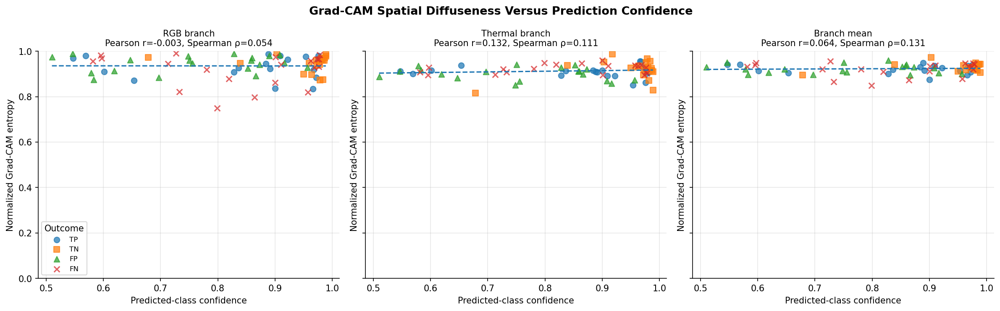

Saved: figures/corrected_posthoc/13_complexity_scatter_corrected.pdf


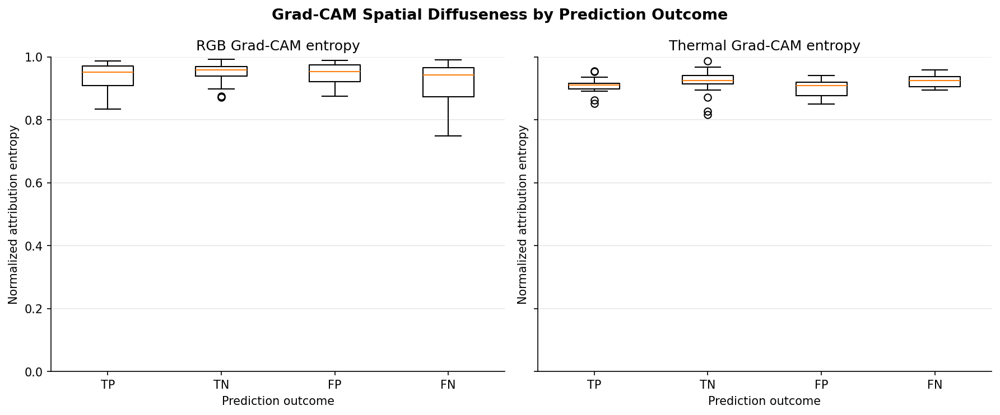

Saved: figures/corrected_posthoc/13_complexity_by_outcome.pdf

Corrected explanation-complexity analysis complete.


In [ ]:
# Explanation complexity analysis

import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from scipy.stats import pearsonr, spearmanr
from tqdm.auto import tqdm


# 1. Required-object checks

required_complexity_objects = [
    "LATE_FUSION_MODEL",
    "datasets",
    "prediction_table",
    "get_gradcam_map_corrected",
    "stratified_prediction_sample",
    "POSTHOC_DIR",
]

missing_complexity_objects = [
    object_name
    for object_name in required_complexity_objects
    if object_name not in globals()
]

if missing_complexity_objects:
    raise NameError(
        "Run Cells 1 and 2 before Cell 8. Missing: "
        + ", ".join(
            missing_complexity_objects
        )
    )

# 2. Corrected normalized attribution entropy

def normalized_attribution_entropy(
    attribution_map,
    minimum_total=1e-10,
    minimum_std=1e-10,
):
    """
    Compute normalized Shannon entropy of a nonnegative attribution map.

    H_normalized = H / log(N)

    where N is the number of pixels.

    Interpretation
    --------------
    Values near 0:
        attribution is spatially concentrated.

    Values near 1:
        attribution is spatially diffuse.

    Degenerate maps
    ---------------
    A map with negligible total attribution or negligible spatial
    variation is returned as invalid rather than being interpreted
    as highly concentrated.
    """
    attribution = np.asarray(
        attribution_map,
        dtype=np.float64,
    )

    if attribution.ndim != 2:
        raise ValueError(
            "Expected a two-dimensional attribution map, "
            f"received shape {attribution.shape}."
        )

    attribution = np.nan_to_num(
        attribution,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )

    # Entropy requires nonnegative mass.
    attribution = np.clip(
        attribution,
        0.0,
        None,
    )

    total_attribution = float(
        attribution.sum()
    )

    attribution_std = float(
        attribution.std()
    )

    number_of_pixels = int(
        attribution.size
    )

    if (
        total_attribution <= minimum_total
        or attribution_std <= minimum_std
        or number_of_pixels <= 1
    ):
        return {
            "valid": False,
            "normalized_entropy": np.nan,
            "raw_entropy": np.nan,
            "effective_pixels": np.nan,
            "total_attribution": total_attribution,
            "map_std": attribution_std,
        }

    probability_mass = (
        attribution
        / total_attribution
    )

    positive_mass = probability_mass[
        probability_mass > 0
    ]

    raw_entropy = float(
        -np.sum(
            positive_mass
            * np.log(
                positive_mass
            )
        )
    )

    maximum_entropy = float(
        np.log(
            number_of_pixels
        )
    )

    normalized_entropy = (
        raw_entropy
        / maximum_entropy
        if maximum_entropy > 0
        else np.nan
    )

    # exp(H) is the effective number of equally weighted pixels.
    effective_pixels = float(
        np.exp(
            raw_entropy
        )
    )

    return {
        "valid": True,
        "normalized_entropy": float(
            normalized_entropy
        ),
        "raw_entropy": raw_entropy,
        "effective_pixels": effective_pixels,
        "total_attribution": total_attribution,
        "map_std": attribution_std,
    }

# 3. Representative complexity sample

def select_complexity_sample(
    prediction_df,
    n_per_category=20,
    seed=POSTHOC_SEED,
):
    """
    Select up to 80 representative test examples:

      20 TP
      20 TN
      20 FP
      20 FN

    Sampling is reproducible and stratified across confidence levels.
    """
    return stratified_prediction_sample(
        prediction_df,
        n_per_category=n_per_category,
        categories=(
            "TP",
            "TN",
            "FP",
            "FN",
        ),
        seed=seed,
    )


COMPLEXITY_TEST_IDXS = select_complexity_sample(
    prediction_table,
    n_per_category=20,
)

print(
    "Explanation-complexity sample size:",
    len(
        COMPLEXITY_TEST_IDXS
    ),
)

display(
    prediction_table[
        prediction_table[
            "sample_idx"
        ].isin(
            COMPLEXITY_TEST_IDXS
        )
    ]
    .groupby(
        "category"
    )
    .agg(
        N=(
            "sample_idx",
            "size",
        ),
        MeanAnomalyProbability=(
            "p_anomaly",
            "mean",
        ),
        MeanPredictedConfidence=(
            "predicted_confidence",
            "mean",
        ),
        MeanDecisionConfidence=(
            "decision_confidence",
            "mean",
        ),
    )
)


# 4. Evaluate Grad-CAM spatial complexity

def evaluate_explanation_complexity_corrected(
    model,
    dataset,
    prediction_df,
    sample_indices,
    save_name="13_complexity_corrected.csv",
):
    """
    Compute branch-specific normalized Grad-CAM entropy.

    For each sample:
      - predicted class;
      - anomaly probability;
      - predicted-class confidence;
      - distance from the 0.5 decision boundary;
      - RGB Grad-CAM normalized entropy;
      - thermal Grad-CAM normalized entropy;
      - branch-mean entropy when both maps are valid.

    This analysis measures spatial diffuseness, not explanation quality
    or causal faithfulness.
    """
    rows = []
    failures = []

    for sample_idx in tqdm(
        sample_indices,
        desc="Explanation complexity",
    ):
        try:
            rgb_t, th_t, true_label = dataset[
                sample_idx
            ]

            prediction_row = prediction_df[
                prediction_df[
                    "sample_idx"
                ]
                == sample_idx
            ].iloc[0]

            target_class = int(
                prediction_row[
                    "pred_label"
                ]
            )

            rgb_cam = get_gradcam_map_corrected(
                model,
                rgb_t,
                th_t,
                modality="rgb",
                class_idx=target_class,
            )

            thermal_cam = get_gradcam_map_corrected(
                model,
                rgb_t,
                th_t,
                modality="thermal",
                class_idx=target_class,
            )

            rgb_entropy = normalized_attribution_entropy(
                rgb_cam
            )

            thermal_entropy = normalized_attribution_entropy(
                thermal_cam
            )

            valid_entropy_values = [
                value
                for value in [
                    rgb_entropy[
                        "normalized_entropy"
                    ],
                    thermal_entropy[
                        "normalized_entropy"
                    ],
                ]
                if np.isfinite(
                    value
                )
            ]

            mean_normalized_entropy = (
                float(
                    np.mean(
                        valid_entropy_values
                    )
                )
                if len(
                    valid_entropy_values
                )
                == 2
                else np.nan
            )

            rows.append(
                {
                    "sample_idx": int(
                        sample_idx
                    ),
                    "true_label": int(
                        true_label
                    ),
                    "pred_label": target_class,
                    "category": prediction_row[
                        "category"
                    ],
                    "correct": int(
                        prediction_row[
                            "true_label"
                        ]
                        ==
                        prediction_row[
                            "pred_label"
                        ]
                    ),
                    "p_anomaly": float(
                        prediction_row[
                            "p_anomaly"
                        ]
                    ),
                    "predicted_confidence": float(
                        prediction_row[
                            "predicted_confidence"
                        ]
                    ),
                    "decision_confidence": float(
                        prediction_row[
                            "decision_confidence"
                        ]
                    ),
                    "rgb_valid": bool(
                        rgb_entropy[
                            "valid"
                        ]
                    ),
                    "thermal_valid": bool(
                        thermal_entropy[
                            "valid"
                        ]
                    ),
                    "rgb_normalized_entropy": (
                        rgb_entropy[
                            "normalized_entropy"
                        ]
                    ),
                    "thermal_normalized_entropy": (
                        thermal_entropy[
                            "normalized_entropy"
                        ]
                    ),
                    "mean_normalized_entropy": (
                        mean_normalized_entropy
                    ),
                    "rgb_raw_entropy": rgb_entropy[
                        "raw_entropy"
                    ],
                    "thermal_raw_entropy": thermal_entropy[
                        "raw_entropy"
                    ],
                    "rgb_effective_pixels": rgb_entropy[
                        "effective_pixels"
                    ],
                    "thermal_effective_pixels": (
                        thermal_entropy[
                            "effective_pixels"
                        ]
                    ),
                    "rgb_total_attribution": (
                        rgb_entropy[
                            "total_attribution"
                        ]
                    ),
                    "thermal_total_attribution": (
                        thermal_entropy[
                            "total_attribution"
                        ]
                    ),
                    "rgb_map_std": rgb_entropy[
                        "map_std"
                    ],
                    "thermal_map_std": thermal_entropy[
                        "map_std"
                    ],
                }
            )

        except Exception as error:
            failures.append(
                {
                    "sample_idx": int(
                        sample_idx
                    ),
                    "error": str(
                        error
                    ),
                }
            )

            print(
                f"Complexity analysis failed for "
                f"sample {sample_idx}: {error}"
            )

    complexity_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    complexity_df.to_csv(
        output_path,
        index=False,
    )

    if failures:
        failure_path = (
            POSTHOC_DIR
            / "13_complexity_failures.csv"
        )

        pd.DataFrame(
            failures
        ).to_csv(
            failure_path,
            index=False,
        )

        print(
            "Failures saved:",
            failure_path,
        )

    print(
        "Complexity results saved:",
        output_path,
    )

    return complexity_df


complexity_corrected_df = (
    evaluate_explanation_complexity_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        prediction_table,
        COMPLEXITY_TEST_IDXS,
    )
)


# 5. Validity and descriptive summaries

def summarize_complexity_validity(
    complexity_df,
):
    """
    Report invalid and degenerate maps explicitly.
    """
    summary = pd.DataFrame(
        {
            "Modality": [
                "RGB",
                "Thermal",
            ],
            "NTotal": [
                len(
                    complexity_df
                ),
                len(
                    complexity_df
                ),
            ],
            "NValid": [
                int(
                    complexity_df[
                        "rgb_valid"
                    ].sum()
                ),
                int(
                    complexity_df[
                        "thermal_valid"
                    ].sum()
                ),
            ],
            "NInvalidOrDegenerate": [
                int(
                    (
                        ~complexity_df[
                            "rgb_valid"
                        ]
                    ).sum()
                ),
                int(
                    (
                        ~complexity_df[
                            "thermal_valid"
                        ]
                    ).sum()
                ),
            ],
            "MeanNormalizedEntropy": [
                complexity_df[
                    "rgb_normalized_entropy"
                ].mean(),
                complexity_df[
                    "thermal_normalized_entropy"
                ].mean(),
            ],
            "MedianNormalizedEntropy": [
                complexity_df[
                    "rgb_normalized_entropy"
                ].median(),
                complexity_df[
                    "thermal_normalized_entropy"
                ].median(),
            ],
            "StdNormalizedEntropy": [
                complexity_df[
                    "rgb_normalized_entropy"
                ].std(),
                complexity_df[
                    "thermal_normalized_entropy"
                ].std(),
            ],
        }
    )

    output_path = (
        POSTHOC_DIR
        / "13_complexity_validity_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nExplanation-complexity validity summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


complexity_validity_summary = (
    summarize_complexity_validity(
        complexity_corrected_df
    )
)


# 6. Safe correlation helper

def safe_complexity_correlation(
    dataframe,
    x_column,
    y_column,
):
    """
    Compute Pearson and Spearman correlations when enough valid and
    nonconstant observations are available.
    """
    subset = dataframe.dropna(
        subset=[
            x_column,
            y_column,
        ]
    ).copy()

    if (
        len(
            subset
        )
        < 4
        or subset[
            x_column
        ].nunique()
        < 3
        or subset[
            y_column
        ].nunique()
        < 3
    ):
        return {
            "N": int(
                len(
                    subset
                )
            ),
            "PearsonR": np.nan,
            "PearsonP": np.nan,
            "SpearmanR": np.nan,
            "SpearmanP": np.nan,
        }

    pearson_result = pearsonr(
        subset[
            x_column
        ],
        subset[
            y_column
        ],
    )

    spearman_result = spearmanr(
        subset[
            x_column
        ],
        subset[
            y_column
        ],
    )

    return {
        "N": int(
            len(
                subset
            )
        ),
        "PearsonR": float(
            pearson_result.statistic
        ),
        "PearsonP": float(
            pearson_result.pvalue
        ),
        "SpearmanR": float(
            spearman_result.statistic
        ),
        "SpearmanP": float(
            spearman_result.pvalue
        ),
    }


# 7. Correlations overall and by prediction outcome

def analyze_complexity_associations(
    complexity_df,
):
    """
    Analyze normalized entropy against three distinct quantities:

      p_anomaly
          Directional anomaly evidence.

      predicted_confidence
          Probability assigned to the predicted class.

      decision_confidence
          Absolute distance from the 0.5 probability boundary.

    Associations are reported overall and within TP/TN/FP/FN groups.
    """
    entropy_columns = [
        (
            "rgb_normalized_entropy",
            "RGB",
        ),
        (
            "thermal_normalized_entropy",
            "Thermal",
        ),
        (
            "mean_normalized_entropy",
            "Branch mean",
        ),
    ]

    confidence_columns = [
        (
            "p_anomaly",
            "Anomaly probability",
        ),
        (
            "predicted_confidence",
            "Predicted-class confidence",
        ),
        (
            "decision_confidence",
            "Decision confidence",
        ),
    ]

    groups = [
        (
            "Overall",
            complexity_df,
        )
    ]

    for category in [
        "TP",
        "TN",
        "FP",
        "FN",
    ]:
        category_df = complexity_df[
            complexity_df[
                "category"
            ]
            == category
        ]

        if not category_df.empty:
            groups.append(
                (
                    category,
                    category_df,
                )
            )

    rows = []

    for group_name, group_df in groups:
        for (
            entropy_column,
            entropy_name,
        ) in entropy_columns:
            for (
                confidence_column,
                confidence_name,
            ) in confidence_columns:
                results = safe_complexity_correlation(
                    group_df,
                    confidence_column,
                    entropy_column,
                )

                rows.append(
                    {
                        "Group": group_name,
                        "EntropyMeasure": (
                            entropy_name
                        ),
                        "ConfidenceMeasure": (
                            confidence_name
                        ),
                        **results,
                    }
                )

    association_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / "13_complexity_correlations.csv"
    )

    association_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nExplanation complexity associations"
    )

    display(
        association_df
    )

    print(
        "Saved:",
        output_path,
    )

    return association_df


complexity_association_df = (
    analyze_complexity_associations(
        complexity_corrected_df
    )
)

# 8. Outcome-specific descriptive summary

def summarize_complexity_by_outcome(
    complexity_df,
):
    """
    Summarize normalized entropy within TP/TN/FP/FN groups.
    """
    summary = (
        complexity_df.groupby(
            "category"
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            RGBValid=(
                "rgb_valid",
                "sum",
            ),
            ThermalValid=(
                "thermal_valid",
                "sum",
            ),
            RGBMeanEntropy=(
                "rgb_normalized_entropy",
                "mean",
            ),
            RGBMedianEntropy=(
                "rgb_normalized_entropy",
                "median",
            ),
            ThermalMeanEntropy=(
                "thermal_normalized_entropy",
                "mean",
            ),
            ThermalMedianEntropy=(
                "thermal_normalized_entropy",
                "median",
            ),
            MeanBranchEntropy=(
                "mean_normalized_entropy",
                "mean",
            ),
            MeanPredictedConfidence=(
                "predicted_confidence",
                "mean",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "13_complexity_by_outcome.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nExplanation complexity by prediction outcome"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


complexity_by_outcome = (
    summarize_complexity_by_outcome(
        complexity_corrected_df
    )
)


# 9. Corrected scatter figure

def add_optional_linear_trend(
    ax,
    x_values,
    y_values,
):
    """
    Add a simple descriptive linear trend when enough observations exist.
    """
    x_values = np.asarray(
        x_values,
        dtype=np.float64,
    )

    y_values = np.asarray(
        y_values,
        dtype=np.float64,
    )

    valid = (
        np.isfinite(
            x_values
        )
        &
        np.isfinite(
            y_values
        )
    )

    x_values = x_values[
        valid
    ]

    y_values = y_values[
        valid
    ]

    if (
        len(
            x_values
        )
        < 4
        or np.std(
            x_values
        )
        <= 1e-12
    ):
        return

    coefficients = np.polyfit(
        x_values,
        y_values,
        1,
    )

    x_line = np.linspace(
        x_values.min(),
        x_values.max(),
        100,
    )

    y_line = np.polyval(
        coefficients,
        x_line,
    )

    ax.plot(
        x_line,
        y_line,
        linestyle="--",
        linewidth=1.5,
    )


def plot_complexity_confidence_scatter(
    complexity_df,
    confidence_column="predicted_confidence",
    save_name="13_complexity_scatter_corrected.pdf",
):
    """
    Plot normalized entropy against predicted-class confidence.

    Colors and markers identify prediction outcomes so the pooled trend
    is not mistaken for a within-class association.
    """
    plot_specs = [
        (
            "rgb_normalized_entropy",
            "RGB branch",
        ),
        (
            "thermal_normalized_entropy",
            "Thermal branch",
        ),
        (
            "mean_normalized_entropy",
            "Branch mean",
        ),
    ]

    category_markers = {
        "TP": "o",
        "TN": "s",
        "FP": "^",
        "FN": "x",
    }

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(
            16,
            5,
        ),
        sharey=True,
    )

    for ax, (
        entropy_column,
        title,
    ) in zip(
        axes,
        plot_specs,
    ):
        for category, marker in category_markers.items():
            category_df = complexity_df[
                complexity_df[
                    "category"
                ]
                == category
            ].dropna(
                subset=[
                    confidence_column,
                    entropy_column,
                ]
            )

            if category_df.empty:
                continue

            ax.scatter(
                category_df[
                    confidence_column
                ],
                category_df[
                    entropy_column
                ],
                marker=marker,
                alpha=0.72,
                s=42,
                label=category,
            )

        valid_df = complexity_df.dropna(
            subset=[
                confidence_column,
                entropy_column,
            ]
        )

        add_optional_linear_trend(
            ax,
            valid_df[
                confidence_column
            ],
            valid_df[
                entropy_column
            ],
        )

        correlation = safe_complexity_correlation(
            complexity_df,
            confidence_column,
            entropy_column,
        )

        ax.set_title(
            (
                f"{title}\n"
                f"Pearson r={correlation['PearsonR']:.3f}, "
                f"Spearman ρ={correlation['SpearmanR']:.3f}"
            )
            if np.isfinite(
                correlation[
                    "PearsonR"
                ]
            )
            else (
                f"{title}\n"
                "Correlation unavailable"
            ),
            fontsize=10,
        )

        ax.set_xlabel(
            "Predicted-class confidence"
        )

        ax.set_ylabel(
            "Normalized Grad-CAM entropy"
        )

        ax.set_ylim(
            0,
            1,
        )

        ax.grid(
            alpha=0.3
        )

    axes[
        0
    ].legend(
        title="Outcome",
        fontsize=8,
    )

    plt.suptitle(
        (
            "Grad-CAM Spatial Diffuseness "
            "Versus Prediction Confidence"
        ),
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_complexity_confidence_scatter(
    complexity_corrected_df,
    confidence_column="predicted_confidence",
)


# 10. Entropy distributions by prediction outcome

def plot_complexity_by_outcome(
    complexity_df,
    save_name="13_complexity_by_outcome.pdf",
):
    """
    Plot modality-specific normalized entropy distributions by outcome.
    """
    categories = [
        category
        for category in [
            "TP",
            "TN",
            "FP",
            "FN",
        ]
        if (
            complexity_df[
                "category"
            ]
            == category
        ).any()
    ]

    rgb_values = []
    rgb_labels = []

    thermal_values = []
    thermal_labels = []

    for category in categories:
        category_df = complexity_df[
            complexity_df[
                "category"
            ]
            == category
        ]

        rgb_category_values = category_df[
            "rgb_normalized_entropy"
        ].dropna().to_numpy()

        thermal_category_values = category_df[
            "thermal_normalized_entropy"
        ].dropna().to_numpy()

        if len(
            rgb_category_values
        ) > 0:
            rgb_values.append(
                rgb_category_values
            )

            rgb_labels.append(
                category
            )

        if len(
            thermal_category_values
        ) > 0:
            thermal_values.append(
                thermal_category_values
            )

            thermal_labels.append(
                category
            )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            12,
            5,
        ),
        sharey=True,
    )

    if rgb_values:
        axes[
            0
        ].boxplot(
            rgb_values,
            labels=rgb_labels,
            showfliers=True,
        )
    else:
        axes[
            0
        ].text(
            0.5,
            0.5,
            "No valid RGB maps",
            ha="center",
            va="center",
            transform=axes[
                0
            ].transAxes,
        )

    if thermal_values:
        axes[
            1
        ].boxplot(
            thermal_values,
            labels=thermal_labels,
            showfliers=True,
        )
    else:
        axes[
            1
        ].text(
            0.5,
            0.5,
            "No valid thermal maps",
            ha="center",
            va="center",
            transform=axes[
                1
            ].transAxes,
        )

    axes[
        0
    ].set_title(
        "RGB Grad-CAM entropy"
    )

    axes[
        1
    ].set_title(
        "Thermal Grad-CAM entropy"
    )

    for ax in axes:
        ax.set_xlabel(
            "Prediction outcome"
        )

        ax.set_ylabel(
            "Normalized attribution entropy"
        )

        ax.set_ylim(
            0,
            1,
        )

        ax.grid(
            alpha=0.3,
            axis="y",
        )

    plt.suptitle(
        (
            "Grad-CAM Spatial Diffuseness "
            "by Prediction Outcome"
        ),
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_complexity_by_outcome(
    complexity_corrected_df
)


# 11. Save metadata

complexity_metadata = {
    "analysis": (
        "Grad-CAM spatial complexity"
    ),
    "model": (
        "Late-Fusion"
    ),
    "target": (
        "Predicted class"
    ),
    "complexity_measure": (
        "Normalized Shannon entropy of the nonnegative "
        "branch-specific Grad-CAM map"
    ),
    "normalization": (
        "Raw Shannon entropy divided by log(number of pixels)"
    ),
    "range": (
        "Approximately 0 to 1 for valid maps"
    ),
    "degenerate_map_handling": (
        "Maps with negligible total attribution or spatial variation "
        "are marked invalid and excluded from entropy correlations"
    ),
    "sample_design": (
        "Representative TP/TN/FP/FN test examples "
        "stratified across confidence"
    ),
    "confidence_variables": [
        "Anomaly probability",
        "Predicted-class confidence",
        "Decision confidence",
    ],
    "correlations": [
        "Pearson",
        "Spearman",
    ],
    "interpretation_limit": (
        "Entropy measures attribution diffuseness only. "
        "It does not measure explanation correctness, "
        "faithfulness, or causal validity."
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION"
        in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "13_complexity_metadata.json",
    "w",
) as file:
    json.dump(
        complexity_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected explanation-complexity analysis complete."
)

Corrected robustness perturbations:
  {'name': 'Gaussian_sigma_0.05', 'type': 'gaussian', 'sigma': 0.05, 'repeats': 3}
  {'name': 'Gaussian_sigma_0.10', 'type': 'gaussian', 'sigma': 0.1, 'repeats': 3}
  {'name': 'RGB_brightness_plus_0.15', 'type': 'brightness', 'delta': 0.15, 'repeats': 1}
  {'name': 'RGB_brightness_minus_0.15', 'type': 'brightness', 'delta': -0.15, 'repeats': 1}
  {'name': 'Joint_rotation_plus_5deg', 'type': 'rotation', 'angle': 5.0, 'repeats': 1}
Explanation-robustness sample size: 20


,N,MeanAnomalyProbability,MeanPredictedConfidence
category,,,
FN,5,0.207084,0.792916
FP,5,0.846987,0.846987
TN,5,0.068045,0.931955
TP,5,0.803313,0.803313


Explanation robustness:   0%|          | 0/20 [00:00<?, ?it/s]

Robustness results saved: figures/corrected_posthoc/14_robustness_corrected.csv

Corrected explanation-robustness summary


,perturbation,method,modality,N,NSamples,MeanIoU,MedianIoU,StdIoU,MeanDice,MeanMapSpearman,MeanSSIM,MeanAbsProbabilityChange,PredictionFlipRate,MeanValidPixelFraction
0,Gaussian_sigma_0.05,GradCAM,rgb,57,19,0.587824,0.741756,0.318934,0.678439,0.634340,0.669062,0.271520,0.333333,1.000000
1,Gaussian_sigma_0.05,GradCAM,thermal,60,20,0.386468,0.361939,0.284582,0.498190,0.517962,0.571195,0.258165,0.316667,1.000000
2,Gaussian_sigma_0.05,IG,rgb,60,20,0.569464,0.564403,0.041360,0.724812,0.753246,0.832961,0.258165,0.316667,1.000000
3,Gaussian_sigma_0.05,IG,thermal,60,20,0.261583,0.255245,0.030618,0.413785,0.267120,0.563137,0.258165,0.316667,1.000000
4,Gaussian_sigma_0.10,GradCAM,rgb,57,19,0.272153,0.187622,0.280378,0.359477,0.258783,0.467054,0.376077,0.473684,1.000000
5,Gaussian_sigma_0.10,GradCAM,thermal,60,20,0.188332,0.103014,0.188640,0.277103,0.125939,0.398386,0.366786,0.450000,1.000000
6,Gaussian_sigma_0.10,IG,rgb,60,20,0.433970,0.451390,0.056570,0.603034,0.577847,0.694194,0.366786,0.450000,1.000000
7,Gaussian_sigma_0.10,IG,thermal,60,20,0.194881,0.191712,0.022472,0.325623,0.134384,0.483766,0.366786,0.450000,1.000000
8,Joint_rotation_plus_5deg,GradCAM,rgb,20,20,0.360441,0.283865,0.255427,0.482493,0.507473,0.559126,0.133323,0.150000,0.959901
9,Joint_rotation_plus_5deg,GradCAM,thermal,20,20,0.443415,0.452341,0.279605,0.560181,0.648372,0.604567,0.133323,0.150000,0.959901


Saved: figures/corrected_posthoc/14_robustness_summary.csv

Prediction sensitivity to robustness perturbations


,perturbation,N,NSamples,MeanAbsoluteProbabilityChange,MedianAbsoluteProbabilityChange,MeanMarginChange,PredictionFlipRate
0,Gaussian_sigma_0.05,60,20,0.258165,0.233024,-1.480666,0.316667
1,Gaussian_sigma_0.10,60,20,0.366786,0.254646,-2.195460,0.450000
2,Joint_rotation_plus_5deg,20,20,0.133323,0.121536,-0.187479,0.150000
3,RGB_brightness_minus_0.15,20,20,0.010058,0.002591,-0.057661,0.000000
4,RGB_brightness_plus_0.15,20,20,0.008304,0.002204,0.052001,0.000000


Saved: figures/corrected_posthoc/14_prediction_perturbation_summary.csv


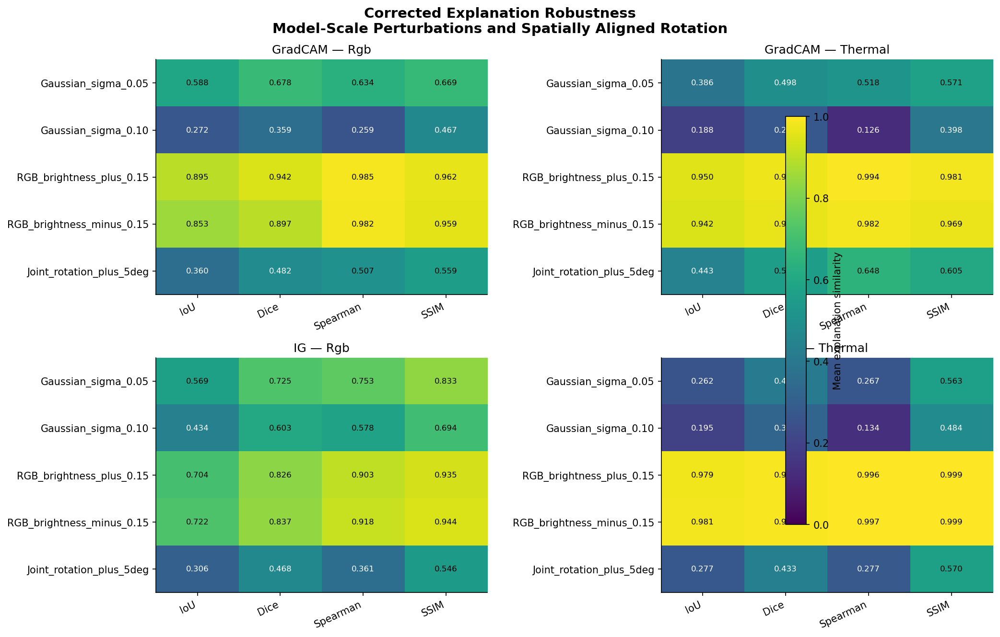

Saved: figures/corrected_posthoc/14_robustness_heatmaps_corrected.pdf


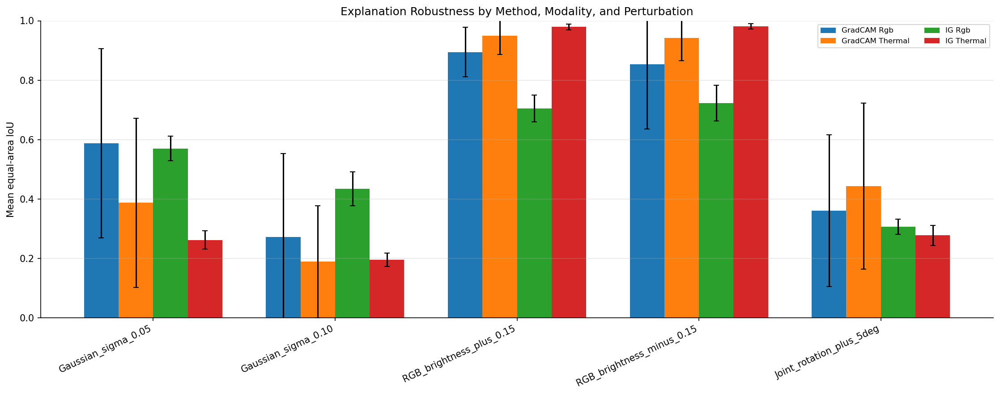

Saved: figures/corrected_posthoc/14_robustness_iou_corrected.pdf

Robustness by prediction outcome


,category,perturbation,method,modality,N,MeanIoU,MedianIoU,MeanSSIM,PredictionFlipRate
0,FN,Gaussian_sigma_0.05,GradCAM,rgb,15,0.639311,0.779275,0.818485,0.0
1,FN,Gaussian_sigma_0.05,GradCAM,thermal,15,0.582044,0.704918,0.673589,0.0
2,FN,Gaussian_sigma_0.05,IG,rgb,15,0.553746,0.555607,0.835874,0.0
3,FN,Gaussian_sigma_0.05,IG,thermal,15,0.269336,0.281164,0.663028,0.0
4,FN,Gaussian_sigma_0.10,GradCAM,rgb,15,0.326612,0.140195,0.632677,0.0
...,...,...,...,...,...,...,...,...,...
75,TP,RGB_brightness_minus_0.15,IG,thermal,5,0.984666,0.986933,0.999813,0.0
76,TP,RGB_brightness_plus_0.15,GradCAM,rgb,5,0.911096,0.912948,0.951479,0.0
77,TP,RGB_brightness_plus_0.15,GradCAM,thermal,5,0.968135,0.974813,0.989075,0.0
78,TP,RGB_brightness_plus_0.15,IG,rgb,5,0.677785,0.666833,0.910653,0.0


Saved: figures/corrected_posthoc/14_robustness_by_outcome.csv

Corrected explanation-robustness analysis complete.


In [ ]:
# Explanation robustness analysis

import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from scipy.stats import spearmanr
from skimage.metrics import structural_similarity
from torchvision.transforms import InterpolationMode
from torchvision.transforms import functional as TF
from tqdm.auto import tqdm

# 1. Required-object checks

required_robustness_objects = [
    "LATE_FUSION_MODEL",
    "datasets",
    "prediction_table",
    "stratified_prediction_sample",
    "get_gradcam_map_corrected",
    "integrated_gradients_joint",
    "signed_ig_to_positive_map",
    "normalize_map",
    "POSTHOC_DIR",
    "TRAIN_RGB_PIXEL_BASELINE",
    "TRAIN_TH_PIXEL_BASELINE",
]

missing_robustness_objects = [
    object_name
    for object_name in required_robustness_objects
    if object_name not in globals()
]

if missing_robustness_objects:
    raise NameError(
        "Run Cells 1–3 before Cell 9. Missing: "
        + ", ".join(
            missing_robustness_objects
        )
    )

# 2. Valid normalized input ranges

# RGB is normalized using ImageNet statistics.
RGB_NORMALIZED_MIN = (
    (torch.zeros(3) - RGB_MEAN.view(-1))
    / RGB_STD.view(-1)
).view(3, 1, 1)

RGB_NORMALIZED_MAX = (
    (torch.ones(3) - RGB_MEAN.view(-1))
    / RGB_STD.view(-1)
).view(3, 1, 1)

# Thermal normalization:
# normalized = (raw_01 - 0.5) / 0.25
THERMAL_NORMALIZED_MIN = (
    0.0 - THERMAL_MEAN
) / THERMAL_STD

THERMAL_NORMALIZED_MAX = (
    1.0 - THERMAL_MEAN
) / THERMAL_STD


def clamp_rgb_normalized(rgb_t):
    """
    Clamp a normalized RGB tensor to the model-valid range
    corresponding to raw RGB values in [0,1].
    """
    minimum = RGB_NORMALIZED_MIN.to(
        dtype=rgb_t.dtype,
        device=rgb_t.device,
    )

    maximum = RGB_NORMALIZED_MAX.to(
        dtype=rgb_t.dtype,
        device=rgb_t.device,
    )

    return torch.maximum(
        torch.minimum(
            rgb_t,
            maximum,
        ),
        minimum,
    )


def clamp_thermal_normalized(th_t):
    """
    Clamp a normalized thermal tensor to the model-valid range
    corresponding to raw thermal values in [0,1].
    """
    return th_t.clamp(
        min=float(
            THERMAL_NORMALIZED_MIN
        ),
        max=float(
            THERMAL_NORMALIZED_MAX
        ),
    )


# 3. Corrected perturbation functions

def perturb_gaussian_noise_corrected(
    rgb_t,
    th_t,
    sigma,
    seed,
):
    """
    Add independent Gaussian noise to both normalized model inputs.

    sigma is measured in normalized model-input units, not raw-pixel
    units. Results are clamped back to valid normalized ranges.
    """
    generator = torch.Generator(
        device="cpu"
    )

    generator.manual_seed(
        int(seed)
    )

    rgb_noise = torch.randn(
        rgb_t.shape,
        generator=generator,
        dtype=rgb_t.dtype,
    )

    th_noise = torch.randn(
        th_t.shape,
        generator=generator,
        dtype=th_t.dtype,
    )

    rgb_perturbed = (
        rgb_t.detach().cpu()
        + float(sigma)
        * rgb_noise
    )

    th_perturbed = (
        th_t.detach().cpu()
        + float(sigma)
        * th_noise
    )

    return (
        clamp_rgb_normalized(
            rgb_perturbed
        ),
        clamp_thermal_normalized(
            th_perturbed
        ),
    )


def perturb_rgb_brightness_corrected(
    rgb_t,
    th_t,
    delta,
):
    """
    Add a brightness shift to normalized RGB only.

    delta is measured in normalized model-input units.
    Thermal remains unchanged.
    """
    rgb_perturbed = (
        rgb_t.detach().cpu()
        + float(delta)
    )

    return (
        clamp_rgb_normalized(
            rgb_perturbed
        ),
        th_t.detach().cpu().clone(),
    )


def rotate_normalized_modalities(
    rgb_t,
    th_t,
    angle_degrees,
):
    """
    Rotate RGB and thermal tensors directly in normalized model-input
    space without min-max rescaling.

    Rotated borders are filled with the spatial mean of the
    training-normal modality baseline.
    """
    rgb_fill = (
        TRAIN_RGB_PIXEL_BASELINE
        .detach()
        .cpu()
        .mean(
            dim=(
                1,
                2,
            )
        )
        .tolist()
    )

    thermal_fill = [
        float(
            TRAIN_TH_PIXEL_BASELINE
            .detach()
            .cpu()
            .mean()
            .item()
        )
    ]

    rgb_rotated = TF.rotate(
        rgb_t.detach().cpu(),
        angle=float(
            angle_degrees
        ),
        interpolation=InterpolationMode.BILINEAR,
        expand=False,
        center=None,
        fill=rgb_fill,
    )

    th_rotated = TF.rotate(
        th_t.detach().cpu(),
        angle=float(
            angle_degrees
        ),
        interpolation=InterpolationMode.BILINEAR,
        expand=False,
        center=None,
        fill=thermal_fill,
    )

    return (
        clamp_rgb_normalized(
            rgb_rotated
        ),
        clamp_thermal_normalized(
            th_rotated
        ),
    )


# 4. Spatial realignment after geometric perturbation

def inverse_rotate_explanation_map(
    explanation_map,
    angle_degrees,
):
    """
    Rotate a perturbed explanation back into the original coordinate
    system before comparing it with the original explanation.
    """
    explanation_tensor = torch.from_numpy(
        np.asarray(
            explanation_map,
            dtype=np.float32,
        )
    ).unsqueeze(0)

    aligned = TF.rotate(
        explanation_tensor,
        angle=-float(
            angle_degrees
        ),
        interpolation=InterpolationMode.BILINEAR,
        expand=False,
        center=None,
        fill=0.0,
    )

    return normalize_map(
        aligned.squeeze(0).numpy()
    )


def rotation_valid_overlap_mask(
    height,
    width,
    angle_degrees,
):
    """
    Determine pixels that remain valid after forward rotation followed
    by inverse alignment.

    The mask reduces border-driven disagreement.
    """
    ones = torch.ones(
        (
            1,
            int(height),
            int(width),
        ),
        dtype=torch.float32,
    )

    forward_mask = TF.rotate(
        ones,
        angle=float(
            angle_degrees
        ),
        interpolation=InterpolationMode.NEAREST,
        expand=False,
        fill=0.0,
    )

    inverse_mask = TF.rotate(
        forward_mask,
        angle=-float(
            angle_degrees
        ),
        interpolation=InterpolationMode.NEAREST,
        expand=False,
        fill=0.0,
    )

    return (
        inverse_mask.squeeze(0).numpy()
        > 0.5
    )

# 5. Robustness perturbation specification

ROBUSTNESS_PERTURBATIONS = [
    {
        "name": "Gaussian_sigma_0.05",
        "type": "gaussian",
        "sigma": 0.05,
        "repeats": 3,
    },
    {
        "name": "Gaussian_sigma_0.10",
        "type": "gaussian",
        "sigma": 0.10,
        "repeats": 3,
    },
    {
        "name": "RGB_brightness_plus_0.15",
        "type": "brightness",
        "delta": 0.15,
        "repeats": 1,
    },
    {
        "name": "RGB_brightness_minus_0.15",
        "type": "brightness",
        "delta": -0.15,
        "repeats": 1,
    },
    {
        "name": "Joint_rotation_plus_5deg",
        "type": "rotation",
        "angle": 5.0,
        "repeats": 1,
    },
]

print(
    "Corrected robustness perturbations:"
)

for perturbation in ROBUSTNESS_PERTURBATIONS:
    print(
        " ",
        perturbation,
    )


# 6. Representative robustness sample

def select_robustness_sample(
    prediction_df,
    n_per_category=5,
    seed=POSTHOC_SEED,
):
    """
    Select up to 20 representative TP/TN/FP/FN samples across
    prediction-confidence levels.
    """
    return stratified_prediction_sample(
        prediction_df,
        n_per_category=n_per_category,
        categories=(
            "TP",
            "TN",
            "FP",
            "FN",
        ),
        seed=seed,
    )


ROBUSTNESS_TEST_IDXS = select_robustness_sample(
    prediction_table,
    n_per_category=5,
)

print(
    "Explanation-robustness sample size:",
    len(
        ROBUSTNESS_TEST_IDXS
    ),
)

display(
    prediction_table[
        prediction_table[
            "sample_idx"
        ].isin(
            ROBUSTNESS_TEST_IDXS
        )
    ]
    .groupby(
        "category"
    )
    .agg(
        N=(
            "sample_idx",
            "size",
        ),
        MeanAnomalyProbability=(
            "p_anomaly",
            "mean",
        ),
        MeanPredictedConfidence=(
            "predicted_confidence",
            "mean",
        ),
    )
)


# 7. Explanation-map generation

def get_robustness_explanation_map(
    model,
    rgb_t,
    th_t,
    method,
    modality,
    target_class,
    ig_steps=100,
):
    """
    Generate a corrected explanation map for robustness analysis.
    """
    if method == "GradCAM":
        return get_gradcam_map_corrected(
            model,
            rgb_t,
            th_t,
            modality=modality,
            class_idx=target_class,
        )

    if method == "IG":
        ig_rgb, ig_th, _ = integrated_gradients_joint(
            model,
            rgb_t,
            th_t,
            target_class=target_class,
            steps=ig_steps,
        )

        if modality == "rgb":
            return signed_ig_to_positive_map(
                ig_rgb
            )

        if modality == "thermal":
            return signed_ig_to_positive_map(
                ig_th
            )

    raise ValueError(
        "method must be 'GradCAM' or 'IG', and modality must be "
        "'rgb' or 'thermal'."
    )


# 8. Masked spatial comparison metrics

def normalize_map_within_mask(
    attribution_map,
    valid_mask,
):
    """
    Normalize a map using only spatially valid pixels.
    """
    attribution_map = np.asarray(
        attribution_map,
        dtype=np.float32,
    )

    valid_mask = np.asarray(
        valid_mask,
        dtype=bool,
    )

    if (
        attribution_map.shape
        != valid_mask.shape
    ):
        raise ValueError(
            "Map and valid mask shapes differ: "
            f"{attribution_map.shape} vs {valid_mask.shape}"
        )

    output = np.zeros_like(
        attribution_map,
        dtype=np.float32,
    )

    valid_values = attribution_map[
        valid_mask
    ]

    valid_values = np.nan_to_num(
        valid_values,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )

    if len(
        valid_values
    ) == 0:
        return output

    minimum = float(
        valid_values.min()
    )

    maximum = float(
        valid_values.max()
    )

    if (
        maximum
        - minimum
    ) <= 1e-12:
        return output

    output[
        valid_mask
    ] = (
        valid_values
        - minimum
    ) / (
        maximum
        - minimum
    )

    return output


def binarize_top_fraction_with_mask(
    attribution_map,
    valid_mask,
    top_fraction=0.20,
):
    """
    Select the highest-attribution fraction only among valid pixels.
    """
    if not 0 < top_fraction < 1:
        raise ValueError(
            "top_fraction must be between 0 and 1."
        )

    normalized = normalize_map_within_mask(
        attribution_map,
        valid_mask,
    )

    valid_values = normalized[
        valid_mask
    ]

    output = np.zeros_like(
        normalized,
        dtype=np.uint8,
    )

    if (
        len(
            valid_values
        ) == 0
        or np.max(
            valid_values
        )
        <= 0
    ):
        return output

    threshold = np.quantile(
        valid_values,
        1.0
        - float(
            top_fraction
        ),
    )

    output[
        valid_mask
    ] = (
        normalized[
            valid_mask
        ]
        >= threshold
    ).astype(
        np.uint8
    )

    return output


def masked_map_similarity(
    original_map,
    perturbed_map,
    valid_mask=None,
    top_fraction=0.20,
):
    """
    Compare original and perturbed maps using:

      - equal-area IoU;
      - Dice;
      - Spearman correlation;
      - SSIM.

    Geometric perturbations may supply a restricted overlap mask.
    """
    original_map = np.asarray(
        original_map,
        dtype=np.float32,
    )

    perturbed_map = np.asarray(
        perturbed_map,
        dtype=np.float32,
    )

    if original_map.shape != perturbed_map.shape:
        raise ValueError(
            "Explanation maps have different shapes: "
            f"{original_map.shape} and {perturbed_map.shape}"
        )

    if valid_mask is None:
        valid_mask = np.ones(
            original_map.shape,
            dtype=bool,
        )

    valid_mask = np.asarray(
        valid_mask,
        dtype=bool,
    )

    original_normalized = normalize_map_within_mask(
        original_map,
        valid_mask,
    )

    perturbed_normalized = normalize_map_within_mask(
        perturbed_map,
        valid_mask,
    )

    original_mask = binarize_top_fraction_with_mask(
        original_normalized,
        valid_mask,
        top_fraction=top_fraction,
    )

    perturbed_mask = binarize_top_fraction_with_mask(
        perturbed_normalized,
        valid_mask,
        top_fraction=top_fraction,
    )

    original_selected = (
        original_mask
        > 0
    )

    perturbed_selected = (
        perturbed_mask
        > 0
    )

    intersection = np.logical_and(
        original_selected,
        perturbed_selected,
    ).sum()

    union = np.logical_or(
        original_selected,
        perturbed_selected,
    ).sum()

    denominator = (
        original_selected.sum()
        + perturbed_selected.sum()
    )

    iou = (
        float(
            intersection
            / union
        )
        if union > 0
        else np.nan
    )

    dice = (
        float(
            2.0
            * intersection
            / denominator
        )
        if denominator > 0
        else np.nan
    )

    original_values = original_normalized[
        valid_mask
    ]

    perturbed_values = perturbed_normalized[
        valid_mask
    ]

    if (
        len(
            original_values
        )
        >= 3
        and np.std(
            original_values
        )
        > 1e-8
        and np.std(
            perturbed_values
        )
        > 1e-8
    ):
        spearman_result = spearmanr(
            original_values,
            perturbed_values,
        )

        map_spearman = float(
            spearman_result.statistic
        )

    else:
        map_spearman = np.nan

    # Invalid regions are set to zero in both maps before SSIM.
    original_for_ssim = original_normalized.copy()
    perturbed_for_ssim = perturbed_normalized.copy()

    original_for_ssim[
        ~valid_mask
    ] = 0.0

    perturbed_for_ssim[
        ~valid_mask
    ] = 0.0

    if (
        np.std(
            original_for_ssim
        )
        > 1e-8
        and np.std(
            perturbed_for_ssim
        )
        > 1e-8
    ):
        ssim_value = float(
            structural_similarity(
                original_for_ssim,
                perturbed_for_ssim,
                data_range=1.0,
            )
        )

    else:
        ssim_value = np.nan

    return {
        "iou": iou,
        "dice": dice,
        "spearman_map": map_spearman,
        "ssim": ssim_value,
        "valid_pixel_fraction": float(
            valid_mask.mean()
        ),
        "original_map_valid": bool(
            original_mask.sum()
            > 0
        ),
        "perturbed_map_valid": bool(
            perturbed_mask.sum()
            > 0
        ),
    }


# 9. Apply a configured perturbation

def apply_robustness_perturbation(
    rgb_t,
    th_t,
    perturbation,
    seed,
):
    """
    Apply one configured perturbation and return alignment metadata.
    """
    perturbation_type = perturbation[
        "type"
    ]

    if perturbation_type == "gaussian":
        rgb_perturbed, th_perturbed = (
            perturb_gaussian_noise_corrected(
                rgb_t,
                th_t,
                sigma=perturbation[
                    "sigma"
                ],
                seed=seed,
            )
        )

        return {
            "rgb": rgb_perturbed,
            "thermal": th_perturbed,
            "requires_inverse_alignment": False,
            "angle": 0.0,
        }

    if perturbation_type == "brightness":
        rgb_perturbed, th_perturbed = (
            perturb_rgb_brightness_corrected(
                rgb_t,
                th_t,
                delta=perturbation[
                    "delta"
                ],
            )
        )

        return {
            "rgb": rgb_perturbed,
            "thermal": th_perturbed,
            "requires_inverse_alignment": False,
            "angle": 0.0,
        }

    if perturbation_type == "rotation":
        angle = float(
            perturbation[
                "angle"
            ]
        )

        rgb_perturbed, th_perturbed = (
            rotate_normalized_modalities(
                rgb_t,
                th_t,
                angle_degrees=angle,
            )
        )

        return {
            "rgb": rgb_perturbed,
            "thermal": th_perturbed,
            "requires_inverse_alignment": True,
            "angle": angle,
        }

    raise ValueError(
        "Unknown perturbation type: "
        f"{perturbation_type}"
    )

# 10. Evaluate explanation robustness

def evaluate_explanation_robustness_corrected(
    model,
    dataset,
    prediction_df,
    sample_indices,
    perturbations=ROBUSTNESS_PERTURBATIONS,
    methods=(
        "GradCAM",
        "IG",
    ),
    modalities=(
        "rgb",
        "thermal",
    ),
    top_fraction=0.20,
    ig_steps=100,
    save_name="14_robustness_corrected.csv",
):
    """
    Evaluate explanation stability under controlled input perturbations.

    The explanation target remains the original predicted class so that
    the same model decision is compared before and after perturbation.

    Prediction changes are reported separately.
    """
    rows = []
    failures = []

    for sample_idx in tqdm(
        sample_indices,
        desc="Explanation robustness",
    ):
        rgb_t, th_t, true_label = dataset[
            sample_idx
        ]

        prediction_row = prediction_df[
            prediction_df[
                "sample_idx"
            ]
            == sample_idx
        ].iloc[0]

        original_target_class = int(
            prediction_row[
                "pred_label"
            ]
        )

        original_probability = float(
            prediction_row[
                "p_anomaly"
            ]
        )

        original_margin_value = anomaly_margin(
            model,
            rgb_t,
            th_t,
        )

        # Cache original explanation maps.
        original_maps = {}

        for method in methods:
            for modality in modalities:
                try:
                    original_maps[
                        (
                            method,
                            modality,
                        )
                    ] = get_robustness_explanation_map(
                        model,
                        rgb_t,
                        th_t,
                        method=method,
                        modality=modality,
                        target_class=original_target_class,
                        ig_steps=ig_steps,
                    )

                except Exception as error:
                    failures.append(
                        {
                            "sample_idx": int(
                                sample_idx
                            ),
                            "stage": "original_map",
                            "method": method,
                            "modality": modality,
                            "perturbation": None,
                            "repeat": None,
                            "error": str(
                                error
                            ),
                        }
                    )

        for perturbation_index, perturbation in enumerate(
            perturbations
        ):
            for repeat_index in range(
                int(
                    perturbation[
                        "repeats"
                    ]
                )
            ):
                perturbation_seed = (
                    POSTHOC_SEED
                    + int(
                        sample_idx
                    )
                    * 10_000
                    + perturbation_index
                    * 100
                    + repeat_index
                )

                try:
                    perturbation_result = (
                        apply_robustness_perturbation(
                            rgb_t,
                            th_t,
                            perturbation=perturbation,
                            seed=perturbation_seed,
                        )
                    )

                except Exception as error:
                    failures.append(
                        {
                            "sample_idx": int(
                                sample_idx
                            ),
                            "stage": "perturbation",
                            "method": None,
                            "modality": None,
                            "perturbation": perturbation[
                                "name"
                            ],
                            "repeat": int(
                                repeat_index
                            ),
                            "error": str(
                                error
                            ),
                        }
                    )

                    continue

                rgb_perturbed = perturbation_result[
                    "rgb"
                ]

                th_perturbed = perturbation_result[
                    "thermal"
                ]

                perturbed_pred, perturbed_probs = (
                    predicted_label_and_probs(
                        model,
                        rgb_perturbed,
                        th_perturbed,
                    )
                )

                perturbed_probability = float(
                    perturbed_probs[
                        1
                    ]
                )

                perturbed_margin_value = anomaly_margin(
                    model,
                    rgb_perturbed,
                    th_perturbed,
                )

                prediction_changed = bool(
                    perturbed_pred
                    != original_target_class
                )

                for method in methods:
                    for modality in modalities:
                        key = (
                            method,
                            modality,
                        )

                        if key not in original_maps:
                            continue

                        try:
                            perturbed_map = (
                                get_robustness_explanation_map(
                                    model,
                                    rgb_perturbed,
                                    th_perturbed,
                                    method=method,
                                    modality=modality,
                                    target_class=(
                                        original_target_class
                                    ),
                                    ig_steps=ig_steps,
                                )
                            )

                            if perturbation_result[
                                "requires_inverse_alignment"
                            ]:
                                angle = perturbation_result[
                                    "angle"
                                ]

                                perturbed_map = (
                                    inverse_rotate_explanation_map(
                                        perturbed_map,
                                        angle_degrees=angle,
                                    )
                                )

                                valid_mask = (
                                    rotation_valid_overlap_mask(
                                        height=perturbed_map.shape[
                                            0
                                        ],
                                        width=perturbed_map.shape[
                                            1
                                        ],
                                        angle_degrees=angle,
                                    )
                                )

                            else:
                                valid_mask = np.ones(
                                    original_maps[
                                        key
                                    ].shape,
                                    dtype=bool,
                                )

                            metrics = masked_map_similarity(
                                original_maps[
                                    key
                                ],
                                perturbed_map,
                                valid_mask=valid_mask,
                                top_fraction=top_fraction,
                            )

                            rows.append(
                                {
                                    "sample_idx": int(
                                        sample_idx
                                    ),
                                    "true_label": int(
                                        true_label
                                    ),
                                    "original_pred_label": int(
                                        original_target_class
                                    ),
                                    "perturbed_pred_label": int(
                                        perturbed_pred
                                    ),
                                    "category": prediction_row[
                                        "category"
                                    ],
                                    "original_p_anomaly": (
                                        original_probability
                                    ),
                                    "perturbed_p_anomaly": (
                                        perturbed_probability
                                    ),
                                    "probability_change": float(
                                        perturbed_probability
                                        - original_probability
                                    ),
                                    "absolute_probability_change": float(
                                        abs(
                                            perturbed_probability
                                            - original_probability
                                        )
                                    ),
                                    "original_anomaly_margin": float(
                                        original_margin_value
                                    ),
                                    "perturbed_anomaly_margin": float(
                                        perturbed_margin_value
                                    ),
                                    "margin_change": float(
                                        perturbed_margin_value
                                        - original_margin_value
                                    ),
                                    "prediction_changed": (
                                        prediction_changed
                                    ),
                                    "perturbation": perturbation[
                                        "name"
                                    ],
                                    "perturbation_type": perturbation[
                                        "type"
                                    ],
                                    "repeat": int(
                                        repeat_index
                                    ),
                                    "seed": int(
                                        perturbation_seed
                                    ),
                                    "method": method,
                                    "modality": modality,
                                    "target_class": int(
                                        original_target_class
                                    ),
                                    "top_fraction": float(
                                        top_fraction
                                    ),
                                    "inverse_aligned": bool(
                                        perturbation_result[
                                            "requires_inverse_alignment"
                                        ]
                                    ),
                                    **metrics,
                                }
                            )

                        except Exception as error:
                            failures.append(
                                {
                                    "sample_idx": int(
                                        sample_idx
                                    ),
                                    "stage": "perturbed_map",
                                    "method": method,
                                    "modality": modality,
                                    "perturbation": perturbation[
                                        "name"
                                    ],
                                    "repeat": int(
                                        repeat_index
                                    ),
                                    "error": str(
                                        error
                                    ),
                                }
                            )

    robustness_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    robustness_df.to_csv(
        output_path,
        index=False,
    )

    if failures:
        failure_path = (
            POSTHOC_DIR
            / "14_robustness_failures.csv"
        )

        pd.DataFrame(
            failures
        ).to_csv(
            failure_path,
            index=False,
        )

        print(
            "Robustness failures saved:",
            failure_path,
        )

    print(
        "Robustness results saved:",
        output_path,
    )

    return robustness_df


robustness_corrected_df = (
    evaluate_explanation_robustness_corrected(
        LATE_FUSION_MODEL,
        datasets["test"],
        prediction_table,
        ROBUSTNESS_TEST_IDXS,
        perturbations=ROBUSTNESS_PERTURBATIONS,
        methods=(
            "GradCAM",
            "IG",
        ),
        modalities=(
            "rgb",
            "thermal",
        ),
        top_fraction=0.20,
        ig_steps=100,
    )
)

# 11. Detailed robustness summary

def summarize_explanation_robustness(
    robustness_df,
):
    """
    Report robustness separately by perturbation, method, and modality.

    Gaussian repetitions are averaged as separate stochastic trials.
    """
    if robustness_df.empty:
        raise ValueError(
            "The corrected robustness dataframe is empty."
        )

    valid = robustness_df.dropna(
        subset=[
            "iou",
            "dice",
        ]
    ).copy()

    summary = (
        valid.groupby(
            [
                "perturbation",
                "method",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            NSamples=(
                "sample_idx",
                "nunique",
            ),
            MeanIoU=(
                "iou",
                "mean",
            ),
            MedianIoU=(
                "iou",
                "median",
            ),
            StdIoU=(
                "iou",
                "std",
            ),
            MeanDice=(
                "dice",
                "mean",
            ),
            MeanMapSpearman=(
                "spearman_map",
                "mean",
            ),
            MeanSSIM=(
                "ssim",
                "mean",
            ),
            MeanAbsProbabilityChange=(
                "absolute_probability_change",
                "mean",
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
            MeanValidPixelFraction=(
                "valid_pixel_fraction",
                "mean",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "14_robustness_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nCorrected explanation-robustness summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


robustness_summary = (
    summarize_explanation_robustness(
        robustness_corrected_df
    )
)


# 12. Prediction-level perturbation summary

def summarize_prediction_perturbation_effects(
    robustness_df,
):
    """
    Summarize prediction changes once per sample/perturbation/repeat.

    Explanation-method rows are deduplicated before this calculation.
    """
    prediction_rows = (
        robustness_df[
            [
                "sample_idx",
                "category",
                "perturbation",
                "repeat",
                "original_p_anomaly",
                "perturbed_p_anomaly",
                "absolute_probability_change",
                "margin_change",
                "prediction_changed",
            ]
        ]
        .drop_duplicates(
            subset=[
                "sample_idx",
                "perturbation",
                "repeat",
            ]
        )
    )

    summary = (
        prediction_rows.groupby(
            "perturbation"
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            NSamples=(
                "sample_idx",
                "nunique",
            ),
            MeanAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "mean",
            ),
            MedianAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "median",
            ),
            MeanMarginChange=(
                "margin_change",
                "mean",
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "14_prediction_perturbation_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPrediction sensitivity to robustness perturbations"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


prediction_perturbation_summary = (
    summarize_prediction_perturbation_effects(
        robustness_corrected_df
    )
)


# 13. Robustness heatmaps

def plot_robustness_heatmaps(
    robustness_df,
    save_name="14_robustness_heatmaps_corrected.pdf",
):
    """
    Plot separate heatmaps for every method-modality combination.
    """
    combinations = [
        (
            "GradCAM",
            "rgb",
        ),
        (
            "GradCAM",
            "thermal",
        ),
        (
            "IG",
            "rgb",
        ),
        (
            "IG",
            "thermal",
        ),
    ]

    perturbation_order = [
        perturbation[
            "name"
        ]
        for perturbation in ROBUSTNESS_PERTURBATIONS
    ]

    fig, axes = plt.subplots(
        2,
        2,
        figsize=(
            14,
            9,
        ),
    )

    plotted_image = None

    for ax, (
        method,
        modality,
    ) in zip(
        axes.flat,
        combinations,
    ):
        subset = robustness_df[
            (
                robustness_df[
                    "method"
                ]
                == method
            )
            &
            (
                robustness_df[
                    "modality"
                ]
                == modality
            )
        ]

        metric_table = (
            subset.groupby(
                "perturbation"
            )[
                [
                    "iou",
                    "dice",
                    "spearman_map",
                    "ssim",
                ]
            ]
            .mean()
            .reindex(
                perturbation_order
            )
        )

        plotted_image = ax.imshow(
            metric_table.to_numpy(),
            vmin=0,
            vmax=1,
            cmap="viridis",
            aspect="auto",
        )

        ax.set_xticks(
            range(
                len(
                    metric_table.columns
                )
            )
        )

        ax.set_xticklabels(
            [
                "IoU",
                "Dice",
                "Spearman",
                "SSIM",
            ],
            rotation=25,
            ha="right",
        )

        ax.set_yticks(
            range(
                len(
                    metric_table.index
                )
            )
        )

        ax.set_yticklabels(
            metric_table.index
        )

        ax.set_title(
            f"{method} — {modality.capitalize()}"
        )

        for row_index in range(
            metric_table.shape[
                0
            ]
        ):
            for column_index in range(
                metric_table.shape[
                    1
                ]
            ):
                value = metric_table.iloc[
                    row_index,
                    column_index,
                ]

                text = (
                    f"{value:.3f}"
                    if np.isfinite(
                        value
                    )
                    else "NA"
                )

                ax.text(
                    column_index,
                    row_index,
                    text,
                    ha="center",
                    va="center",
                    color=(
                        "white"
                        if (
                            not np.isfinite(
                                value
                            )
                            or value < 0.5
                        )
                        else "black"
                    ),
                    fontsize=8,
                )

    if plotted_image is not None:
        fig.colorbar(
            plotted_image,
            ax=axes.ravel().tolist(),
            label="Mean explanation similarity",
            shrink=0.82,
        )

    plt.suptitle(
        (
            "Corrected Explanation Robustness\n"
            "Model-Scale Perturbations and Spatially Aligned Rotation"
        ),
        fontsize=14,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_robustness_heatmaps(
    robustness_corrected_df
)


# 14. Mean-IoU comparison figure

def plot_robustness_iou_bars(
    robustness_df,
    save_name="14_robustness_iou_corrected.pdf",
):
    """
    Plot mean IoU separately for each explanation-method branch.
    """
    summary = (
        robustness_df.groupby(
            [
                "perturbation",
                "method",
                "modality",
            ]
        )[
            "iou"
        ]
        .agg(
            [
                "mean",
                "std",
            ]
        )
        .reset_index()
    )

    summary[
        "explanation"
    ] = (
        summary[
            "method"
        ]
        + " "
        + summary[
            "modality"
        ].str.capitalize()
    )

    perturbation_order = [
        perturbation[
            "name"
        ]
        for perturbation in ROBUSTNESS_PERTURBATIONS
    ]

    explanation_order = [
        "GradCAM Rgb",
        "GradCAM Thermal",
        "IG Rgb",
        "IG Thermal",
    ]

    x_positions = np.arange(
        len(
            perturbation_order
        )
    )

    bar_width = 0.19

    fig, ax = plt.subplots(
        figsize=(
            15,
            6,
        )
    )

    for explanation_index, explanation in enumerate(
        explanation_order
    ):
        explanation_df = (
            summary[
                summary[
                    "explanation"
                ]
                == explanation
            ]
            .set_index(
                "perturbation"
            )
            .reindex(
                perturbation_order
            )
        )

        offsets = (
            explanation_index
            - (
                len(
                    explanation_order
                )
                - 1
            )
            / 2
        ) * bar_width

        ax.bar(
            x_positions
            + offsets,
            explanation_df[
                "mean"
            ],
            width=bar_width,
            yerr=explanation_df[
                "std"
            ].fillna(
                0.0
            ),
            capsize=3,
            label=explanation,
        )

    ax.set_xticks(
        x_positions
    )

    ax.set_xticklabels(
        perturbation_order,
        rotation=25,
        ha="right",
    )

    ax.set_ylabel(
        "Mean equal-area IoU"
    )

    ax.set_ylim(
        0,
        1,
    )

    ax.set_title(
        "Explanation Robustness by Method, Modality, and Perturbation"
    )

    ax.grid(
        alpha=0.3,
        axis="y",
    )

    ax.legend(
        fontsize=8,
        ncol=2,
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_robustness_iou_bars(
    robustness_corrected_df
)

# 15. Outcome-specific robustness

def summarize_robustness_by_outcome(
    robustness_df,
):
    """
    Report whether explanation robustness differs across TP/TN/FP/FN.
    """
    summary = (
        robustness_df.groupby(
            [
                "category",
                "perturbation",
                "method",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanIoU=(
                "iou",
                "mean",
            ),
            MedianIoU=(
                "iou",
                "median",
            ),
            MeanSSIM=(
                "ssim",
                "mean",
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "14_robustness_by_outcome.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nRobustness by prediction outcome"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


robustness_by_outcome = (
    summarize_robustness_by_outcome(
        robustness_corrected_df
    )
)

# 16. Save metadata

robustness_metadata = {
    "analysis": (
        "Explanation robustness under controlled input perturbations"
    ),
    "model": (
        "Late-Fusion"
    ),
    "methods": [
        "Grad-CAM",
        "Joint Integrated Gradients",
    ],
    "modalities": [
        "RGB",
        "Thermal",
    ],
    "target": (
        "Original predicted class retained across original and "
        "perturbed explanation calculations"
    ),
    "sample_design": (
        "Representative TP/TN/FP/FN test examples stratified "
        "across prediction confidence"
    ),
    "perturbations": ROBUSTNESS_PERTURBATIONS,
    "noise_units": (
        "Normalized model-input units"
    ),
    "brightness_units": (
        "Normalized RGB model-input units"
    ),
    "value_clamping": (
        "Perturbed tensors clamped to normalized bounds corresponding "
        "to raw modality values in [0,1]"
    ),
    "rotation": (
        "Tensor-space bilinear rotation preserving normalization; "
        "training-normal mean modality values used for border fill"
    ),
    "rotation_comparison": (
        "Perturbed explanation inverse-rotated into original coordinates; "
        "comparison restricted to valid spatial overlap"
    ),
    "stochastic_repeats": (
        "Three independently seeded trials for each Gaussian-noise level"
    ),
    "primary_spatial_metric": (
        "Equal-area top-20% IoU"
    ),
    "additional_metrics": [
        "Dice",
        "Continuous-map Spearman correlation",
        "SSIM",
        "Prediction flip rate",
        "Absolute anomaly-probability change",
    ],
    "interpretation_limit": (
        "Robustness measures stability under the stated perturbations. "
        "It does not establish explanation correctness or faithfulness."
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "14_robustness_metadata.json",
    "w",
) as file:
    json.dump(
        robustness_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected explanation-robustness analysis complete."
)

Modality-replacement sensitivity:   0%|          | 0/18670 [00:00<?, ?it/s]

Modality-replacement results saved: figures/corrected_posthoc/15_modality_replacement_sensitivity.csv

Overall modality-replacement sensitivity


,modality_replaced,N,MeanProbabilityDrop,MedianProbabilityDrop,StdProbabilityDrop,MeanAbsoluteProbabilityChange,MedianAbsoluteProbabilityChange,MeanMarginDrop,MedianMarginDrop,MeanAbsoluteMarginChange,PositiveProbabilityDropRate,NegativeProbabilityDropRate,PredictionFlipRate
0,rgb,18670,-0.108358,-0.069046,0.243238,0.177557,0.096526,-1.200732,-1.450818,1.680346,0.223567,0.776433,0.162560
1,thermal,18670,0.155029,0.008456,0.283419,0.158767,0.011505,1.305528,0.395787,1.511015,0.687681,0.312319,0.151848



Modality-replacement sensitivity by prediction outcome


,category,modality_replaced,N,MeanProbabilityDrop,MedianProbabilityDrop,MeanAbsoluteProbabilityChange,MeanMarginDrop,MedianMarginDrop,PredictionFlipRate
0,FN,rgb,658,-0.186076,-0.112712,0.275092,-1.124369,-1.366559,0.344985
1,FN,thermal,658,0.152402,0.092646,0.153332,1.880598,1.918903,0.000000
2,FP,rgb,1604,0.145695,0.072542,0.245838,0.738916,0.545780,0.329800
3,FP,thermal,1604,0.732154,0.751690,0.732154,4.960430,4.920320,1.000000
4,TN,rgb,15177,-0.149991,-0.082657,0.167256,-1.566817,-1.685747,0.135336
5,TN,thermal,15177,0.038645,0.003610,0.043203,0.519322,0.183490,0.000000
6,TP,rgb,1231,0.115439,0.025881,0.163448,0.744538,0.487695,0.182778
7,TP,thermal,1231,0.839338,0.886411,0.839338,5.928911,6.060904,1.000000


Saved: figures/corrected_posthoc/15_modality_replacement_summary.csv
Saved: figures/corrected_posthoc/15_modality_replacement_by_outcome.csv
Saved: figures/corrected_posthoc/15_modality_replacement_paired.csv

Paired RGB-versus-thermal replacement comparison


,Group,N,MeanRGBProbabilityDrop,MeanThermalProbabilityDrop,MedianRGBProbabilityDrop,MedianThermalProbabilityDrop,MeanRGBAbsoluteProbabilityChange,MeanThermalAbsoluteProbabilityChange,MeanThermalMinusRGBProbabilityDrop,DirectionalWilcoxonStatistic,DirectionalWilcoxonP,AbsoluteWilcoxonStatistic,AbsoluteWilcoxonP,ThermalDirectionalWins,DirectionalNonTies,DirectionalBinomialP,ThermalAbsoluteWins,AbsoluteNonTies,AbsoluteBinomialP
0,Overall,18670,-0.108358,0.155029,-0.069046,0.008456,0.177557,0.158767,0.263388,1523944.0,0.000000e+00,57577157.0,0.000000e+00,17755,18670,0.000000e+00,5736,18670,0.00000
1,TP,1231,0.115439,0.839338,0.025881,0.886411,0.163448,0.839338,0.723899,74.0,8.600076e-203,74.0,8.600076e-203,1226,1231,0.000000e+00,1226,1231,0.00000
2,TN,15177,-0.149991,0.038645,-0.082657,0.003610,0.167256,0.043203,0.188636,1220227.0,0.000000e+00,11191781.0,0.000000e+00,14320,15177,0.000000e+00,2667,15177,0.00000
3,FP,1604,0.145695,0.732154,0.072542,0.751690,0.245838,0.732154,0.586459,3154.0,4.062601e-261,3348.0,5.830038e-261,1565,1604,0.000000e+00,1565,1604,0.00000
4,FN,658,-0.186076,0.152402,-0.112712,0.092646,0.275092,0.153332,0.338477,957.0,1.583751e-107,62407.0,4.110190e-21,644,658,4.865022e-170,278,658,0.00008


Saved: figures/corrected_posthoc/15_modality_replacement_paired_summary.csv

Both-modality replacement summary


,category,N,MeanProbabilityDrop,MedianProbabilityDrop,MeanMarginDrop,PredictionFlipRate,MeanReplacementPAnomaly
0,FN,658,0.150132,0.089990,1.719262,0.0,0.022601
1,FP,1604,0.739442,0.756837,5.124638,1.0,0.022601
2,TN,15177,0.037087,-0.000232,0.403126,0.0,0.022601
3,TP,1231,0.843006,0.892107,6.015264,1.0,0.022601


Saved: figures/corrected_posthoc/15_both_modality_replacement_summary.csv


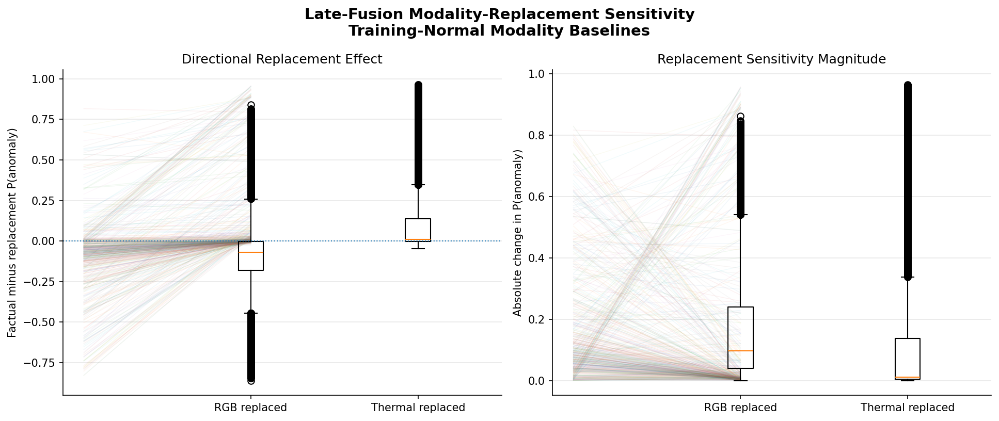

Saved: figures/corrected_posthoc/15_modality_replacement_sensitivity.pdf


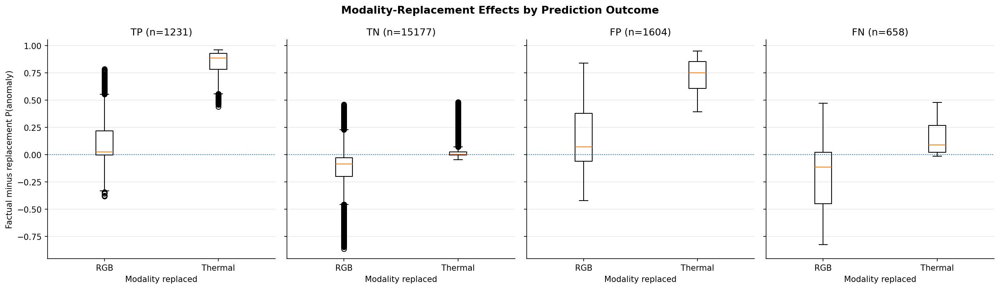

Saved: figures/corrected_posthoc/15_modality_replacement_by_outcome.pdf

Corrected modality-replacement sensitivity analysis complete.


In [ ]:

# Pixel-level modality-replacement sensitivity

import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from scipy.stats import binomtest, wilcoxon
from tqdm.auto import tqdm

# 1. Required-object checks

required_replacement_objects = [
    "LATE_FUSION_MODEL",
    "datasets",
    "prediction_table",
    "TRAIN_RGB_PIXEL_BASELINE",
    "TRAIN_TH_PIXEL_BASELINE",
    "predicted_label_and_probs",
    "anomaly_margin",
    "POSTHOC_DIR",
]

missing_replacement_objects = [
    object_name
    for object_name in required_replacement_objects
    if object_name not in globals()
]

if missing_replacement_objects:
    raise NameError(
        "Run corrected Cell 1 before Cell 10. Missing: "
        + ", ".join(
            missing_replacement_objects
        )
    )


# 2. Prediction-state helper

def modality_replacement_prediction_state(
    model,
    rgb_t,
    th_t,
):
    """
    Return the model's prediction state for one RGB–thermal input pair.

    Returned quantities
    -------------------
    pred_label
        Predicted class index.

    p_normal
        Probability assigned to the normal class.

    p_anomaly
        Probability assigned to the anomaly class.

    anomaly_margin
        Anomaly logit minus normal logit.

    predicted_confidence
        Probability assigned to the predicted class.

    decision_confidence
        Absolute distance of P(anomaly) from the 0.5 boundary.
    """
    pred_label, probabilities = predicted_label_and_probs(
        model,
        rgb_t,
        th_t,
    )

    probabilities = np.asarray(
        probabilities,
        dtype=np.float64,
    ).reshape(-1)

    if len(probabilities) < 2:
        raise ValueError(
            "Expected two class probabilities, received "
            f"shape {probabilities.shape}."
        )

    p_normal = float(
        probabilities[0]
    )

    p_anomaly = float(
        probabilities[1]
    )

    margin = float(
        anomaly_margin(
            model,
            rgb_t,
            th_t,
        )
    )

    predicted_confidence = float(
        probabilities[
            int(pred_label)
        ]
    )

    decision_confidence = float(
        abs(
            p_anomaly
            - 0.5
        )
    )

    return {
        "pred_label": int(
            pred_label
        ),
        "p_normal": p_normal,
        "p_anomaly": p_anomaly,
        "anomaly_margin": margin,
        "predicted_confidence": predicted_confidence,
        "decision_confidence": decision_confidence,
    }


# 3. Construct modality-replacement inputs

def construct_modality_replacement_inputs(
    rgb_t,
    th_t,
    modality,
):
    """
    Replace one modality with its training-normal mean tensor.

    RGB replacement
    ---------------
    RGB becomes the training-normal RGB baseline while thermal
    remains factual.

    Thermal replacement
    -------------------
    Thermal becomes the training-normal thermal baseline while RGB
    remains factual.

    Both replacement
    ----------------
    Both modalities are replaced by their training-normal baselines.
    """
    rgb_factual = (
        rgb_t.detach()
        .clone()
    )

    th_factual = (
        th_t.detach()
        .clone()
    )

    rgb_baseline = (
        TRAIN_RGB_PIXEL_BASELINE
        .detach()
        .to(
            dtype=rgb_factual.dtype,
            device=rgb_factual.device,
        )
    )

    th_baseline = (
        TRAIN_TH_PIXEL_BASELINE
        .detach()
        .to(
            dtype=th_factual.dtype,
            device=th_factual.device,
        )
    )

    if modality == "rgb":
        return (
            rgb_baseline,
            th_factual,
        )

    if modality == "thermal":
        return (
            rgb_factual,
            th_baseline,
        )

    if modality == "both":
        return (
            rgb_baseline,
            th_baseline,
        )

    raise ValueError(
        "modality must be 'rgb', 'thermal', or 'both'."
    )

# 4. Evaluate one sample

def evaluate_single_modality_replacement(
    model,
    rgb_t,
    th_t,
):
    """
    Evaluate factual, RGB-replaced, thermal-replaced, and
    both-replaced prediction states.
    """
    factual_state = modality_replacement_prediction_state(
        model,
        rgb_t,
        th_t,
    )

    replacement_states = {}

    for modality in [
        "rgb",
        "thermal",
        "both",
    ]:
        replaced_rgb, replaced_th = (
            construct_modality_replacement_inputs(
                rgb_t,
                th_t,
                modality=modality,
            )
        )

        replacement_states[
            modality
        ] = modality_replacement_prediction_state(
            model,
            replaced_rgb,
            replaced_th,
        )

    return (
        factual_state,
        replacement_states,
    )

# 5. Evaluate the held-out test set

def evaluate_modality_replacement_sensitivity(
    model,
    dataset,
    prediction_df,
    sample_indices=None,
    save_name="15_modality_replacement_sensitivity.csv",
):
    """
    Measure model sensitivity to replacing each modality with its
    training-normal baseline.

    The analysis is performed over the full held-out test partition
    unless sample_indices is explicitly supplied.

    Main directional measures
    -------------------------
    probability_drop
        Factual P(anomaly) minus replacement P(anomaly).

        Positive:
            replacing the modality reduces anomaly evidence.

        Negative:
            replacing the modality increases anomaly evidence.

    margin_drop
        Factual anomaly margin minus replacement anomaly margin.

        Positive:
            replacing the modality reduces anomaly evidence.

        Negative:
            replacing the modality increases anomaly evidence.

    Absolute values quantify sensitivity magnitude regardless of
    direction.
    """
    if sample_indices is None:
        sample_indices = (
            prediction_df[
                "sample_idx"
            ]
            .astype(int)
            .tolist()
        )

    rows = []
    failures = []

    for sample_idx in tqdm(
        sample_indices,
        desc="Modality-replacement sensitivity",
    ):
        try:
            rgb_t, th_t, true_label = dataset[
                sample_idx
            ]

            prediction_row = prediction_df[
                prediction_df[
                    "sample_idx"
                ]
                == sample_idx
            ].iloc[0]

            factual_state, replacement_states = (
                evaluate_single_modality_replacement(
                    model,
                    rgb_t,
                    th_t,
                )
            )

            for modality in [
                "rgb",
                "thermal",
                "both",
            ]:
                replacement_state = (
                    replacement_states[
                        modality
                    ]
                )

                probability_drop = (
                    factual_state[
                        "p_anomaly"
                    ]
                    - replacement_state[
                        "p_anomaly"
                    ]
                )

                margin_drop = (
                    factual_state[
                        "anomaly_margin"
                    ]
                    - replacement_state[
                        "anomaly_margin"
                    ]
                )

                predicted_confidence_change = (
                    replacement_state[
                        "predicted_confidence"
                    ]
                    - factual_state[
                        "predicted_confidence"
                    ]
                )

                rows.append(
                    {
                        "sample_idx": int(
                            sample_idx
                        ),
                        "true_label": int(
                            true_label
                        ),
                        "factual_pred_label": int(
                            factual_state[
                                "pred_label"
                            ]
                        ),
                        "category": prediction_row[
                            "category"
                        ],
                        "modality_replaced": modality,
                        "factual_p_normal": factual_state[
                            "p_normal"
                        ],
                        "factual_p_anomaly": factual_state[
                            "p_anomaly"
                        ],
                        "replacement_p_normal": (
                            replacement_state[
                                "p_normal"
                            ]
                        ),
                        "replacement_p_anomaly": (
                            replacement_state[
                                "p_anomaly"
                            ]
                        ),
                        "probability_drop": float(
                            probability_drop
                        ),
                        "absolute_probability_change": float(
                            abs(
                                probability_drop
                            )
                        ),
                        "factual_anomaly_margin": (
                            factual_state[
                                "anomaly_margin"
                            ]
                        ),
                        "replacement_anomaly_margin": (
                            replacement_state[
                                "anomaly_margin"
                            ]
                        ),
                        "margin_drop": float(
                            margin_drop
                        ),
                        "absolute_margin_change": float(
                            abs(
                                margin_drop
                            )
                        ),
                        "replacement_pred_label": int(
                            replacement_state[
                                "pred_label"
                            ]
                        ),
                        "prediction_changed": bool(
                            replacement_state[
                                "pred_label"
                            ]
                            != factual_state[
                                "pred_label"
                            ]
                        ),
                        "factual_predicted_confidence": (
                            factual_state[
                                "predicted_confidence"
                            ]
                        ),
                        "replacement_predicted_confidence": (
                            replacement_state[
                                "predicted_confidence"
                            ]
                        ),
                        "predicted_confidence_change": float(
                            predicted_confidence_change
                        ),
                        "factual_decision_confidence": (
                            factual_state[
                                "decision_confidence"
                            ]
                        ),
                        "replacement_decision_confidence": (
                            replacement_state[
                                "decision_confidence"
                            ]
                        ),
                    }
                )

        except Exception as error:
            failures.append(
                {
                    "sample_idx": int(
                        sample_idx
                    ),
                    "error": str(
                        error
                    ),
                }
            )

            print(
                f"Replacement analysis failed for "
                f"sample {sample_idx}: {error}"
            )

    replacement_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    replacement_df.to_csv(
        output_path,
        index=False,
    )

    if failures:
        failure_path = (
            POSTHOC_DIR
            / "15_modality_replacement_failures.csv"
        )

        pd.DataFrame(
            failures
        ).to_csv(
            failure_path,
            index=False,
        )

        print(
            "Failures saved:",
            failure_path,
        )

    print(
        "Modality-replacement results saved:",
        output_path,
    )

    return replacement_df


modality_replacement_df = (
    evaluate_modality_replacement_sensitivity(
        LATE_FUSION_MODEL,
        datasets["test"],
        prediction_table,
        sample_indices=None,
    )
)

# 6. Overall and outcome-specific summaries

def summarize_modality_replacement(
    replacement_df,
):
    """
    Summarize directional and absolute sensitivity by replacement
    type and prediction outcome.
    """
    modality_only = replacement_df[
        replacement_df[
            "modality_replaced"
        ].isin(
            [
                "rgb",
                "thermal",
            ]
        )
    ].copy()

    overall_summary = (
        modality_only.groupby(
            "modality_replaced"
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanProbabilityDrop=(
                "probability_drop",
                "mean",
            ),
            MedianProbabilityDrop=(
                "probability_drop",
                "median",
            ),
            StdProbabilityDrop=(
                "probability_drop",
                "std",
            ),
            MeanAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "mean",
            ),
            MedianAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "median",
            ),
            MeanMarginDrop=(
                "margin_drop",
                "mean",
            ),
            MedianMarginDrop=(
                "margin_drop",
                "median",
            ),
            MeanAbsoluteMarginChange=(
                "absolute_margin_change",
                "mean",
            ),
            PositiveProbabilityDropRate=(
                "probability_drop",
                lambda values: float(
                    (
                        values
                        > 0
                    ).mean()
                ),
            ),
            NegativeProbabilityDropRate=(
                "probability_drop",
                lambda values: float(
                    (
                        values
                        < 0
                    ).mean()
                ),
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
        )
        .reset_index()
    )

    overall_path = (
        POSTHOC_DIR
        / "15_modality_replacement_summary.csv"
    )

    overall_summary.to_csv(
        overall_path,
        index=False,
    )

    by_outcome_summary = (
        modality_only.groupby(
            [
                "category",
                "modality_replaced",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanProbabilityDrop=(
                "probability_drop",
                "mean",
            ),
            MedianProbabilityDrop=(
                "probability_drop",
                "median",
            ),
            MeanAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "mean",
            ),
            MeanMarginDrop=(
                "margin_drop",
                "mean",
            ),
            MedianMarginDrop=(
                "margin_drop",
                "median",
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
        )
        .reset_index()
    )

    outcome_path = (
        POSTHOC_DIR
        / "15_modality_replacement_by_outcome.csv"
    )

    by_outcome_summary.to_csv(
        outcome_path,
        index=False,
    )

    print(
        "\nOverall modality-replacement sensitivity"
    )

    display(
        overall_summary
    )

    print(
        "\nModality-replacement sensitivity by prediction outcome"
    )

    display(
        by_outcome_summary
    )

    print(
        "Saved:",
        overall_path,
    )

    print(
        "Saved:",
        outcome_path,
    )

    return (
        overall_summary,
        by_outcome_summary,
    )


(
    modality_replacement_summary,
    modality_replacement_by_outcome,
) = summarize_modality_replacement(
    modality_replacement_df
)

# 7. Paired RGB-versus-thermal comparison

def safe_paired_wilcoxon_replacement(
    rgb_values,
    thermal_values,
):
    """
    Paired Wilcoxon test for thermal versus RGB replacement effects.
    """
    rgb_values = np.asarray(
        rgb_values,
        dtype=np.float64,
    )

    thermal_values = np.asarray(
        thermal_values,
        dtype=np.float64,
    )

    valid = (
        np.isfinite(
            rgb_values
        )
        &
        np.isfinite(
            thermal_values
        )
    )

    rgb_values = rgb_values[
        valid
    ]

    thermal_values = thermal_values[
        valid
    ]

    if len(
        rgb_values
    ) == 0:
        return {
            "N": 0,
            "statistic": np.nan,
            "pvalue": np.nan,
        }

    difference = (
        thermal_values
        - rgb_values
    )

    if np.allclose(
        difference,
        0.0,
    ):
        return {
            "N": int(
                len(
                    difference
                )
            ),
            "statistic": 0.0,
            "pvalue": 1.0,
        }

    result = wilcoxon(
        thermal_values,
        rgb_values,
        alternative="two-sided",
        zero_method="wilcox",
    )

    return {
        "N": int(
            len(
                difference
            )
        ),
        "statistic": float(
            result.statistic
        ),
        "pvalue": float(
            result.pvalue
        ),
    }


def build_paired_replacement_table(
    replacement_df,
):
    """
    Create one row per sample with RGB and thermal replacement effects.
    """
    modality_only = replacement_df[
        replacement_df[
            "modality_replaced"
        ].isin(
            [
                "rgb",
                "thermal",
            ]
        )
    ].copy()

    probability_wide = modality_only.pivot(
        index=[
            "sample_idx",
            "true_label",
            "factual_pred_label",
            "category",
        ],
        columns="modality_replaced",
        values="probability_drop",
    ).reset_index()

    probability_wide.columns.name = None

    probability_wide = probability_wide.rename(
        columns={
            "rgb": (
                "rgb_probability_drop"
            ),
            "thermal": (
                "thermal_probability_drop"
            ),
        }
    )

    absolute_wide = modality_only.pivot(
        index="sample_idx",
        columns="modality_replaced",
        values="absolute_probability_change",
    ).reset_index()

    absolute_wide.columns.name = None

    absolute_wide = absolute_wide.rename(
        columns={
            "rgb": (
                "rgb_absolute_probability_change"
            ),
            "thermal": (
                "thermal_absolute_probability_change"
            ),
        }
    )

    margin_wide = modality_only.pivot(
        index="sample_idx",
        columns="modality_replaced",
        values="margin_drop",
    ).reset_index()

    margin_wide.columns.name = None

    margin_wide = margin_wide.rename(
        columns={
            "rgb": (
                "rgb_margin_drop"
            ),
            "thermal": (
                "thermal_margin_drop"
            ),
        }
    )

    flip_wide = modality_only.pivot(
        index="sample_idx",
        columns="modality_replaced",
        values="prediction_changed",
    ).reset_index()

    flip_wide.columns.name = None

    flip_wide = flip_wide.rename(
        columns={
            "rgb": (
                "rgb_prediction_changed"
            ),
            "thermal": (
                "thermal_prediction_changed"
            ),
        }
    )

    paired_df = (
        probability_wide
        .merge(
            absolute_wide,
            on="sample_idx",
            how="left",
        )
        .merge(
            margin_wide,
            on="sample_idx",
            how="left",
        )
        .merge(
            flip_wide,
            on="sample_idx",
            how="left",
        )
    )

    paired_df[
        "thermal_minus_rgb_probability_drop"
    ] = (
        paired_df[
            "thermal_probability_drop"
        ]
        -
        paired_df[
            "rgb_probability_drop"
        ]
    )

    paired_df[
        "thermal_minus_rgb_absolute_change"
    ] = (
        paired_df[
            "thermal_absolute_probability_change"
        ]
        -
        paired_df[
            "rgb_absolute_probability_change"
        ]
    )

    paired_df[
        "directional_dominance"
    ] = np.where(
        paired_df[
            "thermal_probability_drop"
        ]
        >
        paired_df[
            "rgb_probability_drop"
        ],
        "Thermal",
        np.where(
            paired_df[
                "rgb_probability_drop"
            ]
            >
            paired_df[
                "thermal_probability_drop"
            ],
            "RGB",
            "Equal",
        ),
    )

    paired_df[
        "absolute_sensitivity_dominance"
    ] = np.where(
        paired_df[
            "thermal_absolute_probability_change"
        ]
        >
        paired_df[
            "rgb_absolute_probability_change"
        ],
        "Thermal",
        np.where(
            paired_df[
                "rgb_absolute_probability_change"
            ]
            >
            paired_df[
                "thermal_absolute_probability_change"
            ],
            "RGB",
            "Equal",
        ),
    )

    output_path = (
        POSTHOC_DIR
        / "15_modality_replacement_paired.csv"
    )

    paired_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "Saved:",
        output_path,
    )

    return paired_df


modality_replacement_paired_df = (
    build_paired_replacement_table(
        modality_replacement_df
    )
)


def summarize_paired_replacement_comparison(
    paired_df,
):
    """
    Compare RGB and thermal replacement effects using paired tests
    and modality-dominance counts.
    """
    rows = []

    groups = [
        (
            "Overall",
            paired_df,
        )
    ]

    for category in [
        "TP",
        "TN",
        "FP",
        "FN",
    ]:
        category_df = paired_df[
            paired_df[
                "category"
            ]
            == category
        ]

        if not category_df.empty:
            groups.append(
                (
                    category,
                    category_df,
                )
            )

    for group_name, group_df in groups:
        directional_test = (
            safe_paired_wilcoxon_replacement(
                group_df[
                    "rgb_probability_drop"
                ],
                group_df[
                    "thermal_probability_drop"
                ],
            )
        )

        absolute_test = (
            safe_paired_wilcoxon_replacement(
                group_df[
                    "rgb_absolute_probability_change"
                ],
                group_df[
                    "thermal_absolute_probability_change"
                ],
            )
        )

        non_tied_directional = group_df[
            group_df[
                "directional_dominance"
            ]
            != "Equal"
        ]

        thermal_directional_wins = int(
            (
                non_tied_directional[
                    "directional_dominance"
                ]
                == "Thermal"
            ).sum()
        )

        if len(
            non_tied_directional
        ) > 0:
            directional_binomial_p = float(
                binomtest(
                    thermal_directional_wins,
                    len(
                        non_tied_directional
                    ),
                    p=0.5,
                    alternative="two-sided",
                ).pvalue
            )
        else:
            directional_binomial_p = np.nan

        non_tied_absolute = group_df[
            group_df[
                "absolute_sensitivity_dominance"
            ]
            != "Equal"
        ]

        thermal_absolute_wins = int(
            (
                non_tied_absolute[
                    "absolute_sensitivity_dominance"
                ]
                == "Thermal"
            ).sum()
        )

        if len(
            non_tied_absolute
        ) > 0:
            absolute_binomial_p = float(
                binomtest(
                    thermal_absolute_wins,
                    len(
                        non_tied_absolute
                    ),
                    p=0.5,
                    alternative="two-sided",
                ).pvalue
            )
        else:
            absolute_binomial_p = np.nan

        rows.append(
            {
                "Group": group_name,
                "N": len(
                    group_df
                ),
                "MeanRGBProbabilityDrop": (
                    group_df[
                        "rgb_probability_drop"
                    ].mean()
                ),
                "MeanThermalProbabilityDrop": (
                    group_df[
                        "thermal_probability_drop"
                    ].mean()
                ),
                "MedianRGBProbabilityDrop": (
                    group_df[
                        "rgb_probability_drop"
                    ].median()
                ),
                "MedianThermalProbabilityDrop": (
                    group_df[
                        "thermal_probability_drop"
                    ].median()
                ),
                "MeanRGBAbsoluteProbabilityChange": (
                    group_df[
                        "rgb_absolute_probability_change"
                    ].mean()
                ),
                "MeanThermalAbsoluteProbabilityChange": (
                    group_df[
                        "thermal_absolute_probability_change"
                    ].mean()
                ),
                "MeanThermalMinusRGBProbabilityDrop": (
                    group_df[
                        "thermal_minus_rgb_probability_drop"
                    ].mean()
                ),
                "DirectionalWilcoxonStatistic": (
                    directional_test[
                        "statistic"
                    ]
                ),
                "DirectionalWilcoxonP": (
                    directional_test[
                        "pvalue"
                    ]
                ),
                "AbsoluteWilcoxonStatistic": (
                    absolute_test[
                        "statistic"
                    ]
                ),
                "AbsoluteWilcoxonP": (
                    absolute_test[
                        "pvalue"
                    ]
                ),
                "ThermalDirectionalWins": (
                    thermal_directional_wins
                ),
                "DirectionalNonTies": len(
                    non_tied_directional
                ),
                "DirectionalBinomialP": (
                    directional_binomial_p
                ),
                "ThermalAbsoluteWins": (
                    thermal_absolute_wins
                ),
                "AbsoluteNonTies": len(
                    non_tied_absolute
                ),
                "AbsoluteBinomialP": (
                    absolute_binomial_p
                ),
            }
        )

    comparison_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / "15_modality_replacement_paired_summary.csv"
    )

    comparison_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPaired RGB-versus-thermal replacement comparison"
    )

    display(
        comparison_df
    )

    print(
        "Saved:",
        output_path,
    )

    return comparison_df


modality_replacement_paired_summary = (
    summarize_paired_replacement_comparison(
        modality_replacement_paired_df
    )
)

# 8. Both-modality replacement summary

def summarize_both_modality_replacement(
    replacement_df,
):
    """
    Summarize the effect of replacing both modalities simultaneously.
    """
    both_df = replacement_df[
        replacement_df[
            "modality_replaced"
        ]
        == "both"
    ].copy()

    summary = (
        both_df.groupby(
            "category"
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanProbabilityDrop=(
                "probability_drop",
                "mean",
            ),
            MedianProbabilityDrop=(
                "probability_drop",
                "median",
            ),
            MeanMarginDrop=(
                "margin_drop",
                "mean",
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
            MeanReplacementPAnomaly=(
                "replacement_p_anomaly",
                "mean",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "15_both_modality_replacement_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nBoth-modality replacement summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


both_modality_replacement_summary = (
    summarize_both_modality_replacement(
        modality_replacement_df
    )
)


# 9. Replacement-effect figures

def plot_modality_replacement_effects(
    paired_df,
    save_name="15_modality_replacement_sensitivity.pdf",
):
    """
    Plot paired RGB and thermal replacement effects.

    Panel A:
        directional anomaly-probability drop.

    Panel B:
        absolute anomaly-probability sensitivity.
    """
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            13,
            5.5,
        ),
    )

    plotting_df = paired_df.dropna(
        subset=[
            "rgb_probability_drop",
            "thermal_probability_drop",
            "rgb_absolute_probability_change",
            "thermal_absolute_probability_change",
        ]
    )

    max_lines = min(
        500,
        len(
            plotting_df
        ),
    )

    if len(
        plotting_df
    ) > max_lines:
        line_df = plotting_df.sample(
            n=max_lines,
            random_state=POSTHOC_SEED,
        )
    else:
        line_df = plotting_df

    # Directional probability drop
    for _, row in line_df.iterrows():
        axes[
            0
        ].plot(
            [
                0,
                1,
            ],
            [
                row[
                    "rgb_probability_drop"
                ],
                row[
                    "thermal_probability_drop"
                ],
            ],
            alpha=0.06,
            linewidth=0.7,
        )

    axes[
        0
    ].boxplot(
        [
            plotting_df[
                "rgb_probability_drop"
            ].to_numpy(),
            plotting_df[
                "thermal_probability_drop"
            ].to_numpy(),
        ],
        labels=[
            "RGB replaced",
            "Thermal replaced",
        ],
        showfliers=True,
    )

    axes[
        0
    ].axhline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    axes[
        0
    ].set_ylabel(
        "Factual minus replacement P(anomaly)"
    )

    axes[
        0
    ].set_title(
        "Directional Replacement Effect"
    )

    axes[
        0
    ].grid(
        alpha=0.3,
        axis="y",
    )

    # Absolute probability sensitivity
    for _, row in line_df.iterrows():
        axes[
            1
        ].plot(
            [
                0,
                1,
            ],
            [
                row[
                    "rgb_absolute_probability_change"
                ],
                row[
                    "thermal_absolute_probability_change"
                ],
            ],
            alpha=0.06,
            linewidth=0.7,
        )

    axes[
        1
    ].boxplot(
        [
            plotting_df[
                "rgb_absolute_probability_change"
            ].to_numpy(),
            plotting_df[
                "thermal_absolute_probability_change"
            ].to_numpy(),
        ],
        labels=[
            "RGB replaced",
            "Thermal replaced",
        ],
        showfliers=True,
    )

    axes[
        1
    ].set_ylabel(
        "Absolute change in P(anomaly)"
    )

    axes[
        1
    ].set_title(
        "Replacement Sensitivity Magnitude"
    )

    axes[
        1
    ].grid(
        alpha=0.3,
        axis="y",
    )

    plt.suptitle(
        (
            "Late-Fusion Modality-Replacement Sensitivity\n"
            "Training-Normal Modality Baselines"
        ),
        fontsize=14,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_modality_replacement_effects(
    modality_replacement_paired_df
)

# 10. Outcome-specific replacement figure

def plot_replacement_by_outcome(
    replacement_df,
    save_name="15_modality_replacement_by_outcome.pdf",
):
    """
    Plot probability-drop distributions by TP/TN/FP/FN outcome.
    """
    modality_df = replacement_df[
        replacement_df[
            "modality_replaced"
        ].isin(
            [
                "rgb",
                "thermal",
            ]
        )
    ].copy()

    categories = [
        category
        for category in [
            "TP",
            "TN",
            "FP",
            "FN",
        ]
        if (
            modality_df[
                "category"
            ]
            == category
        ).any()
    ]

    fig, axes = plt.subplots(
        1,
        len(
            categories
        ),
        figsize=(
            4.3
            * len(
                categories
            ),
            5,
        ),
        sharey=True,
    )

    if len(
        categories
    ) == 1:
        axes = [
            axes
        ]

    for ax, category in zip(
        axes,
        categories,
    ):
        category_df = modality_df[
            modality_df[
                "category"
            ]
            == category
        ]

        rgb_values = category_df[
            category_df[
                "modality_replaced"
            ]
            == "rgb"
        ][
            "probability_drop"
        ].dropna().to_numpy()

        thermal_values = category_df[
            category_df[
                "modality_replaced"
            ]
            == "thermal"
        ][
            "probability_drop"
        ].dropna().to_numpy()

        box_values = []
        box_labels = []

        if len(
            rgb_values
        ) > 0:
            box_values.append(
                rgb_values
            )

            box_labels.append(
                "RGB"
            )

        if len(
            thermal_values
        ) > 0:
            box_values.append(
                thermal_values
            )

            box_labels.append(
                "Thermal"
            )

        if box_values:
            ax.boxplot(
                box_values,
                labels=box_labels,
                showfliers=True,
            )

        ax.axhline(
            0.0,
            linestyle=":",
            linewidth=1,
        )

        ax.set_title(
            f"{category} (n={len(rgb_values)})"
        )

        ax.set_xlabel(
            "Modality replaced"
        )

        ax.grid(
            alpha=0.3,
            axis="y",
        )

    axes[
        0
    ].set_ylabel(
        "Factual minus replacement P(anomaly)"
    )

    plt.suptitle(
        "Modality-Replacement Effects by Prediction Outcome",
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_replacement_by_outcome(
    modality_replacement_df
)

# 11. Save metadata

replacement_metadata = {
    "analysis": (
        "Modality-replacement sensitivity"
    ),
    "model": (
        "Late-Fusion"
    ),
    "evaluation_scope": (
        "Entire held-out test partition"
    ),
    "replacement_reference": (
        "Training-normal mean pixel tensor for the selected modality"
    ),
    "rgb_replacement": (
        "Training-normal RGB baseline plus factual thermal"
    ),
    "thermal_replacement": (
        "Factual RGB plus training-normal thermal baseline"
    ),
    "both_replacement": (
        "Training-normal RGB and thermal baselines"
    ),
    "primary_directional_metric": (
        "Factual P(anomaly) minus replacement P(anomaly)"
    ),
    "primary_absolute_metric": (
        "Absolute change in P(anomaly)"
    ),
    "additional_metrics": [
        "Anomaly-logit-margin drop",
        "Absolute anomaly-margin change",
        "Prediction flip rate",
        "Predicted-confidence change",
    ],
    "negative_drop_interpretation": (
        "A negative probability or margin drop means replacing the "
        "modality increased anomaly evidence"
    ),
    "terminology": (
        "Results are described as replacement sensitivity or "
        "replacement effect, not additive modality contribution"
    ),
    "outcome_groups": [
        "TP",
        "TN",
        "FP",
        "FN",
    ],
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "15_modality_replacement_metadata.json",
    "w",
) as file:
    json.dump(
        replacement_metadata,
        file,
        indent=2,
    )

print(
    "\nCorrected modality-replacement sensitivity analysis complete."
)

Final attribution faithfulness:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Final faithfulness results saved: figures/corrected_posthoc/16_attribution_faithfulness_final.csv

Final corrected attribution faithfulness (top 20%)


,method,modality,N,NSamples,MeanAvailableModalityChange,MedianAvailableModalityChange,MeanDeletionDrop,MedianDeletionDrop,MeanInsertionGain,MedianInsertionGain,MeanDeletionFraction,MedianDeletionFraction,MeanInsertionFraction,MedianInsertionFraction,PositiveDeletionRate,PositiveInsertionRate
0,GradCAM,rgb,39,39,1.168587,0.806916,0.391054,0.316869,0.405513,0.279792,0.427809,0.096346,1.205559,0.161445,0.897436,0.794872
1,GradCAM,thermal,40,40,1.960051,2.382113,1.833186,1.484920,0.082198,-0.072160,-0.192430,0.370722,1.216009,0.273818,0.800000,0.400000
2,IG,rgb,40,40,1.075265,0.621653,1.730871,1.432906,1.766785,1.416020,10.123417,0.533017,7.266444,0.837024,0.975000,0.950000
3,IG,thermal,40,40,1.960051,2.382113,2.021105,2.300261,0.032731,0.015072,0.817187,1.010706,0.179077,-0.011774,0.625000,0.550000
4,LIME,rgb,40,40,1.075265,0.621653,0.754380,0.568226,1.177923,0.884544,6.618879,0.108264,4.067497,0.460350,0.950000,0.950000
5,LIME,thermal,40,40,1.960051,2.382113,2.445508,2.761257,0.598111,0.089220,-2.693287,0.418515,1.115471,0.400880,0.875000,0.575000


Saved: figures/corrected_posthoc/16_attribution_faithfulness_summary.csv

Faithfulness by prediction outcome


,category,method,modality,N,MeanDeletionDrop,MedianDeletionDrop,MeanInsertionGain,MedianInsertionGain,MedianDeletionFraction,MedianInsertionFraction
0,FN,GradCAM,rgb,9,0.284472,0.288627,0.245394,0.303670,0.069754,0.054536
1,FN,GradCAM,thermal,10,0.467623,0.151108,-1.572163,-1.163903,-0.062734,0.852507
2,FN,IG,rgb,10,2.244900,1.993487,1.686796,1.189155,0.035769,0.553186
3,FN,IG,thermal,10,-2.305941,-2.117152,0.152751,0.120080,1.059292,-0.090260
4,FN,LIME,rgb,10,0.467050,0.378749,1.164901,0.870889,-0.008268,0.275771
5,FN,LIME,thermal,10,0.958307,0.518278,-0.873346,-0.729829,-0.314797,0.406777
6,FP,GradCAM,rgb,10,0.384607,0.319568,0.366546,0.219243,-0.105180,0.082617
7,FP,GradCAM,thermal,10,3.541433,3.663982,1.223657,0.844429,0.752350,0.161861
8,FP,IG,rgb,10,1.616004,1.648603,1.855833,1.097564,-0.292451,0.185423
9,FP,IG,thermal,10,5.030575,4.843574,0.217304,0.069663,0.994208,0.013455


Saved: figures/corrected_posthoc/16_attribution_faithfulness_by_outcome.csv

Faithfulness sensitivity to selected attribution area


,method,modality,top_fraction,N,MeanDeletionDrop,MeanInsertionGain,MedianDeletionFraction,MedianInsertionFraction
0,GradCAM,rgb,0.1,39,0.338444,0.207518,0.032310,0.040865
1,GradCAM,rgb,0.2,39,0.391054,0.405513,0.096346,0.161445
2,GradCAM,rgb,0.3,39,0.443057,0.644334,0.167882,0.324160
3,GradCAM,thermal,0.1,40,1.233391,-0.110015,0.142640,0.094571
4,GradCAM,thermal,0.2,40,1.833186,0.082198,0.370722,0.273818
5,GradCAM,thermal,0.3,40,1.826851,0.279970,0.476218,0.366701
6,IG,rgb,0.1,40,1.264589,1.670384,0.305713,0.809134
7,IG,rgb,0.2,40,1.730871,1.766785,0.533017,0.837024
8,IG,rgb,0.3,40,2.031473,1.837916,0.640994,0.889055
9,IG,thermal,0.1,40,2.034603,0.078243,1.003966,0.021960


Saved: figures/corrected_posthoc/16_attribution_faithfulness_area_sensitivity.csv


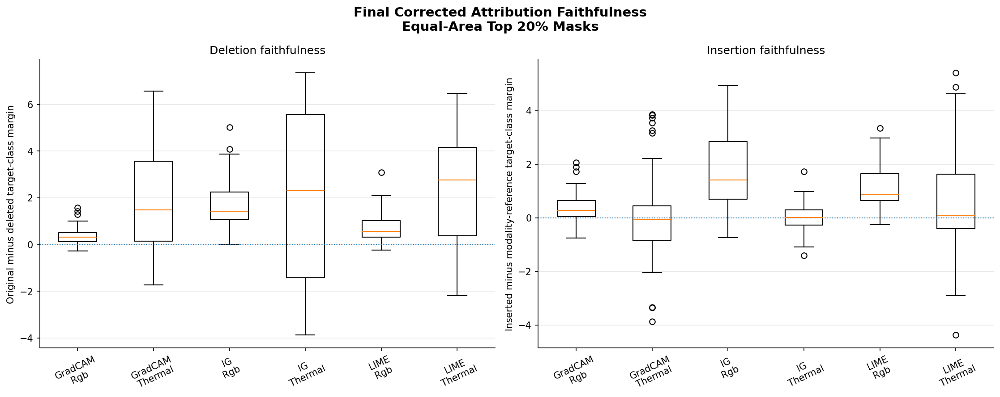

Saved: figures/corrected_posthoc/16_attribution_faithfulness_final.pdf


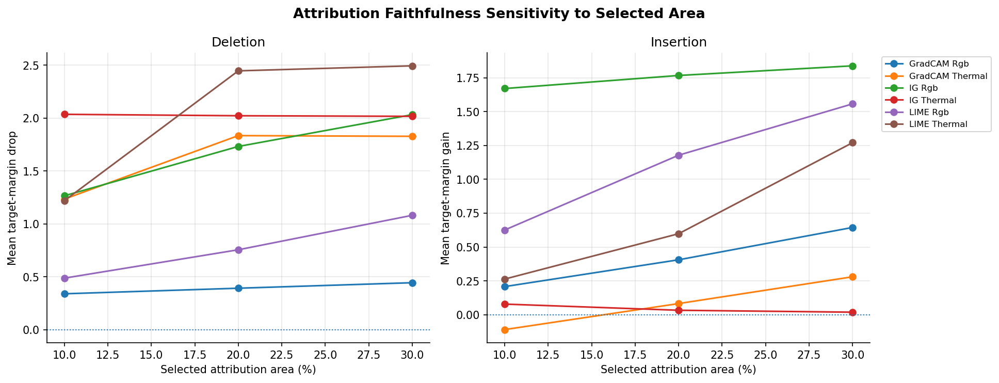

Saved: figures/corrected_posthoc/16_attribution_faithfulness_area_sensitivity.pdf

Final corrected attribution-faithfulness analysis complete.


In [ ]:
# Unified attribution-faithfulness analysis

import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from tqdm.auto import tqdm


# 1. Required-object checks

required_faithfulness_objects = [
    "LATE_FUSION_MODEL",
    "datasets",
    "prediction_table",
    "REPRESENTATIVE_TEST_IDXS",
    "TRAIN_RGB_PIXEL_BASELINE",
    "TRAIN_TH_PIXEL_BASELINE",
    "target_logit_margin",
    "get_gradcam_map_corrected",
    "integrated_gradients_joint",
    "signed_ig_to_positive_map",
    "explain_lime_rgb",
    "explain_lime_thermal",
    "lime_continuous_map",
    "normalize_map",
    "POSTHOC_DIR",
]

missing_faithfulness_objects = [
    object_name
    for object_name in required_faithfulness_objects
    if object_name not in globals()
]

if missing_faithfulness_objects:
    raise NameError(
        "Required corrected post-hoc objects are missing: "
        + ", ".join(
            missing_faithfulness_objects
        )
    )


# 2. Equal-area attribution masks

def top_fraction_mask_strict(
    attribution_map,
    top_fraction=0.20,
):
    """
    Select approximately the top fraction of pixels by attribution.

    This implementation chooses an exact number of ranked pixels
    whenever the map is valid, avoiding oversized masks caused by
    repeated values at a quantile threshold.
    """
    attribution = np.asarray(
        attribution_map,
        dtype=np.float64,
    )

    attribution = np.nan_to_num(
        attribution,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )

    attribution = np.clip(
        attribution,
        0.0,
        None,
    )

    if attribution.ndim != 2:
        raise ValueError(
            "Expected a two-dimensional attribution map, "
            f"received {attribution.shape}."
        )

    if not 0 < top_fraction < 1:
        raise ValueError(
            "top_fraction must lie strictly between 0 and 1."
        )

    flat = attribution.ravel()

    if (
        flat.size == 0
        or np.max(flat) <= 0
        or np.std(flat) <= 1e-12
    ):
        return np.zeros_like(
            attribution,
            dtype=np.uint8,
        )

    number_selected = max(
        1,
        int(
            np.ceil(
                float(top_fraction)
                * flat.size
            )
        ),
    )

    ranked_indices = np.argsort(
        flat,
        kind="stable",
    )

    selected_indices = ranked_indices[
        -number_selected:
    ]

    mask_flat = np.zeros(
        flat.shape,
        dtype=np.uint8,
    )

    mask_flat[
        selected_indices
    ] = 1

    return mask_flat.reshape(
        attribution.shape
    )


def resize_binary_mask_to_tensor(
    mask,
    tensor,
):
    """
    Resize a binary attribution mask to a modality tensor's spatial size.
    """
    mask_tensor = torch.from_numpy(
        np.asarray(
            mask,
            dtype=np.float32,
        )
    ).unsqueeze(0).unsqueeze(0)

    resized = torch.nn.functional.interpolate(
        mask_tensor,
        size=(
            tensor.shape[-2],
            tensor.shape[-1],
        ),
        mode="nearest",
    )

    return resized.squeeze(0).to(
        dtype=tensor.dtype,
        device=tensor.device,
    )

# 3. Modality-specific deletion and insertion construction

def construct_modality_masked_inputs(
    rgb_t,
    th_t,
    binary_mask,
    modality,
    operation,
):
    """
    Construct deletion or insertion inputs.

    Deletion
    --------
    Start from the factual selected modality and replace the selected
    attribution region with its training-normal baseline.

    Insertion
    ---------
    Start from the selected modality's full training-normal baseline
    and insert the selected factual attribution region.

    In both cases, the non-tested modality remains factual.
    """
    if modality not in {
        "rgb",
        "thermal",
    }:
        raise ValueError(
            "modality must be 'rgb' or 'thermal'."
        )

    if operation not in {
        "deletion",
        "insertion",
    }:
        raise ValueError(
            "operation must be 'deletion' or 'insertion'."
        )

    rgb_factual = (
        rgb_t.detach()
        .clone()
    )

    th_factual = (
        th_t.detach()
        .clone()
    )

    rgb_baseline = (
        TRAIN_RGB_PIXEL_BASELINE
        .detach()
        .to(
            dtype=rgb_factual.dtype,
            device=rgb_factual.device,
        )
    )

    th_baseline = (
        TRAIN_TH_PIXEL_BASELINE
        .detach()
        .to(
            dtype=th_factual.dtype,
            device=th_factual.device,
        )
    )

    if modality == "rgb":
        mask_tensor = resize_binary_mask_to_tensor(
            binary_mask,
            rgb_factual,
        )

        if operation == "deletion":
            rgb_output = (
                rgb_factual
                * (
                    1.0
                    - mask_tensor
                )
                +
                rgb_baseline
                * mask_tensor
            )

        else:
            rgb_output = (
                rgb_baseline
                * (
                    1.0
                    - mask_tensor
                )
                +
                rgb_factual
                * mask_tensor
            )

        th_output = th_factual

    else:
        mask_tensor = resize_binary_mask_to_tensor(
            binary_mask,
            th_factual,
        )

        if operation == "deletion":
            th_output = (
                th_factual
                * (
                    1.0
                    - mask_tensor
                )
                +
                th_baseline
                * mask_tensor
            )

        else:
            th_output = (
                th_baseline
                * (
                    1.0
                    - mask_tensor
                )
                +
                th_factual
                * mask_tensor
            )

        rgb_output = rgb_factual

    return (
        rgb_output,
        th_output,
    )


# 4. Correct modality-specific insertion references

def modality_specific_reference_inputs(
    rgb_t,
    th_t,
    modality,
):
    """
    Construct the correct reference state for insertion.

    RGB reference:
        baseline RGB + factual thermal

    Thermal reference:
        factual RGB + baseline thermal
    """
    rgb_factual = (
        rgb_t.detach()
        .clone()
    )

    th_factual = (
        th_t.detach()
        .clone()
    )

    rgb_baseline = (
        TRAIN_RGB_PIXEL_BASELINE
        .detach()
        .to(
            dtype=rgb_factual.dtype,
            device=rgb_factual.device,
        )
    )

    th_baseline = (
        TRAIN_TH_PIXEL_BASELINE
        .detach()
        .to(
            dtype=th_factual.dtype,
            device=th_factual.device,
        )
    )

    if modality == "rgb":
        return (
            rgb_baseline,
            th_factual,
        )

    if modality == "thermal":
        return (
            rgb_factual,
            th_baseline,
        )

    raise ValueError(
        "modality must be 'rgb' or 'thermal'."
    )


# 5. Generate corrected method-specific attribution maps


def get_final_faithfulness_maps(
    model,
    rgb_t,
    th_t,
    target_class,
    sample_idx,
    ig_steps=100,
    lime_num_samples=1000,
):
    """
    Generate predicted-class support maps for all three spatial methods.

    Returns
    -------
    maps[method][modality]
    """
    maps = {
        "GradCAM": {},
        "IG": {},
        "LIME": {},
    }

    # Grad-CAM
    maps[
        "GradCAM"
    ][
        "rgb"
    ] = normalize_map(
        get_gradcam_map_corrected(
            model,
            rgb_t,
            th_t,
            modality="rgb",
            class_idx=target_class,
        )
    )

    maps[
        "GradCAM"
    ][
        "thermal"
    ] = normalize_map(
        get_gradcam_map_corrected(
            model,
            rgb_t,
            th_t,
            modality="thermal",
            class_idx=target_class,
        )
    )

    # Joint Integrated Gradients
    ig_rgb, ig_thermal, _ = (
        integrated_gradients_joint(
            model,
            rgb_t,
            th_t,
            target_class=target_class,
            steps=ig_steps,
        )
    )

    maps[
        "IG"
    ][
        "rgb"
    ] = normalize_map(
        signed_ig_to_positive_map(
            ig_rgb
        )
    )

    maps[
        "IG"
    ][
        "thermal"
    ] = normalize_map(
        signed_ig_to_positive_map(
            ig_thermal
        )
    )

    # Corrected LIME
    rgb_lime_explanation, _ = (
        explain_lime_rgb(
            model,
            rgb_t,
            th_t,
            random_state=(
                POSTHOC_SEED
                + int(sample_idx)
            ),
            num_samples=lime_num_samples,
        )
    )

    thermal_lime_explanation, _ = (
        explain_lime_thermal(
            model,
            rgb_t,
            th_t,
            random_state=(
                POSTHOC_SEED
                + 10_000
                + int(sample_idx)
            ),
            num_samples=lime_num_samples,
        )
    )

    maps[
        "LIME"
    ][
        "rgb"
    ] = normalize_map(
        lime_continuous_map(
            rgb_lime_explanation,
            class_idx=target_class,
            positive_only=True,
        )
    )

    maps[
        "LIME"
    ][
        "thermal"
    ] = normalize_map(
        lime_continuous_map(
            thermal_lime_explanation,
            class_idx=target_class,
            positive_only=True,
        )
    )

    return maps


# 6. Single faithfulness evaluation

def evaluate_single_faithfulness_map(
    model,
    rgb_t,
    th_t,
    attribution_map,
    modality,
    target_class,
    top_fraction,
):
    """
    Evaluate one attribution map using consistent deletion/insertion states.

    Metrics
    -------
    deletion_drop
        Original target-class margin minus the margin after deleting
        the selected region.

    insertion_gain
        Inserted target-class margin minus the modality-specific
        reference margin.

    insertion_fraction
        Fraction of the selected modality's full available margin
        change recovered by inserting the selected region.

    deletion_fraction
        Fraction of that modality's available margin change removed
        by deleting the selected region.
    """
    binary_mask = top_fraction_mask_strict(
        attribution_map,
        top_fraction=top_fraction,
    )

    selected_pixel_fraction = float(
        binary_mask.mean()
    )

    map_valid = bool(
        binary_mask.sum()
        > 0
    )

    original_margin = target_logit_margin(
        model,
        rgb_t,
        th_t,
        target_class,
    )

    reference_rgb, reference_th = (
        modality_specific_reference_inputs(
            rgb_t,
            th_t,
            modality=modality,
        )
    )

    reference_margin = target_logit_margin(
        model,
        reference_rgb,
        reference_th,
        target_class,
    )

    available_modality_change = (
        original_margin
        - reference_margin
    )

    if not map_valid:
        return {
            "valid_map": False,
            "selected_pixel_fraction": (
                selected_pixel_fraction
            ),
            "original_margin": original_margin,
            "reference_margin": reference_margin,
            "available_modality_change": (
                available_modality_change
            ),
            "deletion_margin": np.nan,
            "insertion_margin": np.nan,
            "deletion_drop": np.nan,
            "insertion_gain": np.nan,
            "deletion_fraction": np.nan,
            "insertion_fraction": np.nan,
            "error": (
                "Degenerate or empty attribution map."
            ),
        }

    deletion_rgb, deletion_th = (
        construct_modality_masked_inputs(
            rgb_t,
            th_t,
            binary_mask=binary_mask,
            modality=modality,
            operation="deletion",
        )
    )

    insertion_rgb, insertion_th = (
        construct_modality_masked_inputs(
            rgb_t,
            th_t,
            binary_mask=binary_mask,
            modality=modality,
            operation="insertion",
        )
    )

    deletion_margin = target_logit_margin(
        model,
        deletion_rgb,
        deletion_th,
        target_class,
    )

    insertion_margin = target_logit_margin(
        model,
        insertion_rgb,
        insertion_th,
        target_class,
    )

    deletion_drop = (
        original_margin
        - deletion_margin
    )

    insertion_gain = (
        insertion_margin
        - reference_margin
    )

    if abs(
        available_modality_change
    ) > 1e-8:
        deletion_fraction = (
            deletion_drop
            / available_modality_change
        )

        insertion_fraction = (
            insertion_gain
            / available_modality_change
        )

    else:
        deletion_fraction = np.nan
        insertion_fraction = np.nan

    return {
        "valid_map": True,
        "selected_pixel_fraction": (
            selected_pixel_fraction
        ),
        "original_margin": float(
            original_margin
        ),
        "reference_margin": float(
            reference_margin
        ),
        "available_modality_change": float(
            available_modality_change
        ),
        "deletion_margin": float(
            deletion_margin
        ),
        "insertion_margin": float(
            insertion_margin
        ),
        "deletion_drop": float(
            deletion_drop
        ),
        "insertion_gain": float(
            insertion_gain
        ),
        "deletion_fraction": float(
            deletion_fraction
        )
        if np.isfinite(
            deletion_fraction
        )
        else np.nan,
        "insertion_fraction": float(
            insertion_fraction
        )
        if np.isfinite(
            insertion_fraction
        )
        else np.nan,
        "error": None,
    }

# 7. Evaluate all corrected attribution methods

def evaluate_final_attribution_faithfulness(
    model,
    dataset,
    prediction_df,
    sample_indices,
    top_fractions=(
        0.10,
        0.20,
        0.30,
    ),
    ig_steps=100,
    lime_num_samples=1000,
    save_name="16_attribution_faithfulness_final.csv",
):
    """
    Evaluate Grad-CAM, IG, and LIME on the same representative samples,
    modalities, target classes, mask areas, and modality-specific
    reference states.
    """
    rows = []
    failures = []

    for sample_idx in tqdm(
        sample_indices,
        desc="Final attribution faithfulness",
    ):
        try:
            rgb_t, th_t, true_label = dataset[
                sample_idx
            ]

            prediction_row = prediction_df[
                prediction_df[
                    "sample_idx"
                ]
                == sample_idx
            ].iloc[0]

            target_class = int(
                prediction_row[
                    "pred_label"
                ]
            )

            maps = get_final_faithfulness_maps(
                model,
                rgb_t,
                th_t,
                target_class=target_class,
                sample_idx=sample_idx,
                ig_steps=ig_steps,
                lime_num_samples=lime_num_samples,
            )

            for method in [
                "GradCAM",
                "IG",
                "LIME",
            ]:
                for modality in [
                    "rgb",
                    "thermal",
                ]:
                    attribution_map = maps[
                        method
                    ][
                        modality
                    ]

                    for top_fraction in top_fractions:
                        try:
                            metrics = (
                                evaluate_single_faithfulness_map(
                                    model,
                                    rgb_t,
                                    th_t,
                                    attribution_map=(
                                        attribution_map
                                    ),
                                    modality=modality,
                                    target_class=target_class,
                                    top_fraction=top_fraction,
                                )
                            )

                            rows.append(
                                {
                                    "sample_idx": int(
                                        sample_idx
                                    ),
                                    "true_label": int(
                                        true_label
                                    ),
                                    "pred_label": target_class,
                                    "category": prediction_row[
                                        "category"
                                    ],
                                    "p_anomaly": float(
                                        prediction_row[
                                            "p_anomaly"
                                        ]
                                    ),
                                    "predicted_confidence": float(
                                        prediction_row[
                                            "predicted_confidence"
                                        ]
                                    ),
                                    "decision_confidence": float(
                                        prediction_row[
                                            "decision_confidence"
                                        ]
                                    ),
                                    "method": method,
                                    "modality": modality,
                                    "target_class": (
                                        target_class
                                    ),
                                    "top_fraction": float(
                                        top_fraction
                                    ),
                                    **metrics,
                                }
                            )

                        except Exception as error:
                            failures.append(
                                {
                                    "sample_idx": int(
                                        sample_idx
                                    ),
                                    "stage": (
                                        "metric_evaluation"
                                    ),
                                    "method": method,
                                    "modality": modality,
                                    "top_fraction": float(
                                        top_fraction
                                    ),
                                    "error": str(
                                        error
                                    ),
                                }
                            )

        except Exception as error:
            failures.append(
                {
                    "sample_idx": int(
                        sample_idx
                    ),
                    "stage": "map_generation",
                    "method": None,
                    "modality": None,
                    "top_fraction": None,
                    "error": str(
                        error
                    ),
                }
            )

            print(
                f"Faithfulness failed for sample "
                f"{sample_idx}: {error}"
            )

    faithfulness_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    faithfulness_df.to_csv(
        output_path,
        index=False,
    )

    if failures:
        failure_path = (
            POSTHOC_DIR
            / "16_attribution_faithfulness_failures.csv"
        )

        pd.DataFrame(
            failures
        ).to_csv(
            failure_path,
            index=False,
        )

        print(
            "Faithfulness failures saved:",
            failure_path,
        )

    print(
        "Final faithfulness results saved:",
        output_path,
    )

    return faithfulness_df


attribution_faithfulness_final_df = (
    evaluate_final_attribution_faithfulness(
        LATE_FUSION_MODEL,
        datasets["test"],
        prediction_table,
        REPRESENTATIVE_TEST_IDXS,
        top_fractions=(
            0.10,
            0.20,
            0.30,
        ),
        ig_steps=100,
        lime_num_samples=1000,
    )
)

# 8. Primary top-20% faithfulness summary

def summarize_final_faithfulness(
    faithfulness_df,
    primary_top_fraction=0.20,
):
    """
    Summarize the primary equal-area top-20% results.
    """
    primary_df = faithfulness_df[
        np.isclose(
            faithfulness_df[
                "top_fraction"
            ],
            primary_top_fraction,
        )
    ].copy()

    valid = primary_df[
        primary_df[
            "valid_map"
        ]
    ].copy()

    summary = (
        valid.groupby(
            [
                "method",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            NSamples=(
                "sample_idx",
                "nunique",
            ),
            MeanAvailableModalityChange=(
                "available_modality_change",
                "mean",
            ),
            MedianAvailableModalityChange=(
                "available_modality_change",
                "median",
            ),
            MeanDeletionDrop=(
                "deletion_drop",
                "mean",
            ),
            MedianDeletionDrop=(
                "deletion_drop",
                "median",
            ),
            MeanInsertionGain=(
                "insertion_gain",
                "mean",
            ),
            MedianInsertionGain=(
                "insertion_gain",
                "median",
            ),
            MeanDeletionFraction=(
                "deletion_fraction",
                "mean",
            ),
            MedianDeletionFraction=(
                "deletion_fraction",
                "median",
            ),
            MeanInsertionFraction=(
                "insertion_fraction",
                "mean",
            ),
            MedianInsertionFraction=(
                "insertion_fraction",
                "median",
            ),
            PositiveDeletionRate=(
                "deletion_drop",
                lambda values: float(
                    (
                        values
                        > 0
                    ).mean()
                ),
            ),
            PositiveInsertionRate=(
                "insertion_gain",
                lambda values: float(
                    (
                        values
                        > 0
                    ).mean()
                ),
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "16_attribution_faithfulness_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nFinal corrected attribution faithfulness "
        f"(top {int(primary_top_fraction * 100)}%)"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


attribution_faithfulness_summary = (
    summarize_final_faithfulness(
        attribution_faithfulness_final_df,
        primary_top_fraction=0.20,
    )
)


# 9. Outcome-specific summary

def summarize_faithfulness_by_outcome(
    faithfulness_df,
    primary_top_fraction=0.20,
):
    """
    Report faithfulness separately for TP, TN, FP, and FN outcomes.
    """
    primary_valid = faithfulness_df[
        np.isclose(
            faithfulness_df[
                "top_fraction"
            ],
            primary_top_fraction,
        )
        &
        faithfulness_df[
            "valid_map"
        ]
    ].copy()

    summary = (
        primary_valid.groupby(
            [
                "category",
                "method",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanDeletionDrop=(
                "deletion_drop",
                "mean",
            ),
            MedianDeletionDrop=(
                "deletion_drop",
                "median",
            ),
            MeanInsertionGain=(
                "insertion_gain",
                "mean",
            ),
            MedianInsertionGain=(
                "insertion_gain",
                "median",
            ),
            MedianDeletionFraction=(
                "deletion_fraction",
                "median",
            ),
            MedianInsertionFraction=(
                "insertion_fraction",
                "median",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "16_attribution_faithfulness_by_outcome.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nFaithfulness by prediction outcome"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


attribution_faithfulness_by_outcome = (
    summarize_faithfulness_by_outcome(
        attribution_faithfulness_final_df,
        primary_top_fraction=0.20,
    )
)


# 10. Mask-area sensitivity summary

def summarize_faithfulness_area_sensitivity(
    faithfulness_df,
):
    """
    Show whether faithfulness conclusions depend on selecting the
    top 10%, 20%, or 30% of attribution pixels.
    """
    valid = faithfulness_df[
        faithfulness_df[
            "valid_map"
        ]
    ].copy()

    summary = (
        valid.groupby(
            [
                "method",
                "modality",
                "top_fraction",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanDeletionDrop=(
                "deletion_drop",
                "mean",
            ),
            MeanInsertionGain=(
                "insertion_gain",
                "mean",
            ),
            MedianDeletionFraction=(
                "deletion_fraction",
                "median",
            ),
            MedianInsertionFraction=(
                "insertion_fraction",
                "median",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / "16_attribution_faithfulness_area_sensitivity.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nFaithfulness sensitivity to selected attribution area"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


attribution_faithfulness_area_summary = (
    summarize_faithfulness_area_sensitivity(
        attribution_faithfulness_final_df
    )
)

# 11. Faithfulness comparison figure

def plot_final_faithfulness(
    faithfulness_df,
    primary_top_fraction=0.20,
    save_name="16_attribution_faithfulness_final.pdf",
):
    """
    Plot deletion drop and insertion gain by method and modality.
    """
    plot_df = faithfulness_df[
        np.isclose(
            faithfulness_df[
                "top_fraction"
            ],
            primary_top_fraction,
        )
        &
        faithfulness_df[
            "valid_map"
        ]
    ].copy()

    method_order = [
        "GradCAM",
        "IG",
        "LIME",
    ]

    modality_order = [
        "rgb",
        "thermal",
    ]

    labels = [
        f"{method}\n{modality.capitalize()}"
        for method in method_order
        for modality in modality_order
    ]

    deletion_data = []
    insertion_data = []

    for method in method_order:
        for modality in modality_order:
            subset = plot_df[
                (
                    plot_df[
                        "method"
                    ]
                    == method
                )
                &
                (
                    plot_df[
                        "modality"
                    ]
                    == modality
                )
            ]

            deletion_data.append(
                subset[
                    "deletion_drop"
                ].dropna().to_numpy()
            )

            insertion_data.append(
                subset[
                    "insertion_gain"
                ].dropna().to_numpy()
            )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            15,
            6,
        ),
    )

    valid_deletion_positions = [
        index + 1
        for index, values in enumerate(
            deletion_data
        )
        if len(values) > 0
    ]

    valid_deletion_data = [
        values
        for values in deletion_data
        if len(values) > 0
    ]

    valid_deletion_labels = [
        labels[
            index - 1
        ]
        for index in valid_deletion_positions
    ]

    if valid_deletion_data:
        axes[
            0
        ].boxplot(
            valid_deletion_data,
            positions=valid_deletion_positions,
            labels=valid_deletion_labels,
            showfliers=True,
        )

    axes[
        0
    ].axhline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    axes[
        0
    ].set_title(
        "Deletion faithfulness"
    )

    axes[
        0
    ].set_ylabel(
        "Original minus deleted target-class margin"
    )

    axes[
        0
    ].tick_params(
        axis="x",
        rotation=25,
    )

    axes[
        0
    ].grid(
        alpha=0.3,
        axis="y",
    )

    valid_insertion_positions = [
        index + 1
        for index, values in enumerate(
            insertion_data
        )
        if len(values) > 0
    ]

    valid_insertion_data = [
        values
        for values in insertion_data
        if len(values) > 0
    ]

    valid_insertion_labels = [
        labels[
            index - 1
        ]
        for index in valid_insertion_positions
    ]

    if valid_insertion_data:
        axes[
            1
        ].boxplot(
            valid_insertion_data,
            positions=valid_insertion_positions,
            labels=valid_insertion_labels,
            showfliers=True,
        )

    axes[
        1
    ].axhline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    axes[
        1
    ].set_title(
        "Insertion faithfulness"
    )

    axes[
        1
    ].set_ylabel(
        "Inserted minus modality-reference target-class margin"
    )

    axes[
        1
    ].tick_params(
        axis="x",
        rotation=25,
    )

    axes[
        1
    ].grid(
        alpha=0.3,
        axis="y",
    )

    plt.suptitle(
        (
            "Final Corrected Attribution Faithfulness\n"
            f"Equal-Area Top {int(primary_top_fraction * 100)}% Masks"
        ),
        fontsize=14,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_final_faithfulness(
    attribution_faithfulness_final_df,
    primary_top_fraction=0.20,
)


# 12. Mask-area sensitivity figure

def plot_faithfulness_area_sensitivity(
    faithfulness_df,
    save_name="16_attribution_faithfulness_area_sensitivity.pdf",
):
    """
    Plot mean deletion and insertion results over top-10%, 20%, and 30%.
    """
    valid = faithfulness_df[
        faithfulness_df[
            "valid_map"
        ]
    ].copy()

    summary = (
        valid.groupby(
            [
                "method",
                "modality",
                "top_fraction",
            ]
        )
        .agg(
            MeanDeletionDrop=(
                "deletion_drop",
                "mean",
            ),
            MeanInsertionGain=(
                "insertion_gain",
                "mean",
            ),
        )
        .reset_index()
    )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(
            13,
            5,
        ),
    )

    for (
        method,
        modality,
    ), subset in summary.groupby(
        [
            "method",
            "modality",
        ]
    ):
        subset = subset.sort_values(
            "top_fraction"
        )

        line_label = (
            f"{method} {modality.capitalize()}"
        )

        axes[
            0
        ].plot(
            subset[
                "top_fraction"
            ]
            * 100,
            subset[
                "MeanDeletionDrop"
            ],
            marker="o",
            label=line_label,
        )

        axes[
            1
        ].plot(
            subset[
                "top_fraction"
            ]
            * 100,
            subset[
                "MeanInsertionGain"
            ],
            marker="o",
            label=line_label,
        )

    axes[
        0
    ].axhline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    axes[
        0
    ].set_title(
        "Deletion"
    )

    axes[
        0
    ].set_xlabel(
        "Selected attribution area (%)"
    )

    axes[
        0
    ].set_ylabel(
        "Mean target-margin drop"
    )

    axes[
        0
    ].grid(
        alpha=0.3
    )

    axes[
        1
    ].axhline(
        0.0,
        linestyle=":",
        linewidth=1,
    )

    axes[
        1
    ].set_title(
        "Insertion"
    )

    axes[
        1
    ].set_xlabel(
        "Selected attribution area (%)"
    )

    axes[
        1
    ].set_ylabel(
        "Mean target-margin gain"
    )

    axes[
        1
    ].grid(
        alpha=0.3
    )

    axes[
        1
    ].legend(
        fontsize=8,
        bbox_to_anchor=(
            1.02,
            1.0,
        ),
        loc="upper left",
    )

    plt.suptitle(
        "Attribution Faithfulness Sensitivity to Selected Area",
        fontsize=13,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_faithfulness_area_sensitivity(
    attribution_faithfulness_final_df
)

# 13. Save final faithfulness metadata

faithfulness_metadata = {
    "analysis": (
        "Final unified attribution faithfulness"
    ),
    "model": (
        "Late-Fusion"
    ),
    "methods": [
        "Grad-CAM",
        "Joint Integrated Gradients",
        "LIME",
    ],
    "modalities": [
        "RGB",
        "Thermal",
    ],
    "target": (
        "Original predicted class"
    ),
    "target_function": (
        "Predicted-class logit margin"
    ),
    "deletion_definition": (
        "Selected attribution region replaced with the corresponding "
        "training-normal modality baseline while the other modality "
        "remains factual"
    ),
    "rgb_insertion_reference": (
        "Training-normal RGB baseline plus factual thermal"
    ),
    "thermal_insertion_reference": (
        "Factual RGB plus training-normal thermal baseline"
    ),
    "insertion_definition": (
        "Selected factual attribution region inserted into the "
        "modality-specific reference while the other modality remains factual"
    ),
    "available_modality_change": (
        "Original target-class margin minus modality-specific "
        "reference margin"
    ),
    "primary_mask_area": 0.20,
    "mask_area_sensitivity": [
        0.10,
        0.20,
        0.30,
    ],
    "mask_selection": (
        "Exact equal-area ranking among attribution pixels"
    ),
    "sample_design": (
        "Representative TP/TN/FP/FN test examples stratified "
        "across confidence"
    ),
    "supersedes": [
        "Earlier Grad-CAM faithfulness table",
        "Earlier IG faithfulness table",
        "Earlier LIME faithfulness table",
    ],
    "interpretation_limit": (
        "Deletion and insertion measure behavioral sensitivity to "
        "attribution-selected regions. They do not independently "
        "establish causal correctness."
    ),
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / "16_attribution_faithfulness_metadata.json",
    "w",
) as file:
    json.dump(
        faithfulness_metadata,
        file,
        indent=2,
    )

print(
    "\nFinal corrected attribution-faithfulness analysis complete."
)

Auditing post-hoc directory: /Users/mdtohidulislam/Documents/Research/figures/corrected_posthoc
Audit timestamp: 2026-07-14T19:31:28

Expected-file audit


,analysis,expected_filename,resolved_filename,exists,used_alias,file_type,size_bytes,readable,n_rows,n_columns,numeric_columns,nan_values,positive_infinity_values,negative_infinity_values,error
0,Grad-CAM visualization,07_gradcam_corrected.pdf,07_gradcam_corrected.pdf,True,False,.pdf,1503315,True,NaN,NaN,NaN,NaN,NaN,NaN,None
1,IG visualization,08_ig_corrected.pdf,08_ig_corrected.pdf,True,False,.pdf,1467870,True,NaN,NaN,NaN,NaN,NaN,NaN,None
2,LIME visualization,09_lime_corrected.pdf,09_lime_corrected.pdf,True,False,.pdf,1311181,True,NaN,NaN,NaN,NaN,NaN,NaN,None
3,LIME stability,09_lime_stability_corrected.csv,09_lime_stability_corrected.csv,True,False,.csv,13437,True,240.0,9.0,7.0,240.0,0.0,0.0,None
4,LIME metadata,09_lime_metadata.json,09_lime_metadata.json,True,False,.json,1127,True,1.0,15.0,NaN,NaN,NaN,NaN,None
5,Exact modality Shapley results,10_exact_modality_shapley.csv,10_exact_modality_shapley.csv,True,False,.csv,5632153,True,18670.0,21.0,18.0,0.0,0.0,0.0,None
6,Exact modality Shapley summary,10_exact_modality_shapley_summary.csv,10_exact_modality_shapley_summary.csv,True,False,.csv,2115,True,5.0,21.0,20.0,0.0,0.0,0.0,None
7,Cross-method agreement,11_cross_method_agreement_corrected.csv,11_cross_method_agreement_corrected.csv,True,False,.csv,62394,True,360.0,17.0,10.0,18.0,0.0,0.0,None
8,Cross-method agreement summary,11_cross_method_agreement_summary.csv,11_cross_method_agreement_summary.csv,True,False,.csv,3105,True,18.0,11.0,9.0,0.0,0.0,0.0,None
9,Cross-method agreement figure,11_cross_method_agreement_heatmaps.pdf,11_cross_method_agreement_heatmaps.pdf,True,False,.pdf,32751,True,NaN,NaN,NaN,NaN,NaN,NaN,None


Saved: figures/corrected_posthoc/17_expected_file_audit.csv

Failure-file audit
No failure CSV files were found.
Saved: figures/corrected_posthoc/17_failure_file_audit.csv

Sample-coverage audit


,analysis,expected_unique_samples,observed_unique_samples,coverage_fraction,exact_match
0,Exact modality Shapley,18670,18670,1.0,True
1,Cross-method spatial agreement,20,20,1.0,True
2,CCME,60,60,1.0,True
3,Complexity,80,80,1.0,True
4,Robustness,20,20,1.0,True
5,Modality replacement,18670,18670,1.0,True
6,Final attribution faithfulness,40,40,1.0,True


Saved: figures/corrected_posthoc/17_sample_coverage_audit.csv

Analysis-specific structural checks


,analysis,check,status,severity,observed,expected,note
0,Prediction table,Required columns present,PASS,error,All present,"category, decision_confidence, p_anomaly, pred...",NaN
1,Prediction table,"Anomaly probabilities in [0,1]",PASS,error,"min=0.004790, max=0.989777","[0,1]",NaN
2,Exact modality Shapley,Efficiency reconstruction error,PASS,error,0.0,≤ 1e-5,Exact two-player Shapley values should reconst...
3,Cross-method agreement,"iou in [0,1]",PASS,error,"min=0.000000, max=0.564354","[0,1]",NaN
4,Cross-method agreement,"dice in [0,1]",PASS,error,"min=0.000000, max=0.721517","[0,1]",NaN
5,Cross-method agreement,Mask-area sensitivity levels,PASS,error,"[0.1, 0.2, 0.3]","[0.1, 0.2, 0.3]",NaN
6,CCME,"alpha_observed in [0,1]",PASS,error,"min=0.041787, max=0.993574","[0,1]",NaN
7,CCME,"alpha_linear in [0,1]",PASS,error,"min=0.041297, max=0.993395","[0,1]",NaN
8,CCME,Crossing indicator agrees with observed alpha,PASS,error,crossing_without_alpha=0; alpha_without_crossi...,Both counts = 0,NaN
9,CCME,Necessity only applied to positive factual mar...,PASS,error,0,0,NaN


Saved: figures/corrected_posthoc/17_structural_checks.csv

Publication Shapley summary


,Modality,N,MeanSignedShapley,MedianSignedShapley,MeanAbsoluteShapley,MedianAbsoluteShapley,PositiveShapleyRate
0,Rgb,18670,0.567567,0.275596,0.652084,0.339331,0.803642
1,Thermal,18670,0.758825,0.008618,1.197098,0.546393,0.505517


Saved: figures/corrected_posthoc/17_publication_shapley_summary.csv

Publication CCME summary


,Analysis,Modality,NTotal,NApplicable,NCrossings,CrossingRateAmongApplicable,MeanAlphaAmongCrossings,MedianAlphaAmongCrossings,Q25Alpha,Q75Alpha,MultipleCrossingCount,MonotonicPathRate
0,Necessity,Rgb,60,30,12,0.400000,0.524581,0.625703,0.178157,0.802747,0,0.516667
1,Necessity,Thermal,60,30,28,0.933333,0.486410,0.552534,0.305665,0.643518,0,0.650000
2,Sufficiency,Rgb,60,60,4,0.066667,0.777712,0.798584,0.772047,0.804249,0,0.666667
3,Sufficiency,Thermal,60,60,20,0.333333,0.668748,0.672637,0.581318,0.836501,0,0.750000


Saved: figures/corrected_posthoc/17_publication_ccme_summary.csv

Publication final-faithfulness summary


,Method,Modality,NTotal,NValid,ValidMapRate,MeanDeletionDrop,MedianDeletionDrop,PositiveDeletionRate,MeanInsertionGain,MedianInsertionGain,PositiveInsertionRate,MedianDeletionFraction,MedianInsertionFraction
0,GradCAM,Rgb,40,39,0.975,0.391054,0.316869,0.897436,0.405513,0.279792,0.794872,0.096346,0.161445
1,GradCAM,Thermal,40,40,1.000,1.833186,1.484920,0.800000,0.082198,-0.072160,0.400000,0.370722,0.273818
2,IG,Rgb,40,40,1.000,1.730871,1.432906,0.975000,1.766785,1.416020,0.950000,0.533017,0.837024
3,IG,Thermal,40,40,1.000,2.021105,2.300261,0.625000,0.032731,0.015072,0.550000,1.010706,-0.011774
4,LIME,Rgb,40,40,1.000,0.754380,0.568226,0.950000,1.177923,0.884544,0.950000,0.108264,0.460350
5,LIME,Thermal,40,40,1.000,2.445508,2.761257,0.875000,0.598111,0.089220,0.575000,0.418515,0.400880


Saved: figures/corrected_posthoc/17_publication_faithfulness_summary.csv

Publication robustness summary


,perturbation,method,modality,N,NSamples,MeanIoU,MedianIoU,MeanDice,MeanSpearman,MeanSSIM,PredictionFlipRate,MeanAbsProbabilityChange
0,Gaussian_sigma_0.05,GradCAM,rgb,60,20,0.587824,0.741756,0.678439,0.634340,0.669062,0.316667,0.258165
1,Gaussian_sigma_0.05,GradCAM,thermal,60,20,0.386468,0.361939,0.498190,0.517962,0.571195,0.316667,0.258165
2,Gaussian_sigma_0.05,IG,rgb,60,20,0.569464,0.564403,0.724812,0.753246,0.832961,0.316667,0.258165
3,Gaussian_sigma_0.05,IG,thermal,60,20,0.261583,0.255245,0.413785,0.267120,0.563137,0.316667,0.258165
4,Gaussian_sigma_0.10,GradCAM,rgb,60,20,0.272153,0.187622,0.359477,0.258783,0.467054,0.450000,0.366786
5,Gaussian_sigma_0.10,GradCAM,thermal,60,20,0.188332,0.103014,0.277103,0.125939,0.398386,0.450000,0.366786
6,Gaussian_sigma_0.10,IG,rgb,60,20,0.433970,0.451390,0.603034,0.577847,0.694194,0.450000,0.366786
7,Gaussian_sigma_0.10,IG,thermal,60,20,0.194881,0.191712,0.325623,0.134384,0.483766,0.450000,0.366786
8,Joint_rotation_plus_5deg,GradCAM,rgb,20,20,0.360441,0.283865,0.482493,0.507473,0.559126,0.150000,0.133323
9,Joint_rotation_plus_5deg,GradCAM,thermal,20,20,0.443415,0.452341,0.560181,0.648372,0.604567,0.150000,0.133323


Saved: figures/corrected_posthoc/17_publication_robustness_summary.csv

Publication modality-replacement summary


,ModalityReplaced,N,MeanProbabilityDrop,MedianProbabilityDrop,MeanAbsoluteProbabilityChange,MedianAbsoluteProbabilityChange,PositiveDropRate,NegativeDropRate,PredictionFlipRate
0,Rgb,18670,-0.108358,-0.069046,0.177557,0.096526,0.223567,0.776433,0.162560
1,Thermal,18670,0.155029,0.008456,0.158767,0.011505,0.687681,0.312319,0.151848


Saved: figures/corrected_posthoc/17_publication_replacement_summary.csv

Publication output manifest


,Paper component,Definitive outputs,Use in paper,Important interpretation
0,Representative spatial explanations,07_gradcam_corrected.pdf; 08_ig_corrected.pdf;...,Qualitative explanation figure,Visualization only; faithfulness is evaluated ...
1,Attribution faithfulness,16_attribution_faithfulness_final.csv; 17_publ...,Primary quantitative spatial-explanation valid...,Uses modality-specific insertion references
2,Cross-method consistency,11_cross_method_agreement_corrected.csv; 11_cr...,Secondary spatial-consistency analysis,Agreement is not explanation correctness
3,Exact modality Shapley,10_exact_modality_shapley.csv; 17_publication_...,Exact two-player modality attribution,"Embedding-level, non-spatial attribution"
4,CCME necessity and sufficiency,12_ccme_corrected.csv; 17_publication_ccme_sum...,Primary proposed-method results,Report applicability and crossing incidence be...
5,Explanation complexity,13_complexity_corrected.csv; 13_complexity_cor...,Exploratory spatial-diffuseness analysis,Entropy is not explanation quality
6,Explanation robustness,14_robustness_corrected.csv; 17_publication_ro...,Perturbation-stability analysis,Rotation maps are inverse aligned
7,Modality replacement,15_modality_replacement_sensitivity.csv; 17_pu...,Full-test behavioral sensitivity analysis,"Call it replacement sensitivity, not additive ..."


Saved: figures/corrected_posthoc/17_publication_manifest.csv

FINAL POST-HOC AUDIT VERDICT: READY
timestamp: 2026-07-14T19:31:28
verdict: READY
critical_issue_count: 0
review_issue_count: 0
missing_expected_files: 0
unreadable_files: 0
failed_structural_checks: 0
warning_structural_checks: 0
incomplete_sample_coverage_rows: 0
failure_files_with_records: 0
notes: Intentional NaN values for unavailable, non-applicable, censored, or degenerate cases are not automatically failures.

Saved: figures/corrected_posthoc/17_overall_audit_verdict.json
Saved: figures/corrected_posthoc/17_overall_audit_verdict.csv


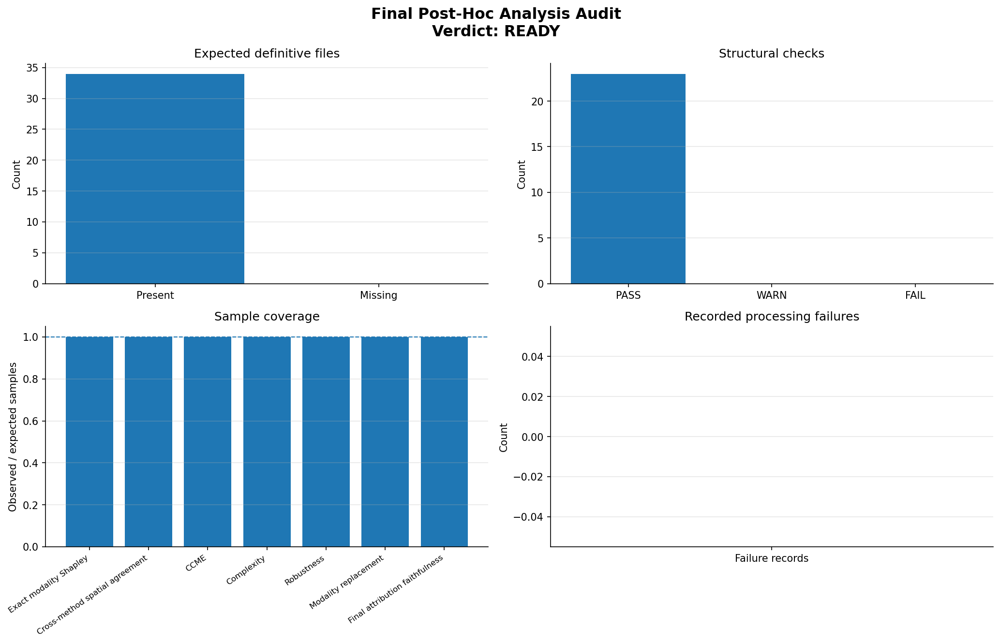

Saved: figures/corrected_posthoc/17_posthoc_audit_dashboard.pdf

Final audit outputs:
✓ 17_expected_file_audit.csv
✓ 17_failure_file_audit.csv
✓ 17_sample_coverage_audit.csv
✓ 17_structural_checks.csv
✓ 17_publication_shapley_summary.csv
✓ 17_publication_ccme_summary.csv
✓ 17_publication_faithfulness_summary.csv
✓ 17_publication_robustness_summary.csv
✓ 17_publication_replacement_summary.csv
✓ 17_publication_manifest.csv
✓ 17_overall_audit_verdict.csv
✓ 17_overall_audit_verdict.json
✓ 17_posthoc_audit_dashboard.pdf
✓ 17_complete_audit_metadata.json

Final post-hoc audit and publication-summary cell complete.


In [ ]:
# Post-hoc analysis summary and integrity checks

import json
import math
from datetime import datetime
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 1. Configuration


AUDIT_PREFIX = "17"
AUDIT_TIMESTAMP = datetime.now().isoformat(
    timespec="seconds"
)

POSTHOC_DIR = Path(
    POSTHOC_DIR
)

POSTHOC_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

print(
    "Auditing post-hoc directory:",
    POSTHOC_DIR.resolve(),
)

print(
    "Audit timestamp:",
    AUDIT_TIMESTAMP,
)


# 2. Expected definitive outputs

# Earlier method-specific faithfulness files may remain in the directory,
# but the definitive faithfulness outputs are the 16_* files.

EXPECTED_DEFINITIVE_FILES = {
    # Grad-CAM
    "Grad-CAM visualization": (
        "07_gradcam_corrected.pdf"
    ),

    # Integrated Gradients
    "IG visualization": (
        "08_ig_corrected.pdf"
    ),

    # LIME
    "LIME visualization": (
        "09_lime_corrected.pdf"
    ),
    "LIME stability": (
        "09_lime_stability_corrected.csv"
    ),
    "LIME metadata": (
        "09_lime_metadata.json"
    ),

    # Exact modality Shapley
    "Exact modality Shapley results": (
        "10_exact_modality_shapley.csv"
    ),
    "Exact modality Shapley summary": (
        "10_exact_modality_shapley_summary.csv"
    ),

    # Cross-method spatial agreement
    "Cross-method agreement": (
        "11_cross_method_agreement_corrected.csv"
    ),
    "Cross-method agreement summary": (
        "11_cross_method_agreement_summary.csv"
    ),
    "Cross-method agreement figure": (
        "11_cross_method_agreement_heatmaps.pdf"
    ),

    # CCME
    "CCME records": (
        "12_ccme_corrected.csv"
    ),
    "CCME status summary": (
        "12_ccme_status_summary.csv"
    ),
    "CCME applicability summary": (
        "12_ccme_applicability_summary.csv"
    ),
    "CCME crossing summary": (
        "12_ccme_crossing_alpha_summary.csv"
    ),
    "CCME linear validation": (
        "12_ccme_linear_validation.csv"
    ),
    "CCME metadata": (
        "12_ccme_metadata.json"
    ),

    # Complexity
    "Complexity records": (
        "13_complexity_corrected.csv"
    ),
    "Complexity validity summary": (
        "13_complexity_validity_summary.csv"
    ),
    "Complexity correlations": (
        "13_complexity_correlations.csv"
    ),
    "Complexity metadata": (
        "13_complexity_metadata.json"
    ),

    # Robustness
    "Robustness records": (
        "14_robustness_corrected.csv"
    ),
    "Robustness summary": (
        "14_robustness_summary.csv"
    ),
    "Prediction perturbation summary": (
        "14_prediction_perturbation_summary.csv"
    ),
    "Robustness metadata": (
        "14_robustness_metadata.json"
    ),

    # Modality replacement
    "Replacement records": (
        "15_modality_replacement_sensitivity.csv"
    ),
    "Replacement summary": (
        "15_modality_replacement_summary.csv"
    ),
    "Replacement paired summary": (
        "15_modality_replacement_paired_summary.csv"
    ),
    "Replacement metadata": (
        "15_modality_replacement_metadata.json"
    ),

    # Final definitive faithfulness
    "Final faithfulness records": (
        "16_attribution_faithfulness_final.csv"
    ),
    "Final faithfulness summary": (
        "16_attribution_faithfulness_summary.csv"
    ),
    "Final faithfulness by outcome": (
        "16_attribution_faithfulness_by_outcome.csv"
    ),
    "Final faithfulness area sensitivity": (
        "16_attribution_faithfulness_area_sensitivity.csv"
    ),
    "Final faithfulness figure": (
        "16_attribution_faithfulness_final.pdf"
    ),
    "Final faithfulness metadata": (
        "16_attribution_faithfulness_metadata.json"
    ),
}


# Some earlier cells may have used slightly different Shapley filenames.
# These aliases are accepted when the primary expected name is absent.

FILE_ALIASES = {
    "10_exact_modality_shapley.csv": [
        "10_exact_shapley.csv",
        "10_modality_shapley_exact.csv",
        "10_shapley_exact.csv",
    ],
    "10_exact_modality_shapley_summary.csv": [
        "10_exact_shapley_summary.csv",
        "10_modality_shapley_summary.csv",
        "10_shapley_summary.csv",
    ],
    "07_gradcam_corrected.pdf": [
        "07_gradcam.pdf",
    ],
    "08_ig_corrected.pdf": [
        "08_ig.pdf",
        "08_integrated_gradients_corrected.pdf",
    ],
}


# 3. General file utilities

def resolve_expected_file(
    directory,
    filename,
):
    """
    Return the primary file when present, otherwise check accepted aliases.
    """
    primary_path = (
        directory
        / filename
    )

    if primary_path.exists():
        return {
            "exists": True,
            "path": primary_path,
            "used_alias": False,
            "expected_name": filename,
        }

    for alias in FILE_ALIASES.get(
        filename,
        [],
    ):
        alias_path = (
            directory
            / alias
        )

        if alias_path.exists():
            return {
                "exists": True,
                "path": alias_path,
                "used_alias": True,
                "expected_name": filename,
            }

    return {
        "exists": False,
        "path": primary_path,
        "used_alias": False,
        "expected_name": filename,
    }


def safe_read_csv(
    path,
):
    """
    Read a CSV safely and return its dataframe plus an error message.
    """
    try:
        dataframe = pd.read_csv(
            path
        )

        return (
            dataframe,
            None,
        )

    except Exception as error:
        return (
            None,
            str(
                error
            ),
        )


def safe_read_json(
    path,
):
    """
    Read JSON safely.
    """
    try:
        with open(
            path,
            "r",
        ) as file:
            content = json.load(
                file
            )

        return (
            content,
            None,
        )

    except Exception as error:
        return (
            None,
            str(
                error
            ),
        )


def dataframe_numeric_audit(
    dataframe,
):
    """
    Count nonfinite values in numeric columns.

    NaN is not automatically an error because many analyses use NaN
    for unavailable, censored, non-applicable, or degenerate cases.
    """
    if dataframe is None:
        return {
            "numeric_columns": 0,
            "nan_values": np.nan,
            "positive_infinity_values": np.nan,
            "negative_infinity_values": np.nan,
        }

    numeric = dataframe.select_dtypes(
        include=[
            np.number,
        ]
    )

    if numeric.empty:
        return {
            "numeric_columns": 0,
            "nan_values": 0,
            "positive_infinity_values": 0,
            "negative_infinity_values": 0,
        }

    values = numeric.to_numpy(
        dtype=np.float64
    )

    return {
        "numeric_columns": int(
            numeric.shape[
                1
            ]
        ),
        "nan_values": int(
            np.isnan(
                values
            ).sum()
        ),
        "positive_infinity_values": int(
            np.isposinf(
                values
            ).sum()
        ),
        "negative_infinity_values": int(
            np.isneginf(
                values
            ).sum()
        ),
    }


# 4. Inventory definitive output files

def audit_expected_files(
    directory,
    expected_files,
):
    """
    Audit existence, size, readability, and basic table dimensions.
    """
    rows = []

    for analysis_name, filename in expected_files.items():
        resolution = resolve_expected_file(
            directory,
            filename,
        )

        path = resolution[
            "path"
        ]

        suffix = path.suffix.lower()

        row = {
            "analysis": analysis_name,
            "expected_filename": filename,
            "resolved_filename": (
                path.name
                if resolution[
                    "exists"
                ]
                else None
            ),
            "exists": bool(
                resolution[
                    "exists"
                ]
            ),
            "used_alias": bool(
                resolution[
                    "used_alias"
                ]
            ),
            "file_type": suffix,
            "size_bytes": (
                int(
                    path.stat().st_size
                )
                if resolution[
                    "exists"
                ]
                else 0
            ),
            "readable": False,
            "n_rows": np.nan,
            "n_columns": np.nan,
            "numeric_columns": np.nan,
            "nan_values": np.nan,
            "positive_infinity_values": np.nan,
            "negative_infinity_values": np.nan,
            "error": None,
        }

        if not resolution[
            "exists"
        ]:
            row[
                "error"
            ] = "Missing file"

            rows.append(
                row
            )

            continue

        if path.stat().st_size == 0:
            row[
                "error"
            ] = "Zero-byte file"

            rows.append(
                row
            )

            continue

        if suffix == ".csv":
            dataframe, error = safe_read_csv(
                path
            )

            if error is None:
                row[
                    "readable"
                ] = True

                row[
                    "n_rows"
                ] = int(
                    len(
                        dataframe
                    )
                )

                row[
                    "n_columns"
                ] = int(
                    dataframe.shape[
                        1
                    ]
                )

                numeric_audit = dataframe_numeric_audit(
                    dataframe
                )

                row.update(
                    numeric_audit
                )

            else:
                row[
                    "error"
                ] = error

        elif suffix == ".json":
            content, error = safe_read_json(
                path
            )

            row[
                "readable"
            ] = bool(
                error is None
            )

            row[
                "error"
            ] = error

            if isinstance(
                content,
                dict,
            ):
                row[
                    "n_rows"
                ] = 1

                row[
                    "n_columns"
                ] = len(
                    content
                )

        elif suffix == ".pdf":
            # A nonempty PDF is treated as available here.
            # This audit does not parse rendered content.
            row[
                "readable"
            ] = True

        else:
            row[
                "readable"
            ] = True

        rows.append(
            row
        )

    audit_df = pd.DataFrame(
        rows
    )

    output_path = (
        directory
        / f"{AUDIT_PREFIX}_expected_file_audit.csv"
    )

    audit_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nExpected-file audit"
    )

    display(
        audit_df
    )

    print(
        "Saved:",
        output_path,
    )

    return audit_df


expected_file_audit_df = audit_expected_files(
    POSTHOC_DIR,
    EXPECTED_DEFINITIVE_FILES,
)


# 5. Find all failure files

def audit_failure_files(
    directory,
):
    """
    Find files containing 'failure' or 'failures' and count records.
    """
    failure_paths = sorted(
        list(
            directory.glob(
                "*failure*.csv"
            )
        )
        +
        list(
            directory.glob(
                "*failures*.csv"
            )
        )
    )

    # Deduplicate paths because the two globs may overlap.
    failure_paths = list(
        dict.fromkeys(
            failure_paths
        )
    )

    rows = []

    for path in failure_paths:
        dataframe, error = safe_read_csv(
            path
        )

        rows.append(
            {
                "filename": path.name,
                "exists": True,
                "readable": bool(
                    error is None
                ),
                "n_failure_records": (
                    int(
                        len(
                            dataframe
                        )
                    )
                    if dataframe is not None
                    else np.nan
                ),
                "error": error,
            }
        )

    if rows:
        failure_audit_df = pd.DataFrame(
            rows
        )

    else:
        failure_audit_df = pd.DataFrame(
            columns=[
                "filename",
                "exists",
                "readable",
                "n_failure_records",
                "error",
            ]
        )

    output_path = (
        directory
        / f"{AUDIT_PREFIX}_failure_file_audit.csv"
    )

    failure_audit_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nFailure-file audit"
    )

    if failure_audit_df.empty:
        print(
            "No failure CSV files were found."
        )
    else:
        display(
            failure_audit_df
        )

    print(
        "Saved:",
        output_path,
    )

    return failure_audit_df


failure_file_audit_df = audit_failure_files(
    POSTHOC_DIR
)

# 6. Load definitive CSV outputs

def load_definitive_csv(
    expected_filename,
):
    resolution = resolve_expected_file(
        POSTHOC_DIR,
        expected_filename,
    )

    if not resolution[
        "exists"
    ]:
        return None

    dataframe, error = safe_read_csv(
        resolution[
            "path"
        ]
    )

    if error is not None:
        print(
            f"Could not read {resolution['path'].name}: "
            f"{error}"
        )

        return None

    return dataframe


shapley_records_df = load_definitive_csv(
    "10_exact_modality_shapley.csv"
)

shapley_summary_df = load_definitive_csv(
    "10_exact_modality_shapley_summary.csv"
)

agreement_records_df = load_definitive_csv(
    "11_cross_method_agreement_corrected.csv"
)

agreement_summary_df = load_definitive_csv(
    "11_cross_method_agreement_summary.csv"
)

ccme_records_df = load_definitive_csv(
    "12_ccme_corrected.csv"
)

ccme_applicability_df = load_definitive_csv(
    "12_ccme_applicability_summary.csv"
)

ccme_crossing_summary_df = load_definitive_csv(
    "12_ccme_crossing_alpha_summary.csv"
)

ccme_linear_validation_df = load_definitive_csv(
    "12_ccme_linear_validation.csv"
)

complexity_records_df = load_definitive_csv(
    "13_complexity_corrected.csv"
)

complexity_validity_df = load_definitive_csv(
    "13_complexity_validity_summary.csv"
)

robustness_records_df = load_definitive_csv(
    "14_robustness_corrected.csv"
)

robustness_summary_df = load_definitive_csv(
    "14_robustness_summary.csv"
)

prediction_perturbation_df = load_definitive_csv(
    "14_prediction_perturbation_summary.csv"
)

replacement_records_df = load_definitive_csv(
    "15_modality_replacement_sensitivity.csv"
)

replacement_summary_df = load_definitive_csv(
    "15_modality_replacement_summary.csv"
)

replacement_paired_summary_df = load_definitive_csv(
    "15_modality_replacement_paired_summary.csv"
)

faithfulness_records_df = load_definitive_csv(
    "16_attribution_faithfulness_final.csv"
)

faithfulness_summary_df = load_definitive_csv(
    "16_attribution_faithfulness_summary.csv"
)


# 7. Expected sample-count checks

def get_unique_sample_count(
    dataframe,
):
    if (
        dataframe is None
        or "sample_idx" not in dataframe.columns
    ):
        return np.nan

    return int(
        dataframe[
            "sample_idx"
        ].nunique()
    )


def build_sample_coverage_audit():
    """
    Compare observed unique sample counts with the intended design.

    Full-test analyses should use the prediction-table sample count.
    Representative analyses use their saved or in-memory index lists.
    """
    full_test_count = (
        int(
            prediction_table[
                "sample_idx"
            ].nunique()
        )
        if (
            "prediction_table"
            in globals()
            and "sample_idx"
            in prediction_table.columns
        )
        else np.nan
    )

    intended_counts = {
        "Exact modality Shapley": (
            full_test_count
        ),
        "Cross-method spatial agreement": (
            len(
                AGREEMENT_TEST_IDXS
            )
            if "AGREEMENT_TEST_IDXS" in globals()
            else np.nan
        ),
        "CCME": (
            len(
                CCME_TEST_IDXS
            )
            if "CCME_TEST_IDXS" in globals()
            else np.nan
        ),
        "Complexity": (
            len(
                COMPLEXITY_TEST_IDXS
            )
            if "COMPLEXITY_TEST_IDXS" in globals()
            else np.nan
        ),
        "Robustness": (
            len(
                ROBUSTNESS_TEST_IDXS
            )
            if "ROBUSTNESS_TEST_IDXS" in globals()
            else np.nan
        ),
        "Modality replacement": (
            full_test_count
        ),
        "Final attribution faithfulness": (
            len(
                REPRESENTATIVE_TEST_IDXS
            )
            if "REPRESENTATIVE_TEST_IDXS" in globals()
            else np.nan
        ),
    }

    observed_counts = {
        "Exact modality Shapley": (
            get_unique_sample_count(
                shapley_records_df
            )
        ),
        "Cross-method spatial agreement": (
            get_unique_sample_count(
                agreement_records_df
            )
        ),
        "CCME": (
            get_unique_sample_count(
                ccme_records_df
            )
        ),
        "Complexity": (
            get_unique_sample_count(
                complexity_records_df
            )
        ),
        "Robustness": (
            get_unique_sample_count(
                robustness_records_df
            )
        ),
        "Modality replacement": (
            get_unique_sample_count(
                replacement_records_df
            )
        ),
        "Final attribution faithfulness": (
            get_unique_sample_count(
                faithfulness_records_df
            )
        ),
    }

    rows = []

    for analysis_name in intended_counts:
        expected = intended_counts[
            analysis_name
        ]

        observed = observed_counts[
            analysis_name
        ]

        match = (
            bool(
                expected
                == observed
            )
            if (
                np.isfinite(
                    expected
                )
                and np.isfinite(
                    observed
                )
            )
            else False
        )

        coverage = (
            float(
                observed
                / expected
            )
            if (
                np.isfinite(
                    expected
                )
                and expected > 0
                and np.isfinite(
                    observed
                )
            )
            else np.nan
        )

        rows.append(
            {
                "analysis": analysis_name,
                "expected_unique_samples": expected,
                "observed_unique_samples": observed,
                "coverage_fraction": coverage,
                "exact_match": match,
            }
        )

    coverage_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_sample_coverage_audit.csv"
    )

    coverage_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nSample-coverage audit"
    )

    display(
        coverage_df
    )

    print(
        "Saved:",
        output_path,
    )

    return coverage_df


sample_coverage_audit_df = (
    build_sample_coverage_audit()
)

# 8. Structural analysis-specific checks

def add_check(
    rows,
    analysis,
    check_name,
    status,
    observed=None,
    expected=None,
    severity="error",
    note=None,
):
    rows.append(
        {
            "analysis": analysis,
            "check": check_name,
            "status": status,
            "severity": severity,
            "observed": observed,
            "expected": expected,
            "note": note,
        }
    )


def run_structural_checks():
    """
    Perform analysis-specific logical and range checks.
    """
    checks = []


    # Prediction table
   

    if "prediction_table" in globals():
        required_prediction_columns = {
            "sample_idx",
            "true_label",
            "pred_label",
            "category",
            "p_anomaly",
            "predicted_confidence",
            "decision_confidence",
        }

        missing_columns = (
            required_prediction_columns
            - set(
                prediction_table.columns
            )
        )

        add_check(
            checks,
            "Prediction table",
            "Required columns present",
            (
                "PASS"
                if not missing_columns
                else "FAIL"
            ),
            observed=(
                ", ".join(
                    sorted(
                        missing_columns
                    )
                )
                if missing_columns
                else "All present"
            ),
            expected=(
                ", ".join(
                    sorted(
                        required_prediction_columns
                    )
                )
            ),
        )

        if "p_anomaly" in prediction_table.columns:
            probability_valid = bool(
                prediction_table[
                    "p_anomaly"
                ].between(
                    0,
                    1,
                    inclusive="both",
                ).all()
            )

            add_check(
                checks,
                "Prediction table",
                "Anomaly probabilities in [0,1]",
                (
                    "PASS"
                    if probability_valid
                    else "FAIL"
                ),
                observed=(
                    f"min={prediction_table['p_anomaly'].min():.6f}, "
                    f"max={prediction_table['p_anomaly'].max():.6f}"
                ),
                expected="[0,1]",
            )

    else:
        add_check(
            checks,
            "Prediction table",
            "Prediction table available",
            "FAIL",
            observed="Missing",
            expected="Available",
        )


    # Shapley


    if shapley_records_df is not None:
        efficiency_candidates = [
            "efficiency_error",
            "absolute_efficiency_error",
            "shapley_efficiency_error",
        ]

        efficiency_column = next(
            (
                column
                for column in efficiency_candidates
                if column in shapley_records_df.columns
            ),
            None,
        )

        if efficiency_column is not None:
            max_efficiency_error = float(
                shapley_records_df[
                    efficiency_column
                ].abs().max()
            )

            add_check(
                checks,
                "Exact modality Shapley",
                "Efficiency reconstruction error",
                (
                    "PASS"
                    if max_efficiency_error
                    <= 1e-5
                    else "WARN"
                ),
                observed=max_efficiency_error,
                expected="≤ 1e-5",
                severity=(
                    "warning"
                    if max_efficiency_error
                    > 1e-5
                    else "error"
                ),
                note=(
                    "Exact two-player Shapley values should reconstruct "
                    "the factual-minus-baseline anomaly margin."
                ),
            )
        else:
            add_check(
                checks,
                "Exact modality Shapley",
                "Efficiency-error column available",
                "WARN",
                observed="Not found",
                expected="Efficiency diagnostic column",
                severity="warning",
            )
    # Cross-method agreement


    if agreement_records_df is not None:
        for metric in [
            "iou",
            "dice",
        ]:
            if metric in agreement_records_df.columns:
                valid_values = agreement_records_df[
                    metric
                ].dropna()

                within_range = bool(
                    valid_values.between(
                        0,
                        1,
                        inclusive="both",
                    ).all()
                )

                add_check(
                    checks,
                    "Cross-method agreement",
                    f"{metric} in [0,1]",
                    (
                        "PASS"
                        if within_range
                        else "FAIL"
                    ),
                    observed=(
                        f"min={valid_values.min():.6f}, "
                        f"max={valid_values.max():.6f}"
                        if len(
                            valid_values
                        )
                        > 0
                        else "No valid values"
                    ),
                    expected="[0,1]",
                )

        if "top_fraction" in agreement_records_df.columns:
            observed_fractions = sorted(
                agreement_records_df[
                    "top_fraction"
                ].dropna().unique().tolist()
            )

            add_check(
                checks,
                "Cross-method agreement",
                "Mask-area sensitivity levels",
                (
                    "PASS"
                    if set(
                        np.round(
                            observed_fractions,
                            2,
                        )
                    )
                    >= {
                        0.10,
                        0.20,
                        0.30,
                    }
                    else "FAIL"
                ),
                observed=observed_fractions,
                expected=[
                    0.10,
                    0.20,
                    0.30,
                ],
            )

    # CCME
  

    if ccme_records_df is not None:
        for alpha_column in [
            "alpha_observed",
            "alpha_linear",
        ]:
            if alpha_column in ccme_records_df.columns:
                alpha_values = ccme_records_df[
                    alpha_column
                ].dropna()

                alpha_valid = bool(
                    alpha_values.between(
                        0,
                        1,
                        inclusive="both",
                    ).all()
                )

                add_check(
                    checks,
                    "CCME",
                    f"{alpha_column} in [0,1]",
                    (
                        "PASS"
                        if alpha_valid
                        else "FAIL"
                    ),
                    observed=(
                        f"min={alpha_values.min():.6f}, "
                        f"max={alpha_values.max():.6f}"
                        if len(
                            alpha_values
                        )
                        > 0
                        else "No finite crossings"
                    ),
                    expected="[0,1]",
                )

        if {
            "observed_crossing",
            "alpha_observed",
        }.issubset(
            ccme_records_df.columns
        ):
            crossing_without_alpha = int(
                (
                    ccme_records_df[
                        "observed_crossing"
                    ].astype(bool)
                    &
                    ccme_records_df[
                        "alpha_observed"
                    ].isna()
                ).sum()
            )

            alpha_without_crossing = int(
                (
                    ~ccme_records_df[
                        "observed_crossing"
                    ].astype(bool)
                    &
                    ccme_records_df[
                        "alpha_observed"
                    ].notna()
                ).sum()
            )

            add_check(
                checks,
                "CCME",
                "Crossing indicator agrees with observed alpha",
                (
                    "PASS"
                    if (
                        crossing_without_alpha
                        == 0
                        and alpha_without_crossing
                        == 0
                    )
                    else "FAIL"
                ),
                observed=(
                    f"crossing_without_alpha={crossing_without_alpha}; "
                    f"alpha_without_crossing={alpha_without_crossing}"
                ),
                expected="Both counts = 0",
            )

        if {
            "analysis",
            "applicable",
            "start_margin",
        }.issubset(
            ccme_records_df.columns
        ):
            necessity_df = ccme_records_df[
                ccme_records_df[
                    "analysis"
                ]
                == "necessity"
            ]

            invalid_necessity_applicability = int(
                (
                    necessity_df[
                        "applicable"
                    ].astype(bool)
                    &
                    (
                        necessity_df[
                            "start_margin"
                        ]
                        <= 0
                    )
                ).sum()
            )

            add_check(
                checks,
                "CCME",
                "Necessity only applied to positive factual margins",
                (
                    "PASS"
                    if invalid_necessity_applicability
                    == 0
                    else "FAIL"
                ),
                observed=invalid_necessity_applicability,
                expected=0,
            )

        if "multiple_crossings" in ccme_records_df.columns:
            multiple_crossing_count = int(
                ccme_records_df[
                    "multiple_crossings"
                ].astype(bool).sum()
            )

            add_check(
                checks,
                "CCME",
                "Multiple-crossing paths",
                (
                    "PASS"
                    if multiple_crossing_count
                    == 0
                    else "WARN"
                ),
                observed=multiple_crossing_count,
                expected=0,
                severity=(
                    "warning"
                    if multiple_crossing_count
                    > 0
                    else "error"
                ),
                note=(
                    "Multiple crossings do not invalidate the saved data, "
                    "but first-crossing interpretations should be qualified."
                ),
            )

    # Complexity

    if complexity_records_df is not None:
        entropy_columns = [
            column
            for column in [
                "rgb_normalized_entropy",
                "thermal_normalized_entropy",
                "mean_normalized_entropy",
            ]
            if column in complexity_records_df.columns
        ]

        for column in entropy_columns:
            values = complexity_records_df[
                column
            ].dropna()

            valid = bool(
                values.between(
                    0,
                    1,
                    inclusive="both",
                ).all()
            )

            add_check(
                checks,
                "Explanation complexity",
                f"{column} in [0,1]",
                (
                    "PASS"
                    if valid
                    else "FAIL"
                ),
                observed=(
                    f"min={values.min():.6f}, "
                    f"max={values.max():.6f}"
                    if len(
                        values
                    )
                    > 0
                    else "No valid values"
                ),
                expected="[0,1]",
            )

    # Robustness

    if robustness_records_df is not None:
        for metric in [
            "iou",
            "dice",
            "ssim",
        ]:
            if metric in robustness_records_df.columns:
                values = robustness_records_df[
                    metric
                ].dropna()

                if metric == "ssim":
                    lower_bound = -1
                else:
                    lower_bound = 0

                valid = bool(
                    values.between(
                        lower_bound,
                        1,
                        inclusive="both",
                    ).all()
                )

                add_check(
                    checks,
                    "Explanation robustness",
                    f"{metric} in [{lower_bound},1]",
                    (
                        "PASS"
                        if valid
                        else "FAIL"
                    ),
                    observed=(
                        f"min={values.min():.6f}, "
                        f"max={values.max():.6f}"
                        if len(
                            values
                        )
                        > 0
                        else "No valid values"
                    ),
                    expected=f"[{lower_bound},1]",
                )

        if {
            "perturbation",
            "repeat",
        }.issubset(
            robustness_records_df.columns
        ):
            gaussian_df = robustness_records_df[
                robustness_records_df[
                    "perturbation"
                ].astype(str).str.contains(
                    "Gaussian",
                    case=False,
                    na=False,
                )
            ]

            if not gaussian_df.empty:
                minimum_repeat_count = int(
                    gaussian_df.groupby(
                        [
                            "sample_idx",
                            "perturbation",
                            "method",
                            "modality",
                        ]
                    )[
                        "repeat"
                    ].nunique().min()
                )

                add_check(
                    checks,
                    "Explanation robustness",
                    "Gaussian perturbation repeat coverage",
                    (
                        "PASS"
                        if minimum_repeat_count
                        >= 3
                        else "FAIL"
                    ),
                    observed=minimum_repeat_count,
                    expected="≥ 3",
                )

    # Modality replacement

    if replacement_records_df is not None:
        if "replacement_p_anomaly" in replacement_records_df.columns:
            values = replacement_records_df[
                "replacement_p_anomaly"
            ].dropna()

            valid = bool(
                values.between(
                    0,
                    1,
                    inclusive="both",
                ).all()
            )

            add_check(
                checks,
                "Modality replacement",
                "Replacement anomaly probabilities in [0,1]",
                (
                    "PASS"
                    if valid
                    else "FAIL"
                ),
                observed=(
                    f"min={values.min():.6f}, "
                    f"max={values.max():.6f}"
                ),
                expected="[0,1]",
            )

        if "modality_replaced" in replacement_records_df.columns:
            observed_modalities = set(
                replacement_records_df[
                    "modality_replaced"
                ].dropna().astype(str)
            )

            add_check(
                checks,
                "Modality replacement",
                "RGB, thermal, and joint replacement available",
                (
                    "PASS"
                    if {
                        "rgb",
                        "thermal",
                        "both",
                    }.issubset(
                        observed_modalities
                    )
                    else "FAIL"
                ),
                observed=sorted(
                    observed_modalities
                ),
                expected=[
                    "rgb",
                    "thermal",
                    "both",
                ],
            )

    # Final faithfulness


    if faithfulness_records_df is not None:
        if "selected_pixel_fraction" in faithfulness_records_df.columns:
            valid_rows = faithfulness_records_df[
                faithfulness_records_df[
                    "valid_map"
                ].astype(bool)
            ]

            fraction_error = (
                valid_rows[
                    "selected_pixel_fraction"
                ]
                -
                valid_rows[
                    "top_fraction"
                ]
            ).abs()

            max_fraction_error = (
                float(
                    fraction_error.max()
                )
                if len(
                    fraction_error
                )
                > 0
                else np.nan
            )

            add_check(
                checks,
                "Final attribution faithfulness",
                "Selected mask area matches requested fraction",
                (
                    "PASS"
                    if (
                        np.isnan(
                            max_fraction_error
                        )
                        or max_fraction_error
                        <= 0.01
                    )
                    else "FAIL"
                ),
                observed=max_fraction_error,
                expected="Maximum absolute difference ≤ 0.01",
            )

        if "top_fraction" in faithfulness_records_df.columns:
            observed_fractions = sorted(
                faithfulness_records_df[
                    "top_fraction"
                ].dropna().unique().tolist()
            )

            add_check(
                checks,
                "Final attribution faithfulness",
                "Top-10%, 20%, and 30% analyses present",
                (
                    "PASS"
                    if set(
                        np.round(
                            observed_fractions,
                            2,
                        )
                    )
                    >= {
                        0.10,
                        0.20,
                        0.30,
                    }
                    else "FAIL"
                ),
                observed=observed_fractions,
                expected=[
                    0.10,
                    0.20,
                    0.30,
                ],
            )

        if {
            "method",
            "modality",
        }.issubset(
            faithfulness_records_df.columns
        ):
            observed_pairs = set(
                zip(
                    faithfulness_records_df[
                        "method"
                    ].astype(str),
                    faithfulness_records_df[
                        "modality"
                    ].astype(str),
                )
            )

            expected_pairs = {
                (
                    method,
                    modality,
                )
                for method in [
                    "GradCAM",
                    "IG",
                    "LIME",
                ]
                for modality in [
                    "rgb",
                    "thermal",
                ]
            }

            missing_pairs = (
                expected_pairs
                - observed_pairs
            )

            add_check(
                checks,
                "Final attribution faithfulness",
                "All method-modality combinations available",
                (
                    "PASS"
                    if not missing_pairs
                    else "FAIL"
                ),
                observed=(
                    "All present"
                    if not missing_pairs
                    else sorted(
                        list(
                            missing_pairs
                        )
                    )
                ),
                expected=sorted(
                    list(
                        expected_pairs
                    )
                ),
            )

    checks_df = pd.DataFrame(
        checks
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_structural_checks.csv"
    )

    checks_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nAnalysis-specific structural checks"
    )

    display(
        checks_df
    )

    print(
        "Saved:",
        output_path,
    )

    return checks_df


structural_checks_df = run_structural_checks()


# 9. Compact publication-ready Shapley summary

def build_publication_shapley_summary(
    records_df,
    existing_summary_df=None,
):
    """
    Create a standardized modality-level Shapley table.

    Uses existing summary when its schema is already suitable;
    otherwise derives the summary from sample-level records.
    """
    if records_df is None:
        return pd.DataFrame()

    modality_column_candidates = [
        "modality",
        "Modality",
    ]

    value_column_candidates = {
        "rgb": [
            "phi_rgb",
            "rgb_shapley",
            "shapley_rgb",
            "RGBShapley",
        ],
        "thermal": [
            "phi_thermal",
            "thermal_shapley",
            "shapley_thermal",
            "ThermalShapley",
        ],
    }

    rows = []

    # Long-format record table.
    modality_column = next(
        (
            column
            for column in modality_column_candidates
            if column in records_df.columns
        ),
        None,
    )

    if modality_column is not None:
        value_column = next(
            (
                column
                for column in [
                    "shapley_value",
                    "phi",
                    "value",
                    "modality_shapley",
                ]
                if column in records_df.columns
            ),
            None,
        )

        if value_column is not None:
            for modality, subset in records_df.groupby(
                modality_column
            ):
                values = subset[
                    value_column
                ].dropna()

                rows.append(
                    {
                        "Modality": str(
                            modality
                        ),
                        "N": int(
                            len(
                                values
                            )
                        ),
                        "MeanSignedShapley": values.mean(),
                        "MedianSignedShapley": values.median(),
                        "MeanAbsoluteShapley": values.abs().mean(),
                        "MedianAbsoluteShapley": values.abs().median(),
                        "PositiveShapleyRate": float(
                            (
                                values
                                > 0
                            ).mean()
                        ),
                    }
                )

    # Wide-format record table.
    if not rows:
        for modality, candidates in value_column_candidates.items():
            column = next(
                (
                    candidate
                    for candidate in candidates
                    if candidate in records_df.columns
                ),
                None,
            )

            if column is None:
                continue

            values = records_df[
                column
            ].dropna()

            rows.append(
                {
                    "Modality": modality.capitalize(),
                    "N": int(
                        len(
                            values
                        )
                    ),
                    "MeanSignedShapley": values.mean(),
                    "MedianSignedShapley": values.median(),
                    "MeanAbsoluteShapley": values.abs().mean(),
                    "MedianAbsoluteShapley": values.abs().median(),
                    "PositiveShapleyRate": float(
                        (
                            values
                            > 0
                        ).mean()
                    ),
                }
            )

    summary = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_publication_shapley_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPublication Shapley summary"
    )

    if summary.empty:
        print(
            "Could not infer Shapley value columns automatically. "
            "Inspect the original Shapley summary CSV."
        )
    else:
        display(
            summary
        )

    print(
        "Saved:",
        output_path,
    )

    return summary


publication_shapley_summary_df = (
    build_publication_shapley_summary(
        shapley_records_df,
        shapley_summary_df,
    )
)

# 10. Compact publication-ready CCME summary

def build_publication_ccme_summary(
    ccme_df,
):
    """
    Create a compact table that reports applicability and crossing
    incidence before conditional alpha statistics.
    """
    if ccme_df is None:
        return pd.DataFrame()

    required_columns = {
        "analysis",
        "modality",
        "applicable",
        "observed_crossing",
        "alpha_observed",
    }

    if not required_columns.issubset(
        ccme_df.columns
    ):
        print(
            "CCME publication summary skipped because required columns "
            "are missing."
        )

        return pd.DataFrame()

    rows = []

    for (
        analysis,
        modality,
    ), subset in ccme_df.groupby(
        [
            "analysis",
            "modality",
        ]
    ):
        applicable = subset[
            subset[
                "applicable"
            ].astype(bool)
        ]

        crossings = applicable[
            applicable[
                "observed_crossing"
            ].astype(bool)
        ]

        rows.append(
            {
                "Analysis": analysis.capitalize(),
                "Modality": modality.capitalize(),
                "NTotal": int(
                    len(
                        subset
                    )
                ),
                "NApplicable": int(
                    len(
                        applicable
                    )
                ),
                "NCrossings": int(
                    len(
                        crossings
                    )
                ),
                "CrossingRateAmongApplicable": (
                    float(
                        len(
                            crossings
                        )
                        / len(
                            applicable
                        )
                    )
                    if len(
                        applicable
                    )
                    > 0
                    else np.nan
                ),
                "MeanAlphaAmongCrossings": (
                    crossings[
                        "alpha_observed"
                    ].mean()
                ),
                "MedianAlphaAmongCrossings": (
                    crossings[
                        "alpha_observed"
                    ].median()
                ),
                "Q25Alpha": (
                    crossings[
                        "alpha_observed"
                    ].quantile(
                        0.25
                    )
                ),
                "Q75Alpha": (
                    crossings[
                        "alpha_observed"
                    ].quantile(
                        0.75
                    )
                ),
                "MultipleCrossingCount": (
                    int(
                        subset[
                            "multiple_crossings"
                        ].astype(bool).sum()
                    )
                    if "multiple_crossings" in subset.columns
                    else np.nan
                ),
                "MonotonicPathRate": (
                    subset[
                        "monotonic_expected_direction"
                    ].astype(bool).mean()
                    if "monotonic_expected_direction" in subset.columns
                    else np.nan
                ),
            }
        )

    summary = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_publication_ccme_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPublication CCME summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


publication_ccme_summary_df = (
    build_publication_ccme_summary(
        ccme_records_df
    )
)


# 11. Compact publication-ready faithfulness summary

def build_publication_faithfulness_summary(
    faithfulness_df,
    primary_top_fraction=0.20,
):
    """
    Create a compact table for the final corrected top-20% analysis.
    """
    if faithfulness_df is None:
        return pd.DataFrame()

    required_columns = {
        "method",
        "modality",
        "top_fraction",
        "valid_map",
        "deletion_drop",
        "insertion_gain",
    }

    if not required_columns.issubset(
        faithfulness_df.columns
    ):
        print(
            "Faithfulness publication summary skipped because required "
            "columns are missing."
        )

        return pd.DataFrame()

    subset = faithfulness_df[
        np.isclose(
            faithfulness_df[
                "top_fraction"
            ],
            primary_top_fraction,
        )
    ].copy()

    rows = []

    for (
        method,
        modality,
    ), group in subset.groupby(
        [
            "method",
            "modality",
        ]
    ):
        valid = group[
            group[
                "valid_map"
            ].astype(bool)
        ]

        rows.append(
            {
                "Method": method,
                "Modality": modality.capitalize(),
                "NTotal": int(
                    len(
                        group
                    )
                ),
                "NValid": int(
                    len(
                        valid
                    )
                ),
                "ValidMapRate": (
                    float(
                        len(
                            valid
                        )
                        / len(
                            group
                        )
                    )
                    if len(
                        group
                    )
                    > 0
                    else np.nan
                ),
                "MeanDeletionDrop": valid[
                    "deletion_drop"
                ].mean(),
                "MedianDeletionDrop": valid[
                    "deletion_drop"
                ].median(),
                "PositiveDeletionRate": float(
                    (
                        valid[
                            "deletion_drop"
                        ]
                        > 0
                    ).mean()
                )
                if len(
                    valid
                )
                > 0
                else np.nan,
                "MeanInsertionGain": valid[
                    "insertion_gain"
                ].mean(),
                "MedianInsertionGain": valid[
                    "insertion_gain"
                ].median(),
                "PositiveInsertionRate": float(
                    (
                        valid[
                            "insertion_gain"
                        ]
                        > 0
                    ).mean()
                )
                if len(
                    valid
                )
                > 0
                else np.nan,
                "MedianDeletionFraction": (
                    valid[
                        "deletion_fraction"
                    ].median()
                    if "deletion_fraction" in valid.columns
                    else np.nan
                ),
                "MedianInsertionFraction": (
                    valid[
                        "insertion_fraction"
                    ].median()
                    if "insertion_fraction" in valid.columns
                    else np.nan
                ),
            }
        )

    summary = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_publication_faithfulness_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPublication final-faithfulness summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


publication_faithfulness_summary_df = (
    build_publication_faithfulness_summary(
        faithfulness_records_df,
        primary_top_fraction=0.20,
    )
)

# 12. Compact publication-ready robustness summary

def build_publication_robustness_summary(
    robustness_df,
):
    """
    Aggregate robustness by perturbation, method, and modality.
    """
    if robustness_df is None:
        return pd.DataFrame()

    required_columns = {
        "perturbation",
        "method",
        "modality",
        "iou",
        "prediction_changed",
    }

    if not required_columns.issubset(
        robustness_df.columns
    ):
        print(
            "Robustness publication summary skipped because required "
            "columns are missing."
        )

        return pd.DataFrame()

    summary = (
        robustness_df.groupby(
            [
                "perturbation",
                "method",
                "modality",
            ]
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            NSamples=(
                "sample_idx",
                "nunique",
            ),
            MeanIoU=(
                "iou",
                "mean",
            ),
            MedianIoU=(
                "iou",
                "median",
            ),
            MeanDice=(
                "dice",
                "mean",
            ),
            MeanSpearman=(
                "spearman_map",
                "mean",
            ),
            MeanSSIM=(
                "ssim",
                "mean",
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
            MeanAbsProbabilityChange=(
                "absolute_probability_change",
                "mean",
            ),
        )
        .reset_index()
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_publication_robustness_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPublication robustness summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


publication_robustness_summary_df = (
    build_publication_robustness_summary(
        robustness_records_df
    )
)

# 13. Compact publication-ready replacement summary

def build_publication_replacement_summary(
    replacement_df,
):
    """
    Summarize RGB and thermal replacement separately.
    """
    if replacement_df is None:
        return pd.DataFrame()

    required_columns = {
        "modality_replaced",
        "probability_drop",
        "absolute_probability_change",
        "prediction_changed",
    }

    if not required_columns.issubset(
        replacement_df.columns
    ):
        print(
            "Replacement publication summary skipped because required "
            "columns are missing."
        )

        return pd.DataFrame()

    modality_df = replacement_df[
        replacement_df[
            "modality_replaced"
        ].isin(
            [
                "rgb",
                "thermal",
            ]
        )
    ]

    summary = (
        modality_df.groupby(
            "modality_replaced"
        )
        .agg(
            N=(
                "sample_idx",
                "size",
            ),
            MeanProbabilityDrop=(
                "probability_drop",
                "mean",
            ),
            MedianProbabilityDrop=(
                "probability_drop",
                "median",
            ),
            MeanAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "mean",
            ),
            MedianAbsoluteProbabilityChange=(
                "absolute_probability_change",
                "median",
            ),
            PositiveDropRate=(
                "probability_drop",
                lambda values: float(
                    (
                        values
                        > 0
                    ).mean()
                ),
            ),
            NegativeDropRate=(
                "probability_drop",
                lambda values: float(
                    (
                        values
                        < 0
                    ).mean()
                ),
            ),
            PredictionFlipRate=(
                "prediction_changed",
                "mean",
            ),
        )
        .reset_index()
        .rename(
            columns={
                "modality_replaced": (
                    "ModalityReplaced"
                )
            }
        )
    )

    summary[
        "ModalityReplaced"
    ] = summary[
        "ModalityReplaced"
    ].str.capitalize()

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_publication_replacement_summary.csv"
    )

    summary.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPublication modality-replacement summary"
    )

    display(
        summary
    )

    print(
        "Saved:",
        output_path,
    )

    return summary


publication_replacement_summary_df = (
    build_publication_replacement_summary(
        replacement_records_df
    )
)

# 14. Build a concise results-manifest table

def build_publication_manifest():
    """
    Identify the definitive files that should be used in the manuscript.
    """
    rows = [
        {
            "Paper component": (
                "Representative spatial explanations"
            ),
            "Definitive outputs": (
                "07_gradcam_corrected.pdf; "
                "08_ig_corrected.pdf; "
                "09_lime_corrected.pdf"
            ),
            "Use in paper": (
                "Qualitative explanation figure"
            ),
            "Important interpretation": (
                "Visualization only; faithfulness is evaluated separately"
            ),
        },
        {
            "Paper component": (
                "Attribution faithfulness"
            ),
            "Definitive outputs": (
                "16_attribution_faithfulness_final.csv; "
                "17_publication_faithfulness_summary.csv"
            ),
            "Use in paper": (
                "Primary quantitative spatial-explanation validation"
            ),
            "Important interpretation": (
                "Uses modality-specific insertion references"
            ),
        },
        {
            "Paper component": (
                "Cross-method consistency"
            ),
            "Definitive outputs": (
                "11_cross_method_agreement_corrected.csv; "
                "11_cross_method_agreement_summary.csv"
            ),
            "Use in paper": (
                "Secondary spatial-consistency analysis"
            ),
            "Important interpretation": (
                "Agreement is not explanation correctness"
            ),
        },
        {
            "Paper component": (
                "Exact modality Shapley"
            ),
            "Definitive outputs": (
                "10_exact_modality_shapley.csv; "
                "17_publication_shapley_summary.csv"
            ),
            "Use in paper": (
                "Exact two-player modality attribution"
            ),
            "Important interpretation": (
                "Embedding-level, non-spatial attribution"
            ),
        },
        {
            "Paper component": (
                "CCME necessity and sufficiency"
            ),
            "Definitive outputs": (
                "12_ccme_corrected.csv; "
                "17_publication_ccme_summary.csv; "
                "12_ccme_linear_validation.csv"
            ),
            "Use in paper": (
                "Primary proposed-method results"
            ),
            "Important interpretation": (
                "Report applicability and crossing incidence before alpha"
            ),
        },
        {
            "Paper component": (
                "Explanation complexity"
            ),
            "Definitive outputs": (
                "13_complexity_corrected.csv; "
                "13_complexity_correlations.csv"
            ),
            "Use in paper": (
                "Exploratory spatial-diffuseness analysis"
            ),
            "Important interpretation": (
                "Entropy is not explanation quality"
            ),
        },
        {
            "Paper component": (
                "Explanation robustness"
            ),
            "Definitive outputs": (
                "14_robustness_corrected.csv; "
                "17_publication_robustness_summary.csv"
            ),
            "Use in paper": (
                "Perturbation-stability analysis"
            ),
            "Important interpretation": (
                "Rotation maps are inverse aligned"
            ),
        },
        {
            "Paper component": (
                "Modality replacement"
            ),
            "Definitive outputs": (
                "15_modality_replacement_sensitivity.csv; "
                "17_publication_replacement_summary.csv"
            ),
            "Use in paper": (
                "Full-test behavioral sensitivity analysis"
            ),
            "Important interpretation": (
                "Call it replacement sensitivity, not additive contribution"
            ),
        },
    ]

    manifest_df = pd.DataFrame(
        rows
    )

    output_path = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_publication_manifest.csv"
    )

    manifest_df.to_csv(
        output_path,
        index=False,
    )

    print(
        "\nPublication output manifest"
    )

    display(
        manifest_df
    )

    print(
        "Saved:",
        output_path,
    )

    return manifest_df


publication_manifest_df = (
    build_publication_manifest()
)

# 15. Overall audit verdict

def determine_overall_audit_verdict(
    file_audit_df,
    coverage_df,
    checks_df,
    failure_audit_df,
):
    """
    Produce an overall verdict without treating intentional NaNs as failures.
    """
    missing_files = file_audit_df[
        ~file_audit_df[
            "exists"
        ].astype(bool)
    ]

    unreadable_files = file_audit_df[
        file_audit_df[
            "exists"
        ].astype(bool)
        &
        ~file_audit_df[
            "readable"
        ].astype(bool)
    ]

    failed_checks = checks_df[
        checks_df[
            "status"
        ]
        == "FAIL"
    ]

    warning_checks = checks_df[
        checks_df[
            "status"
        ]
        == "WARN"
    ]

    incomplete_coverage = coverage_df[
        ~coverage_df[
            "exact_match"
        ].astype(bool)
    ]

    nonempty_failure_files = (
        failure_audit_df[
            failure_audit_df[
                "n_failure_records"
            ].fillna(
                0
            )
            > 0
        ]
        if not failure_audit_df.empty
        else failure_audit_df
    )

    critical_issue_count = (
        len(
            unreadable_files
        )
        +
        len(
            failed_checks
        )
    )

    review_issue_count = (
        len(
            missing_files
        )
        +
        len(
            warning_checks
        )
        +
        len(
            incomplete_coverage
        )
        +
        len(
            nonempty_failure_files
        )
    )

    if critical_issue_count > 0:
        verdict = "NOT READY"

    elif review_issue_count > 0:
        verdict = "READY WITH REVIEW ITEMS"

    else:
        verdict = "READY"

    verdict_summary = {
        "timestamp": AUDIT_TIMESTAMP,
        "verdict": verdict,
        "critical_issue_count": int(
            critical_issue_count
        ),
        "review_issue_count": int(
            review_issue_count
        ),
        "missing_expected_files": int(
            len(
                missing_files
            )
        ),
        "unreadable_files": int(
            len(
                unreadable_files
            )
        ),
        "failed_structural_checks": int(
            len(
                failed_checks
            )
        ),
        "warning_structural_checks": int(
            len(
                warning_checks
            )
        ),
        "incomplete_sample_coverage_rows": int(
            len(
                incomplete_coverage
            )
        ),
        "failure_files_with_records": int(
            len(
                nonempty_failure_files
            )
        ),
        "notes": (
            "Intentional NaN values for unavailable, non-applicable, "
            "censored, or degenerate cases are not automatically failures."
        ),
    }

    output_json = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_overall_audit_verdict.json"
    )

    with open(
        output_json,
        "w",
    ) as file:
        json.dump(
            verdict_summary,
            file,
            indent=2,
        )

    output_csv = (
        POSTHOC_DIR
        / f"{AUDIT_PREFIX}_overall_audit_verdict.csv"
    )

    pd.DataFrame(
        [
            verdict_summary
        ]
    ).to_csv(
        output_csv,
        index=False,
    )

    print(
        "\n"
        + "=" * 70
    )

    print(
        "FINAL POST-HOC AUDIT VERDICT:",
        verdict,
    )

    print(
        "=" * 70
    )

    for key, value in verdict_summary.items():
        print(
            f"{key}: {value}"
        )

    print(
        "\nSaved:",
        output_json,
    )

    print(
        "Saved:",
        output_csv,
    )

    return verdict_summary


overall_audit_verdict = determine_overall_audit_verdict(
    expected_file_audit_df,
    sample_coverage_audit_df,
    structural_checks_df,
    failure_file_audit_df,
)

# 16. Audit dashboard figure

def plot_audit_dashboard(
    file_audit_df,
    coverage_df,
    checks_df,
    failure_audit_df,
    save_name="17_posthoc_audit_dashboard.pdf",
):
    """
    Create a compact dashboard showing file, coverage, and check status.
    """
    file_counts = {
        "Present": int(
            file_audit_df[
                "exists"
            ].astype(bool).sum()
        ),
        "Missing": int(
            (
                ~file_audit_df[
                    "exists"
                ].astype(bool)
            ).sum()
        ),
    }

    check_counts = (
        checks_df[
            "status"
        ]
        .value_counts()
        .reindex(
            [
                "PASS",
                "WARN",
                "FAIL",
            ],
            fill_value=0,
        )
    )

    coverage_plot_df = coverage_df.copy()

    failure_records = (
        int(
            failure_audit_df[
                "n_failure_records"
            ].fillna(
                0
            ).sum()
        )
        if not failure_audit_df.empty
        else 0
    )

    fig, axes = plt.subplots(
        2,
        2,
        figsize=(
            14,
            9,
        ),
    )

    # File availability
    axes[
        0,
        0,
    ].bar(
        list(
            file_counts.keys()
        ),
        list(
            file_counts.values()
        ),
    )

    axes[
        0,
        0,
    ].set_title(
        "Expected definitive files"
    )

    axes[
        0,
        0,
    ].set_ylabel(
        "Count"
    )

    axes[
        0,
        0,
    ].grid(
        alpha=0.3,
        axis="y",
    )

    # Structural checks
    axes[
        0,
        1,
    ].bar(
        check_counts.index,
        check_counts.values,
    )

    axes[
        0,
        1,
    ].set_title(
        "Structural checks"
    )

    axes[
        0,
        1,
    ].set_ylabel(
        "Count"
    )

    axes[
        0,
        1,
    ].grid(
        alpha=0.3,
        axis="y",
    )

    # Coverage
    x_positions = np.arange(
        len(
            coverage_plot_df
        )
    )

    axes[
        1,
        0,
    ].bar(
        x_positions,
        coverage_plot_df[
            "coverage_fraction"
        ].fillna(
            0
        ),
    )

    axes[
        1,
        0,
    ].axhline(
        1.0,
        linestyle="--",
        linewidth=1,
    )

    axes[
        1,
        0,
    ].set_xticks(
        x_positions
    )

    axes[
        1,
        0,
    ].set_xticklabels(
        coverage_plot_df[
            "analysis"
        ],
        rotation=35,
        ha="right",
        fontsize=8,
    )

    axes[
        1,
        0,
    ].set_ylim(
        0,
        max(
            1.05,
            float(
                coverage_plot_df[
                    "coverage_fraction"
                ].max()
            )
            + 0.05
            if coverage_plot_df[
                "coverage_fraction"
            ].notna().any()
            else 1.05,
        ),
    )

    axes[
        1,
        0,
    ].set_ylabel(
        "Observed / expected samples"
    )

    axes[
        1,
        0,
    ].set_title(
        "Sample coverage"
    )

    axes[
        1,
        0,
    ].grid(
        alpha=0.3,
        axis="y",
    )

    # Failure records
    axes[
        1,
        1,
    ].bar(
        [
            "Failure records",
        ],
        [
            failure_records,
        ],
    )

    axes[
        1,
        1,
    ].set_title(
        "Recorded processing failures"
    )

    axes[
        1,
        1,
    ].set_ylabel(
        "Count"
    )

    axes[
        1,
        1,
    ].grid(
        alpha=0.3,
        axis="y",
    )

    plt.suptitle(
        (
            "Final Post-Hoc Analysis Audit\n"
            f"Verdict: {overall_audit_verdict['verdict']}"
        ),
        fontsize=15,
        fontweight="bold",
    )

    plt.tight_layout()

    output_path = (
        POSTHOC_DIR
        / save_name
    )

    plt.savefig(
        output_path,
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

    print(
        "Saved:",
        output_path,
    )


plot_audit_dashboard(
    expected_file_audit_df,
    sample_coverage_audit_df,
    structural_checks_df,
    failure_file_audit_df,
)

# 17. Save complete machine-readable audit metadata

complete_audit_metadata = {
    "audit_timestamp": AUDIT_TIMESTAMP,
    "posthoc_directory": str(
        POSTHOC_DIR.resolve()
    ),
    "overall_verdict": overall_audit_verdict,
    "definitive_analysis_sequence": [
        "Grad-CAM",
        "Joint Integrated Gradients",
        "Corrected LIME",
        "Exact two-modality Shapley",
        "Cross-method spatial consistency",
        "Corrected CCME",
        "Explanation complexity",
        "Explanation robustness",
        "Modality-replacement sensitivity",
        "Final unified attribution faithfulness",
    ],
    "superseded_outputs": {
        "earlier_gradcam_faithfulness": (
            "Superseded by 16_attribution_faithfulness_final.csv"
        ),
        "earlier_ig_faithfulness": (
            "Superseded by 16_attribution_faithfulness_final.csv"
        ),
        "earlier_lime_faithfulness": (
            "Superseded by 16_attribution_faithfulness_final.csv"
        ),
        "old_kernel_shap": (
            "Superseded by exact two-player modality Shapley"
        ),
        "old_spatial_shap_projection": (
            "Excluded from spatial-consistency analysis"
        ),
        "old_ablation_contribution": (
            "Superseded by modality-replacement sensitivity"
        ),
    },
    "primary_interpretive_rules": [
        (
            "Report CCME applicability and crossing incidence before "
            "conditional alpha statistics."
        ),
        (
            "Treat no-crossing CCME paths as explicit outcomes, not "
            "silently missing values."
        ),
        (
            "Call the replacement analysis modality-replacement "
            "sensitivity, not additive modality contribution."
        ),
        (
            "Treat cross-method agreement as spatial consistency, "
            "not explanation correctness."
        ),
        (
            "Use the 16_* files as the definitive attribution-"
            "faithfulness results."
        ),
        (
            "Treat complexity and confidence associations as exploratory."
        ),
    ],
    "preprocessing_version": (
        PREPROCESSING_VERSION
        if "PREPROCESSING_VERSION" in globals()
        else "unknown"
    ),
}

with open(
    POSTHOC_DIR
    / f"{AUDIT_PREFIX}_complete_audit_metadata.json",
    "w",
) as file:
    json.dump(
        complete_audit_metadata,
        file,
        indent=2,
    )

# 18. Final output list

final_audit_outputs = [
    f"{AUDIT_PREFIX}_expected_file_audit.csv",
    f"{AUDIT_PREFIX}_failure_file_audit.csv",
    f"{AUDIT_PREFIX}_sample_coverage_audit.csv",
    f"{AUDIT_PREFIX}_structural_checks.csv",
    f"{AUDIT_PREFIX}_publication_shapley_summary.csv",
    f"{AUDIT_PREFIX}_publication_ccme_summary.csv",
    f"{AUDIT_PREFIX}_publication_faithfulness_summary.csv",
    f"{AUDIT_PREFIX}_publication_robustness_summary.csv",
    f"{AUDIT_PREFIX}_publication_replacement_summary.csv",
    f"{AUDIT_PREFIX}_publication_manifest.csv",
    f"{AUDIT_PREFIX}_overall_audit_verdict.csv",
    f"{AUDIT_PREFIX}_overall_audit_verdict.json",
    f"{AUDIT_PREFIX}_posthoc_audit_dashboard.pdf",
    f"{AUDIT_PREFIX}_complete_audit_metadata.json",
]

print(
    "\nFinal audit outputs:"
)

for filename in final_audit_outputs:
    path = (
        POSTHOC_DIR
        / filename
    )

    print(
        (
            "✓"
            if path.exists()
            else "✗"
        ),
        filename,
    )

print(
    "\nFinal post-hoc audit and publication-summary cell complete."
)

## Output interpretation

Population-level claims in the manuscript are based on the complete
held-out test partitions evaluated across five independently trained
checkpoints.

The detailed Grad-CAM, Integrated Gradients, LIME, exact Shapley,
modality-replacement, robustness, complexity, and attribution-faithfulness
analyses are complementary seed-42 analyses unless explicitly stated
otherwise.

CCME crossing incidence and conditional flip-point location are interpreted
separately. Trajectories without a decision-boundary crossing are retained
as explicit no-crossing outcomes rather than being assigned artificial
flip-point values.